# Equity Portfolios

## Libraries

In [3689]:
"""
Add path for code repository
"""
import sys
sys.path.insert(0, "/Users/gb/Library/CloudStorage/Dropbox/(CBS) Cand.Merc.Mat./4. Semester - Speciale")
mypath = '/Users/gb/Library/CloudStorage/Dropbox/(CBS) Cand.Merc.Mat./4. Semester - Speciale'
"""
Magic commands
"""

%load_ext autoreload
%autoreload 2

"""
Load relevant packages
"""

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import pandas_datareader as pdr         #used for FRED, Fama-French, Yahoo Finance
import quandl                           #used for Quandl, can also reach FRED
import datetime 
import time
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from scipy import stats
import pyfolio as pyf
import empyrical as ep #emp
from matplotlib.ticker import FuncFormatter
import matplotlib.ticker as ticker
#from matplotlib.colors import ListedColormap, to_rgba_array

"""
Load own functions/packages
"""

# set plotting style
from codelib.visualization.layout import DefaultStyle
from codelib.portfolio_optimization.risk_metrics import calculate_value_at_risk, calculate_conditional_value_at_risk , drawdown, maxdrawdown, calculate_portfolio_mean, calculate_portfolio_std
from codelib.visualization.base import risk_waterfall_chart, correlation_plot, fan_chart, waterfall_chart
from codelib.portfolio_optimization.risk_budget import calculate_marginal_risks_std, calculate_risk_contributions_std, calculate_marginal_sharpe, calculate_risk_contributions_cvar
DefaultStyle();

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3690]:
%reload_ext autoreload

In [6]:
db.list_libraries()

['aha',
 'aha_sample',
 'ahasamp',
 'audit',
 'audit_audit_comp',
 'audit_common',
 'audit_europe',
 'auditsmp',
 'bank',
 'blab',
 'block',
 'boardex',
 'boardex_eur',
 'boardex_na',
 'boardex_row',
 'boardex_trial',
 'boardex_uk',
 'boardsmp',
 'bvd',
 'bvd_ama_large',
 'bvd_ama_medium',
 'bvd_ama_small',
 'bvd_ama_verylarge',
 'bvd_bvdbankf',
 'bvd_orbis_large',
 'bvd_orbis_large_new',
 'bvd_orbis_medium',
 'bvd_orbis_medium_new',
 'bvd_orbis_small',
 'bvd_orbis_small_new',
 'bvd_osiris',
 'bvdsamp',
 'calcbench_trial',
 'calcbnch',
 'cboe',
 'centris',
 'ciq',
 'ciq_capstrct',
 'ciq_common',
 'ciqsamp',
 'ciqsamp_capstrct',
 'ciqsamp_common',
 'ciqsamp_common_new',
 'ciqsamp_keydev',
 'ciqsamp_pplintel',
 'ciqsamp_ratings',
 'ciqsamp_ratings_new',
 'ciqsamp_transactions',
 'ciqsamp_transcripts',
 'cisdm',
 'cisdmsmp',
 'clrvt',
 'clrvtsmp',
 'columnar',
 'comp',
 'comp_bank',
 'comp_bank_daily',
 'comp_execucomp',
 'comp_global',
 'comp_global_daily',
 'comp_segments_hist',
 'comp_

In [7]:
db.list_tables(library='ff')

['factors_china',
 'factors_daily',
 'factors_monthly',
 'fivefactors_daily',
 'fivefactors_monthly',
 'industry12',
 'industry48',
 'liq_ps',
 'liq_sadka',
 'portfolios',
 'portfolios25',
 'portfolios_d']

In [8]:
db.get_table(library='ff',table='fivefactors_daily',obs=1000).columns

Index(['date', 'mktrf', 'smb', 'hml', 'rmw', 'cma', 'rf', 'umd'], dtype='object')

In [6]:
_FF5_WRDS = db.get_table(library='ff',table='factors_daily',obs=100000)
_FF5_WRDS.columns

Index(['date', 'mktrf', 'smb', 'hml', 'rf', 'umd'], dtype='object')

In [3474]:
_FF5_WRDS_daily = _FF5_WRDS.copy().set_index(_FF5_WRDS.iloc[:,0])
_FF5_WRDS_daily = _FF5_WRDS_daily.drop(columns='date')
# rename the index
_FF5_WRDS_daily.index = _FF5_WRDS_daily.index.rename('Date')
# convert the date column to datetime
_FF5_WRDS_daily.index = pd.to_datetime(_FF5_WRDS_daily.index)
_FF5_WRDS_daily = _FF5_WRDS_daily.loc[:end_date_WRDS]

_FF5_WRDS_idx_daily = (1+_FF5_WRDS_daily).cumprod(axis = 0)
_FF5_WRDS_idx_monthly = _FF5_WRDS_idx_daily.assign(m=_FF5_WRDS_daily.index.to_period("m")).drop_duplicates("m").drop("m",axis=1)
_FF5_WRDS_monthly = _FF5_WRDS_idx_monthly.pct_change(1)

In [8]:
_SIC_FF_49 = db.get_table(library='ff',table='industry48',obs=1000)
#pd.DataFrame(_SIC_FF_49['indtypeabbr'].unique())

In [9]:
_SIC_FF_49

,ffindnumber,indtypeabbr,ffindustry,sic1,sic2,sicindustryname
0,1.0,Agric,Agriculture,0100,0199,Agricultural production - crops
1,1.0,Agric,Agriculture,0200,0299,Agricultural production - livestock
2,1.0,Agric,Agriculture,0700,0799,Agricultural services
3,1.0,Agric,Agriculture,0910,0919,Commercial fishing
4,1.0,Agric,Agriculture,2048,2048,Prepared feeds for animals
...,...,...,...,...,...,...
593,47.0,Fin,Trading,6799,6799,"Investors, NEC"
594,48.0,Other,Almost Nothing,4950,4959,Sanitary services
595,48.0,Other,Almost Nothing,4960,4961,Steam & air conditioning supplies
596,48.0,Other,Almost Nothing,4970,4971,Irrigation systems


In [12]:
db.list_tables(library='crsp')

['acti',
 'asia',
 'asib',
 'asic',
 'asio',
 'asix',
 'bmdebt',
 'bmheader',
 'bmpaymts',
 'bmquotes',
 'bmyield',
 'bndprt06',
 'bndprt12',
 'bxcalind',
 'bxdlyind',
 'bxmthind',
 'bxquotes',
 'bxyield',
 'cap',
 'ccm_lookup',
 'ccm_qvards',
 'ccmxpf_linktable',
 'ccmxpf_lnkhist',
 'ccmxpf_lnkrng',
 'ccmxpf_lnkused',
 'comphead',
 'comphist',
 'compmaster',
 'contact_info',
 'crsp_cik_map',
 'crsp_daily_data',
 'crsp_header',
 'crsp_monthly_data',
 'crsp_names',
 'crsp_portno_map',
 'crsp_ziman_daily_index',
 'crsp_ziman_monthly_index',
 'cs20yr',
 'cs5yr',
 'cs90d',
 'cst_hist',
 'daily_nav',
 'daily_nav_ret',
 'daily_returns',
 'dividends',
 'dport1',
 'dport2',
 'dport3',
 'dport4',
 'dport5',
 'dport6',
 'dport7',
 'dport8',
 'dport9',
 'dsbc',
 'dsbo',
 'dse',
 'dse62',
 'dse62delist',
 'dse62dist',
 'dse62exchdates',
 'dse62names',
 'dse62nasdin',
 'dse62shares',
 'dseall',
 'dseall62',
 'dsedelist',
 'dsedist',
 'dseexchdates',
 'dsenames',
 'dsenasdin',
 'dseshares',
 'dsf',


In [13]:
db.get_table(library='crsp',table='wrds_dsfv2_query',obs = 100)

,permno,secinfostartdt,secinfoenddt,securitybegdt,securityenddt,securityhdrflg,hdrcusip,hdrcusip9,cusip,cusip9,...,disdeclaredt,disrecorddt,dispaydt,dispermno,dispermco,vwretd,vwretx,ewretd,ewretx,sprtrn
0,10000.0,1986-01-07,1986-12-03,1986-01-07,1987-06-11,N,68391610,683916100,68391610,683916100,...,None,None,None,None,None,0.013809,0.013800,0.011061,0.011046,0.014954
1,10000.0,1986-01-07,1986-12-03,1986-01-07,1987-06-11,N,68391610,683916100,68391610,683916100,...,None,None,None,None,None,-0.020744,-0.020750,-0.005117,-0.005135,-0.027268
2,10000.0,1986-01-07,1986-12-03,1986-01-07,1987-06-11,N,68391610,683916100,68391610,683916100,...,None,None,None,None,None,-0.011219,-0.011315,-0.011588,-0.011659,-0.008944
3,10000.0,1986-01-07,1986-12-03,1986-01-07,1987-06-11,N,68391610,683916100,68391610,683916100,...,None,None,None,None,None,0.000083,0.000047,0.003651,0.003632,-0.000728
4,10000.0,1986-01-07,1986-12-03,1986-01-07,1987-06-11,N,68391610,683916100,68391610,683916100,...,None,None,None,None,None,0.002750,0.002680,0.002433,0.002369,0.003690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,10000.0,1986-01-07,1986-12-03,1986-01-07,1987-06-11,N,68391610,683916100,68391610,683916100,...,None,None,None,None,None,0.015974,0.015928,0.007402,0.007379,0.019834
96,10000.0,1986-01-07,1986-12-03,1986-01-07,1987-06-11,N,68391610,683916100,68391610,683916100,...,None,None,None,None,None,0.005554,0.005277,0.005674,0.005449,0.005122
97,10000.0,1986-01-07,1986-12-03,1986-01-07,1987-06-11,N,68391610,683916100,68391610,683916100,...,None,None,None,None,None,0.012729,0.012559,0.004254,0.004163,0.014087
98,10000.0,1986-01-07,1986-12-03,1986-01-07,1987-06-11,N,68391610,683916100,68391610,683916100,...,None,None,None,None,None,0.006820,0.006700,0.003739,0.003703,0.007681


In [14]:
#https://wrds-www.wharton.upenn.edu/data-dictionary/crsp_a_stock/dsf/
print(db.get_table(library='crsp',table='dsf',obs = 100).iloc[0,:])

cusip        68391610
permno        10000.0
permco         7952.0
issuno        10396.0
hexcd             3.0
hsiccd         3990.0
date       1986-01-07
bidlo           2.375
askhi            2.75
prc           -2.5625
vol            1000.0
ret               NaN
bid              None
ask              None
shrout         3680.0
cfacpr            1.0
cfacshr           1.0
openprc          None
numtrd           None
retx              NaN
Name: 0, dtype: object


In [10]:
"""
Close connection
"""

db.close()

## Global Variables

In [3479]:
#Fama French
start_date_FF = datetime.date(1990,1,1)
end_date_FF = datetime.date(2023,1,3)

Nasdaq_API_Key = "Nx36beFZEMYRgtfu3PWo"

#shrinking parameter theta
_theta = 0.05

#EPO shrinkage
_w = [0, 0.10, 0.25, 0.50, 0.75, 0.80, 0.90, 0.99, 1]
_colnames = ['w = ' + str(x) for x in _w]

#gamma = risk aversion
_gamma = [1,2,3,4,5,6,7,8,9,10]

#first portfolio construction
_pf_start_date = '2000-01-03'
_pf_end_date = '2023-01-03'

testdate = '2002-08-01'


#All variables are ex post standardized to an annualized fullsample volatility of 10% to make coefficients comparable. This scaling did not affect the t-statistics reported in parentheses.
target_vol = 0.1

suffixes = ['_DD', '_MDD', '_AnnVol', '_AnnRet', '_AnnGeomRet', '_VaR', '_ES', '_sortino', '_skew', '_kurtosis', '_cumret']

_VaR_alpha = 0.01

_List_Eq_ = ['Eq1','Eq2','Eq3','Eq4','Eq5','Eq6','Eq7']

_w_grid = np.arange(0, 1.05, 0.05)
_OOS_colnames = ['w = ' + str(x) for x in np.round(_w_grid,2)]
val_to_pos = {val: pos for pos, val in enumerate(_OOS_colnames)}
#_OOS_colnames = ['w = ' + str(x) for x in _w_grid]

_TO_scaling_const = 1

##### Conditional formatting

In [13]:
def conditional_formatting(val, threshold, min_val = 0, max_val = 0):
    if (val == min_val and min_val != 0):
        color = 'background-color: rgba(255,0,0,1)'
    elif (val == max_val and max_val != 0):
        color = 'background-color: rgba(46, 204, 113, 1)'
    elif val < threshold:
        color = 'background-color: rgba(255, 0, 0, {})'.format(1 - (val / threshold) )
    elif val > threshold:
        color = 'background-color: rgba(0, 255, 0, {})'.format(-1 + (abs(val) / threshold))
    else:
        color = ''
    return color



#_Real_SR.style.applymap(conditional_formatting, threshold=_Real_SR.mean(axis=1).mean(), min_val=_Real_SR.min().min(),max_val= _Real_SR.max().max())

##### pyfolio drawdown -- own

In [1399]:
def own_cum_returns(returns, starting_value=0):
    """
    Compute cumulative returns from simple returns.

    Parameters
    ----------
    returns : pd.Series
        Daily returns of the strategy, noncumulative.
         - See full explanation in tears.create_full_tear_sheet.
    starting_value : float, optional
       The starting returns (default 1).

    Returns
    -------
    pandas.Series
        Series of cumulative returns.

    Notes
    -----
    For increased numerical accuracy, convert input to log returns
    where it is possible to sum instead of multiplying.
    """

    return ep.cum_returns(returns, starting_value=starting_value)


def own_get_max_drawdown_underwater(underwater):
    """
    Determines peak, valley, and recovery dates given an 'underwater'
    DataFrame.

    An underwater DataFrame is a DataFrame that has precomputed
    rolling drawdown.

    Parameters
    ----------
    underwater : pd.Series
       Underwater returns (rolling drawdown) of a strategy.

    Returns
    -------
    peak : datetime
        The maximum drawdown's peak.
    valley : datetime
        The maximum drawdown's valley.
    recovery : datetime
        The maximum drawdown's recovery.
    """

    valley = underwater.idxmin()  # end of the period
    # Find first 0
    peak = underwater[:valley][underwater[:valley] == 0].index[-1]
    # Find last 0
    try:
        recovery = underwater[valley:][underwater[valley:] == 0].index[0]
    except IndexError:
        recovery = np.nan  # drawdown not recovered
    return peak, valley, recovery


def own_get_max_drawdown(returns):
    """
    Determines the maximum drawdown of a strategy.

    Parameters
    ----------
    returns : pd.Series
        Daily returns of the strategy, noncumulative.
        - See full explanation in :func:`~pyfolio.timeseries.cum_returns`.

    Returns
    -------
    float
        Maximum drawdown.

    Note
    -----
    See https://en.wikipedia.org/wiki/Drawdown_(economics) for more details.
    """

    returns = returns.copy()
    df_cum = own_cum_returns(returns, 1.0)
    running_max = np.maximum.accumulate(df_cum)
    underwater = df_cum / running_max - 1
    return own_get_max_drawdown_underwater(underwater)

In [1400]:
def own_get_top_drawdowns(returns, top=10):
    """
    Finds top drawdowns, sorted by drawdown amount.

    Parameters
    ----------
    returns : pd.Series
        Daily returns of the strategy, noncumulative.
         - See full explanation in tears.create_full_tear_sheet.
    top : int, optional
        The amount of top drawdowns to find (default 10).

    Returns
    -------
    drawdowns : list
        List of drawdown peaks, valleys, and recoveries. See get_max_drawdown.
    """

    returns = returns.copy()
    df_cum = ep.cum_returns(returns, 1.0)
    running_max = np.maximum.accumulate(df_cum)
    underwater = df_cum / running_max - 1

    drawdowns = []
    for _ in range(top):
        peak, valley, recovery = own_get_max_drawdown_underwater(underwater)
        # Slice out draw-down period
        if not pd.isnull(recovery):
            underwater.drop(underwater[peak: recovery].index[1:-1],
                            inplace=True)
        else:
            # drawdown has not ended yet
            underwater = underwater.loc[:peak]

        drawdowns.append((peak, valley, recovery))
        if ((len(returns) == 0)
                or (len(underwater) == 0)
                or (np.min(underwater) == 0)):
            break

    return drawdowns


In [3737]:
def own_gen_drawdown_table(returns, top=10):
    """
    Places top drawdowns in a table.

    Parameters
    ----------
    returns : pd.Series
        Daily returns of the strategy, noncumulative.
         - See full explanation in tears.create_full_tear_sheet.
    top : int, optional
        The amount of top drawdowns to find (default 10).

    Returns
    -------
    df_drawdowns : pd.DataFrame
        Information about top drawdowns.
    """

    df_cum = ep.cum_returns(returns, 1.0)
    drawdown_periods = own_get_top_drawdowns(returns, top=top)
    df_drawdowns = pd.DataFrame(index=list(range(top)),
                                columns=['Net drawdown',
                                         'Peak date',
                                         'Valley date',
                                         'Recovery date',
                                         'Duration'])

    for i, (peak, valley, recovery) in enumerate(drawdown_periods):
        if pd.isnull(recovery):
            df_drawdowns.loc[i, 'Duration'] = np.nan
        else:
            df_drawdowns.loc[i, 'Duration'] = len(pd.date_range(peak,
                                                                recovery,
                                                                freq='B'))
        df_drawdowns.loc[i, 'Peak date'] = (peak.to_pydatetime()
                                            .strftime('%Y-%m-%d'))
        df_drawdowns.loc[i, 'Valley date'] = (valley.to_pydatetime()
                                              .strftime('%Y-%m-%d'))
        if isinstance(recovery, float):
            df_drawdowns.loc[i, 'Recovery date'] = recovery
        else:
            df_drawdowns.loc[i, 'Recovery date'] = (recovery.to_pydatetime()
                                                    .strftime('%Y-%m-%d') if hasattr(recovery, 'to_pydatetime') else recovery)
        #df_drawdowns.loc[i, 'Net drawdown in %'] = (
        df_drawdowns.loc[i, 'Net drawdown'] = (
            (df_cum.loc[peak] - df_cum.loc[valley]) / df_cum.loc[peak]) * 100

    df_drawdowns['Peak date'] = pd.to_datetime(df_drawdowns['Peak date'])
    df_drawdowns['Valley date'] = pd.to_datetime(df_drawdowns['Valley date'])
    df_drawdowns['Recovery date'] = pd.to_datetime(
        df_drawdowns['Recovery date'])

    return df_drawdowns


In [1409]:
def own_show_worst_drawdown_periods(returns, top=5):
    """
    Prints information about the worst drawdown periods.

    Prints peak dates, valley dates, recovery dates, and net
    drawdowns.

    Parameters
    ----------
    returns : pd.Series
        Daily returns of the strategy, noncumulative.
         - See full explanation in tears.create_full_tear_sheet.
    top : int, optional
        Amount of top drawdowns periods to plot (default 5).
    """

    drawdown_df = own_gen_drawdown_table(returns, top=top)
    pyf.utils.print_table(
        drawdown_df.sort_values('Net drawdown in %', ascending=False),
        name='Worst drawdown periods',
        float_format='{0:.2f}'.format,
    )


In [3756]:
def own_plot_drawdown_periods(returns, top=10, ax=None, **kwargs):
    """
    Plots cumulative returns highlighting top drawdown periods.

    Parameters
    ----------
    returns : pd.Series
        Daily returns of the strategy, noncumulative.
         - See full explanation in tears.create_full_tear_sheet.
    top : int, optional
        Amount of top drawdowns periods to plot (default 10).
    ax : matplotlib.Axes, optional
        Axes upon which to plot.
    **kwargs, optional
        Passed to plotting function.

    Returns
    -------
    ax : matplotlib.Axes
        The axes that were plotted on.
    """

    if ax is None:
        ax = plt.gca()

    y_axis_formatter = FuncFormatter(pyf.utils.two_dec_places)
    ax.yaxis.set_major_formatter(FuncFormatter(y_axis_formatter))

    df_cum_rets = ep.cum_returns(returns, starting_value=1.0)
    df_drawdowns = own_gen_drawdown_table(returns, top=top)

    df_cum_rets.plot(ax=ax, **kwargs)

    lim = ax.get_ylim()
    colors = sns.cubehelix_palette(len(df_drawdowns))[::-1]
    for i, (peak, recovery) in df_drawdowns[
            ['Peak date', 'Recovery date']].iterrows():
        if pd.isnull(recovery):
            recovery = returns.index[-1]
        ax.fill_between((peak, recovery),
                        lim[0],
                        lim[1],
                        alpha=.4,
                        color=colors[i])
    ax.set_ylim(lim)
    #ax.set_title('Top %i drawdown periods' % top)
    ax.set_ylabel('Cumulative return index')
    ax.legend([returns.name], loc='upper left',
              frameon=True, framealpha=0.5)
    ax.set_xlabel('')
    return ax


In [3916]:
def own_plot_drawdown_underwater(returns, ax=None, **kwargs):
    """
    Plots how far underwaterr returns are over time, or plots current
    drawdown vs. date.

    Parameters
    ----------
    returns : pd.Series
        Daily returns of the strategy, noncumulative.
         - See full explanation in tears.create_full_tear_sheet.
    ax : matplotlib.Axes, optional
        Axes upon which to plot.
    **kwargs, optional
        Passed to plotting function.

    Returns
    -------
    ax : matplotlib.Axes
        The axes that were plotted on.
    """

    if ax is None:
        ax = plt.gca()

    y_axis_formatter = FuncFormatter(pyf.utils.percentage)
    ax.yaxis.set_major_formatter(FuncFormatter(y_axis_formatter))

    df_cum_rets = ep.cum_returns(returns, starting_value=1.0)
    running_max = np.maximum.accumulate(df_cum_rets)
    underwater = 100 * ((running_max - df_cum_rets) / running_max)
    #(underwater).plot(ax=ax, kind='area', cmap = 'Set3', alpha=0.7, **kwargs)
    (underwater).plot(ax=ax, cmap = 'Greys_r', alpha=0.2, linestyle = 'dotted', **kwargs)
    ax.set_ylabel('Drawdown')
    ax.tick_params(axis='y', labelsize = 14)
    #ax.set_title('Underwater plot')
    ax.legend([returns.name], loc='upper right',
              frameon=True, framealpha=0.5)
    ax.set_xlabel('')
    return ax

In [1423]:
def own_simulate_paths(is_returns, num_days,
                   starting_value=1, num_samples=1000, random_seed=None):
    """
    Gnerate alternate paths using available values from in-sample returns.

    Parameters
    ----------
    is_returns : pandas.core.frame.DataFrame
        Non-cumulative in-sample returns.
    num_days : int
        Number of days to project the probability cone forward.
    starting_value : int or float
        Starting value of the out of sample period.
    num_samples : int
        Number of samples to draw from the in-sample daily returns.
        Each sample will be an array with length num_days.
        A higher number of samples will generate a more accurate
        bootstrap cone.
    random_seed : int
        Seed for the pseudorandom number generator used by the pandas
        sample method.

    Returns
    -------
    samples : numpy.ndarray
    """

    samples = np.empty((num_samples, num_days))
    seed = np.random.RandomState(seed=random_seed)
    for i in range(num_samples):
        samples[i, :] = is_returns.sample(num_days, replace=True,
                                          random_state=seed)

    return samples


def own_summarize_paths(samples, cone_std=(1., 1.5, 2.), starting_value=1.):
    """
    Gnerate the upper and lower bounds of an n standard deviation
    cone of forecasted cumulative returns.

    Parameters
    ----------
    samples : numpy.ndarray
        Alternative paths, or series of possible outcomes.
    cone_std : list of int/float
        Number of standard devations to use in the boundaries of
        the cone. If multiple values are passed, cone bounds will
        be generated for each value.

    Returns
    -------
    samples : pandas.core.frame.DataFrame
    """

    cum_samples = ep.cum_returns(samples.T,
                                 starting_value=starting_value).T

    cum_mean = cum_samples.mean(axis=0)
    cum_std = cum_samples.std(axis=0)

    if isinstance(cone_std, (float, int)):
        cone_std = [cone_std]

    cone_bounds = pd.DataFrame(columns=pd.Float64Index([]))
    for num_std in cone_std:
        cone_bounds.loc[:, float(num_std)] = cum_mean + cum_std * num_std
        cone_bounds.loc[:, float(-num_std)] = cum_mean - cum_std * num_std

    return cone_bounds


In [1424]:
def own_forecast_cone_bootstrap(is_returns, num_days, cone_std=(1., 1.5, 2.),
                            starting_value=1, num_samples=1000,
                            random_seed=None):
    """
    Determines the upper and lower bounds of an n standard deviation
    cone of forecasted cumulative returns. Future cumulative mean and
    standard devation are computed by repeatedly sampling from the
    in-sample daily returns (i.e. bootstrap). This cone is non-parametric,
    meaning it does not assume that returns are normally distributed.

    Parameters
    ----------
    is_returns : pd.Series
        In-sample daily returns of the strategy, noncumulative.
         - See full explanation in tears.create_full_tear_sheet.
    num_days : int
        Number of days to project the probability cone forward.
    cone_std : int, float, or list of int/float
        Number of standard devations to use in the boundaries of
        the cone. If multiple values are passed, cone bounds will
        be generated for each value.
    starting_value : int or float
        Starting value of the out of sample period.
    num_samples : int
        Number of samples to draw from the in-sample daily returns.
        Each sample will be an array with length num_days.
        A higher number of samples will generate a more accurate
        bootstrap cone.
    random_seed : int
        Seed for the pseudorandom number generator used by the pandas
        sample method.

    Returns
    -------
    pd.DataFrame
        Contains upper and lower cone boundaries. Column names are
        strings corresponding to the number of standard devations
        above (positive) or below (negative) the projected mean
        cumulative returns.
    """

    samples = own_simulate_paths(
        is_returns=is_returns,
        num_days=num_days,
        starting_value=starting_value,
        num_samples=num_samples,
        random_seed=random_seed
    )

    cone_bounds = own_summarize_paths(
        samples=samples,
        cone_std=cone_std,
        starting_value=starting_value
    )

    return cone_bounds

In [1425]:
def own_plot_rolling_returns(returns,
                         factor_returns=None,
                         live_start_date=None,
                         logy=False,
                         cone_std=None,
                         legend_loc='best',
                         volatility_match=False,
                         cone_function=own_forecast_cone_bootstrap,
                         ax=None, **kwargs):
    """
    Plots cumulative rolling returns versus some benchmarks'.

    Backtest returns are in green, and out-of-sample (live trading)
    returns are in red.

    Additionally, a non-parametric cone plot may be added to the
    out-of-sample returns region.

    Parameters
    ----------
    returns : pd.Series
        Daily returns of the strategy, noncumulative.
         - See full explanation in tears.create_full_tear_sheet.
    factor_returns : pd.Series, optional
        Daily noncumulative returns of the benchmark factor to which betas are
        computed. Usually a benchmark such as market returns.
         - This is in the same style as returns.
    live_start_date : datetime, optional
        The date when the strategy began live trading, after
        its backtest period. This date should be normalized.
    logy : bool, optional
        Whether to log-scale the y-axis.
    cone_std : float, or tuple, optional
        If float, The standard deviation to use for the cone plots.
        If tuple, Tuple of standard deviation values to use for the cone plots
         - See timeseries.forecast_cone_bounds for more details.
    legend_loc : matplotlib.loc, optional
        The location of the legend on the plot.
    volatility_match : bool, optional
        Whether to normalize the volatility of the returns to those of the
        benchmark returns. This helps compare strategies with different
        volatilities. Requires passing of benchmark_rets.
    cone_function : function, optional
        Function to use when generating forecast probability cone.
        The function signiture must follow the form:
        def cone(in_sample_returns (pd.Series),
                 days_to_project_forward (int),
                 cone_std= (float, or tuple),
                 starting_value= (int, or float))
        See timeseries.forecast_cone_bootstrap for an example.
    ax : matplotlib.Axes, optional
        Axes upon which to plot.
    **kwargs, optional
        Passed to plotting function.

    Returns
    -------
    ax : matplotlib.Axes
        The axes that were plotted on.
    """

    if ax is None:
        ax = plt.gca()

    ax.set_xlabel('')
    ax.set_ylabel('Cumulative returns')
    ax.set_yscale('log' if logy else 'linear')

    if volatility_match and factor_returns is None:
        raise ValueError('volatility_match requires passing of '
                         'factor_returns.')
    elif volatility_match and factor_returns is not None:
        bmark_vol = factor_returns.loc[returns.index].std()
        returns = (returns / returns.std()) * bmark_vol

    cum_rets = ep.cum_returns(returns, 1.0)

    y_axis_formatter = FuncFormatter(pyf.utils.two_dec_places)
    ax.yaxis.set_major_formatter(FuncFormatter(y_axis_formatter))

    if factor_returns is not None:
        cum_factor_returns = ep.cum_returns(
            factor_returns[cum_rets.index], 1.0)
        cum_factor_returns.plot(lw=2, color='gray',
                                label=factor_returns.name, alpha=0.60,
                                ax=ax, **kwargs)

    if live_start_date is not None:
        live_start_date = ep.utils.get_utc_timestamp(live_start_date)
        is_cum_returns = cum_rets.loc[cum_rets.index < live_start_date]
        oos_cum_returns = cum_rets.loc[cum_rets.index >= live_start_date]
    else:
        is_cum_returns = cum_rets
        oos_cum_returns = pd.Series([])

    is_cum_returns.plot(lw=3, color='forestgreen', alpha=0.6,
                        label='Backtest', ax=ax, **kwargs)

    if len(oos_cum_returns) > 0:
        oos_cum_returns.plot(lw=4, color='red', alpha=0.6,
                             label='Live', ax=ax, **kwargs)

        if cone_std is not None:
            if isinstance(cone_std, (float, int)):
                cone_std = [cone_std]

            is_returns = returns.loc[returns.index < live_start_date]
            cone_bounds = cone_function(
                is_returns,
                len(oos_cum_returns),
                cone_std=cone_std,
                starting_value=is_cum_returns[-1])

            cone_bounds = cone_bounds.set_index(oos_cum_returns.index)
            for std in cone_std:
                ax.fill_between(cone_bounds.index,
                                cone_bounds[float(std)],
                                cone_bounds[float(-std)],
                                color='steelblue', alpha=0.5)

    if legend_loc is not None:
        ax.legend(loc=legend_loc, frameon=True, framealpha=0.5)
    ax.axhline(1.0, linestyle='--', color='black', lw=2)

    return ax


# plotting.plot_rolling_returns(returns,
#                                   factor_returns=benchmark_rets,
#                                   live_start_date=live_start_date,
#                                   cone_std=(1.0, 1.5, 2.0),
#                                   ax=ax_rolling_returns)
# ax_rolling_returns.set_title('Cumulative returns')

In [2843]:
def own_plot_multiple_drawdown_underwater(returns_list, ax=None, **kwargs):
    """
    Plots how far underwater multiple returns series are over time, or plots current
    drawdown vs. date.

    Parameters
    ----------
    returns_list : list of pd.Series
        List of daily returns of each strategy, noncumulative.
         - See full explanation in tears.create_full_tear_sheet.
    ax : matplotlib.Axes, optional
        Axes upon which to plot.
    **kwargs, optional
        Passed to plotting function.

    Returns
    -------
    ax : matplotlib.Axes
        The axes that were plotted on.
    """

    if ax is None:
        ax = plt.gca()

    y_axis_formatter = FuncFormatter(pyf.utils.percentage)
    ax.yaxis.set_major_formatter(FuncFormatter(y_axis_formatter))

    df_cum_rets_list = [ep.cum_returns(returns, starting_value=1.0) for returns in returns_list]
    running_max_list = [np.maximum.accumulate(df_cum_rets) for df_cum_rets in df_cum_rets_list]
    underwater_list = [-100 * ((running_max - df_cum_rets) / running_max) for running_max, df_cum_rets in zip(running_max_list, df_cum_rets_list)]

    colors = plt.cm.get_cmap('viridis', len(returns_list))

    # Plot underwater plots for each series
    for i, underwater in enumerate(underwater_list):
        if i == 0:
            #underwater.plot(ax=ax, kind='area', cmap='Set1', alpha=0.5, label=returns_list[i].name, **kwargs)
            underwater.plot(ax=ax,  color = colors(i), label=returns_list[i].name, **kwargs)
        elif i > 0 and i < 3:
            #underwater.plot(ax=ax, kind='area', cmap='terrain', alpha=0.5/i, label=returns_list[i].name, **kwargs)
            underwater.plot(ax=ax, cmap='terrain', alpha=0.5/i, label=returns_list[i].name, **kwargs)
        else:
            #underwater.plot(ax=ax, kind='area', cmap='terrain', alpha=0.5/i, label=returns_list[i].name, **kwargs)
            underwater.plot(ax=ax, color = colors(i), alpha=0.7, label=returns_list[i].name, **kwargs)

        # Plot minimum value as a point for each series
        min_val = underwater.min()
        min_val_idx = underwater.idxmin()
        ax.plot(min_val_idx, min_val, marker='o', markersize=8, color='navy')#, label='_nolegend_')

    ax.set_ylabel('Drawdown')
    ax.set_title('Underwater plot')
    ax.set_xlabel('')
    ax.legend(loc='best')
    return ax

### Quandl

In [14]:
# get API Key saved as an environment variable
import os 
#api_key = os.getenv('quandl_key')
#quandl.ApiConfig.api_key = api_key
quandl.ApiConfig.api_key = Nasdaq_API_Key

#A.1 
AUS -- SPI 200: CHRIS/CME_ES1 \\
FRA -- CAC 40: CHRIS/EURONEXT_FCHI\\
GER -- DAX: CHRIS/EUREX_FDAX1\\
ITA -- FTSE/MIB: CHRIS/EUREX_FTSEMIB\\
JPY -- TOPIX: CHRIS/SGX_FTOPX\\
NLD -- AEX: CHRIS/EURONEXT_FAEX\\
SPA -- IBEX 35: CHRIS/MEFFRV_IBEX\\
GBR -- FTSE 100: CHRIS/LIFFE_Z1\\
USA -- S&P 500: CHRIS/CME_SP1

## Kenneth R. French's data library

[Kenneth R. French provides a comprehensive data library](http://mba.tuck.dartmouth.edu/pages/faculty/ken.french/data_library.html) that is accessible using `pandas-datareader` (the documentation can be found [here](https://pandas-datareader.readthedocs.io/en/latest/readers/famafrench.html)). 

In [15]:
from pandas_datareader.famafrench import FamaFrenchReader, get_available_datasets

"""
Show available data sets
"""

#get_available_datasets()

'\nShow available data sets\n'

In [3483]:
"""
Get the 49 industry portfolios
"""

reader = FamaFrenchReader("49_Industry_Portfolios_daily",
                          start=start_date_FF,
                          end = end_date_FF)

industry_port_daily = reader.read()

# print description
industry_port_daily['DESCR']

'49 Industry Portfolios daily\n----------------------------\n\nThis file was created by CMPT_IND_RETS_DAILY using the 202302 CRSP database. It contains value- and equal-weighted returns for 49 industry portfolios. The portfolios are constructed at the end of June. Missing data are indicated by -99.99 or -999. Copyright 2023 Kenneth R. French\n\n  0 : Average Value Weighted Returns -- Daily (8316 rows x 49 cols)\n  1 : Average Equal Weighted Returns -- Daily (8316 rows x 49 cols)'

In [3480]:
"""
Get the 49 industry portfolios
"""

reader = FamaFrenchReader("49_Industry_Portfolios",
                          start=start_date_FF,
                          end = end_date_FF)

industry_port_monthly = reader.read()

# print description
industry_port_monthly['DESCR']

'49 Industry Portfolios\n----------------------\n\nThis file was created by CMPT_IND_RETS using the 202302 CRSP database. It contains value- and equal-weighted returns for 49 industry portfolios. The portfolios are constructed at the end of June. The annual returns are from January to December. Missing data are indicated by -99.99 or -999. Copyright 2023 Kenneth R. French\n\n  0 : Average Value Weighted Returns -- Monthly (397 rows x 49 cols)\n  1 : Average Equal Weighted Returns -- Monthly (397 rows x 49 cols)\n  2 : Average Value Weighted Returns -- Annual (33 rows x 49 cols)\n  3 : Average Equal Weighted Returns -- Annual (33 rows x 49 cols)\n  4 : Number of Firms in Portfolios (397 rows x 49 cols)\n  5 : Average Firm Size (397 rows x 49 cols)\n  6 : Sum of BE / Sum of ME (33 rows x 49 cols)\n  7 : Value-Weighted Average of BE/ME (33 rows x 49 cols)'

In [3484]:
# get market cap weighted 
ind_mc_weighted = industry_port_daily[0] 
# Remove whitespace form column names
ind_mc_weighted.columns = [_.strip() for _ in ind_mc_weighted.columns]

In [3486]:
"""
Get the Fama French Momentum Factor
"""

reader = FamaFrenchReader('F-F_Momentum_Factor_daily',
                          start=start_date_FF,
                          end = end_date_FF)

FF_mom_daily = reader.read()

# print description
FF_mom_daily['DESCR']

'F-F Momentum Factor daily\n-------------------------\n\nThis file was created by CMPT_ME_PRIOR_RETS_DAILY using the 202302 CRSP database. It contains a momentum factor, constructed from six value-weight portfolios formed using independent sorts on size and prior return of NYSE, AMEX, and NASDAQ stocks. MOM is the average of the returns on two (big and small) high prior return portfolios minus the average of the returns on two low prior return portfolios. The portfolios are constructed daily. Big means a firm is above the median market cap on the NYSE at the end of the previous day; small firms are below the median NYSE market cap. Prior return is measured from day - 250 to - 21. Firms in the low prior return portfolio are below the 30th NYSE percentile. Those in the high portfolio are above the 70th NYSE percentile. Missing data are indicated by -99.99 or -999. Copyright 2023 Kenneth R. French\n\n  0 : (8316 rows x 1 cols)'

In [3487]:
"""
Get the Fama French 5 Factors
"""

reader = FamaFrenchReader('F-F_Research_Data_5_Factors_2x3_daily',
                          start=start_date_FF,
                          end = end_date_FF)

import_FF5_daily = reader.read()

# print description
import_FF5_daily['DESCR']

'F-F Research Data 5 Factors 2x3 daily\n-------------------------------------\n\nThis file was created by CMPT_ME_BEME_OP_INV_RETS_DAILY using the 202302 CRSP database. The 1-month TBill return is from Ibbotson and Associates, Inc.\n\n  0 : (8316 rows x 6 cols)'

In [3488]:
_FF5_daily = import_FF5_daily[0].iloc[:,0:5]
_FF5_idx_daily = (1+_FF5_daily/100).cumprod(axis=0)
_FF5_idx_daily.describe()

,Mkt-RF,SMB,HML,RMW,CMA
count,8316.000000,8316.000000,8316.000000,8316.000000,8316.000000
mean,3.550598,1.159646,1.627049,2.292423,1.624213
std,2.598894,0.224200,0.440844,0.839936,0.424926
min,0.783237,0.606501,0.783699,0.969316,0.896750
25%,1.849095,0.984926,1.171589,1.437230,1.105377
50%,2.646721,1.207419,1.769000,2.261482,1.813819
75%,4.620987,1.354190,1.994852,3.058850,1.943049
max,12.323628,1.549828,2.432075,4.192771,2.412051


1M US Treasury Bill Returns on a daily scale

In [3490]:
_rf_daily = (1+(import_FF5_daily[0].iloc[:,-1]/100))**(1/22)-1
_rf_idx_daily = (1+_rf_daily).cumprod()

In [3491]:
#construct excess returns of value weighted industry portfolios by subtracting 1M US Treasury
_49_ER_daily = (ind_mc_weighted/100).sub(_rf_daily, axis=0)
_49_ER_idx_daily = ((1+_49_ER_daily).cumprod(axis = 0))

In [3493]:
#49 = number of industries
N_col = _49_ER_daily.shape[1]
N_row = _49_ER_daily.shape[0]

In [3494]:
_49_ER_idx_monthly = _49_ER_idx_daily.assign(m=ind_mc_weighted.index.to_period("m")).drop_duplicates("m").drop("m",axis=1)
_49_ER_monthly = _49_ER_idx_monthly.pct_change(1)
_49_ER_idx_annual = _49_ER_idx_daily.assign(y=ind_mc_weighted.index.to_period("y")).drop_duplicates("y").drop("y",axis=1)
_49_ER_annual = _49_ER_idx_monthly.pct_change(12)

## Functions to shrink Covariance and Correlation Matrices

$\Sigma_w = (1-w)\tilde{\Sigma}+w\mathbf{V} = \sigma \left[ (1-w)\tilde{\Omega} + w \mathbf{I} \right]\sigma$

$\tilde{\Omega} = \mathbf{P} \tilde{\mathbf{D}} \mathbf{P}^T = \mathbf{P} \overbrace{\left[ (1-\theta)\mathbf{D} + \theta \mathbf{I} \right]  }^{\tilde{D}}\mathbf{P}^T$

$\tilde{\Sigma} = \sigma \tilde{\Omega} \sigma$

In [26]:
def shrink_cov(theta, r_ser, h, freq = 'd'):
    temp_cov = r_ser.rolling(window = str(h)+freq).cov()
    temp_var = r_ser.rolling(window = str(h)+freq).var()
    
    # Stack N_row identity matrices on top of each other
    stacked_identity_matrix = np.stack([np.eye(N_col)] * N_row, axis=0)

    # Reshape stacked matrix to 2D array
    reshaped_matrix = stacked_identity_matrix.reshape(-1, N_col)

    # Create multi-index for DataFrame
    idx = temp_cov.index

    # Create DataFrame with stacked identity matrices and multi-index
    temp_df = pd.DataFrame(reshaped_matrix, index=idx)
    temp_df.columns = _49_ER_daily.columns
    temp_df = temp_df.multiply(temp_var.replace(np.nan,0), axis=0)

    return (1-theta) * temp_cov + theta * temp_df, temp_df

In [27]:
def shrink_corr(theta, r_ser, h, freq = 'd'):
    temp_corr = r_ser.rolling(window = str(h)+freq).corr()
    
    # Stack N_row identity matrices on top of each other
    stacked_identity_matrix = np.stack([np.eye(N_col)] * N_row, axis=0)

    # Reshape stacked matrix to 2D array
    reshaped_matrix = stacked_identity_matrix.reshape(-1, N_col)

    # Create multi-index for DataFrame
    idx = temp_corr.index

    # Create DataFrame with stacked identity matrices and multi-index
    temp_df = pd.DataFrame(reshaped_matrix, index=idx)
    temp_df.columns = _49_ER_daily.columns

    return (1-theta) * temp_corr + theta * temp_df, temp_df

In [28]:
def shrink_w(w, covmat, varmat, corrmat = False):
    if corrmat == False:
        cov_w = (1-w) * covmat + w * varmat
    else: 
        sigma = np.diag(np.sqrt(varmat))
        cov_w = sigma * ((1-w) * covmat + w * np.eye(N_col)) * sigma
    return cov_w

## Optimization Methods

$(20) \text{ } EPO^{s}(w) = \frac{1}{\gamma} \Sigma_{w}^{-1} \mathbf{s}$

$(22) \text{ } EPO^{a}(w) = \Sigma_{w}^{-1} \left[ (1-w) \overbrace{\frac{\sqrt{\mathbf{a}^T \tilde{\Sigma} \mathbf{a}}}{\sqrt{\mathbf{s}\Sigma_{w}^{-1} \tilde{\Sigma}\Sigma_w^{-1}} \mathbf{s}}}^{1/\gamma} \mathbf{s} + w \cdot \mathbf{V a} \right]$

In [169]:
def EPOs(w, gamma, covmat, varmat, s, corrmat=False):
    sigma_w = shrink_w(w,covmat,varmat,corrmat)
        #sum 1 - abs rækkesum
    sum = abs((1/gamma) * (np.linalg.inv(sigma_w) @ s)).sum()
    #print(sum)
    res = ((1/gamma) * (np.linalg.inv(sigma_w) @ s))/sum
    res = pd.DataFrame(res).T
    res.columns = _49_ER_daily.columns
    #res.index = covmat.index.get_level_values(0)[0]
    return res

In [170]:
#test_cov = shrink_cov(theta=_theta,r_ser=_49_ER_daily,h=1320)[0].loc[testdate]
#test_corr = shrink_corr(theta=_theta,r_ser=_49_ER_daily,h=1320)[0].loc[testdate]
#test_var = shrink_cov(theta=_theta,r_ser=_49_ER_daily,h=1320)[1].loc[testdate]

#test_s = xs_t.loc[testdate]

#test_res_s = EPOs(w=_w[2],gamma=_gamma[2],covmat=test_corr,varmat=test_var,s=test_s,corrmat=True)

In [171]:
#print('EPOs sum = {}'.format(np.round(test_res_s.sum()[0],0)))
#test_res_s.T

In [172]:
def EPOa(w, a, covmat, varmat, s, corrmat=False):
    sigma_w = shrink_w(w,covmat,varmat,corrmat)
    gamma = np.sqrt(s.T @ np.linalg.inv(sigma_w) @ covmat@np.linalg.inv(sigma_w)@s)/np.sqrt(a.T @ (covmat @ a).values)
    #print('gamma = {}'.format(gamma))
        #sum 1- abs rækkesum
    sum = abs(pd.DataFrame(np.linalg.inv(sigma_w)@((1-w)*(1/gamma) * s + w * varmat.values @ a))).sum()
    #print('sum = {}'.format(sum[0])
    res = (pd.DataFrame(np.linalg.inv(sigma_w)@((1-w)*(1/gamma) * s + w * varmat.values @ a))/sum).T
    res.columns = _49_ER_daily.columns
    #res.index = covmat.index.get_level_values(0)[0]
    return res

In [173]:
#test_a = anc_w7.loc[testdate]
#print('Anchor weight sum = {}'.format(test_a.sum()))
#test_res_a = EPOa(_w[6],test_a,test_cov,test_var,s=test_s,corrmat=False)

In [174]:
#test_a = anc_eqw
#print('Anchor weight sum = {}'.format(test_a.sum()))
#test_res_a = EPOa(_w[6],test_a,test_corr,test_var,s=test_s,corrmat=True)

In [175]:
#print('EPOa sum = {}'.format(np.round(test_res_a.sum()[0],0)))
#test_res_a.T

## Creating Equity 1-7 Universe

#### Benchmark Portfolios

1/N = EQW

In [3497]:
#EQ6 anchor portfolio
_x_eqw = (np.ones(N_col)/N_col)
_ER_eqw_monthly = _49_ER_monthly @ _x_eqw
_ER_eqw_idx_monthly = (1+_ER_eqw_monthly).cumprod()
#_ER_eqw_idx_monthly = np.array(pd.DataFrame(_ER_eqw_idx_daily).assign(m=ind_mc_weighted.index.to_period("m")).drop_duplicates("m").drop("m",axis=1))

anc_w6 = _49_ER_idx_monthly.copy() * 0 + 1
anc_w6 = anc_w6.multiply(_x_eqw,axis=1)

Realized Gross Sharpe Ratio for Long Only 1/N

In [3498]:
print('Weight sum: {}',format(_x_eqw.sum()))
print('Long Only 1/N Gross Realized Sharpe Ratio = {}'.format(np.sqrt(12)*((_ER_eqw_monthly).mean()/_ER_eqw_monthly.std())))

Weight sum: {} 0.9999999999999999
Long Only 1/N Gross Realized Sharpe Ratio = 0.6634194611048171


In [3499]:
abs(anc_w6).sum(axis=1).unique()

array([1.])


$r_{t-12,t}^{EW}=\frac{1}{N}\sum_{i}^{N} r_{t-12,t}^{i}$

In [3500]:
_r_ew = _49_ER_idx_monthly.pct_change(12).mean(axis=1)


$s_t^{i} = XSMOM_t^{i} = c_t \left( r_{t-12,t}^{i} - \frac{1}{n} \sum_{j=1,..,n}r_{t-12,t}^{i} \right)$

scalar $c_t$ solves the following: $\sum_i s_{t}^{i} 1_{\{s_{t}^{i} > 0 \}} = \sum_i |s_{t}^{i}| 1_{\{s_{t}^{i} < 0 \}} = 1$

In [3501]:
xs_t = (_49_ER_idx_monthly.pct_change(12)).sub(_r_ew.replace(np.nan,0),axis=0)
c_t = 1/abs(xs_t[xs_t>0].sum(axis=1))
xs_t = xs_t.replace(np.nan,0).multiply(c_t.replace(np.nan,0),axis = 0)

In [3502]:
#check of construction of c_t:
print((pd.DataFrame([abs(xs_t[xs_t<0]).sum(axis=1),xs_t[xs_t>0].sum(axis=1)]).T)[0].unique())
print((pd.DataFrame([abs(xs_t[xs_t<0]).sum(axis=1),xs_t[xs_t>0].sum(axis=1)]).T)[1].unique())

[0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1.]
[0. 1. 1. 1. 1. 1. 1. 1.]


"INDMOM" = Standard Cross Sectional Portfolio: $w_t^{XS,i} = \frac{1}{N}(r_{t-12,t}^{i}-r_{t-12,t}^{EW})$

where $r_{t}^{EW}=\frac{1}{N}\sum_{i}^{N} r_{t-12,t}^{i}$

thus $r_{t,t+1}^{XS} = \sum_{i=1}^{N} w_{t}^{XS,i} r_{t,t+1}^{i}$

P. 52 i Efficiently Inefficient:

$\hat{b}=\frac{\sum_t (F_t^{i} - \bar{F})R_{t+1}^{i}}{\sum_{t} (F_t^{i} - \bar{F})^2} = \sum_{t=1}^{T}x_t^{i} R_{t+1}^{i}$

where

$x_t^{i} = k(F_t^{i}- \bar{F}), \qquad k = 1/\sum_{i}(F_t^{i} - \bar{F}_{t})^2$

$F_t$ = Trading Signal, $\bar{F}$ = Average Trading Signal

EPO SKRIVER på side 19: NOTIONAL WEIGHTS FOR INDMOM = EQUATION 24 $=XSMOM_t^{i}$

(24): $(s_t^{i})=XSMOM_t^{i} = c_t \left(r_{t-12}^{i}-\frac{1}{n}\sum_{j=1}^{n}r_{t-12,t}^{i} \right)$

In [3503]:
_w_INDMOM = xs_t
#new
_w_INDMOM = _w_INDMOM.multiply((1/abs(_w_INDMOM).sum(axis=1)).replace(np.nan,0),axis=0)
#old
_INDMOM_monthly = (_w_INDMOM * _49_ER_monthly.shift(-1)).sum(axis=1)
_INDMOM_idx_monthly = (1+_INDMOM_monthly).cumprod()

Realized Gross Sharpe Ratio for INDMOM

In [3504]:
#print('Weight sum: {}',format(_w_INDMOM.sum(axis=1)))
print('INDMOM Gross Realized Sharpe Ratio = {}'.format(np.sqrt(12)*((_INDMOM_monthly).mean()/_INDMOM_monthly.std())))

INDMOM Gross Realized Sharpe Ratio = 0.46590291120861554


#### Signal Equity 1 = XSMOM - EPOs

In [3505]:
s1 = xs_t

Risk Equity 1: 60 months standard equal weighted of variance and covariance, 5% shrunk
60 months = 1320 days

In [3506]:
risk1 = shrink_cov(theta=_theta,r_ser=_49_ER_daily,h=1320)

#### Signal Equity 2 = XSMOM - EPOs

In [3507]:
s2 = xs_t

Risk Equity 2: 80 days standard equal weighted of variance and covariance, 5% shrunk

In [3508]:
risk2 = shrink_cov(theta=_theta,r_ser=_49_ER_daily,h=80)

#### Signal Equity 3 = XSMOM - EPOs

In [3509]:
s3 = xs_t

Risk Equity 3: 120 days standard equal weighted of variance and covariance, 5% shrunk

In [3510]:
risk3 = shrink_cov(theta=_theta,r_ser=_49_ER_daily,h=120)

#### Signal for Equity 4 - EPOs

$s_t^{i} = \sigma_t^{i} \cdot XSMOM_t^{i}$

$\sigma_t^{i} = $ rolling typical average weighted standard deviations

In [3513]:
s4 = _49_ER_daily.rolling('120d').std()
s4 = s4.assign(m=ind_mc_weighted.index.to_period("m")).drop_duplicates("m").drop("m",axis=1)
#s4 = s4 * xs_t.replace(np.nan,0)
s4 = s4 * xs_t

Risk Equity 4: 120 days standard equal weighted of variance and covariance, 5% shrunk

In [3514]:
risk4 = shrink_cov(theta=_theta,r_ser=_49_ER_daily,h=120)

#### Signal for Equity 5 - EPOs

$s_t^{i} = (\sigma_t^{i})^2 \cdot XSMOM_t^{i}$

In [3515]:
s5 = _49_ER_daily.rolling('120d').var()
s5 = s5.assign(m=ind_mc_weighted.index.to_period("m")).drop_duplicates("m").drop("m",axis=1)
#s5 = s5 * xs_t.replace(np.nan,0)
s5 = s5 * xs_t

Risk Equity 5: 120 days standard equal weighted of variance and covariance, 5% shrunk

In [3516]:
risk5 = shrink_cov(theta=_theta,r_ser=_49_ER_daily,h=120)

#### Equity 6: Signal = XSMOM - EPOa

In [3517]:
s6 = xs_t

Risk Equity 6: 60 months (1320 days) standard equal weighted of variance and covariance, 5% shrunk

In [3518]:
risk6 = shrink_cov(_theta,_49_ER_daily,1320)

In [3519]:
max(anc_w6.sum(axis=1))

1.0000000000000007

#### Equity 7: Signal = XSMOM - EPOa

In [3520]:
s7 = xs_t

Risk Equity 7: 60 months (1320 days) standard equal weighted of variance and covariance, 5% shrunk

In [3521]:
risk7 = shrink_cov(_theta,_49_ER_daily,1320)

In [3522]:
#EQ7 anchor portfolio
anc_w7 = _49_ER_daily.rolling('1320d').std().replace(np.nan,0).divide(_49_ER_daily.rolling('1320d').std().sum(axis=1),axis=0)
anc_eqv_daily = (anc_w7 * _49_ER_daily).sum(axis=1)
anc_eqv_idx_daily = (1+anc_eqv_daily).cumprod(axis=0)

In [3523]:
max(anc_w7.sum(axis=1))

1.0000000000000004

#### Equity 8 (EPOs) is 2 x 49 by dividing each industry into a low and high momentum portfolio utilizing the underlying CRSP data of each industry

Equity 8: Signal = XSMOM

In [214]:
s8 = xs_t

Risk Equity 8: 60 months standard equal weighted of variance and covariance, 5% shrunk

### (Optimization)

In [215]:
# define common constraints 
# sum_to_one_cons = {'type': 'eq',
#                    'fun' : lambda x: np.sum(x) - 1.0, 
#                    'jac' : lambda x: np.ones_like(x)}

# no_short_cons = {'type': 'ineq',
#                  'fun' : lambda x: x,
#                  'jac' : lambda x: np.eye(len(x))}

# # alternatively use 
# bounds = [(0.0, 1.0)] * len(pi)

# # set target returns
# target_returns = np.linspace(0.075, 0.13, 50)

# optimal_port_weights_1 = []
# optimal_port_weights_2 = []

# x0 = np.ones_like(pi) / len(pi)

# for target_return in target_returns: 
    
#     # define constraint 
#     target_cons = {'type': 'eq',
#                    'fun' : lambda x: x @ pi - target_return,
#                    'jac' : lambda x: pi}
    
#     res = optimize.minimize(portfolio_variance, x0=x0, args=(cov_mat,),
#                             method='SLSQP',
#                             constraints=[sum_to_one_cons, no_short_cons,  target_cons],  # no_short_cons,
#                             options={'ftol': 1e-9, 'disp': False}) #, bounds=bounds)

#     optimal_port_weights_1.append(res.x)
    
#     # define constraint 
#     target_cons = {'type': 'eq',
#                    'fun' : lambda x: x @ mu_bl - target_return,
#                    'jac' : lambda x: mu_bl}
    
#     res = optimize.minimize(portfolio_variance, x0=x0, args=(cov_mat_bl,),
#                             method='SLSQP',
#                             constraints=[sum_to_one_cons, no_short_cons,  target_cons],  # no_short_cons,
#                             options={'ftol': 1e-9, 'disp': False}) #, bounds=bounds)

#     optimal_port_weights_2.append(res.x)
    

# optimal_port_weights_1 = np.array(optimal_port_weights_1)
# optimal_port_weights_2 = np.array(optimal_port_weights_2)

NameError: name 'pi' is not defined

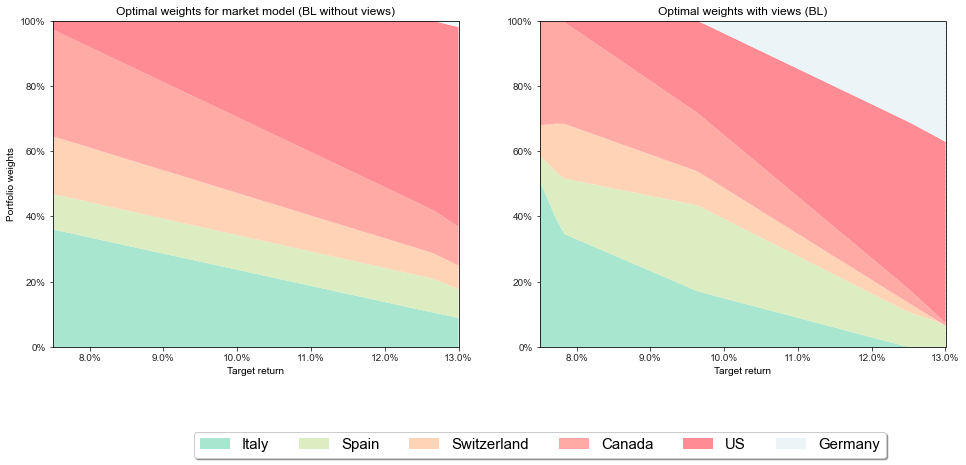

In [ ]:
# asset_names = ["Italy", "Spain", "Switzerland", "Canada", "US", "Germany"]
# fig, ax = plt.subplots(1, 2, figsize=(16, 6))


# ax[0].stackplot(target_returns, optimal_port_weights_1.T, labels=asset_names);
# ax[0].xaxis.set_major_formatter(ticker.PercentFormatter(xmax=1, decimals=1))
# ax[0].yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
# ax[0].set_xlabel("Target return")
# ax[0].set_ylabel("Portfolio weights")
# ax[0].set_title("Optimal weights for market model (BL without views)")
# #ax[0].legend(loc='center', bbox_to_anchor=(0.5, -0.3),
# #          fancybox=True, shadow=True, ncol=6);

# ax[1].stackplot(target_returns, optimal_port_weights_2.T, labels=asset_names);
# ax[1].xaxis.set_major_formatter(ticker.PercentFormatter(xmax=1, decimals=1))
# ax[1].yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
# ax[1].set_xlabel("Target return")
# #ax[1].set_ylabel("Portfolio weights")
# ax[1].set_title("Optimal weights with views (BL)");
# ax[1].legend(loc='center', bbox_to_anchor=(0.0, -0.3),
#           fancybox=True, shadow=True, ncol=6);

## Optimized Equity Portfolios

#### Overview

Portfolios:
1/N

INDMOM 

MVO (No Correlation Shrinkage, $\theta = 0\%$)

EPO: Out-of-Sample

EPO(w): In-Sample with $\theta = 5\%$
    w = 0% = MVO

    w = 10%

    w = 25%

    w = 50%

    w = 75%

    w = 90% 

    w = 99%
    
    w = 100% = Anchor

In [3524]:
print('theta = {}' .format(_theta))
print('gamma = {}' .format(_gamma))
print('w = {}' .format(_w))

theta = 0.05
gamma = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
w = [0, 0.1, 0.25, 0.5, 0.75, 0.8, 0.9, 0.99, 1]


In [217]:
temp = shrink_w(0,no_shr_risk1[0].loc['2020-12-01'],no_shr_risk1[1].loc['2020-12-01'])
temp_norm = np.linalg.norm(((1/1) * (np.linalg.inv(temp) @ s1.loc['2020-12-01'])))
temp_sum = (((1/1) * (np.linalg.inv(temp) @ s1.loc['2020-12-01']))/(temp_norm)).sum()
temp_test = (((1/1) * (np.linalg.inv(temp) @ s1.loc['2020-12-01']))/(temp_norm))/temp_sum

#### MVO (No correlation shrinkage)

In [3525]:
#MVO with No Correlation Shrinkage
#theta = 0, w = 0, gamma = 1

eq1_MVO_t0_w = _49_ER_daily.copy() * 0
eq2_MVO_t0_w = _49_ER_daily.copy() * 0
eq3_MVO_t0_w = _49_ER_daily.copy() * 0
eq4_MVO_t0_w = _49_ER_daily.copy() * 0
eq5_MVO_t0_w = _49_ER_daily.copy() * 0
eq6_MVO_t0_w = _49_ER_daily.copy() * 0
eq7_MVO_t0_w = _49_ER_daily.copy() * 0

no_shr_risk1 = shrink_cov(0, _49_ER_daily,h=1320)
no_shr_risk2 = shrink_cov(0, _49_ER_daily,h=80) 
no_shr_risk3 = shrink_cov(0, _49_ER_daily,h=120)
no_shr_risk4 = shrink_cov(0, _49_ER_daily,h=120)
no_shr_risk5 = shrink_cov(0, _49_ER_daily,h=120)
no_shr_risk6 = shrink_cov(0, _49_ER_daily,h=1320)
no_shr_risk7 = shrink_cov(0, _49_ER_daily,h=1320)

for [i,date] in enumerate(xs_t.index):
    #print(date)
    eq1_MVO_t0_w.loc[date] = EPOs(_w[0],_gamma[0], no_shr_risk1[0].loc[date],no_shr_risk1[1].loc[date],s1.loc[date]).values
    eq2_MVO_t0_w.loc[date] = EPOs(_w[0],_gamma[0], no_shr_risk2[0].loc[date],no_shr_risk2[1].loc[date],s2.loc[date]).values
    eq3_MVO_t0_w.loc[date] = EPOs(_w[0],_gamma[0], no_shr_risk3[0].loc[date],no_shr_risk3[1].loc[date],s3.loc[date]).values
    eq4_MVO_t0_w.loc[date] = EPOs(_w[0],_gamma[0], no_shr_risk4[0].loc[date],no_shr_risk4[1].loc[date],s4.loc[date]).values
    eq5_MVO_t0_w.loc[date] = EPOs(_w[0],_gamma[0], no_shr_risk5[0].loc[date],no_shr_risk5[1].loc[date],s5.loc[date]).values
    eq6_MVO_t0_w.loc[date] = EPOa(_w[0],anc_w6.loc[date], no_shr_risk6[0].loc[date],no_shr_risk6[1].loc[date],s6.loc[date]).values
    eq7_MVO_t0_w.loc[date] = EPOa(_w[0],anc_w7.loc[date], no_shr_risk7[0].loc[date],no_shr_risk7[1].loc[date],s7.loc[date]).values


eq1_MVO_t0_w = eq1_MVO_t0_w[eq1_MVO_t0_w.index.isin(xs_t.index)]
eq2_MVO_t0_w = eq2_MVO_t0_w[eq2_MVO_t0_w.index.isin(xs_t.index)]
eq3_MVO_t0_w = eq3_MVO_t0_w[eq3_MVO_t0_w.index.isin(xs_t.index)]
eq4_MVO_t0_w = eq4_MVO_t0_w[eq4_MVO_t0_w.index.isin(xs_t.index)]
eq5_MVO_t0_w = eq5_MVO_t0_w[eq5_MVO_t0_w.index.isin(xs_t.index)]
eq6_MVO_t0_w = eq6_MVO_t0_w[eq6_MVO_t0_w.index.isin(xs_t.index)]
eq7_MVO_t0_w = eq7_MVO_t0_w[eq7_MVO_t0_w.index.isin(xs_t.index)]

eq1_MVO_t0_w_daily = ((eq1_MVO_t0_w.resample('D').ffill()).reindex(_49_ER_daily.index)).fillna(method='ffill')
eq1_MVO_t0_w_daily = eq1_MVO_t0_w_daily[_pf_start_date:]

eq2_MVO_t0_w_daily = ((eq2_MVO_t0_w.resample('D').ffill()).reindex(_49_ER_daily.index)).fillna(method='ffill')
eq2_MVO_t0_w_daily = eq2_MVO_t0_w_daily[_pf_start_date:]

eq3_MVO_t0_w_daily = ((eq3_MVO_t0_w.resample('D').ffill()).reindex(_49_ER_daily.index)).fillna(method='ffill')
eq3_MVO_t0_w_daily = eq3_MVO_t0_w_daily[_pf_start_date:]

eq4_MVO_t0_w_daily = ((eq4_MVO_t0_w.resample('D').ffill()).reindex(_49_ER_daily.index)).fillna(method='ffill')
eq4_MVO_t0_w_daily = eq4_MVO_t0_w_daily[_pf_start_date:]

eq5_MVO_t0_w_daily = ((eq5_MVO_t0_w.resample('D').ffill()).reindex(_49_ER_daily.index)).fillna(method='ffill')
eq5_MVO_t0_w_daily = eq5_MVO_t0_w_daily[_pf_start_date:]

eq6_MVO_t0_w_daily = ((eq6_MVO_t0_w.resample('D').ffill()).reindex(_49_ER_daily.index)).fillna(method='ffill')
eq6_MVO_t0_w_daily = eq6_MVO_t0_w_daily[_pf_start_date:]

eq7_MVO_t0_w_daily = ((eq7_MVO_t0_w.resample('D').ffill()).reindex(_49_ER_daily.index)).fillna(method='ffill')
eq7_MVO_t0_w_daily = eq7_MVO_t0_w_daily[_pf_start_date:]

<AxesSubplot:xlabel='Date'>

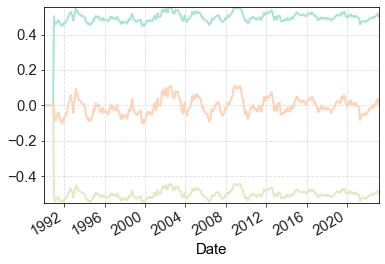

In [1261]:
# _plot_temp = eq7_MVO_t0_w
# _plot_temp[_plot_temp>0].sum(axis=1).plot()
# _plot_temp[_plot_temp<0].sum(axis=1).plot()
# _plot_temp.sum(axis=1).plot()

<AxesSubplot:xlabel='Date'>

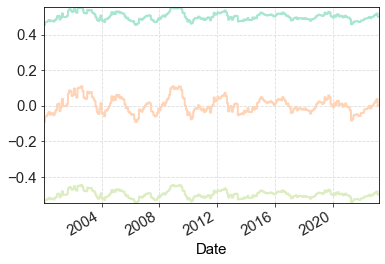

In [1282]:
# _plot_temp = eq6_MVO_t0_w_daily
# _plot_temp[_plot_temp>0].sum(axis=1).plot()
# _plot_temp[_plot_temp<0].sum(axis=1).plot()
# _plot_temp.sum(axis=1).plot()

In [3526]:
_MVO_no_corr_monthly = pd.DataFrame(index = eq1_MVO_t0_w.loc[_pf_start_date:].index, columns=['Eq1','Eq2','Eq3','Eq4','Eq5','Eq6','Eq7'])
_MVO_no_corr_monthly['Eq1'] =((eq1_MVO_t0_w.loc[_pf_start_date:].multiply(_49_ER_monthly.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_MVO_no_corr_monthly['Eq2'] =((eq2_MVO_t0_w.loc[_pf_start_date:].multiply(_49_ER_monthly.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_MVO_no_corr_monthly['Eq3'] =((eq3_MVO_t0_w.loc[_pf_start_date:].multiply(_49_ER_monthly.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_MVO_no_corr_monthly['Eq4'] =((eq4_MVO_t0_w.loc[_pf_start_date:].multiply(_49_ER_monthly.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_MVO_no_corr_monthly['Eq5'] =((eq5_MVO_t0_w.loc[_pf_start_date:].multiply(_49_ER_monthly.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_MVO_no_corr_monthly['Eq6'] =((eq6_MVO_t0_w.loc[_pf_start_date:].multiply(_49_ER_monthly.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_MVO_no_corr_monthly['Eq7'] =((eq7_MVO_t0_w.loc[_pf_start_date:].multiply(_49_ER_monthly.shift(-1).loc[_pf_start_date:]).sum(axis=1)))

In [1265]:
# _SR_MVO_no_Corr = pd.DataFrame(np.sqrt(12)*((_MVO_no_corr_monthly.mean(axis=0))/_MVO_no_corr_monthly.std(axis=0))).T
# _SR_MVO_no_Corr

,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
0,0.271363,0.343807,0.264458,0.454968,0.539061,0.271363,0.271363


In [3527]:
_MVO_no_corr_daily = pd.DataFrame(index = eq1_MVO_t0_w_daily.loc[_pf_start_date:].index, columns=['Eq1','Eq2','Eq3','Eq4','Eq5','Eq6','Eq7'])
_MVO_no_corr_daily['Eq1'] =((eq1_MVO_t0_w_daily.loc[_pf_start_date:].multiply(_49_ER_daily.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_MVO_no_corr_daily['Eq2'] =((eq2_MVO_t0_w_daily.loc[_pf_start_date:].multiply(_49_ER_daily.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_MVO_no_corr_daily['Eq3'] =((eq3_MVO_t0_w_daily.loc[_pf_start_date:].multiply(_49_ER_daily.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_MVO_no_corr_daily['Eq4'] =((eq4_MVO_t0_w_daily.loc[_pf_start_date:].multiply(_49_ER_daily.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_MVO_no_corr_daily['Eq5'] =((eq5_MVO_t0_w_daily.loc[_pf_start_date:].multiply(_49_ER_daily.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_MVO_no_corr_daily['Eq6'] =((eq6_MVO_t0_w_daily.loc[_pf_start_date:].multiply(_49_ER_daily.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_MVO_no_corr_daily['Eq7'] =((eq7_MVO_t0_w_daily.loc[_pf_start_date:].multiply(_49_ER_daily.shift(-1).loc[_pf_start_date:]).sum(axis=1)))

In [3528]:
_SR_MVO_no_Corr = pd.DataFrame(np.sqrt(261)*((_MVO_no_corr_daily.mean(axis=0))/_MVO_no_corr_daily.std(axis=0))).T
_SR_MVO_no_Corr 

,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
0,0.367174,0.346291,0.334058,0.557282,0.643815,0.367174,0.367174


#### 1/N & INDMOM

monthly

In [3529]:
_pf_1N_monthly = (1+(anc_w6.loc[_pf_start_date:].multiply(_49_ER_monthly.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
_pf_INDMOM_monthly = (1+(_w_INDMOM.loc[_pf_start_date:].multiply(_49_ER_monthly.shift(-1).loc[_pf_start_date:]).sum(axis=1)))
# _SR_EQW_and_INDMOM = pd.DataFrame([np.sqrt(12)*((_pf_1N_monthly.mean(axis=0)-1)/_pf_1N_monthly.std(axis=0)),np.sqrt(12)*((_pf_INDMOM_monthly.mean(axis=0)-1)/_pf_INDMOM_monthly.std(axis=0))]).T
# _SR_EQW_and_INDMOM.columns = ['1/N','INDMOM']
# _SR_EQW_and_INDMOM

daily

In [3530]:
_1N_w_daily = _49_ER_daily.copy() * 0 + 1/N_col
_1N_w_daily = _1N_w_daily[_pf_start_date:]
_1N_daily = (_1N_w_daily * _49_ER_daily.loc[_pf_start_date:].shift(-1)).sum(axis=1)
_1N_idx_daily = (1+_1N_daily).cumprod()

In [3531]:
_w_INDMOM_daily = _w_INDMOM.resample('D').ffill()
# reindex the resampled DataFrame with the daily date range
_w_INDMOM_daily = _w_INDMOM_daily.reindex(_49_ER_daily.index)
# fill any missing values with the constant of the current month
_w_INDMOM_daily = _w_INDMOM_daily.fillna(method='ffill')
_w_INDMOM_daily = _w_INDMOM_daily[_pf_start_date:]

_INDMOM_daily = (_w_INDMOM_daily * _49_ER_daily[_pf_start_date:].shift(-1)).sum(axis=1)
_INDMOM_idx_daily = (1+_INDMOM_daily).cumprod()

In [3532]:
_SR_EQW_and_INDMOM = pd.DataFrame([np.sqrt(261)*((_1N_daily.mean(axis=0))/_1N_daily.std(axis=0)),np.sqrt(261)*((_INDMOM_daily.mean(axis=0))/_INDMOM_daily.std(axis=0))]).T
_SR_EQW_and_INDMOM.columns = ['1/N','INDMOM']
_SR_EQW_and_INDMOM

,1/N,INDMOM
0,0.562201,0.357551


<AxesSubplot:xlabel='Date'>

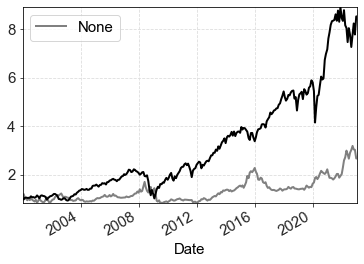

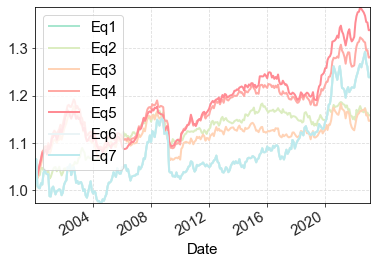

In [224]:
# _pf_INDMOM_monthly.cumprod().plot(legend = 'INDMOM', color = 'gray')
# _pf_1N_monthly.cumprod().plot(label = '1/N', color = 'black')
# (1+_MVO_no_corr_monthly).cumprod(axis=0).plot()

#### EPO(w): In-sample with Shrinkage of w

##### Equity 1 - Simple

In [226]:
# #MVO with 5% Correlation Shrinkage
# #theta = 0.05, w = iterative, gamma = 1


# #Equity 1
# #eq1_EPO_w = _49_ER_daily.copy() * 0
# #eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)
# #_colnames = ['w = ' + str(x) for x in _w]

# eq1_EPO_w = xs_t.copy() * 0
# eq1_EPO_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)


# for j in range(len(_w)):
#     #print('j = {}, w(j) = {}'.format(j, _w[j]))
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #print(date, j)
#         eq1_EPO_w.loc[date] = EPOs(_w[j],_gamma[0],risk1[0].loc[date],risk1[1].loc[date],s1.loc[date]).values
#         eq1_EPO_monthly.loc[date][j] = (eq1_EPO_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
#         #if (_w[j] == 0.1 and str(date.date()) > _pf_start_date):
#         #    print('date = {}, return = {}'.format(date, eq1_EPO_monthly.loc[date][j]))


# #eq1_EPO_w = eq1_EPO_w[eq1_EPO_w.index.isin(xs_t.loc[_pf_start_date:].index)]
# eq1_EPO_monthly = eq1_EPO_monthly[eq1_EPO_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]


In [227]:
# _SR1_inSamp = pd.DataFrame(np.sqrt(12)*((eq1_EPO_monthly.mean(axis=0))/eq1_EPO_monthly.std(axis=0))).T
# _SR1_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.269546,0.269204,0.278965,0.297125,0.314577,0.316346,0.319504,0.339663,0.348975


Daily

In [3533]:
#MVO with 5% Correlation Shrinkage
#theta = 0.05, w = iterative, gamma = 1


#Equity 1
#eq1_EPO_w = _49_ER_daily.copy() * 0
#eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)
#_colnames = ['w = ' + str(x) for x in _w]

eq1_EPO_w = xs_t.copy() * 0
eq1_EPO_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)
eq1_EPO_w_daily = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _colnames], names=['Date', 'w']))
eq1_EPO_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_colnames)

for j in range(len(_w)):
    for [i,date] in enumerate(xs_t.index[:-1]):
        eq1_EPO_w.loc[date] = EPOs(_w[j],_gamma[0],risk1[0].loc[date],risk1[1].loc[date],s1.loc[date]).values
        eq1_EPO_monthly.loc[date][j] = (eq1_EPO_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
        eq1_EPO_w_daily.loc[date, _colnames[j]] = EPOs(_w[j],_gamma[0],risk1[0].loc[date],risk1[1].loc[date],s1.loc[date]).values

#eq1_EPO_w = eq1_EPO_w[eq1_EPO_w.index.isin(xs_t.loc[_pf_start_date:].index)]
eq1_EPO_monthly = eq1_EPO_monthly[eq1_EPO_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

eq1_EPO_w_daily = eq1_EPO_w_daily[_pf_start_date:]
eq1_EPO_daily = eq1_EPO_daily[_pf_start_date:]

for j in range(len(_w)):
    eq1_EPO_w_daily.loc(axis=0)[:,_colnames[j]] = eq1_EPO_w_daily.loc(axis=0)[:,_colnames[j]].fillna(method='ffill')
    for [i, date] in enumerate((_49_ER_daily[_pf_start_date:]).index):
        eq1_EPO_daily.loc[date][j] = (eq1_EPO_w_daily.loc[date,_colnames[j]] * _49_ER_daily.shift(-1).loc[date]).sum()


#eq1_EPO_w_daily.iloc[6560:6600]
#eq1_EPO_daily = eq1_EPO_daily.replace(np.nan,0)

In [3534]:
_SR1_inSamp = pd.DataFrame(np.sqrt(261)*((eq1_EPO_daily.mean(axis=0))/eq1_EPO_daily.std(axis=0))).T
_SR1_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.365542,0.362693,0.367355,0.376116,0.384852,0.385085,0.385485,0.40058,0.407728


##### Equity 2 - Simple

In [3535]:
#MVO with 5% Correlation Shrinkage
#theta = 0.05, w = iterative, gamma = 1


#eq1_EPO_w = _49_ER_daily.copy() * 0
#eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)

_temp_w = xs_t.copy() * 0
_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)
_temp_w_daily = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _colnames], names=['Date', 'w']))
_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_colnames)

_temp_risk = risk2
_temp_s = s2.copy()

for j in range(len(_w)):
    #print('j = {}, w(j) = {}'.format(j, _w[j]))
    for [i,date] in enumerate(xs_t.index[:-1]):
        #print(date, j)
        _temp_w.loc[date] = EPOs(_w[j],_gamma[0],_temp_risk[0].loc[date],_temp_risk[1].loc[date],_temp_s.loc[date]).values
        _temp_monthly.loc[date][j] = (_temp_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
        _temp_w_daily.loc[date, _colnames[j]] = _temp_w.loc[date]
        #if (_w[j] == 0.1 and str(date.date()) > _pf_start_date):
        #    print('date = {}, return = {}'.format(date, eq1_EPO_monthly.loc[date][j]))


#eq2_EPO_w = _temp_w[_temp_w.index.isin(xs_t.loc[_pf_start_date:].index)]
eq2_EPO_monthly = _temp_monthly[_temp_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

_temp_w_daily = _temp_w_daily[_pf_start_date:]
_temp_daily = _temp_daily[_pf_start_date:]

for j in range(len(_w)):
    _temp_w_daily.loc(axis=0)[:,_colnames[j]] = _temp_w_daily.loc(axis=0)[:,_colnames[j]].fillna(method='ffill')
    for [i, date] in enumerate((_49_ER_daily[_pf_start_date:]).index):
        _temp_daily.loc[date][j] = (_temp_w_daily.loc[date,_colnames[j]] * _49_ER_daily.shift(-1).loc[date]).sum()


eq2_EPO_w_daily = _temp_w_daily.copy()
eq2_EPO_daily = _temp_daily.copy()

In [3536]:
_SR2_inSamp = pd.DataFrame(np.sqrt(261)*((eq2_EPO_daily.mean(axis=0))/eq2_EPO_daily.std(axis=0))).T
_SR2_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.533792,0.56194,0.529562,0.464529,0.394009,0.379522,0.344075,0.308353,0.307446


før

In [231]:
# _SR2_inSamp = pd.DataFrame(np.sqrt(12)*((eq2_EPO_monthly.mean(axis=0))/eq2_EPO_monthly.std(axis=0))).T
# _SR2_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.413263,0.433248,0.416032,0.375637,0.322052,0.310554,0.280981,0.254041,0.256316


##### Equity 3 - Simple

In [232]:
# #MVO with 5% Correlation Shrinkage
# #theta = 0.05, w = iterative, gamma = 1


# #eq1_EPO_w = _49_ER_daily.copy() * 0
# #eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)

# _temp_w = xs_t.copy() * 0
# _temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)

# _temp_risk = risk3
# _temp_s = s3.copy()

# for j in range(len(_w)):
#     #print('j = {}, w(j) = {}'.format(j, _w[j]))
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #print(date, j)
#         _temp_w.loc[date] = EPOs(_w[j],_gamma[0],_temp_risk[0].loc[date],_temp_risk[1].loc[date],_temp_s.loc[date]).values
#         _temp_monthly.loc[date][j] = (_temp_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
#         #if (_w[j] == 0.1 and str(date.date()) > _pf_start_date):
#         #    print('date = {}, return = {}'.format(date, eq1_EPO_monthly.loc[date][j]))


# #eq2_EPO_w = _temp_w[_temp_w.index.isin(xs_t.loc[_pf_start_date:].index)]
# eq3_EPO_monthly = _temp_monthly[_temp_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

In [233]:
# _SR3_inSamp = pd.DataFrame(np.sqrt(12)*((eq3_EPO_monthly.mean(axis=0))/eq3_EPO_monthly.std(axis=0))).T
# _SR3_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.393673,0.388326,0.366119,0.340098,0.30814,0.300557,0.279384,0.267649,0.274814


daily

In [3537]:
#MVO with 5% Correlation Shrinkage
#theta = 0.05, w = iterative, gamma = 1


#eq1_EPO_w = _49_ER_daily.copy() * 0
#eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)

_temp_w = xs_t.copy() * 0
_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)
_temp_w_daily = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _colnames], names=['Date', 'w']))
_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_colnames)

_temp_risk = risk3
_temp_s = s3.copy()

for j in range(len(_w)):
    #print('j = {}, w(j) = {}'.format(j, _w[j]))
    for [i,date] in enumerate(xs_t.index[:-1]):
        #print(date, j)
        _temp_w.loc[date] = EPOs(_w[j],_gamma[0],_temp_risk[0].loc[date],_temp_risk[1].loc[date],_temp_s.loc[date]).values
        _temp_monthly.loc[date][j] = (_temp_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
        _temp_w_daily.loc[date, _colnames[j]] = _temp_w.loc[date]
        #if (_w[j] == 0.1 and str(date.date()) > _pf_start_date):
        #    print('date = {}, return = {}'.format(date, eq1_EPO_monthly.loc[date][j]))


eq3_EPO_monthly = _temp_monthly[_temp_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

_temp_w_daily = _temp_w_daily[_pf_start_date:]
_temp_daily = _temp_daily[_pf_start_date:]

for j in range(len(_w)):
    _temp_w_daily.loc(axis=0)[:,_colnames[j]] = _temp_w_daily.loc(axis=0)[:,_colnames[j]].fillna(method='ffill')
    for [i, date] in enumerate((_49_ER_daily[_pf_start_date:]).index):
        _temp_daily.loc[date][j] = (_temp_w_daily.loc[date,_colnames[j]] * _49_ER_daily.shift(-1).loc[date]).sum()


eq3_EPO_w_daily = _temp_w_daily.copy()
eq3_EPO_daily = _temp_daily.copy()

In [3538]:
_SR3_inSamp = pd.DataFrame(np.sqrt(261)*((eq3_EPO_daily.mean(axis=0))/eq3_EPO_daily.std(axis=0))).T
_SR3_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.509632,0.511072,0.478663,0.430682,0.381347,0.370626,0.343227,0.322943,0.327083


##### Equity 4 - Simple

In [235]:
# #MVO with 5% Correlation Shrinkage
# #theta = 0.05, w = iterative, gamma = 1


# #eq1_EPO_w = _49_ER_daily.copy() * 0
# #eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)

# _temp_w = xs_t.copy() * 0
# _temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)

# _temp_risk = risk4
# _temp_s = s4.copy()

# for j in range(len(_w)):
#     #print('j = {}, w(j) = {}'.format(j, _w[j]))
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #print(date, j)
#         _temp_w.loc[date] = EPOs(_w[j],_gamma[0],_temp_risk[0].loc[date],_temp_risk[1].loc[date],_temp_s.loc[date]).values
#         _temp_monthly.loc[date][j] = (_temp_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
#         #if (_w[j] == 0.1 and str(date.date()) > _pf_start_date):
#         #    print('date = {}, return = {}'.format(date, eq1_EPO_monthly.loc[date][j]))


# #eq2_EPO_w = _temp_w[_temp_w.index.isin(xs_t.loc[_pf_start_date:].index)]
# eq4_EPO_monthly = _temp_monthly[_temp_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encoun

In [236]:
# _SR4_inSamp = pd.DataFrame(np.sqrt(12)*((eq4_EPO_monthly.mean(axis=0))/eq4_EPO_monthly.std(axis=0))).T
# _SR4_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.557039,0.552019,0.533507,0.49258,0.427897,0.410544,0.371755,0.329391,0.322969


daily

In [3539]:
#MVO with 5% Correlation Shrinkage
#theta = 0.05, w = iterative, gamma = 1


#eq1_EPO_w = _49_ER_daily.copy() * 0
#eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)

_temp_w = xs_t.copy() * 0
_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)
_temp_w_daily = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _colnames], names=['Date', 'w']))
_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_colnames)

_temp_risk = risk4
_temp_s = s4.copy()

for j in range(len(_w)):
    #print('j = {}, w(j) = {}'.format(j, _w[j]))
    for [i,date] in enumerate(xs_t.index[:-1]):
        #print(date, j)
        _temp_w.loc[date] = EPOs(_w[j],_gamma[0],_temp_risk[0].loc[date],_temp_risk[1].loc[date],_temp_s.loc[date]).values
        _temp_monthly.loc[date][j] = (_temp_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
        _temp_w_daily.loc[date, _colnames[j]] = _temp_w.loc[date]
        #if (_w[j] == 0.1 and str(date.date()) > _pf_start_date):
        #    print('date = {}, return = {}'.format(date, eq1_EPO_monthly.loc[date][j]))


eq4_EPO_monthly = _temp_monthly[_temp_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

_temp_w_daily = _temp_w_daily[_pf_start_date:]
_temp_daily = _temp_daily[_pf_start_date:]

for j in range(len(_w)):
    _temp_w_daily.loc(axis=0)[:,_colnames[j]] = _temp_w_daily.loc(axis=0)[:,_colnames[j]].fillna(method='ffill')
    for [i, date] in enumerate((_49_ER_daily[_pf_start_date:]).index):
        _temp_daily.loc[date][j] = (_temp_w_daily.loc[date,_colnames[j]] * _49_ER_daily.shift(-1).loc[date]).sum()


eq4_EPO_w_daily = _temp_w_daily.copy()
eq4_EPO_daily = _temp_daily.copy()

In [3540]:
_SR4_inSamp = pd.DataFrame(np.sqrt(261)*((eq4_EPO_daily.mean(axis=0))/eq4_EPO_daily.std(axis=0))).T
_SR4_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.699856,0.691206,0.651921,0.577808,0.491694,0.471548,0.428708,0.386065,0.37969


##### Equity 5 - Simple

In [238]:
# #MVO with 5% Correlation Shrinkage
# #theta = 0.05, w = iterative, gamma = 1


# #eq1_EPO_w = _49_ER_daily.copy() * 0
# #eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)

# _temp_w = xs_t.copy() * 0
# _temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)

# _temp_risk = risk5
# _temp_s = s5.copy()

# for j in range(len(_w)):
#     #print('j = {}, w(j) = {}'.format(j, _w[j]))
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #print(date, j)
#         _temp_w.loc[date] = EPOs(_w[j],_gamma[0],_temp_risk[0].loc[date],_temp_risk[1].loc[date],_temp_s.loc[date]).values
#         _temp_monthly.loc[date][j] = (_temp_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
#         #if (_w[j] == 0.1 and str(date.date()) > _pf_start_date):
#         #    print('date = {}, return = {}'.format(date, eq1_EPO_monthly.loc[date][j]))


# #eq2_EPO_w = _temp_w[_temp_w.index.isin(xs_t.loc[_pf_start_date:].index)]
# eq5_EPO_monthly = _temp_monthly[_temp_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encoun

In [239]:
# _SR5_inSamp = pd.DataFrame(np.sqrt(12)*((eq5_EPO_monthly.mean(axis=0))/eq5_EPO_monthly.std(axis=0))).T
# _SR5_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.626712,0.631332,0.622217,0.608415,0.547273,0.524272,0.464077,0.353471,0.316489


daily

In [3541]:
#MVO with 5% Correlation Shrinkage
#theta = 0.05, w = iterative, gamma = 1


#eq1_EPO_w = _49_ER_daily.copy() * 0
#eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)

_temp_w = xs_t.copy() * 0
_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)
_temp_w_daily = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _colnames], names=['Date', 'w']))
_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_colnames)

_temp_risk = risk5
_temp_s = s5.copy()

for j in range(len(_w)):
    #print('j = {}, w(j) = {}'.format(j, _w[j]))
    for [i,date] in enumerate(xs_t.index[:-1]):
        #print(date, j)
        _temp_w.loc[date] = EPOs(_w[j],_gamma[0],_temp_risk[0].loc[date],_temp_risk[1].loc[date],_temp_s.loc[date]).values
        _temp_monthly.loc[date][j] = (_temp_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
        _temp_w_daily.loc[date, _colnames[j]] = _temp_w.loc[date]
        #if (_w[j] == 0.1 and str(date.date()) > _pf_start_date):
        #    print('date = {}, return = {}'.format(date, eq1_EPO_monthly.loc[date][j]))


eq5_EPO_monthly = _temp_monthly[_temp_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

_temp_w_daily = _temp_w_daily[_pf_start_date:]
_temp_daily = _temp_daily[_pf_start_date:]

for j in range(len(_w)):
    _temp_w_daily.loc(axis=0)[:,_colnames[j]] = _temp_w_daily.loc(axis=0)[:,_colnames[j]].fillna(method='ffill')
    for [i, date] in enumerate((_49_ER_daily[_pf_start_date:]).index):
        _temp_daily.loc[date][j] = (_temp_w_daily.loc[date,_colnames[j]] * _49_ER_daily.shift(-1).loc[date]).sum()


eq5_EPO_w_daily = _temp_w_daily.copy()
eq5_EPO_daily = _temp_daily.copy()

In [3542]:
_SR5_inSamp = pd.DataFrame(np.sqrt(261)*((eq5_EPO_daily.mean(axis=0))/eq5_EPO_daily.std(axis=0))).T
_SR5_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.762832,0.75229,0.720569,0.668341,0.579188,0.553288,0.491562,0.391313,0.357551


##### Equity 6 - Anchored

In [241]:
# #MVO with 5% Correlation Shrinkage
# #theta = 0.05, w = iterative, gamma = 1


# #eq1_EPO_w = _49_ER_daily.copy() * 0
# #eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)

# _temp_w = xs_t.copy() * 0
# _temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)

# _temp_risk = risk6
# _temp_s = s6.copy()
# _temp_anc = anc_w6.copy()

# for j in range(len(_w)):
#     #print('j = {}, w(j) = {}'.format(j, _w[j]))
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #print(date, j)
#         _temp_w.loc[date] = EPOa(_w[j],_temp_anc.loc[date],_temp_risk[0].loc[date],_temp_risk[1].loc[date],_temp_s.loc[date]).values
#         _temp_monthly.loc[date][j] = (_temp_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
#         #if (_w[j] == 0.1 and str(date.date()) > _pf_start_date):
#         #    print('date = {}, return = {}'.format(date, eq1_EPO_monthly.loc[date][j]))


# eq6_EPO_monthly = _temp_monthly[_temp_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

In [242]:
# _SR6_inSamp = pd.DataFrame(np.sqrt(12)*((eq6_EPO_monthly.mean(axis=0))/eq6_EPO_monthly.std(axis=0))).T
# _SR6_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.269546,0.271769,0.286713,0.327194,0.463344,0.535989,0.688539,0.600258,0.59347


Daily

In [3543]:
#MVO with 5% Correlation Shrinkage
#theta = 0.05, w = iterative, gamma = 1


#eq1_EPO_w = _49_ER_daily.copy() * 0
#eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)

_temp_w = xs_t.copy() * 0
_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)
_temp_w_daily = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _colnames], names=['Date', 'w']))
_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_colnames)

_temp_risk = risk6
_temp_s = s6.copy()
_temp_anc = anc_w6.copy()

for j in range(len(_w)):
    #print('j = {}, w(j) = {}'.format(j, _w[j]))
    for [i,date] in enumerate(xs_t.index[:-1]):
        #print(date, j)
        _temp_w.loc[date] = EPOa(_w[j],_temp_anc.loc[date],_temp_risk[0].loc[date],_temp_risk[1].loc[date],_temp_s.loc[date]).values
        _temp_monthly.loc[date][j] = (_temp_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
        _temp_w_daily.loc[date, _colnames[j]] = _temp_w.loc[date].copy()
        #if (_w[j] == 0.1 and str(date.date()) > _pf_start_date):
        #    print('date = {}, return = {}'.format(date, eq1_EPO_monthly.loc[date][j]))


eq6_EPO_monthly = _temp_monthly[_temp_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

_temp_w_daily = _temp_w_daily[_pf_start_date:]
_temp_daily = _temp_daily[_pf_start_date:]

for j in range(len(_w)):
    _temp_w_daily.loc(axis=0)[:,_colnames[j]] = _temp_w_daily.loc(axis=0)[:,_colnames[j]].fillna(method='ffill')
    for [i, date] in enumerate((_49_ER_daily[_pf_start_date:]).index):
        _temp_daily.loc[date][j] = (_temp_w_daily.loc[date,_colnames[j]] * _49_ER_daily.shift(-1).loc[date]).sum()


eq6_EPO_w_daily = _temp_w_daily.copy()
eq6_EPO_daily = _temp_daily.copy()

In [3544]:
_SR6_inSamp = pd.DataFrame(np.sqrt(261)*((eq6_EPO_daily.mean(axis=0))/eq6_EPO_daily.std(axis=0))).T
_SR6_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.365542,0.365631,0.375835,0.406556,0.514039,0.564029,0.643646,0.568013,0.562201


##### Equity 7 - Anchored

In [244]:
# #MVO with 5% Correlation Shrinkage
# #theta = 0.05, w = iterative, gamma = 1


# #eq1_EPO_w = _49_ER_daily.copy() * 0
# #eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)

# _temp_w = xs_t.copy() * 0
# _temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)

# _temp_risk = risk7
# _temp_s = s7.copy()
# _temp_anc = anc_w7.copy()

# for j in range(len(_w)):
#     #print('j = {}, w(j) = {}'.format(j, _w[j]))
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #print(date, j)
#         _temp_w.loc[date] = EPOa(_w[j],_temp_anc.loc[date],_temp_risk[0].loc[date],_temp_risk[1].loc[date],_temp_s.loc[date]).values
#         _temp_monthly.loc[date][j] = (_temp_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
#         #if (_w[j] == 0.1 and str(date.date()) > _pf_start_date):
#         #    print('date = {}, return = {}'.format(date, eq1_EPO_monthly.loc[date][j]))


# eq7_EPO_monthly = _temp_monthly[_temp_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

In [245]:
# _SR7_inSamp = pd.DataFrame(np.sqrt(12)*((eq7_EPO_monthly.mean(axis=0))/eq7_EPO_monthly.std(axis=0))).T
# _SR7_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.269546,0.272241,0.287032,0.325081,0.438974,0.491998,0.586139,0.566154,0.568245


Daily

In [3545]:
#MVO with 5% Correlation Shrinkage
#theta = 0.05, w = iterative, gamma = 1


#eq1_EPO_w = _49_ER_daily.copy() * 0
#eq1_EPO_monthly = pd.DataFrame(index = eq1_EPO_w.index.copy(), columns=_w)

_temp_w = xs_t.copy() * 0
_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_colnames)
_temp_w_daily = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _colnames], names=['Date', 'w']))
_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_colnames)

_temp_risk = risk7
_temp_s = s7.copy()
_temp_anc = anc_w7.copy()

for j in range(len(_w)):
    #print('j = {}, w(j) = {}'.format(j, _w[j]))
    for [i,date] in enumerate(xs_t.index[:-1]):
        #print(date, j)
        _temp_w.loc[date] = EPOa(_w[j],_temp_anc.loc[date],_temp_risk[0].loc[date],_temp_risk[1].loc[date],_temp_s.loc[date]).values
        _temp_monthly.loc[date][j] = (_temp_w.loc[date] * _49_ER_monthly.shift(-1).loc[date]).sum()#.sum(axis=1)
        _temp_w_daily.loc[date, _colnames[j]] = _temp_w.loc[date].copy()
        #if (_w[j] == 0.1 and str(date.date()) > _pf_start_date):
        #    print('date = {}, return = {}'.format(date, eq1_EPO_monthly.loc[date][j]))


eq7_EPO_monthly = _temp_monthly[_temp_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

_temp_w_daily = _temp_w_daily[_pf_start_date:]
_temp_daily = _temp_daily[_pf_start_date:]

for j in range(len(_w)):
    _temp_w_daily.loc(axis=0)[:,_colnames[j]] = _temp_w_daily.loc(axis=0)[:,_colnames[j]].fillna(method='ffill')
    for [i, date] in enumerate((_49_ER_daily[_pf_start_date:]).index):
        _temp_daily.loc[date][j] = (_temp_w_daily.loc[date,_colnames[j]] * _49_ER_daily.shift(-1).loc[date]).sum()


eq7_EPO_w_daily = _temp_w_daily.copy()
eq7_EPO_daily = _temp_daily.copy()

In [3546]:
_SR7_inSamp = pd.DataFrame(np.sqrt(261)*((eq7_EPO_daily.mean(axis=0))/eq7_EPO_daily.std(axis=0))).T
_SR7_inSamp

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
0,0.365542,0.366548,0.377321,0.4073,0.497183,0.532532,0.569371,0.536795,0.539134


#### EPO: Out-Of-Sample

Fra EPO:

Notes: We empirically chose w out-of-sample as follows: 

For each time period, we estimated what choice of w 

(within a finite grid of possible values) 

would have produced the highest
EPO portfolio Sharpe ratio in the time period up until that
date. 

Then, we used this estimate in the next time period.

In [ ]:
xs_t.index.isin(_49_ER_daily.index).all()

True

##### Equity 1 OOS

In [1891]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Simple (Eq 1 - 5)
# #_OOS_temp_w = xs_t.copy() * 0
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=['OOS W', 'Monthly Return'])
# _temp_SR = pd.DataFrame([_w_grid.copy(),np.zeros(len(_w_grid))], index = ['Weights', 'Current Sharpe'], columns=_OOS_colnames)
# _OOS_temp_w = []

# _temp_risk = risk1
# _temp_s = s1.copy()

# for date in xs_t.index[:-1]:
# #for [i, date] in enumerate(xs_t[390:-1].index):
#     for j in range(len(_w_grid)):
#         _OOS_temp_w = EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = (_OOS_temp_w * _49_ER_monthly.shift(-1).loc[date]).sum()
#         #previous date
#         _temp_SR.iloc[1,j] = _OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].mean(axis=0)/_OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].std(axis=0)
#         _OOS_opt_monthly.loc[date][0] = _temp_SR.iloc[0,(_temp_SR.iloc[1,:]).argmax()]
#         _OOS_opt_monthly.loc[date][1] = _OOS_temp_monthly.iloc[_OOS_temp_monthly.index.get_loc(date),(_temp_SR.iloc[1,:]).argmax()]   
#     #print('getloc-1 = {}, date = {}'.format(_OOS_temp_monthly.index.get_loc(date)-1, _OOS_temp_monthly.iloc[_OOS_temp_monthly.index.get_loc(date)-1].name))
#     #print('date = {}, i = {}'.format(date, i))     

# eq1_OOS_monthly = _OOS_opt_monthly.copy()
# eq1_OOS_monthly = eq1_OOS_monthly[eq1_OOS_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

In [ ]:
# Oprindelig
# np.sqrt(12)*eq1_OOS_monthly.iloc[:,1].mean()/eq1_OOS_monthly.iloc[:,1].std()

0.3277582714324541

In [2165]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Simple (Eq 1 - 5)

# _temp_risk = risk1
# _temp_s = s1.copy()

# _OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
# _pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
# _OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])

# for j in range(len(_w_grid)):
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #_OOS_temp_w = EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
#     _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
#     _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

# #Choosing rolling max sharpe as OOS_W consequently calculating returns
# _pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
# _pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)]
# _OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
# _OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

# _OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
# _OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
#                                 , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]


# eq1_OOS_monthly = _OOS_opt_monthly.copy()
# eq1_OOS_daily = _OOS_opt_daily.copy()

# #_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']

In [3554]:
#{v: k for k, v in val_to_pos.items()}
#_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})

#OUT OF SAMPLE - OOS, FIGURE 2

_temp_risk = risk1
_temp_s = s1.copy()

_OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
_OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
_OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
_pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
_OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
_OOS_opt_w_monthly = pd.DataFrame(xs_t[_pf_start_date:].copy()*0,index = xs_t[_pf_start_date:].index)
_OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])
_OOS_opt_w_daily = pd.DataFrame(_49_ER_daily.copy()*0,index = _49_ER_daily[_pf_start_date:].index)

for j in range(len(_w_grid)):
    for [i,date] in enumerate(xs_t.index[:-1]):
        _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
        _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
    _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
    _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

#Choosing rolling max sharpe as OOS_W consequently calculating returns
_pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
_pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)].fillna(method='ffill')
_OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
_OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

_OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
_OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
                                , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]

_OOS_opt_w_daily = _OOS_temp_w.loc(axis=0)[_pf_start_date:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]
_OOS_opt_w_monthly = (_OOS_temp_w.loc(axis=0)[:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]).loc[xs_t[_pf_start_date:].index]

eq1_OOS_monthly = _OOS_opt_monthly.copy()
eq1_OOS_w_monthly = _OOS_opt_w_monthly.copy()
eq1_OOS_daily = _OOS_opt_daily.copy()
eq1_OOS_w_daily = _OOS_opt_w_daily.copy()

#_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

Sharpe Daily: 0.3768368112078669 
 Sharpe Monthly: 0.3040788677051245


In [3555]:
_temp_fix1 = eq1_OOS_w_daily.copy()
_temp_fix2 = eq1_OOS_daily.copy()

_temp_tester_OOS_ = _temp_fix1.copy()
_temp_tester_OOS_['w_pos'] = (_temp_fix1.index.get_level_values(1).map(val_to_pos).astype(int)).values
_temp_tester_OOS_ = _temp_tester_OOS_.set_index('w_pos', append=True)

_temp_OOS_ = _temp_fix2
_temp_OOS_.iloc[:,0] = [np.where(_w_grid == value)[0][0] for value in _temp_fix2.iloc[:,0]]
_temp_OOS_ = _temp_OOS_.drop([_temp_OOS_.columns[1]], axis = 1)

_test_df_merged = _temp_OOS_.merge(_temp_tester_OOS_, left_index=True, right_index=True, how='inner')
_test_df_merged = _test_df_merged[_test_df_merged['OOS W'] == _test_df_merged.index.get_level_values(2)]
eq1_OOS_w_daily_merged = _test_df_merged.drop(['OOS W'],axis=1)

Monthly Index: 1.352080180108903 
 Daily Index: 1.4135166794025027


<AxesSubplot:xlabel='Date'>

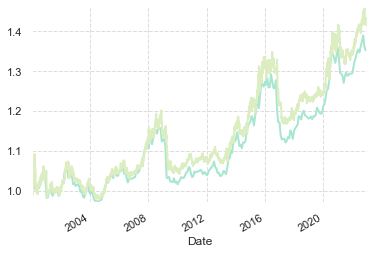

In [3556]:
print('Monthly Index: {} \n Daily Index: {}'.format(((1+eq1_OOS_monthly.iloc[:,1]).cumprod())[-2], (1+eq1_OOS_daily.iloc[:,1]).cumprod()[-2]))
(1+eq1_OOS_monthly.iloc[:,1]).cumprod().plot()
(1+eq1_OOS_daily.iloc[:,1]).cumprod().plot()

##### Equity 2 OOS

In [250]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Simple (Eq 1 - 5)
# #_OOS_temp_w = xs_t.copy() * 0
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=['OOS W', 'Monthly Return'])
# _temp_SR = pd.DataFrame([_w_grid.copy(),np.zeros(len(_w_grid))], index = ['Weights', 'Current Sharpe'], columns=_OOS_colnames)
# _OOS_temp_w = []

# _temp_risk = risk2
# _temp_s = s2.copy()

# for date in xs_t.index[:-1]:
#     for j in range(len(_w_grid)):
#         _OOS_temp_w = EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = (_OOS_temp_w * _49_ER_monthly.shift(-1).loc[date]).sum()
#         #previous date
#         _temp_SR.iloc[1,j] = _OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].mean(axis=0)/_OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].std(axis=0)
#         _OOS_opt_monthly.loc[date][0] = _temp_SR.iloc[0,(_temp_SR.iloc[1,:]).argmax()]
#         _OOS_opt_monthly.loc[date][1] = _OOS_temp_monthly.iloc[_OOS_temp_monthly.index.get_loc(date),(_temp_SR.iloc[1,:]).argmax()]        

# eq2_OOS_monthly = _OOS_opt_monthly.copy()
# eq2_OOS_monthly = eq2_OOS_monthly[eq2_OOS_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in double_scalars


In [ ]:
# np.sqrt(12)*eq2_OOS_monthly.iloc[:,1].mean()/eq2_OOS_monthly.iloc[:,1].std()

0.20610353719262037

In [2175]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Simple (Eq 1 - 5)

# _temp_risk = risk2
# _temp_s = s2.copy()

# _OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
# _pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
# _OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])

# for j in range(len(_w_grid)):
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #_OOS_temp_w = EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
#     _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
#     _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

# #Choosing rolling max sharpe as OOS_W consequently calculating returns
# _pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
# _pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)]
# _OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
# _OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

# _OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
# _OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
#                                 , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]


# eq2_OOS_monthly = _OOS_opt_monthly.copy()
# eq2_OOS_daily = _OOS_opt_daily.copy()

# #_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
# print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

In [3557]:
#{v: k for k, v in val_to_pos.items()}
#_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})

#OUT OF SAMPLE - OOS, FIGURE 2

_temp_risk = risk2
_temp_s = s2.copy()

_OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
_OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
_OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
_pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
_OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
_OOS_opt_w_monthly = pd.DataFrame(xs_t[_pf_start_date:].copy()*0,index = xs_t[_pf_start_date:].index)
_OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])
_OOS_opt_w_daily = pd.DataFrame(_49_ER_daily.copy()*0,index = _49_ER_daily[_pf_start_date:].index)

for j in range(len(_w_grid)):
    for [i,date] in enumerate(xs_t.index[:-1]):
        _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
        _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
    _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
    _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

#Choosing rolling max sharpe as OOS_W consequently calculating returns
_pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
_pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)].fillna(method='ffill')
_OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
_OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

_OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
_OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
                                , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]

_OOS_opt_w_daily = _OOS_temp_w.loc(axis=0)[_pf_start_date:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]
_OOS_opt_w_monthly = (_OOS_temp_w.loc(axis=0)[:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]).loc[xs_t[_pf_start_date:].index]

eq2_OOS_monthly = _OOS_opt_monthly.copy()
eq2_OOS_w_monthly = _OOS_opt_w_monthly.copy()
eq2_OOS_daily = _OOS_opt_daily.copy()
eq2_OOS_w_daily = _OOS_opt_w_daily.copy()

#_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

Sharpe Daily: 0.5493147352216908 
 Sharpe Monthly: 0.44542229800478245


In [3558]:
_temp_fix1 = eq2_OOS_w_daily.copy()
_temp_fix2 = eq2_OOS_daily.copy()

_temp_tester_OOS_ = _temp_fix1.copy()
_temp_tester_OOS_['w_pos'] = (_temp_fix1.index.get_level_values(1).map(val_to_pos).astype(int)).values
_temp_tester_OOS_ = _temp_tester_OOS_.set_index('w_pos', append=True)

_temp_OOS_ = _temp_fix2
_temp_OOS_.iloc[:,0] = [np.where(_w_grid == value)[0][0] for value in _temp_fix2.iloc[:,0]]
_temp_OOS_ = _temp_OOS_.drop([_temp_OOS_.columns[1]], axis = 1)

_test_df_merged = _temp_OOS_.merge(_temp_tester_OOS_, left_index=True, right_index=True, how='inner')
_test_df_merged = _test_df_merged[_test_df_merged['OOS W'] == _test_df_merged.index.get_level_values(2)]
eq2_OOS_w_daily_merged = _test_df_merged.drop(['OOS W'],axis=1)

##### Equity 3 OOS

In [251]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Simple (Eq 1 - 5)
# #_OOS_temp_w = xs_t.copy() * 0
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=['OOS W', 'Monthly Return'])
# _temp_SR = pd.DataFrame([_w_grid.copy(),np.zeros(len(_w_grid))], index = ['Weights', 'Current Sharpe'], columns=_OOS_colnames)
# _OOS_temp_w = []

# _temp_risk = risk3
# _temp_s = s3.copy()

# for date in xs_t.index[:-1]:
#     for j in range(len(_w_grid)):
#         _OOS_temp_w = EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = (_OOS_temp_w * _49_ER_monthly.shift(-1).loc[date]).sum()
#         #previous date
#         _temp_SR.iloc[1,j] = _OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].mean(axis=0)/_OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].std(axis=0)
#         _OOS_opt_monthly.loc[date][0] = _temp_SR.iloc[0,(_temp_SR.iloc[1,:]).argmax()]
#         _OOS_opt_monthly.loc[date][1] = _OOS_temp_monthly.iloc[_OOS_temp_monthly.index.get_loc(date),(_temp_SR.iloc[1,:]).argmax()]        

# eq3_OOS_monthly = _OOS_opt_monthly.copy()
# eq3_OOS_monthly = eq3_OOS_monthly[eq3_OOS_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in double_scalars


In [ ]:
# np.sqrt(12)*eq3_OOS_monthly.iloc[:,1].mean()/eq3_OOS_monthly.iloc[:,1].std()

0.3895873806249735

In [2179]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Simple (Eq 1 - 5)

# _temp_risk = risk3
# _temp_s = s3.copy()

# _OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
# _pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
# _OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])

# for j in range(len(_w_grid)):
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #_OOS_temp_w = EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
#     _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
#     _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

# #Choosing rolling max sharpe as OOS_W consequently calculating returns
# _pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
# _pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)]
# _OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
# _OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

# _OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
# _OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
#                                 , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]


# eq3_OOS_monthly = _OOS_opt_monthly.copy()
# eq3_OOS_daily = _OOS_opt_daily.copy()

# #_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
# print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

Sharpe Daily: 0.4436248182070454 
 Sharpe Monthly: 0.37799625252316477


In [3559]:
#{v: k for k, v in val_to_pos.items()}
#_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})

#OUT OF SAMPLE - OOS, FIGURE 2

_temp_risk = risk3
_temp_s = s3.copy()

_OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
_OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
_OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
_pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
_OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
_OOS_opt_w_monthly = pd.DataFrame(xs_t[_pf_start_date:].copy()*0,index = xs_t[_pf_start_date:].index)
_OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])
_OOS_opt_w_daily = pd.DataFrame(_49_ER_daily.copy()*0,index = _49_ER_daily[_pf_start_date:].index)

for j in range(len(_w_grid)):
    for [i,date] in enumerate(xs_t.index[:-1]):
        _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
        _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
    _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
    _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

#Choosing rolling max sharpe as OOS_W consequently calculating returns
_pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
_pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)].fillna(method='ffill')
_OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
_OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

_OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
_OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
                                , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]

_OOS_opt_w_daily = _OOS_temp_w.loc(axis=0)[_pf_start_date:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]
_OOS_opt_w_monthly = (_OOS_temp_w.loc(axis=0)[:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]).loc[xs_t[_pf_start_date:].index]

eq3_OOS_monthly = _OOS_opt_monthly.copy()
eq3_OOS_w_monthly = _OOS_opt_w_monthly.copy()
eq3_OOS_daily = _OOS_opt_daily.copy()
eq3_OOS_w_daily = _OOS_opt_w_daily.copy()

#_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

Sharpe Daily: 0.4991186861614279 
 Sharpe Monthly: 0.4183685615648544


In [3560]:
_temp_fix1 = eq3_OOS_w_daily.copy()
_temp_fix2 = eq3_OOS_daily.copy()

_temp_tester_OOS_ = _temp_fix1.copy()
_temp_tester_OOS_['w_pos'] = (_temp_fix1.index.get_level_values(1).map(val_to_pos).astype(int)).values
_temp_tester_OOS_ = _temp_tester_OOS_.set_index('w_pos', append=True)

_temp_OOS_ = _temp_fix2
_temp_OOS_.iloc[:,0] = [np.where(_w_grid == value)[0][0] for value in _temp_fix2.iloc[:,0]]
_temp_OOS_ = _temp_OOS_.drop([_temp_OOS_.columns[1]], axis = 1)

_test_df_merged = _temp_OOS_.merge(_temp_tester_OOS_, left_index=True, right_index=True, how='inner')
_test_df_merged = _test_df_merged[_test_df_merged['OOS W'] == _test_df_merged.index.get_level_values(2)]
eq3_OOS_w_daily_merged = _test_df_merged.drop(['OOS W'],axis=1)

##### Equity 4 OOS

In [252]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Simple (Eq 1 - 5)
# #_OOS_temp_w = xs_t.copy() * 0
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=['OOS W', 'Monthly Return'])
# _temp_SR = pd.DataFrame([_w_grid.copy(),np.zeros(len(_w_grid))], index = ['Weights', 'Current Sharpe'], columns=_OOS_colnames)
# _OOS_temp_w = []

# _temp_risk = risk4
# _temp_s = s4.copy()

# for date in xs_t.index[:-1]:
#     for j in range(len(_w_grid)):
#         _OOS_temp_w = EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = (_OOS_temp_w * _49_ER_monthly.shift(-1).loc[date]).sum()
#         #previous date
#         _temp_SR.iloc[1,j] = _OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].mean(axis=0)/_OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].std(axis=0)
#         _OOS_opt_monthly.loc[date][0] = _temp_SR.iloc[0,(_temp_SR.iloc[1,:]).argmax()]
#         _OOS_opt_monthly.loc[date][1] = _OOS_temp_monthly.iloc[_OOS_temp_monthly.index.get_loc(date),(_temp_SR.iloc[1,:]).argmax()]        

# eq4_OOS_monthly = _OOS_opt_monthly.copy()
# eq4_OOS_monthly = eq4_OOS_monthly[eq4_OOS_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in double_scalars


In [ ]:
# np.sqrt(12)*eq4_OOS_monthly.iloc[:,1].mean()/eq4_OOS_monthly.iloc[:,1].std()

0.38103924814201223

In [2180]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Simple (Eq 1 - 5)

# _temp_risk = risk4
# _temp_s = s4.copy()

# _OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
# _pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
# _OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])

# for j in range(len(_w_grid)):
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #_OOS_temp_w = EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
#     _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
#     _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

# #Choosing rolling max sharpe as OOS_W consequently calculating returns
# _pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
# _pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)]
# _OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
# _OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

# _OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
# _OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
#                                 , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]


# eq4_OOS_monthly = _OOS_opt_monthly.copy()
# eq4_OOS_daily = _OOS_opt_daily.copy()

# #_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
# print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

Sharpe Daily: 0.48586307872294676 
 Sharpe Monthly: 0.4194776971908403


In [3561]:
#{v: k for k, v in val_to_pos.items()}
#_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})

#OUT OF SAMPLE - OOS, FIGURE 2

_temp_risk = risk4
_temp_s = s4.copy()

_OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
_OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
_OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
_pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
_OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
_OOS_opt_w_monthly = pd.DataFrame(xs_t[_pf_start_date:].copy()*0,index = xs_t[_pf_start_date:].index)
_OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])
_OOS_opt_w_daily = pd.DataFrame(_49_ER_daily.copy()*0,index = _49_ER_daily[_pf_start_date:].index)

for j in range(len(_w_grid)):
    for [i,date] in enumerate(xs_t.index[:-1]):
        _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
        _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
    _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
    _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

#Choosing rolling max sharpe as OOS_W consequently calculating returns
_pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
_pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)].fillna(method='ffill')
_OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
_OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

_OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
_OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
                                , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]

_OOS_opt_w_daily = _OOS_temp_w.loc(axis=0)[_pf_start_date:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]
_OOS_opt_w_monthly = (_OOS_temp_w.loc(axis=0)[:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]).loc[xs_t[_pf_start_date:].index]

eq4_OOS_monthly = _OOS_opt_monthly.copy()
eq4_OOS_w_monthly = _OOS_opt_w_monthly.copy()
eq4_OOS_daily = _OOS_opt_daily.copy()
eq4_OOS_w_daily = _OOS_opt_w_daily.copy()

#_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

Sharpe Daily: 0.5315574171526657 
 Sharpe Monthly: 0.45773891457046967


In [3562]:
_temp_fix1 = eq4_OOS_w_daily.copy()
_temp_fix2 = eq4_OOS_daily.copy()

_temp_tester_OOS_ = _temp_fix1.copy()
_temp_tester_OOS_['w_pos'] = (_temp_fix1.index.get_level_values(1).map(val_to_pos).astype(int)).values
_temp_tester_OOS_ = _temp_tester_OOS_.set_index('w_pos', append=True)

_temp_OOS_ = _temp_fix2
_temp_OOS_.iloc[:,0] = [np.where(_w_grid == value)[0][0] for value in _temp_fix2.iloc[:,0]]
_temp_OOS_ = _temp_OOS_.drop([_temp_OOS_.columns[1]], axis = 1)

_test_df_merged = _temp_OOS_.merge(_temp_tester_OOS_, left_index=True, right_index=True, how='inner')
_test_df_merged = _test_df_merged[_test_df_merged['OOS W'] == _test_df_merged.index.get_level_values(2)]
eq4_OOS_w_daily_merged = _test_df_merged.drop(['OOS W'],axis=1)

##### Equity 5 OOS

In [253]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Simple (Eq 1 - 5)
# #_OOS_temp_w = xs_t.copy() * 0
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=['OOS W', 'Monthly Return'])
# _temp_SR = pd.DataFrame([_w_grid.copy(),np.zeros(len(_w_grid))], index = ['Weights', 'Current Sharpe'], columns=_OOS_colnames)
# _OOS_temp_w = []

# _temp_risk = risk5
# _temp_s = s5.copy()

# for date in xs_t.index[:-1]:
#     for j in range(len(_w_grid)):
#         _OOS_temp_w = EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = (_OOS_temp_w * _49_ER_monthly.shift(-1).loc[date]).sum()
#         #previous date
#         _temp_SR.iloc[1,j] = _OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].mean(axis=0)/_OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].std(axis=0)
#         _OOS_opt_monthly.loc[date][0] = _temp_SR.iloc[0,(_temp_SR.iloc[1,:]).argmax()]
#         _OOS_opt_monthly.loc[date][1] = _OOS_temp_monthly.iloc[_OOS_temp_monthly.index.get_loc(date),(_temp_SR.iloc[1,:]).argmax()]        

# eq5_OOS_monthly = _OOS_opt_monthly.copy()
# eq5_OOS_monthly = eq5_OOS_monthly[eq5_OOS_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in double_scalars


In [1166]:
# np.sqrt(12)*eq5_OOS_monthly.iloc[:,1].mean()/eq5_OOS_monthly.iloc[:,1].std()

0.28038915491710437

In [2181]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Simple (Eq 1 - 5)

# _temp_risk = risk5
# _temp_s = s5.copy()

# _OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
# _pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
# _OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])

# for j in range(len(_w_grid)):
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #_OOS_temp_w = EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
#     _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
#     _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

# #Choosing rolling max sharpe as OOS_W consequently calculating returns
# _pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
# _pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)]
# _OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
# _OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

# _OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
# _OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
#                                 , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]


# eq5_OOS_monthly = _OOS_opt_monthly.copy()
# eq5_OOS_daily = _OOS_opt_daily.copy()

# #_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
# print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

Sharpe Daily: 0.4334703095223187 
 Sharpe Monthly: 0.4152021492268452


In [3563]:
#{v: k for k, v in val_to_pos.items()}
#_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})

#OUT OF SAMPLE - OOS, FIGURE 2

_temp_risk = risk5
_temp_s = s5.copy()

_OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
_OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
_OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
_pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
_OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
_OOS_opt_w_monthly = pd.DataFrame(xs_t[_pf_start_date:].copy()*0,index = xs_t[_pf_start_date:].index)
_OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])
_OOS_opt_w_daily = pd.DataFrame(_49_ER_daily.copy()*0,index = _49_ER_daily[_pf_start_date:].index)

for j in range(len(_w_grid)):
    for [i,date] in enumerate(xs_t.index[:-1]):
        _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
        _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
    _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
    _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

#Choosing rolling max sharpe as OOS_W consequently calculating returns
_pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
_pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)].fillna(method='ffill')
_OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
_OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

_OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
_OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
                                , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]

_OOS_opt_w_daily = _OOS_temp_w.loc(axis=0)[_pf_start_date:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]
_OOS_opt_w_monthly = (_OOS_temp_w.loc(axis=0)[:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]).loc[xs_t[_pf_start_date:].index]

eq5_OOS_monthly = _OOS_opt_monthly.copy()
eq5_OOS_w_monthly = _OOS_opt_w_monthly.copy()
eq5_OOS_daily = _OOS_opt_daily.copy()
eq5_OOS_w_daily = _OOS_opt_w_daily.copy()

#_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

Sharpe Daily: 0.46342263979523624 
 Sharpe Monthly: 0.4465496576435055


In [3564]:
_temp_fix1 = eq5_OOS_w_daily.copy()
_temp_fix2 = eq5_OOS_daily.copy()

_temp_tester_OOS_ = _temp_fix1.copy()
_temp_tester_OOS_['w_pos'] = (_temp_fix1.index.get_level_values(1).map(val_to_pos).astype(int)).values
_temp_tester_OOS_ = _temp_tester_OOS_.set_index('w_pos', append=True)

_temp_OOS_ = _temp_fix2
_temp_OOS_.iloc[:,0] = [np.where(_w_grid == value)[0][0] for value in _temp_fix2.iloc[:,0]]
_temp_OOS_ = _temp_OOS_.drop([_temp_OOS_.columns[1]], axis = 1)

_test_df_merged = _temp_OOS_.merge(_temp_tester_OOS_, left_index=True, right_index=True, how='inner')
_test_df_merged = _test_df_merged[_test_df_merged['OOS W'] == _test_df_merged.index.get_level_values(2)]
eq5_OOS_w_daily_merged = _test_df_merged.drop(['OOS W'],axis=1)

##### Equity 6 OOS

In [254]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Anchored (Eq 6 - 7)
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=['OOS W', 'Monthly Return'])
# _temp_SR = pd.DataFrame([_w_grid.copy(),np.zeros(len(_w_grid))], index = ['Weights', 'Current Sharpe'], columns=_OOS_colnames)
# _OOS_temp_w = []

# _temp_risk = risk6
# _temp_s = s6.copy()
# _temp_anc = anc_w6.copy()

# for date in xs_t.index[:-1]:
#     for j in range(len(_w_grid)):
#         _OOS_temp_w = EPOa(_w_grid[j], _temp_anc.loc[date], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = (_OOS_temp_w * _49_ER_monthly.shift(-1).loc[date]).sum()
#         #previous date
#         _temp_SR.iloc[1,j] = _OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].mean(axis=0)/_OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].std(axis=0)
#         _OOS_opt_monthly.loc[date][0] = _temp_SR.iloc[0,(_temp_SR.iloc[1,:]).argmax()]
#         _OOS_opt_monthly.loc[date][1] = _OOS_temp_monthly.iloc[_OOS_temp_monthly.index.get_loc(date),(_temp_SR.iloc[1,:]).argmax()]        

# eq6_OOS_monthly = _OOS_opt_monthly.copy()
# eq6_OOS_monthly = eq6_OOS_monthly[eq6_OOS_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in double_scalars


In [ ]:
# np.sqrt(12)*eq6_OOS_monthly.iloc[:,1].mean()/eq6_OOS_monthly.iloc[:,1].std()

0.643921768299269

In [2182]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Simple (Eq 1 - 5)

# _temp_risk = risk6
# _temp_s = s6.copy()
# _temp_anc = anc_w6.copy()

# _OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
# _pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
# _OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])

# for j in range(len(_w_grid)):
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #_OOS_temp_w = EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOa(_w_grid[j], _temp_anc.loc[date], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
#     _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
#     _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

# #Choosing rolling max sharpe as OOS_W consequently calculating returns
# _pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
# _pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)]
# _OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
# _OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

# _OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
# _OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
#                                 , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]


# eq6_OOS_monthly = _OOS_opt_monthly.copy()
# eq6_OOS_daily = _OOS_opt_daily.copy()

# #_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
# print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

Sharpe Daily: 0.6029600069602528 
 Sharpe Monthly: 0.6484924332053834


In [3565]:
#{v: k for k, v in val_to_pos.items()}
#_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})

#OUT OF SAMPLE - OOS, FIGURE 2

_temp_risk = risk6
_temp_s = s6.copy()
_temp_anc = anc_w6.copy()

_OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
_OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
_OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
_pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
_OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
_OOS_opt_w_monthly = pd.DataFrame(xs_t[_pf_start_date:].copy()*0,index = xs_t[_pf_start_date:].index)
_OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])
_OOS_opt_w_daily = pd.DataFrame(_49_ER_daily.copy()*0,index = _49_ER_daily[_pf_start_date:].index)

for j in range(len(_w_grid)):
    for [i,date] in enumerate(xs_t.index[:-1]):
        _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOa(_w_grid[j], _temp_anc.loc[date], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
        _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
    _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
    _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

#Choosing rolling max sharpe as OOS_W consequently calculating returns
_pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
_pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)].fillna(method='ffill')
_OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
_OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

_OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
_OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
                                , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]

_OOS_opt_w_daily = _OOS_temp_w.loc(axis=0)[_pf_start_date:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]
_OOS_opt_w_monthly = (_OOS_temp_w.loc(axis=0)[:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]).loc[xs_t[_pf_start_date:].index]

eq6_OOS_monthly = _OOS_opt_monthly.copy()
eq6_OOS_w_monthly = _OOS_opt_w_monthly.copy()
eq6_OOS_daily = _OOS_opt_daily.copy()
eq6_OOS_w_daily = _OOS_opt_w_daily.copy()

#_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

Sharpe Daily: 0.6011287873255355 
 Sharpe Monthly: 0.6369039287488002


In [3566]:
_temp_fix1 = eq6_OOS_w_daily.copy()
_temp_fix2 = eq6_OOS_daily.copy()

_temp_tester_OOS_ = _temp_fix1.copy()
_temp_tester_OOS_['w_pos'] = (_temp_fix1.index.get_level_values(1).map(val_to_pos).astype(int)).values
_temp_tester_OOS_ = _temp_tester_OOS_.set_index('w_pos', append=True)

_temp_OOS_ = _temp_fix2
_temp_OOS_.iloc[:,0] = [np.where(_w_grid == value)[0][0] for value in _temp_fix2.iloc[:,0]]
_temp_OOS_ = _temp_OOS_.drop([_temp_OOS_.columns[1]], axis = 1)

_test_df_merged = _temp_OOS_.merge(_temp_tester_OOS_, left_index=True, right_index=True, how='inner')
_test_df_merged = _test_df_merged[_test_df_merged['OOS W'] == _test_df_merged.index.get_level_values(2)]
eq6_OOS_w_daily_merged = _test_df_merged.drop(['OOS W'],axis=1)

##### Equity 7 OOS

In [255]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Anchored (Eq 6 - 7)
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=['OOS W', 'Monthly Return'])
# _temp_SR = pd.DataFrame([_w_grid.copy(),np.zeros(len(_w_grid))], index = ['Weights', 'Current Sharpe'], columns=_OOS_colnames)
# _OOS_temp_w = []

# _temp_risk = risk7
# _temp_s = s7.copy()
# _temp_anc = anc_w7.copy()

# for date in xs_t.index[:-1]:
#     for j in range(len(_w_grid)):
#         _OOS_temp_w = EPOa(_w_grid[j], _temp_anc.loc[date], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = (_OOS_temp_w * _49_ER_monthly.shift(-1).loc[date]).sum()
#         #previous date
#         _temp_SR.iloc[1,j] = _OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].mean(axis=0)/_OOS_temp_monthly.iloc[:_OOS_temp_monthly.index.get_loc(date)-1,j].std(axis=0)
#         _OOS_opt_monthly.loc[date][0] = _temp_SR.iloc[0,(_temp_SR.iloc[1,:]).argmax()]
#         _OOS_opt_monthly.loc[date][1] = _OOS_temp_monthly.iloc[_OOS_temp_monthly.index.get_loc(date),(_temp_SR.iloc[1,:]).argmax()]        

# eq7_OOS_monthly = _OOS_opt_monthly.copy()
# eq7_OOS_monthly = eq7_OOS_monthly[eq7_OOS_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in double_scalars


In [ ]:
# np.sqrt(12)*eq7_OOS_monthly.iloc[:,1].mean()/eq7_OOS_monthly.iloc[:,1].std()

0.5151289542300398

In [2183]:
# #OUT OF SAMPLE - OOS, FIGURE 2
# #EPO Simple (Eq 1 - 5)

# _temp_risk = risk7
# _temp_s = s7.copy()
# _temp_anc = anc_w7.copy()

# _OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
# _OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
# _OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
# _pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
# _OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
# _OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])

# for j in range(len(_w_grid)):
#     for [i,date] in enumerate(xs_t.index[:-1]):
#         #_OOS_temp_w = EPOs(_w_grid[j], _gamma[0], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOa(_w_grid[j], _temp_anc.loc[date], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
#         _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
#     _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
#     _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

# #Choosing rolling max sharpe as OOS_W consequently calculating returns
# _pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
# _pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)]
# _OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
# _OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

# _OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
# _OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
#                                 , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]


# eq7_OOS_monthly = _OOS_opt_monthly.copy()
# eq7_OOS_daily = _OOS_opt_daily.copy()

# #_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
# print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

Sharpe Daily: 0.5187381086225904 
 Sharpe Monthly: 0.5127952470345617


In [3567]:
#{v: k for k, v in val_to_pos.items()}
#_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})

#OUT OF SAMPLE - OOS, FIGURE 2

_temp_risk = risk7
_temp_s = s7.copy()
_temp_anc = anc_w7.copy()

_OOS_temp_w = pd.DataFrame(_49_ER_daily.copy() * 0, index = pd.MultiIndex.from_product([_49_ER_daily.index, _OOS_colnames], names=['Date', 'w']))
_OOS_temp_monthly = pd.DataFrame(index = xs_t.index.copy(), columns=_OOS_colnames)
_OOS_temp_daily = pd.DataFrame(index = _49_ER_daily.index.copy(), columns=_OOS_colnames)
_pos_OOS_col = pd.DataFrame(index = _49_ER_daily.index)
_OOS_opt_monthly = pd.DataFrame(index = xs_t[_pf_start_date:].index, columns=['OOS W', 'Monthly Return'])
_OOS_opt_w_monthly = pd.DataFrame(xs_t[_pf_start_date:].copy()*0,index = xs_t[_pf_start_date:].index)
_OOS_opt_daily = pd.DataFrame(index = _49_ER_daily[_pf_start_date:].index, columns=['OOS W', 'Daily Return'])
_OOS_opt_w_daily = pd.DataFrame(_49_ER_daily.copy()*0,index = _49_ER_daily[_pf_start_date:].index)

for j in range(len(_w_grid)):
    for [i,date] in enumerate(xs_t.index[:-1]):
        _OOS_temp_w.loc[date, _OOS_colnames[j]] =  EPOa(_w_grid[j], _temp_anc.loc[date], _temp_risk[0].loc[date], _temp_risk[1].loc[date], _temp_s.loc[date]).values[0]
        _OOS_temp_monthly.loc[date][j] = ((_OOS_temp_w.loc[date, _OOS_colnames[j]]) * _49_ER_monthly.shift(-1).loc[date]).sum()
        
    _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]] = _OOS_temp_w.loc(axis=0)[:,_OOS_colnames[j]].fillna(method='ffill')
    _OOS_temp_daily.iloc[:,j] =  (_OOS_temp_w.xs(_OOS_colnames[j], level = 1) * (_49_ER_daily.shift(-1))).sum(axis=1)

#Choosing rolling max sharpe as OOS_W consequently calculating returns
_pos_OOS_col = (np.sqrt(261)*(_OOS_temp_daily.expanding(axis=0).mean()/_OOS_temp_daily.expanding(axis=0).std())).idxmax(axis=1)
_pos_OOS_col = _pos_OOS_col.shift(-1).map(val_to_pos)[_pos_OOS_col.index.isin(xs_t.loc[_pf_start_date:].index)].fillna(method='ffill')
_OOS_opt_monthly.iloc[:,0] = [_w_grid[i] for i in _pos_OOS_col.astype(int).tolist()]
_OOS_opt_monthly.iloc[:,1] = _OOS_temp_monthly[_pf_start_date:].values[np.arange(_OOS_temp_monthly[_pf_start_date:].shape[0]), _pos_OOS_col.astype(int).values]

_OOS_opt_daily.iloc[:,0] = (_OOS_opt_daily.iloc[:,0].combine_first(_OOS_opt_monthly.iloc[:,0])).fillna(method='ffill')
_OOS_opt_daily.iloc[:,1] = _OOS_temp_daily[_pf_start_date:].values[np.arange(_OOS_temp_daily[_pf_start_date:].shape[0])
                                , (_pos_OOS_col.reindex(_OOS_temp_daily[_pf_start_date:].index).fillna(method = 'ffill')).astype(int).values]

_OOS_opt_w_daily = _OOS_temp_w.loc(axis=0)[_pf_start_date:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]
_OOS_opt_w_monthly = (_OOS_temp_w.loc(axis=0)[:,_pos_OOS_col.astype(int).map({v: k for k, v in val_to_pos.items()})]).loc[xs_t[_pf_start_date:].index]

eq7_OOS_monthly = _OOS_opt_monthly.copy()
eq7_OOS_w_monthly = _OOS_opt_w_monthly.copy()
eq7_OOS_daily = _OOS_opt_daily.copy()
eq7_OOS_w_daily = _OOS_opt_w_daily.copy()

#_OOS_temp_w.loc(axis=0)['2022-12-29':'2023-01-04','w = 0.0']
print('Sharpe Daily: {} \n Sharpe Monthly: {}'.format(np.sqrt(261)*_OOS_opt_daily.iloc[:,1].mean()/_OOS_opt_daily.iloc[:,1].std(), np.sqrt(12)*_OOS_opt_monthly.iloc[:,1].mean()/_OOS_opt_monthly.iloc[:,1].std()))

Sharpe Daily: 0.5193241010105983 
 Sharpe Monthly: 0.5108845491348152


In [3568]:
_temp_fix1 = eq7_OOS_w_daily.copy()
_temp_fix2 = eq7_OOS_daily.copy()

_temp_tester_OOS_ = _temp_fix1.copy()
_temp_tester_OOS_['w_pos'] = (_temp_fix1.index.get_level_values(1).map(val_to_pos).astype(int)).values
_temp_tester_OOS_ = _temp_tester_OOS_.set_index('w_pos', append=True)

_temp_OOS_ = _temp_fix2
_temp_OOS_.iloc[:,0] = [np.where(_w_grid == value)[0][0] for value in _temp_fix2.iloc[:,0]]
_temp_OOS_ = _temp_OOS_.drop([_temp_OOS_.columns[1]], axis = 1)

_test_df_merged = _temp_OOS_.merge(_temp_tester_OOS_, left_index=True, right_index=True, how='inner')
_test_df_merged = _test_df_merged[_test_df_merged['OOS W'] == _test_df_merged.index.get_level_values(2)]
eq7_OOS_w_daily_merged = _test_df_merged.drop(['OOS W'],axis=1)

#### Agg OOS W

Aggregate DF of all OOS W

In [3569]:
_agg_OOS_w = pd.DataFrame([eq1_OOS_daily.iloc[:,0],
eq2_OOS_daily.iloc[:,0],
eq3_OOS_daily.iloc[:,0],
eq4_OOS_daily.iloc[:,0],
eq5_OOS_daily.iloc[:,0],
eq6_OOS_daily.iloc[:,0],
eq7_OOS_daily.iloc[:,0]]).T
_agg_OOS_w = _agg_OOS_w.set_index(_49_ER_daily[_pf_start_date:].index)
_agg_OOS_w.columns = ['Eq1','Eq2','Eq3','Eq4','Eq5','Eq6','Eq7']

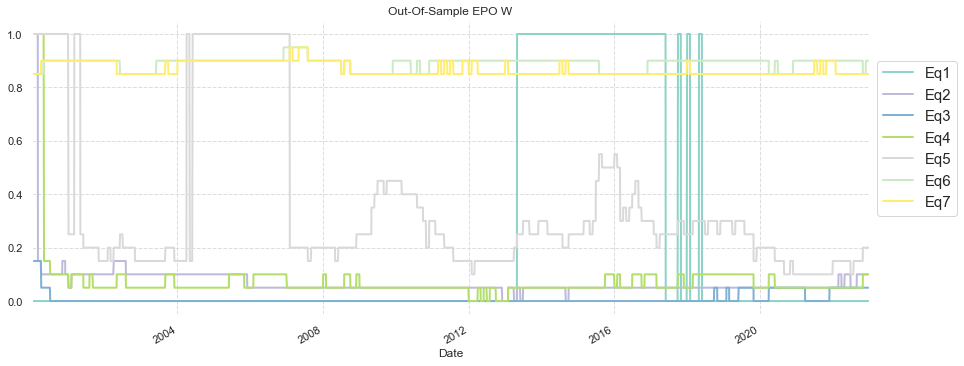

In [3570]:
#sns.heatmap(_Real_SR)
#ax = _Real_SR.plot(kind='scatter', x=_Real_SR.index.values, y=_Real_SR.columns, c=_Real_SR.columns, cmap='Set3', figsize=(11, 4), title='Gross Realized Sharpe Ratio')
ax = _agg_OOS_w.plot(cmap='Set3', figsize=(15, 6), title='Out-Of-Sample EPO W', ylim=(-0.05,1.05))
ax.legend(loc='center left', bbox_to_anchor=(1, 0.6))
plt.show()

In [2186]:
#monthly OOS_W Plot
# #sns.heatmap(_Real_SR)
# #ax = _Real_SR.plot(kind='scatter', x=_Real_SR.index.values, y=_Real_SR.columns, c=_Real_SR.columns, cmap='Set3', figsize=(11, 4), title='Gross Realized Sharpe Ratio')
# ax = _agg_OOS_w.plot(cmap='Set3', figsize=(15, 6), title='Out-Of-Sample EPO W', ylim=(-0.05,1.05))
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.6))
# plt.show()

In [3571]:
_agg_OOS_daily = pd.DataFrame([eq1_OOS_daily.iloc[:,1],
eq2_OOS_daily.iloc[:,1],
eq3_OOS_daily.iloc[:,1],
eq4_OOS_daily.iloc[:,1],
eq5_OOS_daily.iloc[:,1],
eq6_OOS_daily.iloc[:,1],
eq7_OOS_daily.iloc[:,1]]).T
_agg_OOS_daily = _agg_OOS_daily.set_index(_49_ER_daily[_pf_start_date:].index)
_agg_OOS_daily.columns = ['Eq1','Eq2','Eq3','Eq4','Eq5','Eq6','Eq7']

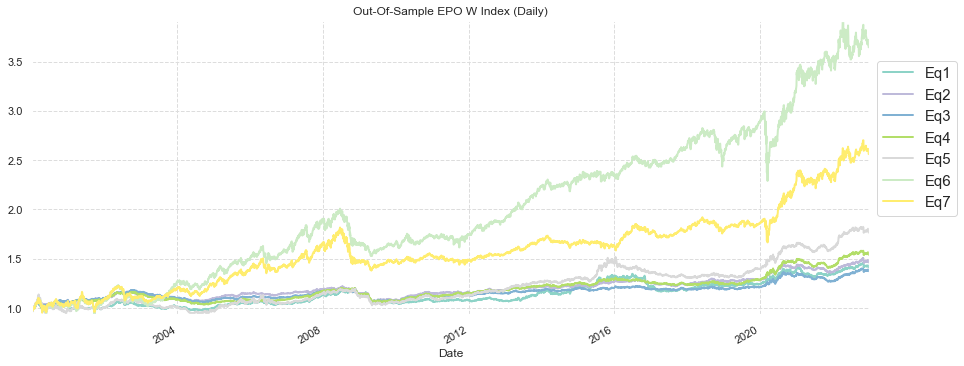

In [3572]:
#sns.heatmap(_Real_SR)
#ax = _Real_SR.plot(kind='scatter', x=_Real_SR.index.values, y=_Real_SR.columns, c=_Real_SR.columns, cmap='Set3', figsize=(11, 4), title='Gross Realized Sharpe Ratio')
ax = (1+_agg_OOS_daily).cumprod(axis=0).plot(cmap='Set3', figsize=(15, 6), title='Out-Of-Sample EPO W Index (Daily)')#, ylim=(_Real_SR.min().min()-_Real_SR.min().min()/8,_Real_SR.max().max()+_Real_SR.max().max()/8))
ax.legend(loc='center left', bbox_to_anchor=(1, 0.6))
plt.show()

In [3573]:
_agg_OOS_monthly = pd.DataFrame([eq1_OOS_monthly.iloc[:,1],
eq2_OOS_monthly.iloc[:,1],
eq3_OOS_monthly.iloc[:,1],
eq4_OOS_monthly.iloc[:,1],
eq5_OOS_monthly.iloc[:,1],
eq6_OOS_monthly.iloc[:,1],
eq7_OOS_monthly.iloc[:,1]]).T
_agg_OOS_monthly = _agg_OOS_monthly.set_index(xs_t[_pf_start_date:].index)
_agg_OOS_monthly.columns = ['Eq1','Eq2','Eq3','Eq4','Eq5','Eq6','Eq7']

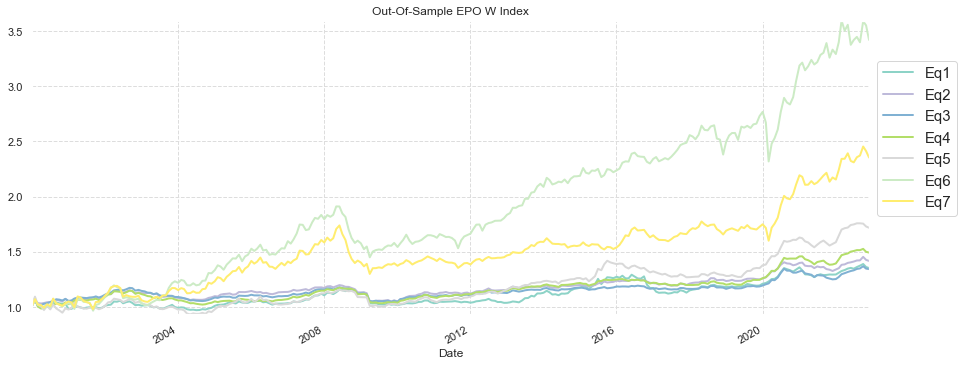

In [3574]:
#sns.heatmap(_Real_SR)
#ax = _Real_SR.plot(kind='scatter', x=_Real_SR.index.values, y=_Real_SR.columns, c=_Real_SR.columns, cmap='Set3', figsize=(11, 4), title='Gross Realized Sharpe Ratio')
ax = (1+_agg_OOS_monthly).cumprod(axis=0).plot(cmap='Set3', figsize=(15, 6), title='Out-Of-Sample EPO W Index')#, ylim=(_Real_SR.min().min()-_Real_SR.min().min()/8,_Real_SR.max().max()+_Real_SR.max().max()/8))
ax.legend(loc='center left', bbox_to_anchor=(1, 0.6))
plt.show()

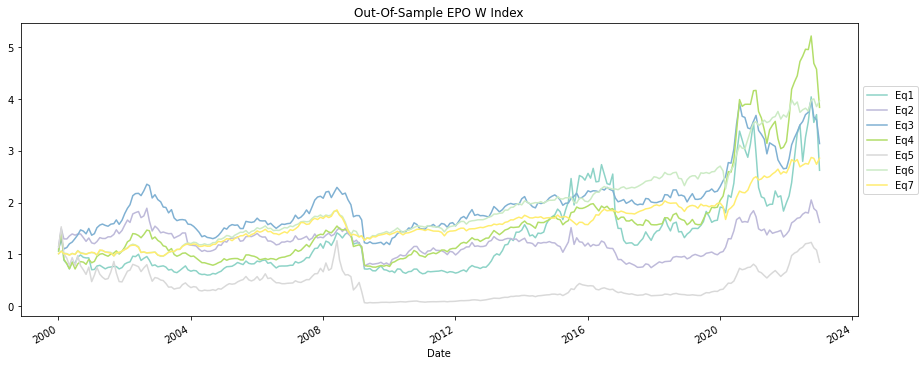

In [ ]:
# #sns.heatmap(_Real_SR)
# #ax = _Real_SR.plot(kind='scatter', x=_Real_SR.index.values, y=_Real_SR.columns, c=_Real_SR.columns, cmap='Set3', figsize=(11, 4), title='Gross Realized Sharpe Ratio')
# ax = (1+_agg_OOS_monthly).cumprod(axis=0).plot(cmap='Set3', figsize=(15, 6), title='Out-Of-Sample EPO W Index')#, ylim=(_Real_SR.min().min()-_Real_SR.min().min()/8,_Real_SR.max().max()+_Real_SR.max().max()/8))
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.6))
# plt.show()

## Realized Gross Sharpe -- Table 5

In [3575]:
_Real_SR = pd.DataFrame(columns = ['Eq1','Eq2','Eq3','Eq4','Eq5','Eq6','Eq7'])

In [3576]:
_SR_EQW_and_INDMOM_merge = pd.concat([_SR_EQW_and_INDMOM.T] * (_Real_SR.shape[1]), axis=1, ignore_index=True)
_SR_EQW_and_INDMOM_merge.columns =_Real_SR.columns
#_SR_EQW_and_INDMOM_merge

In [3577]:
_SR_Insamp_merge = pd.concat([_SR1_inSamp.T,_SR2_inSamp.T,_SR3_inSamp.T,_SR4_inSamp.T,_SR5_inSamp.T,_SR6_inSamp.T,_SR7_inSamp.T],axis=1)
_SR_Insamp_merge.columns = _Real_SR.columns
#_SR_Insamp_merge

In [3578]:
_SR_MVO_no_Corr_merge = _SR_MVO_no_Corr.copy()
_SR_MVO_no_Corr_merge.index = ['w = 0 (theta = 0)']
_SR_MVO_no_Corr_merge.columns = _Real_SR.columns
#_SR_MVO_no_Corr_merge

In [3579]:
_SR_OOS = pd.DataFrame(pd.DataFrame([np.sqrt(261)*eq1_OOS_daily.iloc[:,1].mean()/eq1_OOS_daily.iloc[:,1].std(),
np.sqrt(261)*eq2_OOS_daily.iloc[:,1].mean()/eq2_OOS_daily.iloc[:,1].std(),
np.sqrt(261)*eq3_OOS_daily.iloc[:,1].mean()/eq3_OOS_daily.iloc[:,1].std(),
np.sqrt(261)*eq4_OOS_daily.iloc[:,1].mean()/eq4_OOS_daily.iloc[:,1].std(),
np.sqrt(261)*eq5_OOS_daily.iloc[:,1].mean()/eq5_OOS_daily.iloc[:,1].std(),
np.sqrt(261)*eq6_OOS_daily.iloc[:,1].mean()/eq6_OOS_daily.iloc[:,1].std(),
np.sqrt(261)*eq7_OOS_daily.iloc[:,1].mean()/eq7_OOS_daily.iloc[:,1].std()]).T)
_SR_OOS_merge = _SR_OOS.copy()
_SR_OOS_merge.columns = _Real_SR.columns
_SR_OOS_merge =_SR_OOS_merge.set_index(pd.Index(['w = OOS']))
_SR_OOS_merge

,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
w = OOS,0.376837,0.549315,0.499119,0.531557,0.463423,0.601129,0.519324


In [3580]:
_Real_SR = pd.concat([_SR_EQW_and_INDMOM_merge,_SR_MVO_no_Corr_merge,_SR_Insamp_merge, _SR_OOS_merge ],axis=0)
#np.round(_Real_SR,4)

In [3581]:
# Apply the function to the dataframe
print('Gross Realized Sharpe Mean across all Portfolios = {}'.format(np.round(_Real_SR.mean(axis=1).mean(),3)))
_Real_SR.style.applymap(conditional_formatting, threshold=_Real_SR.mean(axis=1).mean(), min_val = _Real_SR.min().min(),max_val = _Real_SR.max().max())

Gross Realized Sharpe Mean across all Portfolios = 0.467


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1/N,0.562201,0.562201,0.562201,0.562201,0.562201,0.562201,0.562201
INDMOM,0.357551,0.357551,0.357551,0.357551,0.357551,0.357551,0.357551
w = 0 (theta = 0),0.367174,0.346291,0.334058,0.557282,0.643815,0.367174,0.367174
w = 0,0.365542,0.533792,0.509632,0.699856,0.762832,0.365542,0.365542
w = 0.1,0.362693,0.561940,0.511072,0.691206,0.752290,0.365631,0.366548
w = 0.25,0.367355,0.529562,0.478663,0.651921,0.720569,0.375835,0.377321
w = 0.5,0.376116,0.464529,0.430682,0.577808,0.668341,0.406556,0.407300
w = 0.75,0.384852,0.394009,0.381347,0.491694,0.579188,0.514039,0.497183
w = 0.8,0.385085,0.379522,0.370626,0.471548,0.553288,0.564029,0.532532
w = 0.9,0.385485,0.344075,0.343227,0.428708,0.491562,0.643646,0.569371


In [1160]:
# # Apply the function to the dataframe
# print('Gross Realized Sharpe Mean across all Portfolios = {}'.format(np.round(_Real_SR.mean(axis=1).mean(),3)))
# _Real_SR.style.applymap(conditional_formatting, threshold=_Real_SR.mean(axis=1).mean(), min_val = _Real_SR.min().min(),max_val = _Real_SR.max().max())

Gross Realized Sharpe Mean across all Portfolios = 0.407


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1/N,0.592374,0.592374,0.592374,0.592374,0.592374,0.592374,0.592374
INDMOM,0.315917,0.315917,0.315917,0.315917,0.315917,0.315917,0.315917
w = 0 (theta = 0),0.271363,0.343807,0.264458,0.454968,0.539061,0.271363,0.271363
w = 0,0.269546,0.413263,0.393673,0.557039,0.626712,0.269546,0.269546
w = 0.1,0.269204,0.433248,0.388326,0.552019,0.631332,0.271769,0.272241
w = 0.25,0.278965,0.416032,0.366119,0.533507,0.622217,0.286713,0.287032
w = 0.5,0.297125,0.375637,0.340098,0.492580,0.608415,0.327194,0.325081
w = 0.75,0.314577,0.322052,0.308140,0.427897,0.547273,0.463344,0.438974
w = 0.8,0.316346,0.310554,0.300557,0.410544,0.524272,0.535989,0.491998
w = 0.9,0.319504,0.280981,0.279384,0.371755,0.464077,0.688539,0.586139


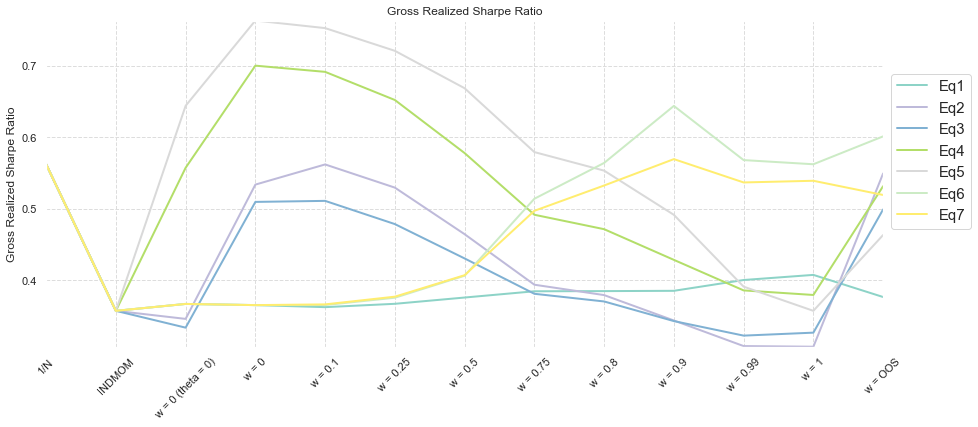

In [3582]:
#sns.heatmap(_Real_SR)
#ax = _Real_SR.plot(kind='scatter', x=_Real_SR.index.values, y=_Real_SR.columns, c=_Real_SR.columns, cmap='Set3', figsize=(11, 4), title='Gross Realized Sharpe Ratio')
ax = _Real_SR.plot(cmap='Set3', figsize=(15, 6), title='Gross Realized Sharpe Ratio', ylabel = 'Gross Realized Sharpe Ratio')#, ylim=(_Real_SR.min().min()-_Real_SR.min().min()/8,_Real_SR.max().max()+_Real_SR.max().max()/8))
ax.set_xticks(range(len(_Real_SR.index)))
ax.set_xticklabels(_Real_SR.index, rotation=45)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.6))
plt.show()

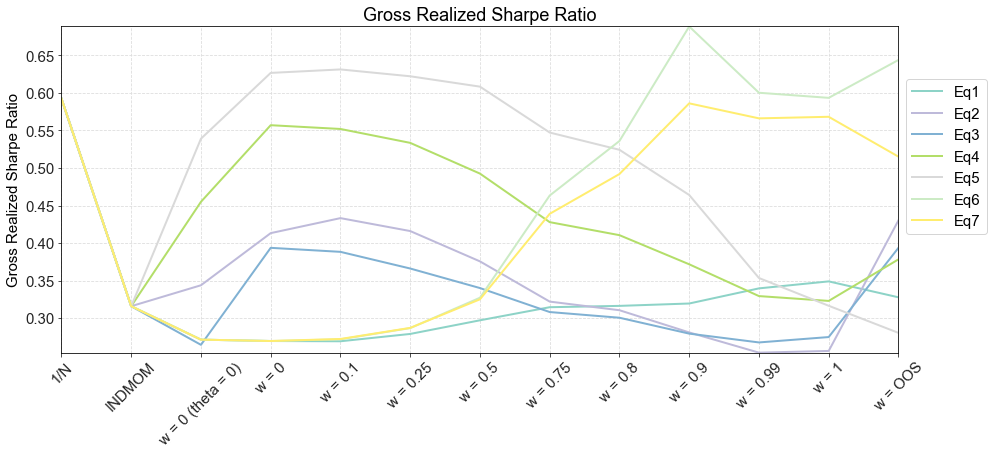

In [ ]:
# #sns.heatmap(_Real_SR)
# #ax = _Real_SR.plot(kind='scatter', x=_Real_SR.index.values, y=_Real_SR.columns, c=_Real_SR.columns, cmap='Set3', figsize=(11, 4), title='Gross Realized Sharpe Ratio')
# ax = _Real_SR.plot(cmap='Set3', figsize=(15, 6), title='Gross Realized Sharpe Ratio', ylabel = 'Gross Realized Sharpe Ratio')#, ylim=(_Real_SR.min().min()-_Real_SR.min().min()/8,_Real_SR.max().max()+_Real_SR.max().max()/8))
# ax.set_xticks(range(len(_Real_SR.index)))
# ax.set_xticklabels(_Real_SR.index, rotation=45)
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.6))
# plt.show()

## Creating Table 6 - Alpha of EPO for Equity Portfolios (1990) 2000 - 2023

Scaling method

In [ ]:

# Assume returns is a numpy array or pandas Series with the return series
returns = np.array([0.02, 0.03, -0.01, 0.05, -0.02, 0.01])

# Compute annualized standard deviation
vol = np.std(returns) * np.sqrt(252)

# Compute scaling factor
scaling_factor = 0.1 / vol

# Scale return series
scaled_returns = returns * scaling_factor

# Compute the annualized standard deviation of the scaled return series
scaled_vol = np.std(scaled_returns) * np.sqrt(252)

print(f"Original vol: {vol:.2%}, Scaled vol: {scaled_vol:.2%}")


Original vol: 37.42%, Scaled vol: 10.00%


##### Scale the OOS to Ex post 10% vol

In [3583]:
print('Target Vol = ',target_vol)
_OOS_vol_scale = target_vol/(np.sqrt(12)*_agg_OOS_monthly.std(axis=0))
_OOS_vol_scale_daily = target_vol/(np.sqrt(261)*_agg_OOS_daily.std(axis=0))
#print('Vol Scaling: \n',np.round(_OOS_vol_scale,3))

Target Vol =  0.1


In [3584]:
_scaled_OOS_monthly = _OOS_vol_scale * _agg_OOS_monthly
pd.DataFrame(np.sqrt(12)*(_scaled_OOS_monthly).std(axis=0)).T
_scaled_OOS_daily = _OOS_vol_scale_daily * _agg_OOS_daily
pd.DataFrame(np.sqrt(261)*(_scaled_OOS_daily).std(axis=0)).T

,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
0,0.1,0.1,0.1,0.1,0.1,0.1,0.1


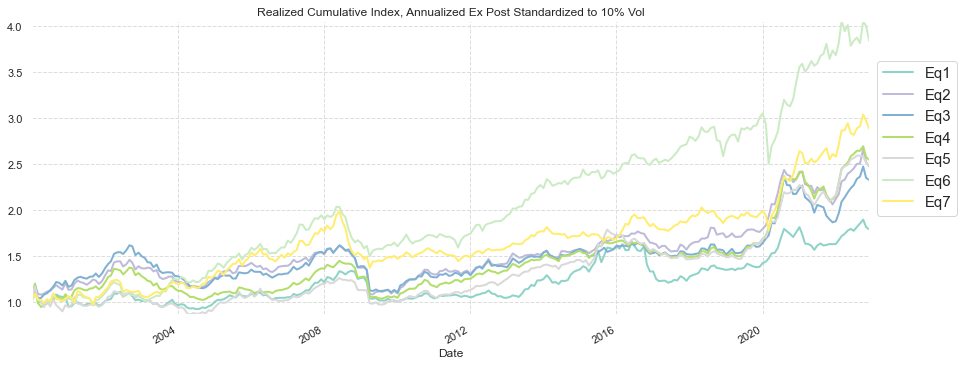

In [3585]:
ax = (1+_scaled_OOS_monthly).cumprod(axis=0).plot(cmap='Set3', figsize=(15, 6), title='Realized Cumulative Index, Annualized Ex Post Standardized to 10% Vol')#, ylim=(_Real_SR.min().min()-_Real_SR.min().min()/8,_Real_SR.max().max()+_Real_SR.max().max()/8))
ax.legend(loc='center left', bbox_to_anchor=(1, 0.6))
plt.show()

Scale the FF5 to Ex post 10% vol

In [3586]:
_FF5_idx_monthly = _FF5_idx_daily.assign(m=ind_mc_weighted.index.to_period("m")).drop_duplicates("m").drop("m",axis=1)
_FF5_monthly = _FF5_idx_monthly.pct_change(1)
_pf_FF5_monthly = _FF5_monthly[_FF5_monthly.index.isin(xs_t.loc[_pf_start_date:].index)]
_FF5_vol_scale = target_vol/(np.sqrt(12)*_pf_FF5_monthly.std(axis=0))
_scaled_FF5_monthly = _FF5_vol_scale * _pf_FF5_monthly

pd.DataFrame(np.sqrt(12)*(_scaled_FF5_monthly.std(axis=0))).T

,Mkt-RF,SMB,HML,RMW,CMA
0,0.1,0.1,0.1,0.1,0.1


In [3587]:
_FF5_idx_daily
_FF5_daily
_pf_FF5_daily = _FF5_daily[_pf_start_date:].copy()
_FF5_vol_scale_daily = target_vol/(np.sqrt(261)*_pf_FF5_daily.std(axis=0))
_scaled_FF5_daily = _FF5_vol_scale_daily * _pf_FF5_daily

pd.DataFrame(np.sqrt(261)*(_scaled_FF5_daily.std(axis=0))).T

,Mkt-RF,SMB,HML,RMW,CMA
0,0.1,0.1,0.1,0.1,0.1


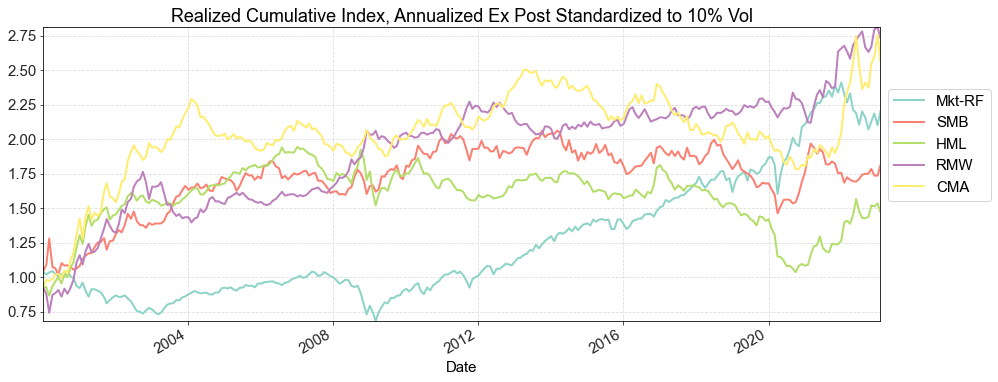

In [268]:
ax = (1+_scaled_FF5_monthly).cumprod(axis=0).plot(cmap='Set3', figsize=(15, 6), title='Realized Cumulative Index, Annualized Ex Post Standardized to 10% Vol')#, ylim=(_Real_SR.min().min()-_Real_SR.min().min()/8,_Real_SR.max().max()+_Real_SR.max().max()/8))
ax.legend(loc='center left', bbox_to_anchor=(1, 0.6))
plt.show()

Scale the INDMOM portfolio

In [3588]:
_scaled_INDMOM_monthly = pd.DataFrame((_pf_INDMOM_monthly-1) * (target_vol/(np.sqrt(12)*(_pf_INDMOM_monthly-1).std())))
_scaled_INDMOM_monthly.columns = ['INDMOM']

In [3589]:
_scaled_INDMOM_daily = pd.DataFrame(_INDMOM_daily * (target_vol/(np.sqrt(261)*(_INDMOM_daily).std())))
_scaled_INDMOM_daily.columns = ['INDMOM']

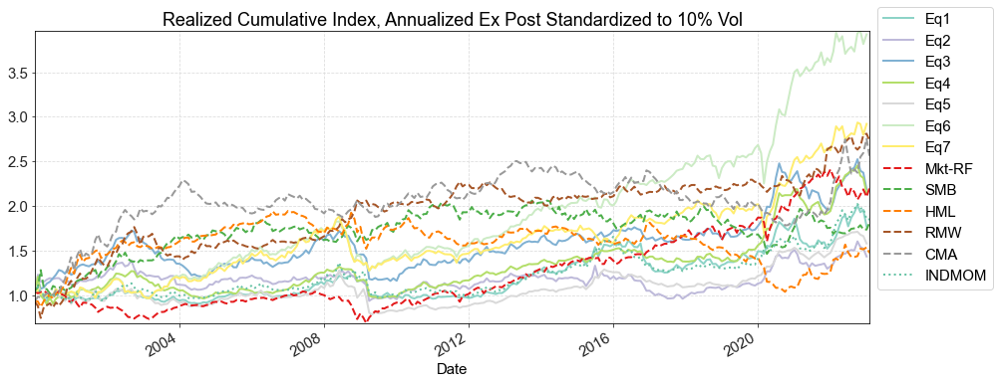

In [270]:
ax = (1+_scaled_OOS_monthly).cumprod(axis=0).plot(cmap='Set3', figsize=(15, 6), title='Realized Cumulative Index, Annualized Ex Post Standardized to 10% Vol')
(1+_scaled_FF5_monthly).cumprod(axis=0).plot(ax=ax, cmap='Set1',linestyle='--')
(1+_scaled_INDMOM_monthly).cumprod(axis=0).plot(ax=ax, cmap='Set2',linestyle='dotted')
ax.legend( loc='center left', bbox_to_anchor=(1, 0.6))
plt.show()


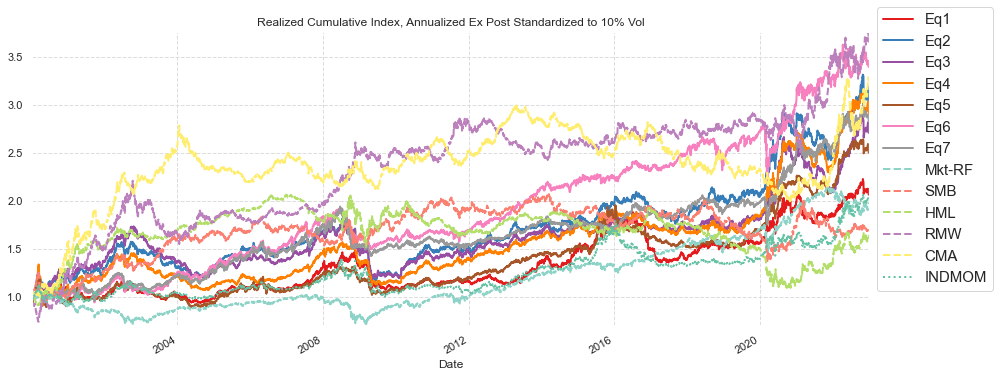

In [3590]:
ax = (1+_scaled_OOS_daily).cumprod(axis=0).plot(cmap='Set1', figsize=(15, 6), title='Realized Cumulative Index, Annualized Ex Post Standardized to 10% Vol')
(1+_scaled_FF5_daily).cumprod(axis=0).plot(ax=ax, cmap='Set3',linestyle='--')
(1+_scaled_INDMOM_daily).cumprod(axis=0).plot(ax=ax, cmap='Set2',linestyle='dotted')
ax.legend( loc='center left', bbox_to_anchor=(1, 0.6))
plt.show()


##### Regression OOS Eq1-7 on FF5 + INDMOM

$\text{Annualized } \alpha = 12 \cdot \alpha$

$\text{Annualized IR} = \sqrt{12}\cdot\frac{\alpha}{\sigma(\epsilon)}$

monthly

In [3591]:
# # split the data into X and y
X = pd.concat([_scaled_INDMOM_monthly,_scaled_FF5_monthly],axis=1)
X = sm.add_constant(X)

_agg_model = pd.DataFrame(0, index = pd.MultiIndex.from_product([_scaled_OOS_monthly.columns, 
                        ['Coefficients','t_statistics']]),columns=X.columns.values)
_agg_model['R2_adj (%)']=0
_agg_model['σ(𝜖)']=0


for [i, col] in enumerate(_agg_model.index.get_level_values(0).unique()):
    # create a linear regression model and fit the data
    y = _scaled_OOS_monthly.iloc[:,i].replace(np.nan,0)

    # Fit OLS regression model
    model = sm.OLS(y, X).fit()
    output = pd.DataFrame(pd.concat([model.params,model.tvalues],axis=1))
    #output.columns = ['Parameters','t-statistics']
    output2 = pd.DataFrame([[model.rsquared,np.nan],[model.resid.std(),np.nan]])
    #output2.columns = ['Parameters','t-statistics']
    _agg_model.loc[col] = pd.concat([output,output2],axis=0).T.values

# Print regression summary
#print(model.summary())

_agg_model.rename({'const':'Annualized α (%)'}, axis = 1, inplace=True)
#_agg_model.droplevel(0).loc['Coefficients'].iloc[:,0] = _agg_model.droplevel(0).loc['Coefficients'].iloc[:,0]*12
#turn to % and annualize
_agg_model.iloc[::2,0] = 100 * 12 * _agg_model.iloc[::2,0]
_agg_model.loc[:,'R2_adj (%)'] = 100 * _agg_model.loc[:,'R2_adj (%)']
_agg_model['Annualized IR']=0
_agg_model.iloc[::2,-1] = (_agg_model.iloc[::2,0]/100)/(np.sqrt(12)*_agg_model.iloc[::2,-2])

In [3592]:
_agg_model

Annualized α (%)     INDMOM    Mkt-RF       SMB       HML  \
Eq1 Coefficients          0.684645   0.757469  0.006400 -0.038328 -0.099293   
    t_statistics          0.477392  19.238469  0.135920 -0.788136 -1.771376   
Eq2 Coefficients          1.961197   0.646473 -0.016946  0.030298 -0.195033   
    t_statistics          1.189360  14.280331 -0.312993  0.541848 -3.026076   
Eq3 Coefficients          1.749517   0.595441  0.049309 -0.024454 -0.207746   
    t_statistics          0.999749  12.393886  0.858158 -0.412106 -3.037291   
Eq4 Coefficients          2.045100   0.659005  0.008608 -0.029833 -0.123963   
    t_statistics          1.244549  14.607702  0.159535 -0.535393 -1.930057   
Eq5 Coefficients          1.609562   0.761943 -0.000888 -0.028857 -0.019767   
    t_statistics          1.133118  19.538256 -0.019037 -0.599089 -0.356028   
Eq6 Coefficients          6.004812   0.238258  0.003039 -0.103282 -0.027681   
    t_statistics          2.806486   4.056093  0.043258 -1.423521 -0.330993   
Eq7 Coefficients          4.116760   0.316971  0.043911 -0.146422 -0.098049   
    t_statistics          1.986629   5.571564  0.645361 -2.083754 -1.210550   

                       RMW       CMA  R2_adj (%)      σ(𝜖)  Annualized IR  
Eq1 Coefficients -0.019359  0.029033   58.304480  0.018607       0.106219  
    t_statistics -0.368957  0.526074         NaN       NaN       0.000000  
Eq2 Coefficients -0.032389  0.170067   44.879775  0.021394       0.264631  
    t_statistics -0.536895  2.680089         NaN       NaN       0.000000  
Eq3 Coefficients -0.016161  0.165779   37.919856  0.022704       0.222443  
    t_statistics -0.252428  2.461724         NaN       NaN       0.000000  
Eq4 Coefficients -0.023349  0.141967   45.260787  0.021320       0.276911  
    t_statistics -0.388382  2.245039         NaN       NaN       0.000000  
Eq5 Coefficients  0.021262  0.047186   59.096544  0.018430       0.252117  
    t_statistics  0.409129  0.863218         NaN       NaN       0.000000  
Eq6 Coefficients -0.107132  0.081854    7.201543  0.027760       0.624440  
    t_statistics -1.368595  0.994131         NaN       NaN       0.000000  
Eq7 Coefficients -0.074804  0.150329   12.950937  0.026886       0.442023  
    t_statistics -0.986684  1.885139         NaN       NaN       0.000000

Daily

In [3593]:
# split the data into X and y
X = pd.concat([_scaled_INDMOM_daily,_scaled_FF5_daily],axis=1)
X = sm.add_constant(X)

_agg_model_daily = pd.DataFrame(0, index = pd.MultiIndex.from_product([_scaled_OOS_daily.columns, 
                        ['Coefficients','t_statistics']]),columns=X.columns.values)
_agg_model_daily['R2_adj (%)']=0
_agg_model_daily['σ(𝜖)']=0


for [i, col] in enumerate(_agg_model_daily.index.get_level_values(0).unique()):
    # create a linear regression model and fit the data
    y = _scaled_OOS_daily.iloc[:,i].replace(np.nan,0)

    # Fit OLS regression model
    model = sm.OLS(y, X).fit()
    output = pd.DataFrame(pd.concat([model.params,model.tvalues],axis=1))
    #output.columns = ['Parameters','t-statistics']
    output2 = pd.DataFrame([[model.rsquared,np.nan],[model.resid.std(),np.nan]])
    #output2.columns = ['Parameters','t-statistics']
    _agg_model_daily.loc[col] = pd.concat([output,output2],axis=0).T.values

# Print regression summary
#print(model.summary())

_agg_model_daily.rename({'const':'Annualized α (%)'}, axis = 1, inplace=True)
#_agg_model.droplevel(0).loc['Coefficients'].iloc[:,0] = _agg_model.droplevel(0).loc['Coefficients'].iloc[:,0]*12
#turn to % and annualize
_agg_model_daily.iloc[::2,0] = 100 * 261 * _agg_model_daily.iloc[::2,0]
_agg_model_daily.loc[:,'R2_adj (%)'] = 100 * _agg_model_daily.loc[:,'R2_adj (%)']
_agg_model_daily['Annualized IR']=0
_agg_model_daily.iloc[::2,-1] = (_agg_model_daily.iloc[::2,0]/100)/(np.sqrt(261)*_agg_model_daily.iloc[::2,-2])

In [3594]:
_agg_model_daily

Annualized α (%)     INDMOM    Mkt-RF       SMB       HML  \
Eq1 Coefficients          1.437170   0.734525 -0.024126 -0.003431 -0.017222   
    t_statistics          0.996822  82.469789 -2.413485 -0.362251 -1.611760   
Eq2 Coefficients          3.271434   0.578465 -0.020001  0.018763 -0.014422   
    t_statistics          1.884769  53.948066 -1.662003  1.645670 -1.121161   
Eq3 Coefficients          2.985538   0.558141 -0.024059 -0.003877 -0.022411   
    t_statistics          1.691615  51.191918 -1.966139 -0.334397 -1.713431   
Eq4 Coefficients          2.989143   0.665627 -0.005965 -0.002070 -0.024530   
    t_statistics          1.883343  67.887938 -0.542101 -0.198523 -2.085452   
Eq5 Coefficients          1.930419   0.756725  0.003434  0.004928 -0.009749   
    t_statistics          1.387484  88.042583  0.355962  0.539247 -0.945488   
Eq6 Coefficients          5.123859   0.335859 -0.079841  0.055092 -0.041391   
    t_statistics          2.568553  27.253786 -5.772664  4.204404 -2.799699   
Eq7 Coefficients          4.052459   0.382551 -0.060570  0.051486 -0.048948   
    t_statistics          2.069333  31.621279 -4.460904  4.002453 -3.372622   

                       RMW       CMA  R2_adj (%)      σ(𝜖)  Annualized IR  
Eq1 Coefficients -0.008679 -0.017312   54.198223  0.004189       0.212357  
    t_statistics -0.845521 -1.563185         NaN       NaN       0.000000  
Eq2 Coefficients  0.024602  0.008517   33.616393  0.005043       0.401520  
    t_statistics  1.990938  0.638759         NaN       NaN       0.000000  
Eq3 Coefficients  0.021129  0.005000   31.365438  0.005128       0.360372  
    t_statistics  1.681633  0.368839         NaN       NaN       0.000000  
Eq4 Coefficients  0.015117 -0.009775   44.494576  0.004612       0.401217  
    t_statistics  1.337900 -0.801802         NaN       NaN       0.000000  
Eq5 Coefficients  0.011065 -0.012285   57.347102  0.004043       0.295582  
    t_statistics  1.117163 -1.149448         NaN       NaN       0.000000  
Eq6 Coefficients -0.010925 -0.003272   12.316423  0.005796       0.547190  
    t_statistics -0.769246 -0.213524         NaN       NaN       0.000000  
Eq7 Coefficients -0.009972  0.004496   15.495908  0.005690       0.440839  
    t_statistics -0.715268  0.298906         NaN       NaN       0.000000

In [3883]:
(_agg_model_daily.iloc[::2,1:7]).style.applymap(conditional_formatting, threshold=0.001, min_val = _agg_model_daily.iloc[::2,1:7].min().min(),max_val = _agg_model_daily.iloc[::2,1:7].max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA
Eq1,Coefficients,0.734525,-0.024126,-0.003431,-0.017222,-0.008679,-0.017312
Eq2,Coefficients,0.578465,-0.020001,0.018763,-0.014422,0.024602,0.008517
Eq3,Coefficients,0.558141,-0.024059,-0.003877,-0.022411,0.021129,0.005000
Eq4,Coefficients,0.665627,-0.005965,-0.002070,-0.024530,0.015117,-0.009775
Eq5,Coefficients,0.756725,0.003434,0.004928,-0.009749,0.011065,-0.012285
Eq6,Coefficients,0.335859,-0.079841,0.055092,-0.041391,-0.010925,-0.003272
Eq7,Coefficients,0.382551,-0.060570,0.051486,-0.048948,-0.009972,0.004496


In [3884]:
(abs(_agg_model_daily).iloc[1::2,1:7]).style.applymap(conditional_formatting, threshold=1.96, min_val = abs(_agg_model_daily).iloc[1::2,1:7].min().min(),max_val = abs(_agg_model_daily).iloc[1::2,1:7].max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA
Eq1,t_statistics,82.469789,2.413485,0.362251,1.611760,0.845521,1.563185
Eq2,t_statistics,53.948066,1.662003,1.645670,1.121161,1.990938,0.638759
Eq3,t_statistics,51.191918,1.966139,0.334397,1.713431,1.681633,0.368839
Eq4,t_statistics,67.887938,0.542101,0.198523,2.085452,1.337900,0.801802
Eq5,t_statistics,88.042583,0.355962,0.539247,0.945488,1.117163,1.149448
Eq6,t_statistics,27.253786,5.772664,4.204404,2.799699,0.769246,0.213524
Eq7,t_statistics,31.621279,4.460904,4.002453,3.372622,0.715268,0.298906


In [ ]:
# _agg_model_daily

Annualized α (%)     INDMOM    Mkt-RF       SMB       HML  \
Eq1 Coefficients          1.360420   0.734735 -0.024385 -0.003534 -0.016978   
    t_statistics          0.947092  82.790808 -2.447753 -0.374743 -1.591223   
Eq2 Coefficients          2.866618   0.579407 -0.021808  0.017409 -0.013817   
    t_statistics          1.658619  54.261601 -1.819421  1.534142 -1.076293   
Eq3 Coefficients          2.538552   0.559253 -0.025995 -0.004785 -0.021724   
    t_statistics          1.444627  51.512162 -2.133034 -0.414727 -1.664357   
Eq4 Coefficients          2.654625   0.666822 -0.007421 -0.002326 -0.024317   
    t_statistics          1.680523  68.325597 -0.677364 -0.224224 -2.072496   
Eq5 Coefficients          1.771005   0.757424  0.002749  0.005202 -0.009760   
    t_statistics          1.278724  88.517316  0.286187  0.572066 -0.948703   
Eq6 Coefficients          5.184708   0.335180 -0.080099  0.054133 -0.040273   
    t_statistics          2.607005  27.278963 -5.807327  4.145571 -2.726249   
Eq7 Coefficients          4.100580   0.383758 -0.061103  0.050662 -0.048209   
    t_statistics          2.102088  31.841667 -4.516450  3.955419 -3.327157   

                       RMW       CMA  R2_adj (%)      σ(𝜖)  Annualized IR  
Eq1 Coefficients -0.008899 -0.016225   54.227787  0.004188       0.201082  
    t_statistics -0.869809 -1.464929         NaN       NaN       0.000000  
Eq2 Coefficients  0.022928  0.012676   33.734743  0.005039       0.352149  
    t_statistics  1.862574  0.951209         NaN       NaN       0.000000  
Eq3 Coefficients  0.019356  0.008924   31.498435  0.005123       0.306716  
    t_statistics  1.546514  0.658637         NaN       NaN       0.000000  
Eq4 Coefficients  0.013933 -0.007588   44.644967  0.004605       0.356800  
    t_statistics  1.238367 -0.622980         NaN       NaN       0.000000  
Eq5 Coefficients  0.010550 -0.011417   57.447451  0.004038       0.271492  
    t_statistics  1.069563 -1.069127         NaN       NaN       0.000000  
Eq6 Coefficients -0.010702 -0.001244   12.258562  0.005798       0.553506  
    t_statistics -0.755550 -0.081149         NaN       NaN       0.000000  
Eq7 Coefficients -0.010037  0.005797   15.583304  0.005687       0.446304  
    t_statistics -0.722391  0.385406         NaN       NaN       0.000000

In [2224]:
(_agg_model.iloc[::2,1:7]).style.applymap(conditional_formatting, threshold=_agg_model.iloc[::2,1:7].mean(axis=0).mean(), min_val = _agg_model.iloc[::2,1:7].min().min(),max_val = _agg_model.iloc[::2,1:7].max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA
Eq1,Coefficients,0.734735,-0.024385,-0.003534,-0.016978,-0.008899,-0.016225
Eq2,Coefficients,0.579407,-0.021808,0.017409,-0.013817,0.022928,0.012676
Eq3,Coefficients,0.559253,-0.025995,-0.004785,-0.021724,0.019356,0.008924
Eq4,Coefficients,0.666822,-0.007421,-0.002326,-0.024317,0.013933,-0.007588
Eq5,Coefficients,0.757424,0.002749,0.005202,-0.009760,0.010550,-0.011417
Eq6,Coefficients,0.335180,-0.080099,0.054133,-0.040273,-0.010702,-0.001244
Eq7,Coefficients,0.383758,-0.061103,0.050662,-0.048209,-0.010037,0.005797


In [604]:
# (_agg_model.iloc[::2,1:7]).style.applymap(conditional_formatting, threshold=_agg_model.iloc[::2,1:7].mean(axis=0).mean(), min_val = _agg_model.iloc[::2,1:7].min().min(),max_val = _agg_model.iloc[::2,1:7].max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA
Eq1,Coefficients,0.735225,0.048995,-0.091371,-0.104921,-0.073523,0.093660
Eq2,Coefficients,0.617616,-0.005822,0.014120,-0.147564,-0.082216,0.104219
Eq3,Coefficients,0.602307,0.061143,0.002832,-0.197044,-0.009142,0.147248
Eq4,Coefficients,0.661835,0.022776,-0.070716,-0.079151,-0.008318,0.114415
Eq5,Coefficients,0.901494,0.044852,0.034514,-0.051339,0.048211,0.028626
Eq6,Coefficients,0.135636,0.049741,-0.124351,-0.095150,-0.101637,0.154616
Eq7,Coefficients,0.130427,0.045139,-0.138586,-0.115854,-0.094869,0.185501


In [2225]:
(_agg_model.iloc[1::2,1:7]).style.applymap(conditional_formatting, threshold=_agg_model.iloc[1::2,1:7].mean(axis=0).mean(), min_val = _agg_model.iloc[1::2,1:7].min().min(),max_val = _agg_model.iloc[1::2,1:7].max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA
Eq1,t_statistics,82.790808,-2.447753,-0.374743,-1.591223,-0.869809,-1.464929
Eq2,t_statistics,54.261601,-1.819421,1.534142,-1.076293,1.862574,0.951209
Eq3,t_statistics,51.512162,-2.133034,-0.414727,-1.664357,1.546514,0.658637
Eq4,t_statistics,68.325597,-0.677364,-0.224224,-2.072496,1.238367,-0.622980
Eq5,t_statistics,88.517316,0.286187,0.572066,-0.948703,1.069563,-1.069127
Eq6,t_statistics,27.278963,-5.807327,4.145571,-2.726249,-0.755550,-0.081149
Eq7,t_statistics,31.841667,-4.516450,3.955419,-3.327157,-0.722391,0.385406


In [274]:
# (_agg_model.iloc[1::2,1:7]).style.applymap(conditional_formatting, threshold=_agg_model.iloc[1::2,1:7].mean(axis=0).mean(), min_val = _agg_model.iloc[1::2,1:7].min().min(),max_val = _agg_model.iloc[1::2,1:7].max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA
Eq1,t_statistics,18.189896,1.008873,-1.827864,-1.814355,-1.361988,1.641586
Eq2,t_statistics,13.147423,-0.103159,0.243046,-2.195613,-1.310451,1.571704
Eq3,t_statistics,12.587018,1.063483,0.047860,-2.878199,-0.143045,2.179996
Eq4,t_statistics,14.729210,0.421867,-1.272544,-1.231235,-0.138611,1.803905
Eq5,t_statistics,34.194884,1.415967,1.058588,-1.361137,1.369256,0.769230
Eq6,t_statistics,2.278643,0.695497,-1.689191,-1.117283,-1.278488,1.840170
Eq7,t_statistics,2.197716,0.633042,-1.888223,-1.364484,-1.196940,2.214379


In [2226]:
_agg_model.iloc[::2,[0,-2,-1]]

,,Annualized α (%),σ(𝜖),Annualized IR
Eq1,Coefficients,1.360420,0.004188,0.201082
Eq2,Coefficients,2.866618,0.005039,0.352149
Eq3,Coefficients,2.538552,0.005123,0.306716
Eq4,Coefficients,2.654625,0.004605,0.356800
Eq5,Coefficients,1.771005,0.004038,0.271492
Eq6,Coefficients,5.184708,0.005798,0.553506
Eq7,Coefficients,4.100580,0.005687,0.446304


In [275]:
# _agg_model.iloc[::2,[0,-2,-1]]

,,Annualized α (%),σ(𝜖),Annualized IR
Eq1,Coefficients,0.890184,0.019154,0.134161
Eq2,Coefficients,0.324617,0.022261,0.042095
Eq3,Coefficients,1.531150,0.022676,0.194922
Eq4,Coefficients,1.523578,0.021293,0.206553
Eq5,Coefficients,-0.901037,0.012493,-0.208199
Eq6,Coefficients,6.167085,0.028208,0.631132
Eq7,Coefficients,4.833204,0.028123,0.496110


##### Regression as before, including UMD

In [276]:
_pf_FF5_WRDS_monthly = _FF5_WRDS_monthly.loc[_pf_start_date:].copy()
_UMD_monthly = pd.DataFrame(_pf_FF5_WRDS_monthly.iloc[:,-1].copy())
_UMD_monthly.columns= pd.DataFrame(_UMD_monthly).columns.str.upper()


_scaled_UMD_monthly = _UMD_monthly * (target_vol/(np.sqrt(12)*_UMD_monthly.std()))


In [2239]:
_pf_FF5_WRDS_daily = _FF5_WRDS_daily.loc[_pf_start_date:].copy()
_UMD_daily = pd.DataFrame(_pf_FF5_WRDS_daily.iloc[:,-1].copy())
_UMD_daily.columns= pd.DataFrame(_UMD_daily).columns.str.upper()


_scaled_UMD_daily = _UMD_daily * (target_vol/(np.sqrt(261)*_UMD_daily.std()))


Monthly Model

In [277]:
# # split the data into X and y
# X = pd.concat([_scaled_INDMOM_monthly,_scaled_FF5_monthly, _scaled_UMD_monthly],axis=1)
# X = sm.add_constant(X)

# _agg_model2 = pd.DataFrame(0, index = pd.MultiIndex.from_product([_scaled_OOS_monthly.columns, 
#                         ['Coefficients','t_statistics']]),columns=X.columns.values)
# _agg_model2['R2_adj (%)']=0
# _agg_model2['σ(𝜖)']=0


# for [i, col] in enumerate(_agg_model2.index.get_level_values(0).unique()):
#     # create a linear regression model and fit the data
#     y = _scaled_OOS_monthly.iloc[:,i].replace(np.nan,0)

#     # Fit OLS regression model
#     model = sm.OLS(y, X).fit()
#     output = pd.DataFrame(pd.concat([model.params,model.tvalues],axis=1))
#     output2 = pd.DataFrame([[model.rsquared,np.nan],[model.resid.std(),np.nan]])
#     _agg_model2.loc[col] = pd.concat([output,output2],axis=0).T.values

# # Print regression summary
# #print(model.summary())

# _agg_model2.rename({'const':'Annualized α (%)'}, axis = 1, inplace=True)
# #_agg_model.droplevel(0).loc['Coefficients'].iloc[:,0] = _agg_model.droplevel(0).loc['Coefficients'].iloc[:,0]*12
# #turn to % and annualize
# _agg_model2.iloc[::2,0] = 100 * 12 * _agg_model2.iloc[::2,0]
# _agg_model2.loc[:,'R2_adj (%)'] = 100 * _agg_model2.loc[:,'R2_adj (%)']
# _agg_model2['Annualized IR']=0
# _agg_model2.iloc[::2,-1] = (_agg_model2.iloc[::2,0]/100)/(np.sqrt(12)*_agg_model2.iloc[::2,-2])

Daily Model

In [3407]:
# # split the data into X and y
X = pd.concat([_scaled_INDMOM_daily,_scaled_FF5_daily, _scaled_UMD_daily],axis=1)
X = sm.add_constant(X)

_agg_model2 = pd.DataFrame(0, index = pd.MultiIndex.from_product([_scaled_OOS_daily.columns, 
                        ['Coefficients','t_statistics']]),columns=X.columns.values)
_agg_model2['R2_adj (%)']=0
_agg_model2['σ(𝜖)']=0


for [i, col] in enumerate(_agg_model2.index.get_level_values(0).unique()):
    # create a linear regression model and fit the data
    y = _scaled_OOS_daily.iloc[:,i].replace(np.nan,0)

    # Fit OLS regression model
    model = sm.OLS(y, X).fit()
    output = pd.DataFrame(pd.concat([model.params,model.tvalues],axis=1))
    output2 = pd.DataFrame([[model.rsquared,np.nan],[model.resid.std(),np.nan]])
    _agg_model2.loc[col] = pd.concat([output,output2],axis=0).T.values

# # Print regression summary
# #print(model.summary())

_agg_model2.rename({'const':'Annualized α (%)'}, axis = 1, inplace=True)
#_agg_model.droplevel(0).loc['Coefficients'].iloc[:,0] = _agg_model.droplevel(0).loc['Coefficients'].iloc[:,0]*12
#turn to % and annualize
_agg_model2.iloc[::2,0] = 100 * 261 * _agg_model2.iloc[::2,0]
_agg_model2.loc[:,'R2_adj (%)'] = 100 * _agg_model2.loc[:,'R2_adj (%)']
_agg_model2['Annualized IR']=0
_agg_model2.iloc[::2,-1] = (_agg_model2.iloc[::2,0]/100)/(np.sqrt(261)*_agg_model2.iloc[::2,-2])

In [3408]:
_agg_model2

Annualized α (%)     INDMOM    Mkt-RF       SMB       HML  \
Eq1 Coefficients          1.304514   0.731062 -0.014543 -0.005530  0.012471   
    t_statistics          0.910914  82.432533 -1.444977 -0.587786  1.065682   
Eq2 Coefficients          2.812741   0.575866 -0.012324  0.015486  0.014563   
    t_statistics          1.630531  53.906011 -1.016550  1.366414  1.033092   
Eq3 Coefficients          2.490397   0.556088 -0.017518 -0.006504  0.003642   
    t_statistics          1.419263  51.174569 -1.420557 -0.564205  0.253986   
Eq4 Coefficients          2.605609   0.663601  0.001208 -0.004076  0.001502   
    t_statistics          1.652589  67.964017  0.108982 -0.393445  0.116572   
Eq5 Coefficients          1.741431   0.755480  0.007955  0.004146  0.005818   
    t_statistics          1.258416  88.157120  0.817934  0.456069  0.514535   
Eq6 Coefficients          5.204137   0.336457 -0.083519  0.054827 -0.050507   
    t_statistics          2.617007  27.321330 -5.975982  4.196558 -3.108138   
Eq7 Coefficients          4.107036   0.384183 -0.062239  0.050893 -0.051610   
    t_statistics          2.105220  31.799704 -4.539408  3.970707 -3.237395   

                       RMW       CMA       UMD  R2_adj (%)      σ(𝜖)  \
Eq1 Coefficients -0.011876 -0.034682  0.061290   54.512691  0.004175   
    t_statistics -1.162979 -3.026945  6.036577         NaN       NaN   
Eq2 Coefficients  0.020059 -0.005110  0.059066   33.999342  0.005029   
    t_statistics  1.630717 -0.370279  4.829556         NaN       NaN   
Eq3 Coefficients  0.016791 -0.006974  0.052793   31.709816  0.005115   
    t_statistics  1.342013 -0.496728  4.243660         NaN       NaN   
Eq4 Coefficients  0.011322 -0.023770  0.053736   44.863972  0.004596   
    t_statistics  1.007099 -1.884327  4.807238         NaN       NaN   
Eq5 Coefficients  0.008976 -0.021181  0.032422   57.527176  0.004034   
    t_statistics  0.909622 -1.913081  3.304675         NaN       NaN   
Eq6 Coefficients -0.009667  0.005170 -0.021300   12.292970  0.005797   
    t_statistics -0.681787  0.324932 -1.510777         NaN       NaN   
Eq7 Coefficients -0.009693  0.007928 -0.007077   15.587103  0.005687   
    t_statistics -0.696789  0.507952 -0.511696         NaN       NaN   

                  Annualized IR  
Eq1 Coefficients       0.193421  
    t_statistics       0.000000  
Eq2 Coefficients       0.346223  
    t_statistics       0.000000  
Eq3 Coefficients       0.301363  
    t_statistics       0.000000  
Eq4 Coefficients       0.350907  
    t_statistics       0.000000  
Eq5 Coefficients       0.267209  
    t_statistics       0.000000  
Eq6 Coefficients       0.555689  
    t_statistics       0.000000  
Eq7 Coefficients       0.447017  
    t_statistics       0.000000

In [2243]:
(_agg_model2.iloc[::2,1:8]).style.applymap(conditional_formatting, threshold=_agg_model2.iloc[::2,1:8].mean(axis=0).mean(), min_val = _agg_model2.iloc[::2,1:8].min().min(),max_val = _agg_model2.iloc[::2,1:8].max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA,UMD
Eq1,Coefficients,0.731062,-0.014543,-0.005530,0.012471,-0.011876,-0.034682,0.061290
Eq2,Coefficients,0.575866,-0.012324,0.015486,0.014563,0.020059,-0.005110,0.059066
Eq3,Coefficients,0.556088,-0.017518,-0.006504,0.003642,0.016791,-0.006974,0.052793
Eq4,Coefficients,0.663601,0.001208,-0.004076,0.001502,0.011322,-0.023770,0.053736
Eq5,Coefficients,0.755480,0.007955,0.004146,0.005818,0.008976,-0.021181,0.032422
Eq6,Coefficients,0.336457,-0.083519,0.054827,-0.050507,-0.009667,0.005170,-0.021300
Eq7,Coefficients,0.384183,-0.062239,0.050893,-0.051610,-0.009693,0.007928,-0.007077


In [279]:
# (_agg_model2.iloc[::2,1:8]).style.applymap(conditional_formatting, threshold=_agg_model2.iloc[::2,1:8].mean(axis=0).mean(), min_val = _agg_model2.iloc[::2,1:8].min().min(),max_val = _agg_model2.iloc[::2,1:8].max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA,UMD
Eq1,Coefficients,0.735308,0.051308,-0.092503,-0.103148,-0.074168,0.092468,0.005062
Eq2,Coefficients,0.617578,-0.006882,0.014638,-0.148376,-0.081921,0.104765,-0.002318
Eq3,Coefficients,0.603718,0.100688,-0.016520,-0.166735,-0.020170,0.126875,0.086532
Eq4,Coefficients,0.661729,0.019812,-0.069265,-0.081423,-0.007492,0.115942,-0.006484
Eq5,Coefficients,0.901365,0.041243,0.036280,-0.054105,0.049217,0.030485,-0.007896
Eq6,Coefficients,0.133132,-0.020431,-0.090010,-0.148933,-0.082068,0.190769,-0.153551
Eq7,Coefficients,0.128351,-0.013044,-0.110113,-0.160448,-0.078643,0.215477,-0.127316


In [2244]:
(_agg_model2.iloc[1::2,1:8]).style.applymap(conditional_formatting, threshold=_agg_model2.iloc[1::2,1:8].mean(axis=0).mean(), min_val = _agg_model2.iloc[1::2,1:8].min().min(),max_val = _agg_model2.iloc[1::2,1:8].max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA,UMD
Eq1,t_statistics,82.432533,-1.444977,-0.587786,1.065682,-1.162979,-3.026945,6.036577
Eq2,t_statistics,53.906011,-1.016550,1.366414,1.033092,1.630717,-0.370279,4.829556
Eq3,t_statistics,51.174569,-1.420557,-0.564205,0.253986,1.342013,-0.496728,4.243660
Eq4,t_statistics,67.964017,0.108982,-0.393445,0.116572,1.007099,-1.884327,4.807238
Eq5,t_statistics,88.157120,0.817934,0.456069,0.514535,0.909622,-1.913081,3.304675
Eq6,t_statistics,27.321330,-5.975982,4.196558,-3.108138,-0.681787,0.324932,-1.510777
Eq7,t_statistics,31.799704,-4.539408,3.970707,-3.237395,-0.696789,0.507952,-0.511696


In [280]:
# (_agg_model2.iloc[1::2,1:8]).style.applymap(conditional_formatting, threshold=_agg_model2.iloc[1::2,1:8].mean(axis=0).mean(), min_val = _agg_model2.iloc[1::2,1:8].min().min(),max_val = _agg_model2.iloc[1::2,1:8].max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA,UMD
Eq1,t_statistics,18.155069,0.955860,-1.803386,-1.705356,-1.362147,1.584970,0.102016
Eq2,t_statistics,13.119761,-0.110308,0.245547,-2.110696,-1.294516,1.545079,-0.040190
Eq3,t_statistics,12.641594,1.590839,-0.273144,-2.337884,-0.314161,1.844348,1.479036
Eq4,t_statistics,14.697104,0.332022,-1.214714,-1.210945,-0.123769,1.787690,-0.117557
Eq5,t_statistics,34.123813,1.178121,1.084511,-1.371583,1.385966,0.801200,-0.244000
Eq6,t_statistics,2.250485,-0.260589,-1.201406,-1.685820,-1.031918,2.238734,-2.118742
Eq7,t_statistics,2.170623,-0.166448,-1.470377,-1.816970,-0.989297,2.529810,-1.757531


In [2245]:
_agg_model2.iloc[::2,[0,-2,-1]]

,,Annualized α (%),σ(𝜖),Annualized IR
Eq1,Coefficients,1.304514,0.004175,0.193421
Eq2,Coefficients,2.812741,0.005029,0.346223
Eq3,Coefficients,2.490397,0.005115,0.301363
Eq4,Coefficients,2.605609,0.004596,0.350907
Eq5,Coefficients,1.741431,0.004034,0.267209
Eq6,Coefficients,5.204137,0.005797,0.555689
Eq7,Coefficients,4.107036,0.005687,0.447017


In [281]:
# _agg_model2.iloc[::2,[0,-2,-1]]

,,Annualized α (%),σ(𝜖),Annualized IR
Eq1,Coefficients,0.880796,0.019154,0.132749
Eq2,Coefficients,0.328916,0.022261,0.042653
Eq3,Coefficients,1.370661,0.022585,0.175196
Eq4,Coefficients,1.535604,0.021293,0.208189
Eq5,Coefficients,-0.886393,0.012492,-0.204838
Eq6,Coefficients,6.451871,0.027976,0.665743
Eq7,Coefficients,5.069334,0.027964,0.523316


##### Test: Regression over the same period as EPO

Daily

In [3870]:
# split the data into X and y
X = pd.concat([_scaled_INDMOM_daily.loc[:'2016-01-02'],_scaled_FF5_daily.loc[:'2016-01-02']],axis=1)
X = sm.add_constant(X)

_agg_model_daily_test = pd.DataFrame(0, index = pd.MultiIndex.from_product([_scaled_OOS_daily.loc[:'2016-01-02'].columns, 
                        ['Coefficients','t_statistics']]),columns=X.columns.values)
_agg_model_daily_test['R2_adj (%)']=0
_agg_model_daily_test['σ(𝜖)']=0


for [i, col] in enumerate(_agg_model_daily_test.index.get_level_values(0).unique()):
    # create a linear regression model and fit the data
    y = _scaled_OOS_daily.loc[:'2016-01-02'].iloc[:,i].replace(np.nan,0)

    # Fit OLS regression model
    model = sm.OLS(y, X).fit()
    output = pd.DataFrame(pd.concat([model.params,model.tvalues],axis=1))
    #output.columns = ['Parameters','t-statistics']
    output2 = pd.DataFrame([[model.rsquared,np.nan],[model.resid.std(),np.nan]])
    #output2.columns = ['Parameters','t-statistics']
    _agg_model_daily_test.loc[col] = pd.concat([output,output2],axis=0).T.values

# Print regression summary
#print(model.summary())

_agg_model_daily_test.rename({'const':'Annualized α (%)'}, axis = 1, inplace=True)
#_agg_model.droplevel(0).loc['Coefficients'].iloc[:,0] = _agg_model.droplevel(0).loc['Coefficients'].iloc[:,0]*12
#turn to % and annualize
_agg_model_daily_test.iloc[::2,0] = 100 * 261 * _agg_model_daily_test.iloc[::2,0]
_agg_model_daily_test.loc[:,'R2_adj (%)'] = 100 * _agg_model_daily_test.loc[:,'R2_adj (%)']
_agg_model_daily_test['Annualized IR']=0
_agg_model_daily_test.iloc[::2,-1] = (_agg_model_daily_test.iloc[::2,0]/100)/(np.sqrt(261)*_agg_model_daily_test.iloc[::2,-2])

In [3871]:
_agg_model_daily_test

Annualized α (%)     INDMOM    Mkt-RF       SMB       HML  \
Eq1 Coefficients          1.801422   0.726153 -0.005545  0.000805 -0.041402   
    t_statistics          1.052196  65.885473 -0.455572  0.068926 -3.012929   
Eq2 Coefficients          2.579779   0.544352 -0.013689  0.033233 -0.021693   
    t_statistics          1.228394  40.263806 -0.916824  2.318358 -1.286969   
Eq3 Coefficients          2.126182   0.492191 -0.008399  0.019882 -0.032704   
    t_statistics          1.028177  36.972684 -0.571315  1.408574 -1.970419   
Eq4 Coefficients          2.132192   0.672404  0.002718  0.015233 -0.056250   
    t_statistics          1.087079  53.253087  0.194902  1.137817 -3.573044   
Eq5 Coefficients          1.394641   0.849454 -0.002779  0.022557 -0.030568   
    t_statistics          0.806400  76.297171 -0.226035  1.910841 -2.202102   
Eq6 Coefficients          4.476181   0.289341 -0.019873  0.041839 -0.047011   
    t_statistics          1.973917  19.820375 -1.232697  2.703061 -2.582872   
Eq7 Coefficients          2.734116   0.314287 -0.012965  0.048910 -0.064027   
    t_statistics          1.127417  20.131417 -0.751987  2.954730 -3.289415   

                       RMW       CMA  R2_adj (%)      σ(𝜖)  Annualized IR  
Eq1 Coefficients -0.017218 -0.013888   52.118572  0.004145       0.268985  
    t_statistics -1.364475 -1.047682         NaN       NaN       0.000000  
Eq2 Coefficients  0.021461  0.006104   28.941452  0.005085       0.314028  
    t_statistics  1.386419  0.375406         NaN       NaN       0.000000  
Eq3 Coefficients  0.023462  0.013897   25.581922  0.005007       0.262845  
    t_statistics  1.539301  0.867996         NaN       NaN       0.000000  
Eq4 Coefficients  0.008960 -0.012611   41.640671  0.004749       0.277902  
    t_statistics  0.619752 -0.830455         NaN       NaN       0.000000  
Eq5 Coefficients  0.000829 -0.019918   59.293203  0.004188       0.206149  
    t_statistics  0.065007 -1.487499         NaN       NaN       0.000000  
Eq6 Coefficients -0.001118  0.020790    9.352393  0.005491       0.504615  
    t_statistics -0.066918  1.184110         NaN       NaN       0.000000  
Eq7 Coefficients -0.006250  0.025723    9.724126  0.005872       0.288214  
    t_statistics -0.349637  1.369950         NaN       NaN       0.000000

In [ ]:
_agg_model_daily

Annualized α (%)     INDMOM    Mkt-RF       SMB       HML  \
Eq1 Coefficients          1.437170   0.734525 -0.024126 -0.003431 -0.017222   
    t_statistics          0.996822  82.469789 -2.413485 -0.362251 -1.611760   
Eq2 Coefficients          3.271434   0.578465 -0.020001  0.018763 -0.014422   
    t_statistics          1.884769  53.948066 -1.662003  1.645670 -1.121161   
Eq3 Coefficients          2.985538   0.558141 -0.024059 -0.003877 -0.022411   
    t_statistics          1.691615  51.191918 -1.966139 -0.334397 -1.713431   
Eq4 Coefficients          2.989143   0.665627 -0.005965 -0.002070 -0.024530   
    t_statistics          1.883343  67.887938 -0.542101 -0.198523 -2.085452   
Eq5 Coefficients          1.930419   0.756725  0.003434  0.004928 -0.009749   
    t_statistics          1.387484  88.042583  0.355962  0.539247 -0.945488   
Eq6 Coefficients          5.123859   0.335859 -0.079841  0.055092 -0.041391   
    t_statistics          2.568553  27.253786 -5.772664  4.204404 -2.799699   
Eq7 Coefficients          4.052459   0.382551 -0.060570  0.051486 -0.048948   
    t_statistics          2.069333  31.621279 -4.460904  4.002453 -3.372622   

                       RMW       CMA  R2_adj (%)      σ(𝜖)  Annualized IR  
Eq1 Coefficients -0.008679 -0.017312   54.198223  0.004189       0.212357  
    t_statistics -0.845521 -1.563185         NaN       NaN       0.000000  
Eq2 Coefficients  0.024602  0.008517   33.616393  0.005043       0.401520  
    t_statistics  1.990938  0.638759         NaN       NaN       0.000000  
Eq3 Coefficients  0.021129  0.005000   31.365438  0.005128       0.360372  
    t_statistics  1.681633  0.368839         NaN       NaN       0.000000  
Eq4 Coefficients  0.015117 -0.009775   44.494576  0.004612       0.401217  
    t_statistics  1.337900 -0.801802         NaN       NaN       0.000000  
Eq5 Coefficients  0.011065 -0.012285   57.347102  0.004043       0.295582  
    t_statistics  1.117163 -1.149448         NaN       NaN       0.000000  
Eq6 Coefficients -0.010925 -0.003272   12.316423  0.005796       0.547190  
    t_statistics -0.769246 -0.213524         NaN       NaN       0.000000  
Eq7 Coefficients -0.009972  0.004496   15.495908  0.005690       0.440839  
    t_statistics -0.715268  0.298906         NaN       NaN       0.000000

In [ ]:
# _agg_model_daily

Annualized α (%)     INDMOM    Mkt-RF       SMB       HML  \
Eq1 Coefficients          1.360420   0.734735 -0.024385 -0.003534 -0.016978   
    t_statistics          0.947092  82.790808 -2.447753 -0.374743 -1.591223   
Eq2 Coefficients          2.866618   0.579407 -0.021808  0.017409 -0.013817   
    t_statistics          1.658619  54.261601 -1.819421  1.534142 -1.076293   
Eq3 Coefficients          2.538552   0.559253 -0.025995 -0.004785 -0.021724   
    t_statistics          1.444627  51.512162 -2.133034 -0.414727 -1.664357   
Eq4 Coefficients          2.654625   0.666822 -0.007421 -0.002326 -0.024317   
    t_statistics          1.680523  68.325597 -0.677364 -0.224224 -2.072496   
Eq5 Coefficients          1.771005   0.757424  0.002749  0.005202 -0.009760   
    t_statistics          1.278724  88.517316  0.286187  0.572066 -0.948703   
Eq6 Coefficients          5.184708   0.335180 -0.080099  0.054133 -0.040273   
    t_statistics          2.607005  27.278963 -5.807327  4.145571 -2.726249   
Eq7 Coefficients          4.100580   0.383758 -0.061103  0.050662 -0.048209   
    t_statistics          2.102088  31.841667 -4.516450  3.955419 -3.327157   

                       RMW       CMA  R2_adj (%)      σ(𝜖)  Annualized IR  
Eq1 Coefficients -0.008899 -0.016225   54.227787  0.004188       0.201082  
    t_statistics -0.869809 -1.464929         NaN       NaN       0.000000  
Eq2 Coefficients  0.022928  0.012676   33.734743  0.005039       0.352149  
    t_statistics  1.862574  0.951209         NaN       NaN       0.000000  
Eq3 Coefficients  0.019356  0.008924   31.498435  0.005123       0.306716  
    t_statistics  1.546514  0.658637         NaN       NaN       0.000000  
Eq4 Coefficients  0.013933 -0.007588   44.644967  0.004605       0.356800  
    t_statistics  1.238367 -0.622980         NaN       NaN       0.000000  
Eq5 Coefficients  0.010550 -0.011417   57.447451  0.004038       0.271492  
    t_statistics  1.069563 -1.069127         NaN       NaN       0.000000  
Eq6 Coefficients -0.010702 -0.001244   12.258562  0.005798       0.553506  
    t_statistics -0.755550 -0.081149         NaN       NaN       0.000000  
Eq7 Coefficients -0.010037  0.005797   15.583304  0.005687       0.446304  
    t_statistics -0.722391  0.385406         NaN       NaN       0.000000

In [ ]:
# (_agg_model.iloc[::2,1:7]).style.applymap(conditional_formatting, threshold=_agg_model.iloc[::2,1:7].mean(axis=0).mean(), min_val = _agg_model.iloc[::2,1:7].min().min(),max_val = _agg_model.iloc[::2,1:7].max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA
Eq1,Coefficients,0.735225,0.048995,-0.091371,-0.104921,-0.073523,0.093660
Eq2,Coefficients,0.617616,-0.005822,0.014120,-0.147564,-0.082216,0.104219
Eq3,Coefficients,0.602307,0.061143,0.002832,-0.197044,-0.009142,0.147248
Eq4,Coefficients,0.661835,0.022776,-0.070716,-0.079151,-0.008318,0.114415
Eq5,Coefficients,0.901494,0.044852,0.034514,-0.051339,0.048211,0.028626
Eq6,Coefficients,0.135636,0.049741,-0.124351,-0.095150,-0.101637,0.154616
Eq7,Coefficients,0.130427,0.045139,-0.138586,-0.115854,-0.094869,0.185501


In [3874]:
(abs(_agg_model.iloc[1::2,1:7])).style.applymap(conditional_formatting, threshold=1.96, min_val = abs(_agg_model.iloc[1::2,1:7]).min().min(),max_val = abs(_agg_model.iloc[1::2,1:7]).max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA
Eq1,t_statistics,19.238469,0.135920,0.788136,1.771376,0.368957,0.526074
Eq2,t_statistics,14.280331,0.312993,0.541848,3.026076,0.536895,2.680089
Eq3,t_statistics,12.393886,0.858158,0.412106,3.037291,0.252428,2.461724
Eq4,t_statistics,14.607702,0.159535,0.535393,1.930057,0.388382,2.245039
Eq5,t_statistics,19.538256,0.019037,0.599089,0.356028,0.409129,0.863218
Eq6,t_statistics,4.056093,0.043258,1.423521,0.330993,1.368595,0.994131
Eq7,t_statistics,5.571564,0.645361,2.083754,1.210550,0.986684,1.885139


In [ ]:
# (_agg_model.iloc[1::2,1:7]).style.applymap(conditional_formatting, threshold=_agg_model.iloc[1::2,1:7].mean(axis=0).mean(), min_val = _agg_model.iloc[1::2,1:7].min().min(),max_val = _agg_model.iloc[1::2,1:7].max().max())

,,INDMOM,Mkt-RF,SMB,HML,RMW,CMA
Eq1,t_statistics,18.189896,1.008873,-1.827864,-1.814355,-1.361988,1.641586
Eq2,t_statistics,13.147423,-0.103159,0.243046,-2.195613,-1.310451,1.571704
Eq3,t_statistics,12.587018,1.063483,0.047860,-2.878199,-0.143045,2.179996
Eq4,t_statistics,14.729210,0.421867,-1.272544,-1.231235,-0.138611,1.803905
Eq5,t_statistics,34.194884,1.415967,1.058588,-1.361137,1.369256,0.769230
Eq6,t_statistics,2.278643,0.695497,-1.689191,-1.117283,-1.278488,1.840170
Eq7,t_statistics,2.197716,0.633042,-1.888223,-1.364484,-1.196940,2.214379


In [ ]:
_agg_model.iloc[::2,[0,-2,-1]]

,,Annualized α (%),σ(𝜖),Annualized IR
Eq1,Coefficients,1.360420,0.004188,0.201082
Eq2,Coefficients,2.866618,0.005039,0.352149
Eq3,Coefficients,2.538552,0.005123,0.306716
Eq4,Coefficients,2.654625,0.004605,0.356800
Eq5,Coefficients,1.771005,0.004038,0.271492
Eq6,Coefficients,5.184708,0.005798,0.553506
Eq7,Coefficients,4.100580,0.005687,0.446304


In [ ]:
# _agg_model.iloc[::2,[0,-2,-1]]

,,Annualized α (%),σ(𝜖),Annualized IR
Eq1,Coefficients,0.890184,0.019154,0.134161
Eq2,Coefficients,0.324617,0.022261,0.042095
Eq3,Coefficients,1.531150,0.022676,0.194922
Eq4,Coefficients,1.523578,0.021293,0.206553
Eq5,Coefficients,-0.901037,0.012493,-0.208199
Eq6,Coefficients,6.167085,0.028208,0.631132
Eq7,Coefficients,4.833204,0.028123,0.496110


## Return Series

In [282]:
#opt_value_at_risk = np.percentile(_BM_monthly.iloc[], 5)
#opt_cond_value_at_risk = np.mean(opt_buy_and_hold_index[:, -1][opt_buy_and_hold_index[:, -1] <= opt_value_at_risk])
#round(opt_cond_value_at_risk,2)
#MRC_cvar = calculate_risk_contributions_cvar(opt_alpha, sim_asset_prices[:,-1,:])
#np.int0(MRC_cvar)

In [283]:
#calculate_risk_contributions_cvar((_w_INDMOM.iloc[-2]).T,_49_ER_monthly,p=0.01)
#calculate_risk_contributions_cvar(opt_alpha, sim_asset_prices[:,-1,:])

### Daily Series

#### 1/N

In [726]:
# _1N_w_daily = _49_ER_daily.copy() * 0 + 1/N_col
# _1N_w_daily = _1N_w_daily[_pf_start_date:]
# _1N_daily = (_1N_w_daily * _49_ER_daily.loc[_pf_start_date:].shift(-1)).sum(axis=1)
# _1N_idx_daily = (1+_1N_daily).cumprod()

In [ ]:
_1N_daily

In [3595]:
pd.DataFrame(-1*drawdown((1+_1N_daily).cumprod())[0])
print('MDD = {}'.format(pd.DataFrame(-1*drawdown((1+_1N_daily).cumprod())[0]).max()))

MDD = 0    0.566551
dtype: float64


#### INDMOM

In [ ]:
_INDMOM_daily

In [1509]:
# _w_INDMOM_daily = _w_INDMOM.resample('D').ffill()
# # reindex the resampled DataFrame with the daily date range
# _w_INDMOM_daily = _w_INDMOM_daily.reindex(_49_ER_daily.index)
# # fill any missing values with the constant of the current month
# _w_INDMOM_daily = _w_INDMOM_daily.fillna(method='ffill')
# _w_INDMOM_daily = _w_INDMOM_daily[_pf_start_date:]

# _INDMOM_daily = (_w_INDMOM_daily * _49_ER_daily[_pf_start_date:].shift(-1)).sum(axis=1)
# _INDMOM_idx_daily = (1+_INDMOM_daily).cumprod()

Return/Drawdown Plot

Max Drawdowns: 
 1/N      -54.4
INDMOM   -51.3
dtype: float64


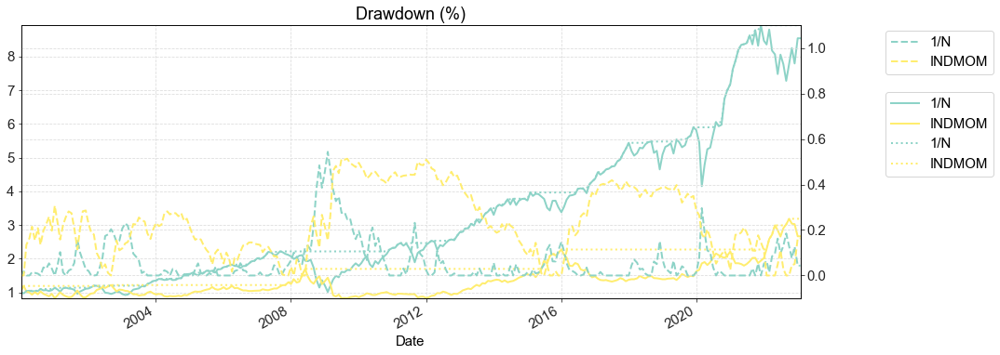

In [287]:
# print('Max Drawdowns: \n {}'.format(np.round(maxdrawdown(_BM_idx_monthly),3)*100))
# ax = (_BM_idx_monthly).plot(cmap='Set3', figsize=(15, 6), title='Drawdown (%)')
# ((_BM_idx_monthly).cummax(axis=0)).plot(ax=ax, cmap='Set3', linestyle = 'dotted', linewidth = 2)
# # plot the drawdown as a dashed line on a second y-axis
# ax2 = ax.twinx()  # create a second y-axis
# (-1*((drawdown(_BM_idx_monthly)[0]))).plot(ax=ax2, cmap='Set3', linestyle='--')
# ax2.set_ylim([-0.1, 1.1])  # set the limits of the second axis
# ax.legend( loc='center left', bbox_to_anchor=(1.1, 0.6))
# ax2.legend(loc='center left', bbox_to_anchor=(1.1, 0.9))
# plt.show()


#### MVO No Corr

In [ ]:
_MVO_no_corr_daily

#### In Sample

In [ ]:
eq1_EPO_daily
eq2_EPO_daily
eq3_EPO_daily
eq4_EPO_daily
eq5_EPO_daily
eq6_EPO_daily
eq7_EPO_daily

#### OOS

In [ ]:
eq1_OOS_daily
eq2_OOS_daily
eq3_OOS_daily
eq4_OOS_daily
eq5_OOS_daily
eq6_OOS_daily
eq7_OOS_daily

### Monthly Series

#### 1/N

In [3596]:
_ts_1N_monthly = pd.DataFrame(_pf_1N_monthly-1)
_ts_1N_monthly.columns = ['1/N']
_ts_1N_idx_monthly = (1+_ts_1N_monthly).cumprod()
_1N_DD = pd.DataFrame(-1*drawdown(_ts_1N_idx_monthly)[0])
_1N_MDD = _1N_DD.max()
_1N_MDD


1/N    0.543547
dtype: float64

In [3597]:
_temp_series = _ts_1N_monthly.copy().replace(np.nan,0)

for suffix in suffixes:
    var_name = '_ts_1N' + suffix
    if suffix == '_DD':
        setattr(sys.modules[__name__], var_name, drawdown((1+_temp_series).cumprod(axis=0))[0])
    elif suffix == '_MDD':
        setattr(sys.modules[__name__], var_name, (drawdown((1+_temp_series).cumprod(axis=0))[0]).min(axis=0))
    elif suffix == '_AnnVol':
        setattr(sys.modules[__name__], var_name, _temp_series.std(axis=0)*np.sqrt(12))
    elif suffix == '_AnnRet':
        setattr(sys.modules[__name__], var_name, _temp_series.mean(axis=0)*12)
    elif suffix == '_AnnGeomRet':
        setattr(sys.modules[__name__], var_name, pd.DataFrame(((stats.gmean(1+_temp_series,axis=0))**(12)-1), index = _temp_series.columns ))
    elif suffix == '_VaR':
        setattr(sys.modules[__name__], var_name, -calculate_value_at_risk(_temp_series,p=_VaR_alpha))
    elif suffix == '_ES':
        setattr(sys.modules[__name__], var_name, -np.mean(_temp_series[_temp_series.subtract(calculate_value_at_risk(_temp_series,p=_VaR_alpha),axis=1) < 0],axis=0))
    elif suffix == '_sortino':
        setattr(sys.modules[__name__], var_name, np.sqrt(12)*_temp_series.mean(axis=0)/((_temp_series[_temp_series <= 0]).std(axis=0)))
    elif suffix == '_skew':
        setattr(sys.modules[__name__], var_name, _temp_series.skew(axis=0))
    elif suffix == '_kurtosis':
        setattr(sys.modules[__name__], var_name, _temp_series.kurtosis(axis=0))
    elif suffix == '_cumret':
        setattr(sys.modules[__name__], var_name, ((1+_temp_series).cumprod(axis=0)-1).iloc[-1,:])
    else:
        print('Suffix not recognized:', suffix)


#### INDMOM

In [3598]:
_ts_INDMOM_monthly = pd.DataFrame(_pf_INDMOM_monthly-1)
_ts_INDMOM_monthly.columns = ['INDMOM']
_ts_INDMOM_idx_monthly = (1+_ts_INDMOM_monthly).cumprod()
_INDMOM_DD = pd.DataFrame(-1*drawdown(_ts_INDMOM_idx_monthly)[0])
_INDMOM_MDD = _INDMOM_DD.max()
_INDMOM_MDD

INDMOM    0.282388
dtype: float64

In [ ]:
# _ts_INDMOM_monthly = pd.DataFrame(_pf_INDMOM_monthly-1)
# _ts_INDMOM_monthly.columns = ['INDMOM']
# _ts_INDMOM_idx_monthly = (1+_ts_INDMOM_monthly).cumprod()
# _INDMOM_DD = pd.DataFrame(-1*drawdown(_ts_INDMOM_idx_monthly)[0])
# _INDMOM_MDD = _INDMOM_DD.max()
# _INDMOM_MDD

INDMOM    0.513273
dtype: float64

<AxesSubplot:title={'center':'Monthly returns (%)'}, xlabel='Month', ylabel='Year'>

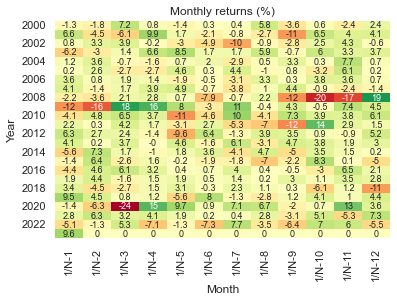

In [3412]:
pyf.plot_monthly_returns_heatmap(_ts_1N_monthly)

In [3599]:
_INDMOM_VaR_monthly = calculate_value_at_risk(x=_ts_INDMOM_monthly,p=_VaR_alpha) #np.percentile(_BM_monthly, 1 ,axis=0)
_INDMOM_ES_monthly = np.mean(_ts_INDMOM_monthly[_ts_INDMOM_monthly.subtract(_INDMOM_VaR_monthly,axis=1) <= 0],axis=0)

print('VaR(99%): \n {} '.format(np.round(_INDMOM_VaR_monthly,3)*100))
print('ES(99%): \n {}'.format( np.round(_INDMOM_ES_monthly,3)*100))

VaR(99%): 
 [-6.8] 
ES(99%): 
 INDMOM   -9.4
dtype: float64


In [3600]:
_temp_series = _ts_INDMOM_monthly.copy().replace(np.nan,0)

for suffix in suffixes:
    var_name = '_ts_INDMOM' + suffix
    if suffix == '_DD':
        setattr(sys.modules[__name__], var_name, drawdown((1+_temp_series).cumprod(axis=0))[0])
    elif suffix == '_MDD':
        setattr(sys.modules[__name__], var_name, (drawdown((1+_temp_series).cumprod(axis=0))[0]).min(axis=0))
    elif suffix == '_AnnVol':
        setattr(sys.modules[__name__], var_name, _temp_series.std(axis=0)*np.sqrt(12))
    elif suffix == '_AnnRet':
        setattr(sys.modules[__name__], var_name, _temp_series.mean(axis=0)*12)
    elif suffix == '_AnnGeomRet':
        setattr(sys.modules[__name__], var_name, pd.DataFrame(((stats.gmean(1+_temp_series,axis=0))**(12)-1), index = _temp_series.columns ))
    elif suffix == '_VaR':
        setattr(sys.modules[__name__], var_name, -calculate_value_at_risk(_temp_series,p=_VaR_alpha))
    elif suffix == '_ES':
        setattr(sys.modules[__name__], var_name, -np.mean(_temp_series[_temp_series.subtract(calculate_value_at_risk(_temp_series,p=_VaR_alpha),axis=1) < 0],axis=0))
    elif suffix == '_sortino':
        setattr(sys.modules[__name__], var_name, np.sqrt(12)*_temp_series.mean(axis=0)/((_temp_series[_temp_series <= 0]).std(axis=0)))
    elif suffix == '_skew':
        setattr(sys.modules[__name__], var_name, _temp_series.skew(axis=0))
    elif suffix == '_kurtosis':
        setattr(sys.modules[__name__], var_name, _temp_series.kurtosis(axis=0))
    elif suffix == '_cumret':
        setattr(sys.modules[__name__], var_name, ((1+_temp_series).cumprod(axis=0)-1).iloc[-1,:])
    else:
        print('Suffix not recognized:', suffix)


#### In sample Portfolios

In [746]:
eq1_EPO_monthly
eq2_EPO_monthly
eq3_EPO_monthly
eq4_EPO_monthly
eq5_EPO_monthly
eq6_EPO_monthly
eq7_EPO_monthly

,w = 0,w = 0.1,w = 0.25,w = 0.5,w = 0.75,w = 0.8,w = 0.9,w = 0.99,w = 1
Date,,,,,,,,,
2000-01-03,0.014816,0.014347,0.013548,0.012408,0.012788,0.012813,0.009382,-0.006736,-0.008485
2000-02-01,0.050671,0.052359,0.0549,0.059104,0.061086,0.060064,0.046522,-0.00501,-0.010188
2000-03-01,-0.055818,-0.060556,-0.065131,-0.069011,-0.062979,-0.056972,-0.019608,0.058416,0.063309
2000-04-03,-0.005468,-0.006953,-0.008667,-0.010979,-0.011927,-0.011422,-0.006609,0.004712,0.005564
2000-05-01,-0.000927,-0.001566,-0.003281,-0.007932,-0.015559,-0.017711,-0.022457,-0.017407,-0.016441
...,...,...,...,...,...,...,...,...,...
2022-10-03,0.010931,0.01253,0.014758,0.019213,0.026424,0.02927,0.046544,0.073311,0.071297
2022-11-01,-0.019841,-0.022248,-0.024198,-0.025227,-0.023125,-0.021198,-0.005503,0.052668,0.055927
2022-12-01,-0.006696,-0.006828,-0.006919,-0.007157,-0.012399,-0.016475,-0.040545,-0.067062,-0.063035


In [3601]:
_temp_series = eq1_EPO_monthly.copy().replace(np.nan,0)

for suffix in suffixes:
    var_name = 'eq1_EPO' + suffix
    if suffix == '_DD':
        setattr(sys.modules[__name__], var_name, drawdown((1+_temp_series).cumprod(axis=0))[0])
    elif suffix == '_MDD':
        setattr(sys.modules[__name__], var_name, (drawdown((1+_temp_series).cumprod(axis=0))[0]).min(axis=0))
    elif suffix == '_AnnVol':
        setattr(sys.modules[__name__], var_name, _temp_series.std(axis=0)*np.sqrt(12))
    elif suffix == '_AnnRet':
        setattr(sys.modules[__name__], var_name, _temp_series.mean(axis=0)*12)
    elif suffix == '_AnnGeomRet':
        setattr(sys.modules[__name__], var_name, pd.DataFrame(((stats.gmean(1+_temp_series,axis=0))**(12)-1), index = _temp_series.columns ))
    elif suffix == '_VaR':
        setattr(sys.modules[__name__], var_name, -calculate_value_at_risk(_temp_series,p=_VaR_alpha))
    elif suffix == '_ES':
        setattr(sys.modules[__name__], var_name, -np.mean(_temp_series[_temp_series.subtract(calculate_value_at_risk(_temp_series,p=_VaR_alpha),axis=1) < 0],axis=0))
    elif suffix == '_sortino':
        setattr(sys.modules[__name__], var_name, np.sqrt(12)*_temp_series.mean(axis=0)/((_temp_series[_temp_series <= 0]).std(axis=0)))
    elif suffix == '_skew':
        setattr(sys.modules[__name__], var_name, _temp_series.skew(axis=0))
    elif suffix == '_kurtosis':
        setattr(sys.modules[__name__], var_name, _temp_series.kurtosis(axis=0))
    elif suffix == '_cumret':
        setattr(sys.modules[__name__], var_name, ((1+_temp_series).cumprod(axis=0)-1).iloc[-1,:])
    else:
        print('Suffix not recognized:', suffix)


In [3602]:
_temp_series = eq2_EPO_monthly.copy().replace(np.nan,0)

for suffix in suffixes:
    var_name = 'eq2_EPO' + suffix
    if suffix == '_DD':
        setattr(sys.modules[__name__], var_name, drawdown((1+_temp_series).cumprod(axis=0))[0])
    elif suffix == '_MDD':
        setattr(sys.modules[__name__], var_name, (drawdown((1+_temp_series).cumprod(axis=0))[0]).min(axis=0))
    elif suffix == '_AnnVol':
        setattr(sys.modules[__name__], var_name, _temp_series.std(axis=0)*np.sqrt(12))
    elif suffix == '_AnnRet':
        setattr(sys.modules[__name__], var_name, _temp_series.mean(axis=0)*12)
    elif suffix == '_AnnGeomRet':
        setattr(sys.modules[__name__], var_name, pd.DataFrame(((stats.gmean(1+_temp_series,axis=0))**(12)-1), index = _temp_series.columns ))
    elif suffix == '_VaR':
        setattr(sys.modules[__name__], var_name, -calculate_value_at_risk(_temp_series,p=_VaR_alpha))
    elif suffix == '_ES':
        setattr(sys.modules[__name__], var_name, -np.mean(_temp_series[_temp_series.subtract(calculate_value_at_risk(_temp_series,p=_VaR_alpha),axis=1) < 0],axis=0))
    elif suffix == '_sortino':
        setattr(sys.modules[__name__], var_name, np.sqrt(12)*_temp_series.mean(axis=0)/((_temp_series[_temp_series <= 0]).std(axis=0)))
    elif suffix == '_skew':
        setattr(sys.modules[__name__], var_name, _temp_series.skew(axis=0))
    elif suffix == '_kurtosis':
        setattr(sys.modules[__name__], var_name, _temp_series.kurtosis(axis=0))
    elif suffix == '_cumret':
        setattr(sys.modules[__name__], var_name, ((1+_temp_series).cumprod(axis=0)-1).iloc[-1,:])
    else:
        print('Suffix not recognized:', suffix)


In [3603]:
_temp_series = eq3_EPO_monthly.copy().replace(np.nan,0)

for suffix in suffixes:
    var_name = 'eq3_EPO' + suffix
    if suffix == '_DD':
        setattr(sys.modules[__name__], var_name, drawdown((1+_temp_series).cumprod(axis=0))[0])
    elif suffix == '_MDD':
        setattr(sys.modules[__name__], var_name, (drawdown((1+_temp_series).cumprod(axis=0))[0]).min(axis=0))
    elif suffix == '_AnnVol':
        setattr(sys.modules[__name__], var_name, _temp_series.std(axis=0)*np.sqrt(12))
    elif suffix == '_AnnRet':
        setattr(sys.modules[__name__], var_name, _temp_series.mean(axis=0)*12)
    elif suffix == '_AnnGeomRet':
        setattr(sys.modules[__name__], var_name, pd.DataFrame(((stats.gmean(1+_temp_series,axis=0))**(12)-1), index = _temp_series.columns ))
    elif suffix == '_VaR':
        setattr(sys.modules[__name__], var_name, -calculate_value_at_risk(_temp_series,p=_VaR_alpha))
    elif suffix == '_ES':
        setattr(sys.modules[__name__], var_name, -np.mean(_temp_series[_temp_series.subtract(calculate_value_at_risk(_temp_series,p=_VaR_alpha),axis=1) < 0],axis=0))
    elif suffix == '_sortino':
        setattr(sys.modules[__name__], var_name, np.sqrt(12)*_temp_series.mean(axis=0)/((_temp_series[_temp_series <= 0]).std(axis=0)))
    elif suffix == '_skew':
        setattr(sys.modules[__name__], var_name, _temp_series.skew(axis=0))
    elif suffix == '_kurtosis':
        setattr(sys.modules[__name__], var_name, _temp_series.kurtosis(axis=0))
    elif suffix == '_cumret':
        setattr(sys.modules[__name__], var_name, ((1+_temp_series).cumprod(axis=0)-1).iloc[-1,:])
    else:
        print('Suffix not recognized:', suffix)


In [3604]:
_temp_series = eq4_EPO_monthly.copy().replace(np.nan,0)

for suffix in suffixes:
    var_name = 'eq4_EPO' + suffix
    if suffix == '_DD':
        setattr(sys.modules[__name__], var_name, drawdown((1+_temp_series).cumprod(axis=0))[0])
    elif suffix == '_MDD':
        setattr(sys.modules[__name__], var_name, (drawdown((1+_temp_series).cumprod(axis=0))[0]).min(axis=0))
    elif suffix == '_AnnVol':
        setattr(sys.modules[__name__], var_name, _temp_series.std(axis=0)*np.sqrt(12))
    elif suffix == '_AnnRet':
        setattr(sys.modules[__name__], var_name, _temp_series.mean(axis=0)*12)
    elif suffix == '_AnnGeomRet':
        setattr(sys.modules[__name__], var_name, pd.DataFrame(((stats.gmean(1+_temp_series,axis=0))**(12)-1), index = _temp_series.columns ))
    elif suffix == '_VaR':
        setattr(sys.modules[__name__], var_name, -calculate_value_at_risk(_temp_series,p=_VaR_alpha))
    elif suffix == '_ES':
        setattr(sys.modules[__name__], var_name, -np.mean(_temp_series[_temp_series.subtract(calculate_value_at_risk(_temp_series,p=_VaR_alpha),axis=1) < 0],axis=0))
    elif suffix == '_sortino':
        setattr(sys.modules[__name__], var_name, np.sqrt(12)*_temp_series.mean(axis=0)/((_temp_series[_temp_series <= 0]).std(axis=0)))
    elif suffix == '_skew':
        setattr(sys.modules[__name__], var_name, _temp_series.skew(axis=0))
    elif suffix == '_kurtosis':
        setattr(sys.modules[__name__], var_name, _temp_series.kurtosis(axis=0))
    elif suffix == '_cumret':
        setattr(sys.modules[__name__], var_name, ((1+_temp_series).cumprod(axis=0)-1).iloc[-1,:])
    else:
        print('Suffix not recognized:', suffix)


In [3605]:
_temp_series = eq5_EPO_monthly.copy().replace(np.nan,0)

for suffix in suffixes:
    var_name = 'eq5_EPO' + suffix
    if suffix == '_DD':
        setattr(sys.modules[__name__], var_name, drawdown((1+_temp_series).cumprod(axis=0))[0])
    elif suffix == '_MDD':
        setattr(sys.modules[__name__], var_name, (drawdown((1+_temp_series).cumprod(axis=0))[0]).min(axis=0))
    elif suffix == '_AnnVol':
        setattr(sys.modules[__name__], var_name, _temp_series.std(axis=0)*np.sqrt(12))
    elif suffix == '_AnnRet':
        setattr(sys.modules[__name__], var_name, _temp_series.mean(axis=0)*12)
    elif suffix == '_AnnGeomRet':
        setattr(sys.modules[__name__], var_name, pd.DataFrame(((stats.gmean(1+_temp_series,axis=0))**(12)-1), index = _temp_series.columns ))
    elif suffix == '_VaR':
        setattr(sys.modules[__name__], var_name, -calculate_value_at_risk(_temp_series,p=_VaR_alpha))
    elif suffix == '_ES':
        setattr(sys.modules[__name__], var_name, -np.mean(_temp_series[_temp_series.subtract(calculate_value_at_risk(_temp_series,p=_VaR_alpha),axis=1) < 0],axis=0))
    elif suffix == '_sortino':
        setattr(sys.modules[__name__], var_name, np.sqrt(12)*_temp_series.mean(axis=0)/((_temp_series[_temp_series <= 0]).std(axis=0)))
    elif suffix == '_skew':
        setattr(sys.modules[__name__], var_name, _temp_series.skew(axis=0))
    elif suffix == '_kurtosis':
        setattr(sys.modules[__name__], var_name, _temp_series.kurtosis(axis=0))
    elif suffix == '_cumret':
        setattr(sys.modules[__name__], var_name, ((1+_temp_series).cumprod(axis=0)-1).iloc[-1,:])
    else:
        print('Suffix not recognized:', suffix)


In [3606]:
_temp_series = eq6_EPO_monthly.copy().replace(np.nan,0)

for suffix in suffixes:
    var_name = 'eq6_EPO' + suffix
    if suffix == '_DD':
        setattr(sys.modules[__name__], var_name, drawdown((1+_temp_series).cumprod(axis=0))[0])
    elif suffix == '_MDD':
        setattr(sys.modules[__name__], var_name, (drawdown((1+_temp_series).cumprod(axis=0))[0]).min(axis=0))
    elif suffix == '_AnnVol':
        setattr(sys.modules[__name__], var_name, _temp_series.std(axis=0)*np.sqrt(12))
    elif suffix == '_AnnRet':
        setattr(sys.modules[__name__], var_name, _temp_series.mean(axis=0)*12)
    elif suffix == '_AnnGeomRet':
        setattr(sys.modules[__name__], var_name, pd.DataFrame(((stats.gmean(1+_temp_series,axis=0))**(12)-1), index = _temp_series.columns ))
    elif suffix == '_VaR':
        setattr(sys.modules[__name__], var_name, -calculate_value_at_risk(_temp_series,p=_VaR_alpha))
    elif suffix == '_ES':
        setattr(sys.modules[__name__], var_name, -np.mean(_temp_series[_temp_series.subtract(calculate_value_at_risk(_temp_series,p=_VaR_alpha),axis=1) < 0],axis=0))
    elif suffix == '_sortino':
        setattr(sys.modules[__name__], var_name, np.sqrt(12)*_temp_series.mean(axis=0)/((_temp_series[_temp_series <= 0]).std(axis=0)))
    elif suffix == '_skew':
        setattr(sys.modules[__name__], var_name, _temp_series.skew(axis=0))
    elif suffix == '_kurtosis':
        setattr(sys.modules[__name__], var_name, _temp_series.kurtosis(axis=0))
    elif suffix == '_cumret':
        setattr(sys.modules[__name__], var_name, ((1+_temp_series).cumprod(axis=0)-1).iloc[-1,:])
    else:
        print('Suffix not recognized:', suffix)


In [3607]:
_temp_series = eq7_EPO_monthly.copy().replace(np.nan,0)

for suffix in suffixes:
    var_name = 'eq7_EPO' + suffix
    if suffix == '_DD':
        setattr(sys.modules[__name__], var_name, drawdown((1+_temp_series).cumprod(axis=0))[0])
    elif suffix == '_MDD':
        setattr(sys.modules[__name__], var_name, (drawdown((1+_temp_series).cumprod(axis=0))[0]).min(axis=0))
    elif suffix == '_AnnVol':
        setattr(sys.modules[__name__], var_name, _temp_series.std(axis=0)*np.sqrt(12))
    elif suffix == '_AnnRet':
        setattr(sys.modules[__name__], var_name, _temp_series.mean(axis=0)*12)
    elif suffix == '_AnnGeomRet':
        setattr(sys.modules[__name__], var_name, pd.DataFrame(((stats.gmean(1+_temp_series,axis=0))**(12)-1), index = _temp_series.columns ))
    elif suffix == '_VaR':
        setattr(sys.modules[__name__], var_name, -calculate_value_at_risk(_temp_series,p=_VaR_alpha))
    elif suffix == '_ES':
        setattr(sys.modules[__name__], var_name, -np.mean(_temp_series[_temp_series.subtract(calculate_value_at_risk(_temp_series,p=_VaR_alpha),axis=1) < 0],axis=0))
    elif suffix == '_sortino':
        setattr(sys.modules[__name__], var_name, np.sqrt(12)*_temp_series.mean(axis=0)/((_temp_series[_temp_series <= 0]).std(axis=0)))
    elif suffix == '_skew':
        setattr(sys.modules[__name__], var_name, _temp_series.skew(axis=0))
    elif suffix == '_kurtosis':
        setattr(sys.modules[__name__], var_name, _temp_series.kurtosis(axis=0))
    elif suffix == '_cumret':
        setattr(sys.modules[__name__], var_name, ((1+_temp_series).cumprod(axis=0)-1).iloc[-1,:])
    else:
        print('Suffix not recognized:', suffix)


#### Out of sample Portfolios

In [3608]:
_agg_OOS_monthly

,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
Date,,,,,,,
2000-01-03,0.014816,0.007989,0.018962,0.012068,0.024643,0.008242,0.012106
2000-02-01,0.050671,0.058334,0.036474,0.065519,0.066838,0.055638,0.056799
2000-03-01,-0.055818,-0.030456,-0.038694,-0.070368,-0.067567,-0.039038,-0.044517
2000-04-03,-0.005468,-0.003068,0.002378,-0.017433,-0.016680,-0.008880,-0.006609
2000-05-01,-0.000927,0.003962,0.010511,0.008483,-0.030314,-0.024284,-0.022457
...,...,...,...,...,...,...,...
2022-09-01,0.009261,0.000667,0.003506,-0.000214,-0.000041,-0.014148,0.006709
2022-10-03,0.010931,0.022283,0.014814,0.007559,-0.001624,0.056138,0.034387
2022-11-01,-0.019841,-0.018805,-0.015832,-0.017394,-0.014626,-0.010520,-0.016815


In [1029]:
_temp_series = _agg_OOS_monthly.copy().replace(np.nan,0)

for suffix in suffixes:
    var_name = '_agg_OOS' + suffix
    if suffix == '_DD':
        setattr(sys.modules[__name__], var_name, drawdown((1+_temp_series).cumprod(axis=0))[0])
    elif suffix == '_MDD':
        setattr(sys.modules[__name__], var_name, (drawdown((1+_temp_series).cumprod(axis=0))[0]).min(axis=0))
    elif suffix == '_AnnVol':
        setattr(sys.modules[__name__], var_name, _temp_series.std(axis=0)*np.sqrt(12))
    elif suffix == '_AnnRet':
        setattr(sys.modules[__name__], var_name, _temp_series.mean(axis=0)*12)
    elif suffix == '_AnnGeomRet':
        setattr(sys.modules[__name__], var_name, pd.DataFrame(((stats.gmean(1+_temp_series,axis=0))**(12)-1), index = _temp_series.columns ))
    elif suffix == '_VaR':
        setattr(sys.modules[__name__], var_name, -calculate_value_at_risk(_temp_series,p=_VaR_alpha))
    elif suffix == '_ES':
        setattr(sys.modules[__name__], var_name, -np.mean(_temp_series[_temp_series.subtract(calculate_value_at_risk(_temp_series,p=_VaR_alpha),axis=1) < 0],axis=0))
    elif suffix == '_sortino':
        setattr(sys.modules[__name__], var_name, np.sqrt(12)*_temp_series.mean(axis=0)/((_temp_series[_temp_series <= 0]).std(axis=0)))
    elif suffix == '_skew':
        setattr(sys.modules[__name__], var_name, _temp_series.skew(axis=0))
    elif suffix == '_kurtosis':
        setattr(sys.modules[__name__], var_name, _temp_series.kurtosis(axis=0))
    elif suffix == '_cumret':
        setattr(sys.modules[__name__], var_name, ((1+_temp_series).cumprod(axis=0)-1).iloc[-1,:])
    else:
        print('Suffix not recognized:', suffix)


#### MVO - No Corr Shrinkage

In [863]:
#_MVO_no_corr_monthly

In [3609]:
_temp_series = _MVO_no_corr_monthly.copy()

In [3610]:
_MVO_no_corr_DD = drawdown((1+_temp_series).cumprod(axis=0))[0]
_MVO_no_corr_MDD = (drawdown((1+_temp_series).cumprod(axis=0))[0]).min(axis=0)

_MVO_no_corr_AnnVol = _temp_series.std(axis=0)*np.sqrt(12)
_MVO_no_corr_AnnRet = _temp_series.mean(axis=0)*12
_MVO_no_corr_AnnGeomRet = pd.DataFrame(((stats.gmean(1+_temp_series,axis=0))**(12)-1), index = _temp_series.columns )

_MVO_no_corr_VaR = -calculate_value_at_risk(_temp_series,p=_VaR_alpha)  #np.percentile(_temp_series, _VaR_alpha*100,axis=0)
_MVO_no_corr_ES = -np.mean(_temp_series[_temp_series.subtract(calculate_value_at_risk(_temp_series,p=_VaR_alpha),axis=1) < 0].replace(np.nan,0),axis=0)

_MVO_no_corr_sortino = np.sqrt(12)*_temp_series.mean(axis=0)/((_temp_series[_temp_series <= 0]).std(axis=0))

_MVO_no_corr_skew = _temp_series.skew(axis=0)
_MVO_no_corr_kurtosis = _temp_series.kurtosis(axis=0)

_MVO_no_corr_cumret = ((1+_temp_series).cumprod(axis=0)-1).iloc[-1,:]

Drawdown & MDD

In [3611]:
_MVO_no_corr_DD
_MVO_no_corr_MDD

Eq1   -0.110842
Eq2   -0.067159
Eq3   -0.096669
Eq4   -0.088134
Eq5   -0.075779
Eq6   -0.110842
Eq7   -0.110842
dtype: float64

Ann Ret & Ann Vol

In [3612]:
_MVO_no_corr_AnnVol
_MVO_no_corr_AnnRet
_MVO_no_corr_AnnGeomRet

#compare to pyf.create_simple_tear_sheet(_MVO_no_corr_monthly.iloc[:,0]) vol
#(np.sqrt(12)/np.sqrt(252))*0.168

,0
Eq1,0.010099
Eq2,0.006603
Eq3,0.006426
Eq4,0.011293
Eq5,0.013234
Eq6,0.010099
Eq7,0.010099


VaR(99%) & ES(99%)

In [3613]:
_MVO_no_corr_VaR = -calculate_value_at_risk(_temp_series,p=_VaR_alpha)  #np.percentile(_temp_series, _VaR_alpha*100,axis=0)
_MVO_no_corr_ES = -np.mean(_temp_series[_temp_series.subtract(calculate_value_at_risk(_temp_series,p=_VaR_alpha),axis=1) < 0].replace(np.nan,0),axis=0)

Sortino

In [3614]:
_MVO_no_corr_sortino

Eq1    0.347554
Eq2    0.557697
Eq3    0.415757
Eq4    0.667291
Eq5    0.811279
Eq6    0.347554
Eq7    0.347554
dtype: float64

Pyfolio

Start date,2000-01-03
End date,2023-02-01
Total months,13
,Backtest
Annual return,21.4%
Cumulative returns,23.9%
Annual volatility,16.8%
Sharpe ratio,1.24
Calmar ratio,1.93
Stability,0.66
Max drawdown,-11.1%


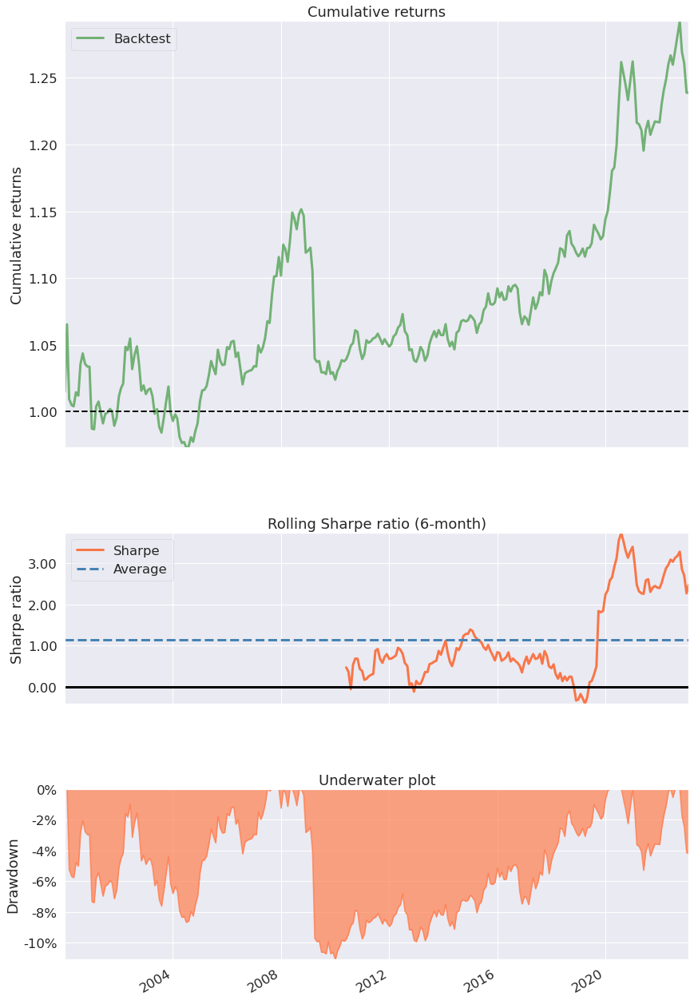

In [860]:
pyf.create_simple_tear_sheet(_MVO_no_corr_monthly.iloc[:,0])

## Performance Tables

### Daily

In [3615]:
_OOS_Perf_Daily = pd.concat([pyf.timeseries.perf_stats(eq1_OOS_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq2_OOS_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq3_OOS_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq4_OOS_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq5_OOS_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq6_OOS_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq7_OOS_daily.iloc[:,1])
        ],axis=1)

_OOS_Perf_Daily.columns = ['OOS Eq' + str(x) for x in range(1,8)]#['w = ' + str(x) for x in _w]

In [3616]:
_1N_Perf_Daily = pd.DataFrame(pyf.timeseries.perf_stats(_1N_daily.replace(np.nan,0)),columns = ['1N'])

_INDMOM_Perf_Daily = pd.DataFrame(pyf.timeseries.perf_stats(_INDMOM_daily.replace(np.nan,0)),columns=['INDMOM'])

In [3617]:
_MVO_no_corr_Perf_daily = pd.DataFrame()
for k in range(7):
    _MVO_no_corr_Perf_daily = pd.concat([_MVO_no_corr_Perf_daily,pyf.timeseries.perf_stats(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))],axis=1)

_MVO_no_corr_Perf_daily.columns = ['w = 0 (theta = 0) Eq' + str(x) for x in range(1,8)]

In [3618]:
_EPO_Perf_Daily = pd.DataFrame(index = pyf.timeseries.perf_stats(_1N_daily).index
                    ,columns= pd.MultiIndex.from_product([_colnames, ['Eq1', 'Eq2', 'Eq3', 'Eq4', 'Eq5', 'Eq6', 'Eq7']], names=['Weight', 'Equity']))

_temp_Perf_Daily=pd.DataFrame()
for [i, eq_EPO_daily] in enumerate([eq1_EPO_daily, eq2_EPO_daily, eq3_EPO_daily, eq4_EPO_daily, eq5_EPO_daily, eq6_EPO_daily, eq7_EPO_daily]):
    _temp_Perf_Daily=pd.DataFrame()
    for k in range(len(_colnames)):
        _temp_Perf_Daily = pd.concat([_temp_Perf_Daily, pyf.timeseries.perf_stats(eq_EPO_daily.iloc[:,k].replace(0,0.0))], axis=1)
    
    _EPO_Perf_Daily.iloc[:,i::7] = _temp_Perf_Daily.values

#### 1/N

In [ ]:
pyf.show_perf_stats(_1N_daily.replace(np.nan,0))
#pyf.create_simple_tear_sheet(_1N_daily.replace(np.nan,0))

Start date,2000-01-03
End date,2023-02-28
Total months,277
,Backtest
Annual return,9.7%
Cumulative returns,746.1%
Annual volatility,20.0%
Sharpe ratio,0.56
Calmar ratio,0.17
Stability,0.95
Max drawdown,-56.7%


In [2249]:
own_gen_drawdown_table(_1N_daily.replace(np.nan,0), top = 3)

,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,56.655094,2007-10-30,2009-03-06,2010-12-20,820
1,38.330156,2020-02-18,2020-03-20,2020-08-27,138
2,28.569703,2002-05-16,2002-10-08,2003-10-10,367


<AxesSubplot:title={'center':'Rolling volatility (6-month)'}, ylabel='Volatility'>

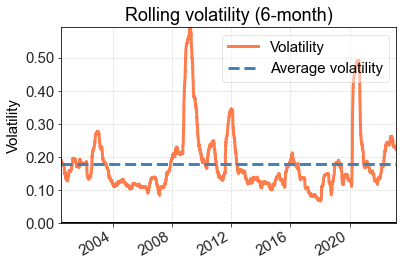

In [ ]:
pyf.plot_rolling_volatility(_1N_daily)

<AxesSubplot:title={'center':'Top 10 drawdown periods'}, ylabel='Cumulative returns'>

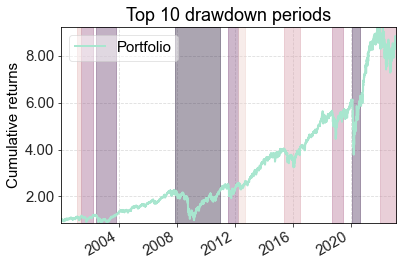

In [ ]:
own_plot_drawdown_periods(_1N_daily)

<AxesSubplot:title={'center':'Rolling Sharpe ratio (6-month)'}, ylabel='Sharpe ratio'>

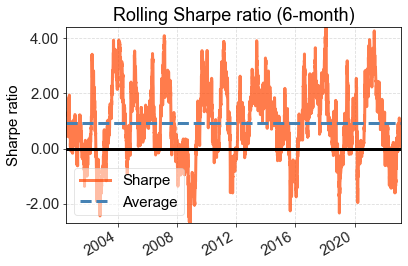

In [1391]:
pyf.plot_rolling_sharpe(_1N_daily)

<AxesSubplot:title={'center':'Return quantiles'}>

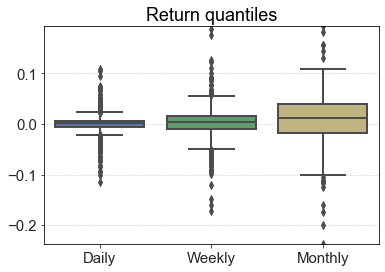

In [1388]:
pyf.plot_return_quantiles(_1N_daily)

<AxesSubplot:xlabel='Date'>

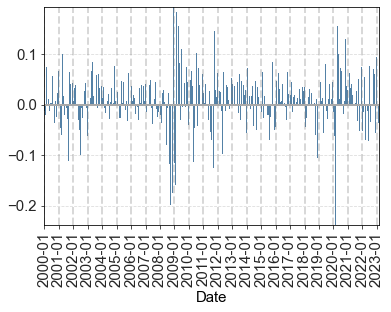

In [1387]:
pyf.plot_monthly_returns_timeseries(_1N_daily)

<AxesSubplot:title={'center':'Distribution of monthly returns'}, xlabel='Returns', ylabel='Number of months'>

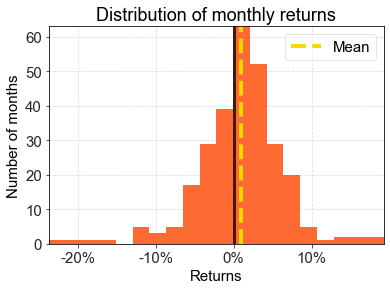

In [1385]:
pyf.plot_monthly_returns_dist(_1N_daily)

<AxesSubplot:title={'center':'Monthly returns (%)'}, xlabel='Month', ylabel='Year'>

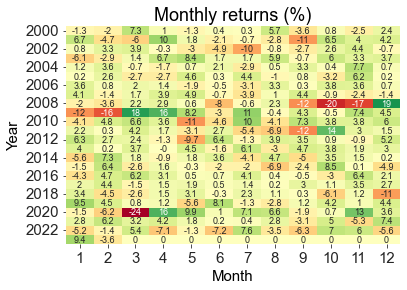

In [1386]:
pyf.plot_monthly_returns_heatmap(_1N_daily)

#### INDMOM

In [ ]:
pyf.show_perf_stats(_INDMOM_daily.replace(np.nan,0))
#pyf.create_simple_tear_sheet(_INDMOM_daily.replace(np.nan,0))

Start date,2000-01-03
End date,2023-02-28
Total months,277
,Backtest
Annual return,4.9%
Cumulative returns,199.1%
Annual volatility,20.9%
Sharpe ratio,0.33
Calmar ratio,0.09
Stability,0.69
Max drawdown,-52.9%


In [1449]:
own_gen_drawdown_table(_INDMOM_daily.replace(np.nan,0))

,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,52.914216,2008-07-11,2009-09-15,2015-06-24,1814
1,49.912104,2016-01-15,2017-07-28,2022-04-11,1627
2,38.139242,2000-03-09,2001-01-18,2002-09-20,662
3,31.683574,2002-09-23,2004-05-12,2007-12-07,1360
4,20.938134,2022-11-04,2023-02-01,NaT,NaN
5,17.135251,2022-06-09,2022-08-03,2022-10-06,86
6,13.135205,2022-04-14,2022-04-22,2022-05-20,27
7,12.737121,2008-01-14,2008-01-22,2008-02-27,33
8,11.790077,2008-03-05,2008-03-19,2008-04-11,28
9,10.931948,2015-08-06,2015-08-28,2015-09-21,33


<AxesSubplot:title={'center':'Rolling volatility (6-month)'}, ylabel='Volatility'>

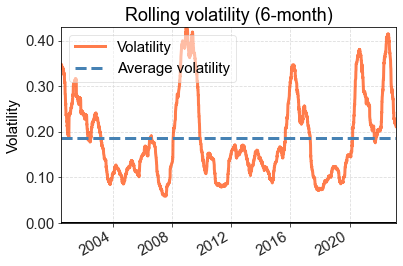

In [1450]:
pyf.plot_rolling_volatility(_INDMOM_daily)

<AxesSubplot:title={'center':'Top 10 drawdown periods'}, ylabel='Cumulative returns'>

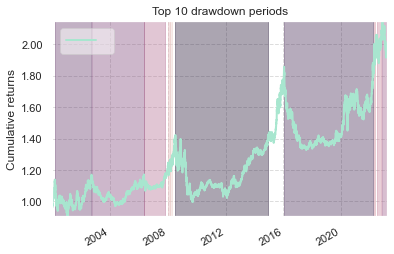

In [3417]:
own_plot_drawdown_periods(_INDMOM_daily)

#### MVO no Corr

##### Eq1

In [ ]:
k=0

In [ ]:
pyf.show_perf_stats(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))
#pyf.create_simple_tear_sheet(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

Start date,2000-01-03
End date,2023-02-28
Total months,277
,Backtest
Annual return,1.1%
Cumulative returns,29.1%
Annual volatility,3.4%
Sharpe ratio,0.34
Calmar ratio,0.09
Stability,0.76
Max drawdown,-11.9%


In [ ]:
own_gen_drawdown_table(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,11.946851,2008-11-18,2009-09-17,2020-02-28,2944
1,10.051505,2000-03-03,2004-08-24,2007-09-20,1970
2,5.836716,2021-01-07,2021-07-07,2022-06-08,370
3,4.960311,2022-11-02,2023-02-01,NaT,NaN
4,3.636908,2020-05-14,2020-06-05,2020-07-06,38
5,3.228066,2020-08-28,2020-11-13,2021-01-06,94
6,3.219484,2008-01-14,2008-01-30,2008-06-16,111
7,2.755125,2008-07-14,2008-09-05,2008-11-11,87
8,1.544166,2020-04-15,2020-04-28,2020-05-05,15
9,1.423263,2020-03-17,2020-03-25,2020-04-15,22


<AxesSubplot:title={'center':'Rolling volatility (6-month)'}, ylabel='Volatility'>

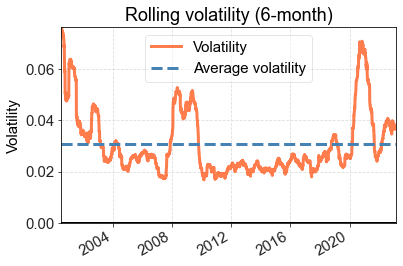

In [ ]:
pyf.plot_rolling_volatility(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

<AxesSubplot:title={'center':'Top 5 drawdown periods'}, ylabel='Cumulative returns'>

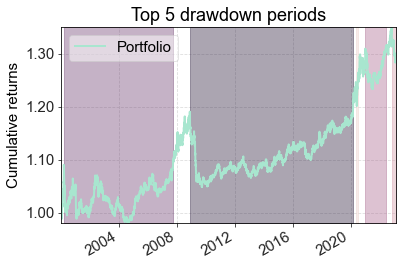

In [ ]:
own_plot_drawdown_periods(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0), top = 5)

##### Eq2

In [1479]:
k=1

In [ ]:
pyf.show_perf_stats(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))
#pyf.create_simple_tear_sheet(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

Start date,2000-01-03
End date,2023-02-28
Total months,277
,Backtest
Annual return,0.7%
Cumulative returns,16.9%
Annual volatility,2.1%
Sharpe ratio,0.33
Calmar ratio,0.09
Stability,0.75
Max drawdown,-7.9%


In [1480]:
own_gen_drawdown_table(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,7.884061,2008-07-09,2009-05-07,2015-02-04,1716
1,4.422632,2015-09-11,2019-05-10,NaT,NaN
2,2.960179,2000-12-07,2001-01-18,2001-06-14,136
3,2.821064,2001-06-15,2001-11-23,2002-08-06,298
4,2.744425,2003-04-21,2004-04-15,2005-01-13,454
5,2.719055,2000-08-22,2000-11-10,2000-12-07,78
6,1.812911,2015-02-25,2015-04-09,2015-08-19,126
7,1.72167,2006-02-03,2006-07-25,2006-11-06,197
8,1.58571,2000-01-06,2000-01-20,2000-02-10,26
9,1.419718,2000-03-03,2000-03-14,2000-04-11,28


<AxesSubplot:title={'center':'Rolling volatility (6-month)'}, ylabel='Volatility'>

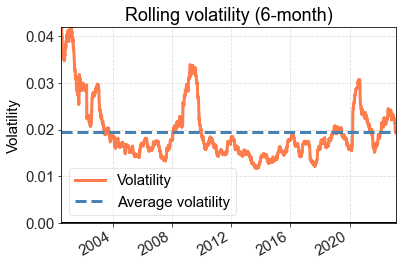

In [1481]:
pyf.plot_rolling_volatility(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

<AxesSubplot:title={'center':'Top 5 drawdown periods'}, ylabel='Cumulative returns'>

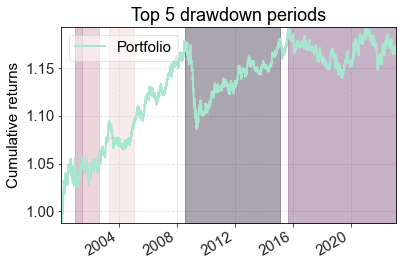

In [1482]:
own_plot_drawdown_periods(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0), top = 5)

##### Eq3

In [1484]:
k=2

In [ ]:
pyf.show_perf_stats(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))
#pyf.create_simple_tear_sheet(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

Start date,2000-01-03
End date,2023-02-28
Total months,277
,Backtest
Annual return,0.7%
Cumulative returns,16.5%
Annual volatility,2.2%
Sharpe ratio,0.30
Calmar ratio,0.07
Stability,0.38
Max drawdown,-9.6%


In [1485]:
own_gen_drawdown_table(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,9.565932,2002-09-26,2009-05-07,2020-08-13,4666
1,4.579331,2021-02-26,2021-11-18,2022-10-10,422
2,2.870572,2022-10-21,2023-02-21,NaT,NaN
3,2.835821,2000-03-03,2000-03-15,2000-06-14,74
4,2.213402,2020-08-14,2020-12-11,2021-02-26,141
5,1.662547,2000-10-13,2001-01-18,2001-03-15,110
6,1.492105,2001-11-09,2001-11-26,2002-01-08,43
7,1.448344,2000-08-18,2000-09-08,2000-09-18,22
8,1.404073,2001-06-04,2001-07-24,2001-09-27,84
9,1.342718,2002-06-18,2002-07-22,2002-07-31,32


<AxesSubplot:title={'center':'Rolling volatility (6-month)'}, ylabel='Volatility'>

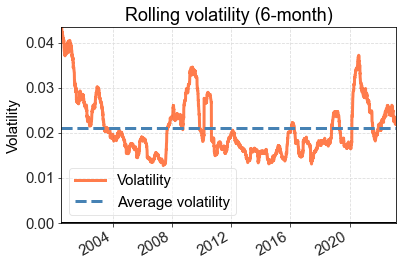

In [1486]:
pyf.plot_rolling_volatility(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

<AxesSubplot:title={'center':'Top 5 drawdown periods'}, ylabel='Cumulative returns'>

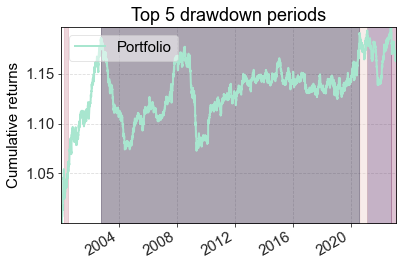

In [1487]:
own_plot_drawdown_periods(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0), top = 5)

##### Eq4

In [1489]:
k=3

In [ ]:
pyf.show_perf_stats(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))
#pyf.create_simple_tear_sheet(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

Start date,2000-01-03
End date,2023-02-28
Total months,277
,Backtest
Annual return,1.2%
Cumulative returns,30.7%
Annual volatility,2.2%
Sharpe ratio,0.53
Calmar ratio,0.13
Stability,0.77
Max drawdown,-8.9%


In [1490]:
own_gen_drawdown_table(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,8.851452,2002-10-18,2004-09-22,2008-06-17,1478
1,8.398792,2008-06-23,2009-06-22,2012-07-09,1056
2,4.45393,2016-01-14,2019-05-22,2020-03-04,1080
3,3.738639,2021-02-26,2021-12-07,2022-03-31,285
4,3.332004,2022-07-26,2023-02-21,NaT,NaN
5,2.151434,2000-03-03,2000-03-15,2000-04-14,31
6,2.116467,2015-01-27,2015-04-28,2015-08-04,136
7,1.841091,2002-06-18,2002-07-22,2002-08-06,36
8,1.818778,2020-03-20,2020-04-06,2020-07-09,80
9,1.654815,2001-06-28,2001-07-26,2001-09-10,53


<AxesSubplot:title={'center':'Rolling volatility (6-month)'}, ylabel='Volatility'>

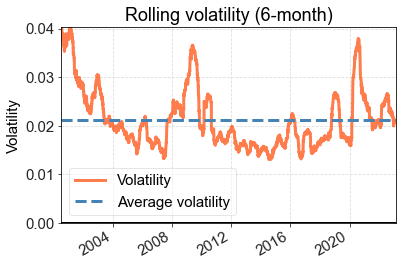

In [1491]:
pyf.plot_rolling_volatility(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

<AxesSubplot:title={'center':'Top 5 drawdown periods'}, ylabel='Cumulative returns'>

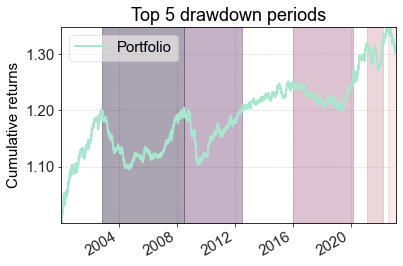

In [1492]:
own_plot_drawdown_periods(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0), top = 5)

##### Eq5

In [1494]:
k=4

In [ ]:
pyf.show_perf_stats(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))
#pyf.create_simple_tear_sheet(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

Start date,2000-01-03
End date,2023-02-28
Total months,277
,Backtest
Annual return,1.4%
Cumulative returns,37.0%
Annual volatility,2.2%
Sharpe ratio,0.62
Calmar ratio,0.18
Stability,0.82
Max drawdown,-7.5%


In [1495]:
own_gen_drawdown_table(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,7.492595,2002-04-22,2004-09-24,2007-12-03,1466
1,7.316286,2008-06-23,2009-06-22,2011-09-19,846
2,5.051032,2016-01-14,2019-05-22,2020-01-14,1044
3,3.582266,2022-07-26,2023-02-01,NaT,NaN
4,3.165593,2021-02-26,2021-07-02,2022-02-25,261
5,1.696812,2000-10-23,2000-12-01,2000-12-28,49
6,1.674702,2001-06-21,2001-08-10,2001-09-10,58
7,1.561352,2015-01-09,2015-04-29,2015-07-16,135
8,1.523211,2020-03-20,2020-04-06,2020-07-09,80
9,1.510576,2000-03-03,2000-03-15,2000-04-14,31


<AxesSubplot:title={'center':'Rolling volatility (6-month)'}, ylabel='Volatility'>

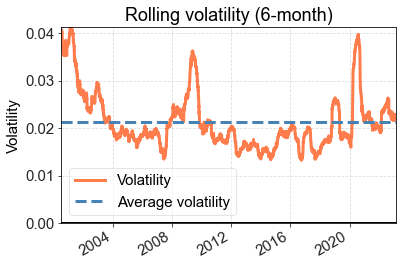

In [1496]:
pyf.plot_rolling_volatility(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

<AxesSubplot:title={'center':'Top 5 drawdown periods'}, ylabel='Cumulative returns'>

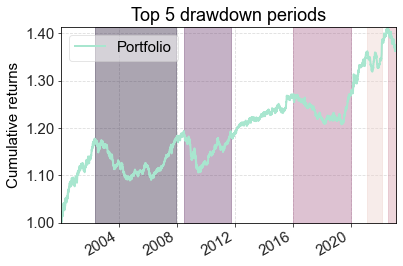

In [1497]:
own_plot_drawdown_periods(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0), top = 5)

##### Eq6

In [1499]:
k=5

In [ ]:
pyf.show_perf_stats(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))
#pyf.create_simple_tear_sheet(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

Start date,2000-01-03
End date,2023-02-28
Total months,277
,Backtest
Annual return,1.1%
Cumulative returns,29.1%
Annual volatility,3.4%
Sharpe ratio,0.34
Calmar ratio,0.09
Stability,0.76
Max drawdown,-11.9%


In [1500]:
own_gen_drawdown_table(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,11.946851,2008-11-18,2009-09-17,2020-02-28,2944
1,10.051505,2000-03-03,2004-08-24,2007-09-20,1970
2,5.836716,2021-01-07,2021-07-07,2022-06-08,370
3,4.960311,2022-11-02,2023-02-01,NaT,NaN
4,3.636908,2020-05-14,2020-06-05,2020-07-06,38
5,3.228066,2020-08-28,2020-11-13,2021-01-06,94
6,3.219484,2008-01-14,2008-01-30,2008-06-16,111
7,2.755125,2008-07-14,2008-09-05,2008-11-11,87
8,1.544166,2020-04-15,2020-04-28,2020-05-05,15
9,1.423263,2020-03-17,2020-03-25,2020-04-15,22


<AxesSubplot:title={'center':'Rolling volatility (6-month)'}, ylabel='Volatility'>

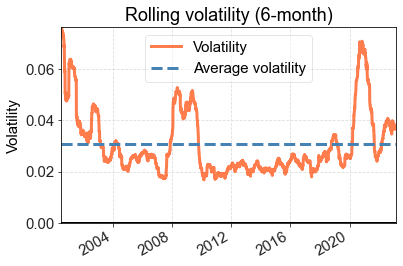

In [1501]:
pyf.plot_rolling_volatility(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

<AxesSubplot:title={'center':'Top 5 drawdown periods'}, ylabel='Cumulative returns'>

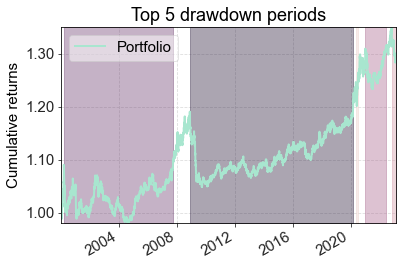

In [1502]:
own_plot_drawdown_periods(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0), top = 5)

##### Eq7

In [1504]:
k=6

In [ ]:
pyf.show_perf_stats(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))
#pyf.create_simple_tear_sheet(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

Start date,2000-01-03
End date,2023-02-28
Total months,277
,Backtest
Annual return,1.1%
Cumulative returns,29.1%
Annual volatility,3.4%
Sharpe ratio,0.34
Calmar ratio,0.09
Stability,0.76
Max drawdown,-11.9%


In [1505]:
own_gen_drawdown_table(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,11.946851,2008-11-18,2009-09-17,2020-02-28,2944
1,10.051505,2000-03-03,2004-08-24,2007-09-20,1970
2,5.836716,2021-01-07,2021-07-07,2022-06-08,370
3,4.960311,2022-11-02,2023-02-01,NaT,NaN
4,3.636908,2020-05-14,2020-06-05,2020-07-06,38
5,3.228066,2020-08-28,2020-11-13,2021-01-06,94
6,3.219484,2008-01-14,2008-01-30,2008-06-16,111
7,2.755125,2008-07-14,2008-09-05,2008-11-11,87
8,1.544166,2020-04-15,2020-04-28,2020-05-05,15
9,1.423263,2020-03-17,2020-03-25,2020-04-15,22


<AxesSubplot:title={'center':'Rolling volatility (6-month)'}, ylabel='Volatility'>

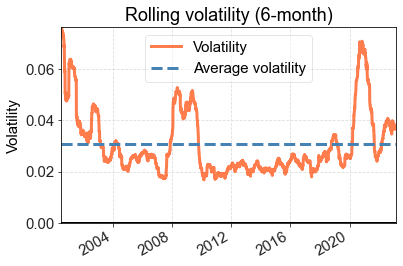

In [1506]:
pyf.plot_rolling_volatility(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0))

<AxesSubplot:title={'center':'Top 5 drawdown periods'}, ylabel='Cumulative returns'>

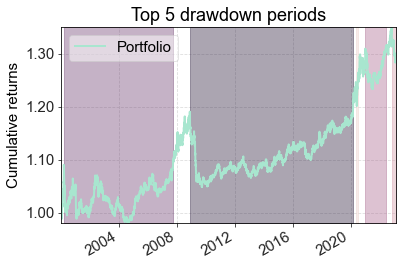

In [1507]:
own_plot_drawdown_periods(_MVO_no_corr_daily.iloc[:,k].replace(np.nan,0), top = 5)

#### In Sample

In [ ]:
eq1_EPO_daily
eq2_EPO_daily
eq3_EPO_daily
eq4_EPO_daily
eq5_EPO_daily
eq6_EPO_daily
eq7_EPO_daily

In [1846]:
pd.concat([pyf.timeseries.perf_stats(eq1_EPO_daily.iloc[:,0])
        ,pyf.timeseries.perf_stats(eq1_EPO_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq1_EPO_daily.iloc[:,2])
        ,pyf.timeseries.perf_stats(eq1_EPO_daily.iloc[:,3])
        ,pyf.timeseries.perf_stats(eq1_EPO_daily.iloc[:,4])
        ,pyf.timeseries.perf_stats(eq1_EPO_daily.iloc[:,5])
        ,pyf.timeseries.perf_stats(eq1_EPO_daily.iloc[:,6])
        ],axis=1)

,0,1,2,3,4,5,6
Annual return,0.012039,0.013266,0.014906,0.017243,0.019409,0.019754,0.020449
Cumulative returns,0.318731,0.356177,0.407861,0.484732,0.559592,0.571827,0.596794
Annual volatility,0.037746,0.042328,0.047335,0.053991,0.059991,0.061176,0.063612
Sharpe ratio,0.335943,0.332531,0.336291,0.343687,0.350496,0.350409,0.350105
Calmar ratio,0.091395,0.092122,0.098351,0.103929,0.109761,0.109943,0.108091
Stability,0.765867,0.787228,0.819984,0.853830,0.871639,0.873519,0.876290
Max drawdown,-0.131726,-0.143999,-0.151560,-0.165907,-0.176832,-0.179674,-0.189184
Omega ratio,1.062008,1.061436,1.062225,1.063825,1.065353,1.065387,1.065466
Sortino ratio,0.458637,0.452403,0.456298,0.465302,0.474591,0.474514,0.474370
Skew,-0.688454,-0.724970,-0.750089,-0.768276,-0.762765,-0.762570,-0.762680


#### OOS

In [2255]:
pd.concat([pyf.timeseries.perf_stats(eq1_OOS_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq2_OOS_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq3_OOS_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq4_OOS_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq5_OOS_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq6_OOS_daily.iloc[:,1])
        ,pyf.timeseries.perf_stats(eq7_OOS_daily.iloc[:,1])
        ],axis=1)

,0,1,2,3,4,5,6
Annual return,0.014283,0.015147,0.012410,0.017333,0.023318,0.058048,0.041679
Cumulative returns,0.388020,0.415612,0.329962,0.487774,0.703855,2.685893,1.570341
Annual volatility,0.043201,0.031769,0.029279,0.037468,0.058085,0.104483,0.087663
Sharpe ratio,0.349908,0.489109,0.435909,0.477413,0.425931,0.592473,0.509716
Calmar ratio,0.106525,0.112691,0.107434,0.129047,0.133400,0.242724,0.173310
Stability,0.821667,0.825885,0.730102,0.805187,0.856978,0.961426,0.897711
Max drawdown,-0.134083,-0.134413,-0.115516,-0.134313,-0.174795,-0.239153,-0.240488
Omega ratio,1.064243,1.090833,1.079905,1.093268,1.083093,1.112312,1.095774
Sortino ratio,0.480012,0.695315,0.623328,0.662951,0.587042,0.821419,0.715028
Skew,-0.548649,-0.159593,-0.084297,-0.903158,-0.609036,-0.570295,-0.322535


### Monthly

In [1083]:
pd.DataFrame(suffixes).T

,0,1,2,3,4,5,6,7,8,9,10
0,_DD,_MDD,_AnnVol,_AnnRet,_AnnGeomRet,_VaR,_ES,_sortino,_skew,_kurtosis,_cumret


#### Alpha, Coef & IR

In [1252]:
_agg_model

Annualized α (%)     INDMOM    Mkt-RF       SMB       HML  \
Eq1 Coefficients          0.890184   0.735225  0.048995 -0.091371 -0.104921   
    t_statistics          0.604529  18.189896  1.008873 -1.827864 -1.814355   
Eq2 Coefficients          0.324617   0.617616 -0.005822  0.014120 -0.147564   
    t_statistics          0.189680  13.147423 -0.103159  0.243046 -2.195613   
Eq3 Coefficients          1.531150   0.602307  0.061143  0.002832 -0.197044   
    t_statistics          0.878316  12.587018  1.063483  0.047860 -2.878199   
Eq4 Coefficients          1.523578   0.661835  0.022776 -0.070716 -0.079151   
    t_statistics          0.930727  14.729210  0.421867 -1.272544 -1.231235   
Eq5 Coefficients         -0.901037   0.901494  0.044852  0.034514 -0.051339   
    t_statistics         -0.938142  34.194884  1.415967  1.058588 -1.361137   
Eq6 Coefficients          6.167085   0.135636  0.049741 -0.124351 -0.095150   
    t_statistics          2.843876   2.278643  0.695497 -1.689191 -1.117283   
Eq7 Coefficients          4.833204   0.130427  0.045139 -0.138586 -0.115854   
    t_statistics          2.235468   2.197716  0.633042 -1.888223 -1.364484   

                       RMW       CMA  R2_adj (%)      σ(𝜖)  Annualized IR  
Eq1 Coefficients -0.073523  0.093660   55.816044  0.019154       0.134161  
    t_statistics -1.361988  1.641586         NaN       NaN       0.000000  
Eq2 Coefficients -0.082216  0.104219   40.317739  0.022261       0.042095  
    t_statistics -1.310451  1.571704         NaN       NaN       0.000000  
Eq3 Coefficients -0.009142  0.147248   38.075104  0.022676       0.194922  
    t_statistics -0.143045  2.179996         NaN       NaN       0.000000  
Eq4 Coefficients -0.008318  0.114415   45.396992  0.021293       0.206553  
    t_statistics -0.138611  1.803905         NaN       NaN       0.000000  
Eq5 Coefficients  0.048211  0.028626   81.202904  0.012493      -0.208199  
    t_statistics  1.369256  0.769230         NaN       NaN       0.000000  
Eq6 Coefficients -0.101637  0.154616    4.184475  0.028208       0.631132  
    t_statistics -1.278488  1.840170         NaN       NaN       0.000000  
Eq7 Coefficients -0.094869  0.185501    4.753313  0.028123       0.496110  
    t_statistics -1.196940  2.214379         NaN       NaN       0.000000

In [1253]:
_agg_model2

Annualized α (%)     INDMOM    Mkt-RF       SMB       HML  \
Eq1 Coefficients          0.880796   0.735308  0.051308 -0.092503 -0.103148   
    t_statistics          0.595902  18.155069  0.955860 -1.803386 -1.705356   
Eq2 Coefficients          0.328916   0.617578 -0.006882  0.014638 -0.148376   
    t_statistics          0.191465  13.119761 -0.110308  0.245547 -2.110696   
Eq3 Coefficients          1.370661   0.603718  0.100688 -0.016520 -0.166735   
    t_statistics          0.786447  12.641594  1.590839 -0.273144 -2.337884   
Eq4 Coefficients          1.535604   0.661729  0.019812 -0.069265 -0.081423   
    t_statistics          0.934549  14.697104  0.332022 -1.214714 -1.210945   
Eq5 Coefficients         -0.886393   0.901365  0.041243  0.036280 -0.054105   
    t_statistics         -0.919505  34.123813  1.178121  1.084511 -1.371583   
Eq6 Coefficients          6.451871   0.133132 -0.020431 -0.090010 -0.148933   
    t_statistics          2.988483   2.250485 -0.260589 -1.201406 -1.685820   
Eq7 Coefficients          5.069334   0.128351 -0.013044 -0.110113 -0.160448   
    t_statistics          2.349137   2.170623 -0.166448 -1.470377 -1.816970   

                       RMW       CMA       UMD  R2_adj (%)      σ(𝜖)  \
Eq1 Coefficients -0.074168  0.092468  0.005062   55.817747  0.019154   
    t_statistics -1.362147  1.584970  0.102016         NaN       NaN   
Eq2 Coefficients -0.081921  0.104765 -0.002318   40.318096  0.022261   
    t_statistics -1.294516  1.545079 -0.040190         NaN       NaN   
Eq3 Coefficients -0.020170  0.126875  0.086532   38.572789  0.022585   
    t_statistics -0.314161  1.844348  1.479036         NaN       NaN   
Eq4 Coefficients -0.007492  0.115942 -0.006484   45.399786  0.021293   
    t_statistics -0.123769  1.787690 -0.117557         NaN       NaN   
Eq5 Coefficients  0.049217  0.030485 -0.007896   81.207048  0.012492   
    t_statistics  1.385966  0.801200 -0.244000         NaN       NaN   
Eq6 Coefficients -0.082068  0.190769 -0.153551    5.751468  0.027976   
    t_statistics -1.031918  2.238734 -2.118742         NaN       NaN   
Eq7 Coefficients -0.078643  0.215477 -0.127316    5.830650  0.027964   
    t_statistics -0.989297  2.529810 -1.757531         NaN       NaN   

                  Annualized IR  
Eq1 Coefficients       0.132749  
    t_statistics       0.000000  
Eq2 Coefficients       0.042653  
    t_statistics       0.000000  
Eq3 Coefficients       0.175196  
    t_statistics       0.000000  
Eq4 Coefficients       0.208189  
    t_statistics       0.000000  
Eq5 Coefficients      -0.204838  
    t_statistics       0.000000  
Eq6 Coefficients       0.665743  
    t_statistics       0.000000  
Eq7 Coefficients       0.523316  
    t_statistics       0.000000

#### Cumulative Returns

In [1245]:
## ((1+_ts_1N_monthly).cumprod()-1).iloc[-1]
## ((1+_ts_INDMOM_monthly).cumprod()-1).iloc[-1]

intermed = pd.concat([pd.concat([((1+_ts_1N_monthly).cumprod()-1).iloc[-1], 
                ((1+_ts_INDMOM_monthly).cumprod()-1).iloc[-1]])] * (_Real_SR.shape[1]), axis=1, ignore_index=True)
intermed.columns = _Real_SR.columns
intermed2 = pd.concat([pd.DataFrame([((1+eq1_EPO_monthly).cumprod(axis=0)-1).iloc[-2,:]],index=['Eq1']).T,
pd.DataFrame([((1+eq2_EPO_monthly).cumprod(axis=0)-1).iloc[-2,:]],index=['Eq2']).T,
pd.DataFrame([((1+eq3_EPO_monthly).cumprod(axis=0)-1).iloc[-2,:]],index=['Eq3']).T,
pd.DataFrame([((1+eq4_EPO_monthly).cumprod(axis=0)-1).iloc[-2,:]],index=['Eq4']).T,
pd.DataFrame([((1+eq5_EPO_monthly).cumprod(axis=0)-1).iloc[-2,:]],index=['Eq5']).T,
pd.DataFrame([((1+eq6_EPO_monthly).cumprod(axis=0)-1).iloc[-2,:]],index=['Eq6']).T,
pd.DataFrame([((1+eq7_EPO_monthly).cumprod(axis=0)-1).iloc[-2,:]],index=['Eq7']).T],axis=1)

_Real_cumret = pd.concat([intermed,intermed2, pd.DataFrame([((1+_agg_OOS_monthly).cumprod(axis=0)-1).iloc[-2,:]],index = ['w = OOS']),
pd.DataFrame([((1+_MVO_no_corr_monthly).cumprod(axis=0)-1).iloc[-1,:]], index = ['w = 0 (theta = 0)'])]
,axis=0)

In [1248]:
_temp_plot = _Real_cumret.copy()
print('Mean across all Portfolios = {}'.format(np.round(_temp_plot.mean(axis=1).mean(),3)))
_temp_plot.style.applymap(conditional_formatting, threshold=_temp_plot.mean(axis=1).mean(), min_val = _temp_plot.min().min(),max_val = _temp_plot.max().max())

Mean across all Portfolios = 1.609


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1/N,7.539885,7.539885,7.539885,7.539885,7.539885,7.539885,7.539885
INDMOM,1.664410,1.664410,1.664410,1.664410,1.664410,1.664410,1.664410
w = 0,0.259809,0.313533,0.304163,0.486174,0.568450,0.259809,0.259809
w = 0.1,0.288148,0.412453,0.363761,0.600802,0.730843,0.291544,0.292364
w = 0.25,0.331745,0.455610,0.389834,0.686408,0.904020,0.343327,0.344507
w = 0.5,0.401139,0.467937,0.410094,0.750808,1.176688,0.453352,0.451215
w = 0.75,0.471700,0.436361,0.405307,0.731353,1.344571,0.795130,0.741218
w = 0.8,0.483379,0.426903,0.401364,0.713238,1.334546,1.038473,0.924113
w = 0.9,0.507600,0.396129,0.383513,0.661947,1.233235,3.388878,2.402146
w = 0.99,0.588034,0.384903,0.400256,0.602070,0.931868,7.833566,7.647951


#### Sharpe

In [1151]:
# print('Gross Realized Sharpe Mean across all Portfolios = {}'.format(np.round(_Real_SR.mean(axis=1).mean(),3)))
# _Real_SR.style.applymap(conditional_formatting, threshold=_Real_SR.mean(axis=1).mean(), min_val = _Real_SR.min().min(),max_val = _Real_SR.max().max())

Gross Realized Sharpe Mean across all Portfolios = 0.407


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1/N,0.592374,0.592374,0.592374,0.592374,0.592374,0.592374,0.592374
INDMOM,0.315917,0.315917,0.315917,0.315917,0.315917,0.315917,0.315917
w = 0 (theta = 0),0.271363,0.343807,0.264458,0.454968,0.539061,0.271363,0.271363
w = 0,0.269546,0.413263,0.393673,0.557039,0.626712,0.269546,0.269546
w = 0.1,0.269204,0.433248,0.388326,0.552019,0.631332,0.271769,0.272241
w = 0.25,0.278965,0.416032,0.366119,0.533507,0.622217,0.286713,0.287032
w = 0.5,0.297125,0.375637,0.340098,0.492580,0.608415,0.327194,0.325081
w = 0.75,0.314577,0.322052,0.308140,0.427897,0.547273,0.463344,0.438974
w = 0.8,0.316346,0.310554,0.300557,0.410544,0.524272,0.535989,0.491998
w = 0.9,0.319504,0.280981,0.279384,0.371755,0.464077,0.688539,0.586139


#### Maximum Drawdown

In [973]:
_MDD_OOS_merge = pd.DataFrame(_agg_OOS_MDD,columns = ['w = OOS']).T
_MDD_InSamp_merge= pd.DataFrame(pd.concat([eq1_EPO_MDD,eq2_EPO_MDD,eq3_EPO_MDD,eq4_EPO_MDD,eq5_EPO_MDD,eq6_EPO_MDD,eq7_EPO_MDD],axis=1))
_MDD_InSamp_merge.columns =  _Real_SR.columns
_MDD_1N_and_INDMOM_merge = pd.concat([pd.DataFrame([_ts_1N_MDD[0], _ts_INDMOM_MDD[0]],index=['1N','INDMOM'])] * (_Real_SR.shape[1]), axis=1, ignore_index=True)
_MDD_1N_and_INDMOM_merge.columns =_Real_SR.columns
_MDD_MVO_no_corr_merge = pd.DataFrame(_MVO_no_corr_MDD,columns = ['w = 0 (theta = 0)']).T

In [1209]:
_Real_MDD = -1* pd.concat([_MDD_1N_and_INDMOM_merge,_MDD_MVO_no_corr_merge, _MDD_InSamp_merge,_MDD_OOS_merge],axis=0)
#_Real_MDD

In [1211]:
_temp_plot = -1*_Real_MDD.copy()
print('Mean across all Portfolios = {}'.format(np.round(_temp_plot.mean(axis=1).mean(),3)))
_temp_plot.style.applymap(conditional_formatting, threshold=_temp_plot.mean(axis=1).mean(), min_val = _temp_plot.min().min(),max_val = _temp_plot.max().max())

Mean across all Portfolios = -0.261


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1N,-0.543547,-0.543547,-0.543547,-0.543547,-0.543547,-0.543547,-0.543547
INDMOM,-0.513273,-0.513273,-0.513273,-0.513273,-0.513273,-0.513273,-0.513273
w = 0 (theta = 0),-0.110842,-0.067159,-0.096669,-0.088134,-0.075779,-0.110842,-0.110842
w = 0,-0.123369,-0.120510,-0.110095,-0.108602,-0.098128,-0.123369,-0.123369
w = 0.1,-0.135444,-0.132013,-0.124008,-0.126315,-0.119334,-0.135424,-0.135267
w = 0.25,-0.144045,-0.139743,-0.135126,-0.134210,-0.140345,-0.144345,-0.144384
w = 0.5,-0.149866,-0.145935,-0.142235,-0.148752,-0.163938,-0.154093,-0.156135
w = 0.75,-0.159822,-0.154739,-0.149659,-0.160436,-0.178745,-0.181277,-0.187765
w = 0.8,-0.162060,-0.157640,-0.151818,-0.162508,-0.190174,-0.194612,-0.202000
w = 0.9,-0.167058,-0.172486,-0.158523,-0.176029,-0.209696,-0.289449,-0.287340


#### VaR

In [1023]:
_VaR_OOS_merge = pd.DataFrame(_agg_OOS_VaR,columns = ['w = OOS']).T
_VaR_OOS_merge.columns = _Real_SR.columns
_VaR_InSamp_merge = pd.concat([pd.DataFrame(eq1_EPO_VaR, index = eq1_EPO_monthly.columns, columns=['Eq1']),
pd.DataFrame(eq2_EPO_VaR, index = eq1_EPO_monthly.columns, columns=['Eq2']),
pd.DataFrame(eq3_EPO_VaR, index = eq1_EPO_monthly.columns, columns=['Eq3']),
pd.DataFrame(eq4_EPO_VaR, index = eq1_EPO_monthly.columns, columns=['Eq4']),
pd.DataFrame(eq5_EPO_VaR, index = eq1_EPO_monthly.columns, columns=['Eq5']),
pd.DataFrame(eq6_EPO_VaR, index = eq1_EPO_monthly.columns, columns=['Eq6']),
pd.DataFrame(eq7_EPO_VaR, index = eq1_EPO_monthly.columns, columns=['Eq7'])
],axis=1)
_VaR_1N_and_INDMOM_merge = pd.concat([pd.DataFrame([_ts_1N_VaR[0], _ts_INDMOM_VaR[0]],index=['1N','INDMOM'])] * (_Real_SR.shape[1]), axis=1, ignore_index=True)
_VaR_1N_and_INDMOM_merge.columns =_Real_SR.columns
_VaR_MVO_no_corr_merge = pd.DataFrame(_MVO_no_corr_VaR,columns = ['w = 0 (theta = 0)']).T
_VaR_MVO_no_corr_merge.columns = _Real_SR.columns

In [1205]:
_Real_VaR = pd.concat([_VaR_1N_and_INDMOM_merge,_VaR_MVO_no_corr_merge, _VaR_InSamp_merge,_VaR_OOS_merge],axis=0)
#_Real_VaR

In [1207]:
_temp_plot = -1*_Real_VaR.copy()
print('Mean across all Portfolios = {}'.format(np.round(_temp_plot.mean(axis=1).mean(),3)))
_temp_plot.style.applymap(conditional_formatting, threshold=_temp_plot.mean(axis=1).mean(), min_val = _temp_plot.min().min(),max_val = _temp_plot.max().max())

Mean across all Portfolios = -0.077


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1N,-0.170062,-0.170062,-0.170062,-0.170062,-0.170062,-0.170062,-0.170062
INDMOM,-0.135972,-0.135972,-0.135972,-0.135972,-0.135972,-0.135972,-0.135972
w = 0 (theta = 0),-0.039046,-0.014025,-0.017052,-0.016599,-0.016281,-0.039046,-0.039046
w = 0,-0.041276,-0.020355,-0.021577,-0.021584,-0.019714,-0.041276,-0.041276
w = 0.1,-0.044414,-0.025605,-0.027073,-0.029147,-0.026844,-0.044239,-0.044157
w = 0.25,-0.047261,-0.028930,-0.031672,-0.035570,-0.035157,-0.046839,-0.046672
w = 0.5,-0.051670,-0.033784,-0.035219,-0.039646,-0.041545,-0.049024,-0.048026
w = 0.75,-0.057051,-0.040879,-0.040422,-0.041448,-0.048763,-0.048719,-0.044412
w = 0.8,-0.058295,-0.042290,-0.041811,-0.041685,-0.049932,-0.049941,-0.049636
w = 0.9,-0.061461,-0.046714,-0.045211,-0.045033,-0.055276,-0.084395,-0.078264


#### ES

In [1030]:
_ES_OOS_merge = pd.DataFrame(_agg_OOS_ES,columns = ['w = OOS']).T
_ES_OOS_merge.columns = _Real_SR.columns
_ES_InSamp_merge = pd.concat([pd.DataFrame(eq1_EPO_ES, index = eq1_EPO_monthly.columns, columns=['Eq1']),
pd.DataFrame(eq2_EPO_ES, index = eq1_EPO_monthly.columns, columns=['Eq2']),
pd.DataFrame(eq3_EPO_ES, index = eq1_EPO_monthly.columns, columns=['Eq3']),
pd.DataFrame(eq4_EPO_ES, index = eq1_EPO_monthly.columns, columns=['Eq4']),
pd.DataFrame(eq5_EPO_ES, index = eq1_EPO_monthly.columns, columns=['Eq5']),
pd.DataFrame(eq6_EPO_ES, index = eq1_EPO_monthly.columns, columns=['Eq6']),
pd.DataFrame(eq7_EPO_ES, index = eq1_EPO_monthly.columns, columns=['Eq7'])
],axis=1)
_ES_1N_and_INDMOM_merge = pd.concat([pd.DataFrame([_ts_1N_ES[0], _ts_INDMOM_ES[0]],index=['1N','INDMOM'])] * (_Real_SR.shape[1]), axis=1, ignore_index=True)
_ES_1N_and_INDMOM_merge.columns =_Real_SR.columns
_ES_MVO_no_corr_merge = pd.DataFrame(_MVO_no_corr_ES,columns = ['w = 0 (theta = 0)']).T
_ES_MVO_no_corr_merge.columns = _Real_SR.columns

In [1199]:
_Real_ES = pd.concat([_ES_1N_and_INDMOM_merge,_ES_MVO_no_corr_merge, _ES_InSamp_merge,_ES_OOS_merge],axis=0)
#_Real_ES

In [1208]:
_temp_plot = -1*_Real_ES.copy()
print('Mean across all Portfolios = {}'.format(np.round(_temp_plot.mean(axis=1).mean(),3)))
_temp_plot.style.applymap(conditional_formatting, threshold=_temp_plot.mean(axis=1).mean(), min_val = _temp_plot.min().min(),max_val = _temp_plot.max().max())

Mean across all Portfolios = -0.099


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1N,-0.204961,-0.204961,-0.204961,-0.204961,-0.204961,-0.204961,-0.204961
INDMOM,-0.188998,-0.188998,-0.188998,-0.188998,-0.188998,-0.188998,-0.188998
w = 0 (theta = 0),-0.000563,-0.000166,-0.000248,-0.000276,-0.000268,-0.000563,-0.000563
w = 0,-0.056766,-0.034857,-0.033755,-0.035242,-0.033875,-0.056766,-0.056766
w = 0.1,-0.062587,-0.042560,-0.042784,-0.042839,-0.041240,-0.062514,-0.062549
w = 0.25,-0.067622,-0.047764,-0.049554,-0.049315,-0.048494,-0.067445,-0.067667
w = 0.5,-0.072473,-0.052672,-0.053971,-0.055443,-0.054574,-0.071358,-0.071650
w = 0.75,-0.073903,-0.057707,-0.058502,-0.059336,-0.061261,-0.065043,-0.065423
w = 0.8,-0.074041,-0.058562,-0.059190,-0.060130,-0.062684,-0.063865,-0.063978
w = 0.9,-0.074083,-0.060335,-0.060478,-0.063041,-0.068864,-0.105620,-0.099144


#### Sortino

In [1038]:
_sortino_OOS_merge = pd.DataFrame(_agg_OOS_sortino,columns = ['w = OOS']).T
_sortino_OOS_merge.columns = _Real_SR.columns
_sortino_InSamp_merge = pd.concat([pd.DataFrame(eq1_EPO_sortino, index = eq1_EPO_monthly.columns, columns=['Eq1']),
pd.DataFrame(eq2_EPO_sortino, index = eq1_EPO_monthly.columns, columns=['Eq2']),
pd.DataFrame(eq3_EPO_sortino, index = eq1_EPO_monthly.columns, columns=['Eq3']),
pd.DataFrame(eq4_EPO_sortino, index = eq1_EPO_monthly.columns, columns=['Eq4']),
pd.DataFrame(eq5_EPO_sortino, index = eq1_EPO_monthly.columns, columns=['Eq5']),
pd.DataFrame(eq6_EPO_sortino, index = eq1_EPO_monthly.columns, columns=['Eq6']),
pd.DataFrame(eq7_EPO_sortino, index = eq1_EPO_monthly.columns, columns=['Eq7'])
],axis=1)
_sortino_1N_and_INDMOM_merge = pd.concat([pd.DataFrame([_ts_1N_sortino[0], _ts_INDMOM_sortino[0]],index=['1N','INDMOM'])] * (_Real_SR.shape[1]), axis=1, ignore_index=True)
_sortino_1N_and_INDMOM_merge.columns =_Real_SR.columns
_sortino_MVO_no_corr_merge = pd.DataFrame(_MVO_no_corr_sortino,columns = ['w = 0 (theta = 0)']).T
_sortino_MVO_no_corr_merge.columns = _Real_SR.columns

In [1197]:
_Real_sortino = pd.concat([_sortino_1N_and_INDMOM_merge,_sortino_MVO_no_corr_merge,_sortino_InSamp_merge,_sortino_OOS_merge],axis=0)
#_Real_sortino

In [1198]:
_temp_plot = _Real_sortino.copy()
print('Mean across all Portfolios = {}'.format(np.round(_temp_plot.mean(axis=1).mean(),3)))
_temp_plot.style.applymap(conditional_formatting, threshold=_temp_plot.mean(axis=1).mean(), min_val = _temp_plot.min().min(),max_val = _temp_plot.max().max())

Mean across all Portfolios = 0.547


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1N,0.747952,0.747952,0.747952,0.747952,0.747952,0.747952,0.747952
INDMOM,0.444602,0.444602,0.444602,0.444602,0.444602,0.444602,0.444602
w = 0 (theta = 0),0.321285,0.539864,0.383980,0.632231,0.772854,0.321285,0.321285
w = 0,0.315929,0.496429,0.524118,0.746345,0.873417,0.315929,0.315929
w = 0.1,0.313071,0.525459,0.496024,0.735014,0.896589,0.316229,0.316364
w = 0.25,0.329986,0.517877,0.465598,0.732722,0.901893,0.339313,0.339445
w = 0.5,0.366037,0.498182,0.452422,0.714147,0.950138,0.404951,0.401189
w = 0.75,0.411560,0.451579,0.431252,0.650577,0.896186,0.658337,0.617196
w = 0.8,0.418864,0.439449,0.426702,0.625630,0.862816,0.793800,0.737028
w = 0.9,0.433703,0.402252,0.405491,0.568587,0.751827,0.886523,0.838586


#### Ann Ret

In [1041]:
_AnnRet_OOS_merge = pd.DataFrame(_agg_OOS_AnnRet,columns = ['w = OOS']).T
_AnnRet_OOS_merge.columns = _Real_SR.columns
_AnnRet_InSamp_merge = pd.concat([pd.DataFrame(eq1_EPO_AnnRet, index = eq1_EPO_monthly.columns, columns=['Eq1']),
pd.DataFrame(eq2_EPO_AnnRet, index = eq1_EPO_monthly.columns, columns=['Eq2']),
pd.DataFrame(eq3_EPO_AnnRet, index = eq1_EPO_monthly.columns, columns=['Eq3']),
pd.DataFrame(eq4_EPO_AnnRet, index = eq1_EPO_monthly.columns, columns=['Eq4']),
pd.DataFrame(eq5_EPO_AnnRet, index = eq1_EPO_monthly.columns, columns=['Eq5']),
pd.DataFrame(eq6_EPO_AnnRet, index = eq1_EPO_monthly.columns, columns=['Eq6']),
pd.DataFrame(eq7_EPO_AnnRet, index = eq1_EPO_monthly.columns, columns=['Eq7'])
],axis=1)
_AnnRet_1N_and_INDMOM_merge = pd.concat([pd.DataFrame([_ts_1N_AnnRet[0], _ts_INDMOM_AnnRet[0]],index=['1N','INDMOM'])] * (_Real_SR.shape[1]), axis=1, ignore_index=True)
_AnnRet_1N_and_INDMOM_merge.columns =_Real_SR.columns
_AnnRet_MVO_no_corr_merge = pd.DataFrame(_MVO_no_corr_AnnRet,columns = ['w = 0 (theta = 0)']).T
_AnnRet_MVO_no_corr_merge.columns = _Real_SR.columns

In [1190]:
_Real_AnnRet = pd.concat([_AnnRet_1N_and_INDMOM_merge,_AnnRet_MVO_no_corr_merge,_AnnRet_InSamp_merge,_AnnRet_OOS_merge],axis=0)
#_Real_AnnRet

In [1193]:
_temp_plot = _Real_AnnRet.copy()
print('Mean across all Portfolios = {}'.format(np.round(_temp_plot.mean(axis=1).mean(),3)))
_temp_plot.style.applymap(conditional_formatting, threshold=_temp_plot.mean(axis=1).mean(), min_val = _temp_plot.min().min(),max_val = _temp_plot.max().max())

Mean across all Portfolios = 0.039


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1N,0.110666,0.110666,0.110666,0.110666,0.110666,0.110666,0.110666
INDMOM,0.061836,0.061836,0.061836,0.061836,0.061836,0.061836,0.061836
w = 0 (theta = 0),0.009920,0.006520,0.006183,0.010965,0.012866,0.009920,0.009920
w = 0,0.010780,0.012218,0.011929,0.017616,0.019951,0.010780,0.010780
w = 0.1,0.011926,0.015566,0.014058,0.021057,0.024455,0.012040,0.012068
w = 0.25,0.013569,0.017064,0.015070,0.023557,0.028909,0.013942,0.013985
w = 0.5,0.016041,0.017696,0.015948,0.025547,0.035301,0.017613,0.017560
w = 0.75,0.018420,0.017046,0.016060,0.025492,0.039419,0.026984,0.025680
w = 0.8,0.018816,0.016828,0.015996,0.025137,0.039472,0.032638,0.030164
w = 0.9,0.019634,0.016048,0.015580,0.024039,0.038086,0.069080,0.057847


#### Ann Geom Ret - Already pd.df

In [1108]:
_AnnGeomRet_OOS_merge = _agg_OOS_AnnGeomRet.T
_AnnGeomRet_OOS_merge.index = ['w = OOS']
_AnnGeomRet_InSamp_merge = pd.concat([eq1_EPO_AnnGeomRet,
                        eq2_EPO_AnnGeomRet,  
                        eq3_EPO_AnnGeomRet,  
                        eq4_EPO_AnnGeomRet,  
                        eq5_EPO_AnnGeomRet,  
                        eq6_EPO_AnnGeomRet,  
                        eq7_EPO_AnnGeomRet],axis=1)
_AnnGeomRet_InSamp_merge.columns = _Real_SR.columns
_AnnGeomRet_1N_and_INDMOM_merge = pd.concat([pd.concat([_ts_1N_AnnGeomRet, _ts_INDMOM_AnnGeomRet],axis=0)] * (_Real_SR.shape[1]), axis=1, ignore_index=True)
_AnnGeomRet_1N_and_INDMOM_merge.columns =_Real_SR.columns
_AnnGeomRet_MVO_no_corr_merge = _MVO_no_corr_AnnGeomRet.T
_AnnGeomRet_MVO_no_corr_merge.index = ['w = 0 (theta = 0)']

In [1188]:
_Real_AnnGeomRet = pd.concat([_AnnGeomRet_1N_and_INDMOM_merge,_AnnGeomRet_MVO_no_corr_merge,_AnnGeomRet_InSamp_merge,_AnnGeomRet_OOS_merge],axis=0)
#_Real_AnnGeomRet

In [1194]:
_temp_plot = _Real_AnnGeomRet.copy()
print('Mean across all Portfolios = {}'.format(np.round(_temp_plot.mean(axis=1).mean(),3)))
_temp_plot.style.applymap(conditional_formatting, threshold=_temp_plot.mean(axis=1).mean(), min_val = _temp_plot.min().min(),max_val = _temp_plot.max().max())

Mean across all Portfolios = 0.032


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1/N,0.097000,0.097000,0.097000,0.097000,0.097000,0.097000,0.097000
INDMOM,0.043209,0.043209,0.043209,0.043209,0.043209,0.043209,0.043209
w = 0 (theta = 0),0.009289,0.006360,0.005927,0.010728,0.012655,0.009289,0.009289
w = 0,0.010019,0.011842,0.011529,0.017249,0.019618,0.010019,0.010019
w = 0.1,0.010990,0.015018,0.013482,0.020517,0.023964,0.011105,0.011132
w = 0.25,0.012443,0.016337,0.014311,0.022815,0.028187,0.012822,0.012860
w = 0.5,0.014666,0.016707,0.014945,0.024471,0.034144,0.016269,0.016205
w = 0.75,0.016820,0.015754,0.014796,0.023977,0.037466,0.025577,0.024228
w = 0.8,0.017167,0.015464,0.014673,0.023512,0.037274,0.031220,0.028653
w = 0.9,0.017878,0.014509,0.014111,0.022170,0.035290,0.065927,0.054274


#### Ann Vol

In [1111]:
_AnnVol_OOS_merge = pd.DataFrame(_agg_OOS_AnnVol,columns = ['w = OOS']).T
_AnnVol_OOS_merge.columns = _Real_SR.columns
_AnnVol_InSamp_merge = pd.concat([pd.DataFrame(eq1_EPO_AnnVol, index = eq1_EPO_monthly.columns, columns=['Eq1']),
pd.DataFrame(eq2_EPO_AnnVol, index = eq1_EPO_monthly.columns, columns=['Eq2']),
pd.DataFrame(eq3_EPO_AnnVol, index = eq1_EPO_monthly.columns, columns=['Eq3']),
pd.DataFrame(eq4_EPO_AnnVol, index = eq1_EPO_monthly.columns, columns=['Eq4']),
pd.DataFrame(eq5_EPO_AnnVol, index = eq1_EPO_monthly.columns, columns=['Eq5']),
pd.DataFrame(eq6_EPO_AnnVol, index = eq1_EPO_monthly.columns, columns=['Eq6']),
pd.DataFrame(eq7_EPO_AnnVol, index = eq1_EPO_monthly.columns, columns=['Eq7'])
],axis=1)
_AnnVol_1N_and_INDMOM_merge = pd.concat([pd.DataFrame([_ts_1N_AnnVol[0], _ts_INDMOM_AnnVol[0]],index=['1N','INDMOM'])] * (_Real_SR.shape[1]), axis=1, ignore_index=True)
_AnnVol_1N_and_INDMOM_merge.columns =_Real_SR.columns
_AnnVol_MVO_no_corr_merge = pd.DataFrame(_MVO_no_corr_AnnVol,columns = ['w = 0 (theta = 0)']).T
_AnnVol_MVO_no_corr_merge.columns = _Real_SR.columns

In [1185]:
_Real_AnnVol = pd.concat([_AnnVol_1N_and_INDMOM_merge,_AnnVol_MVO_no_corr_merge,_AnnVol_InSamp_merge,_AnnVol_OOS_merge],axis=0)
#_Real_AnnVol

In [1251]:
_temp_plot = _Real_AnnVol.copy()
print('Mean across all Portfolios = {}'.format(np.round(_temp_plot.mean(axis=1).mean(),3)))
_temp_plot.style.applymap(conditional_formatting, threshold=_temp_plot.mean(axis=1).mean(), min_val = _temp_plot.min().min(),max_val = _temp_plot.max().max())

Mean across all Portfolios = 0.093


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1N,0.186818,0.186818,0.186818,0.186818,0.186818,0.186818,0.186818
INDMOM,0.195735,0.195735,0.195735,0.195735,0.195735,0.195735,0.195735
w = 0 (theta = 0),0.036556,0.018965,0.023380,0.024101,0.023867,0.036556,0.036556
w = 0,0.040065,0.029619,0.030357,0.031682,0.031894,0.040065,0.040065
w = 0.1,0.044381,0.035994,0.036267,0.038215,0.038808,0.044381,0.044410
w = 0.25,0.048729,0.041090,0.041236,0.044236,0.046548,0.048717,0.048811
w = 0.5,0.054085,0.047195,0.046978,0.051959,0.058128,0.053928,0.054114
w = 0.75,0.058662,0.053027,0.052213,0.059684,0.072160,0.058344,0.058606
w = 0.8,0.059586,0.054285,0.053318,0.061340,0.075427,0.061006,0.061421
w = 0.9,0.061562,0.057218,0.055867,0.064782,0.082218,0.100516,0.098874


#### Skew

In [1180]:
_skew_OOS_merge = pd.DataFrame(_agg_OOS_skew,columns = ['w = OOS']).T
_skew_OOS_merge.columns = _Real_SR.columns
_skew_InSamp_merge = pd.concat([pd.DataFrame(eq1_EPO_skew, index = eq1_EPO_monthly.columns, columns=['Eq1']),
pd.DataFrame(eq2_EPO_skew, index = eq1_EPO_monthly.columns, columns=['Eq2']),
pd.DataFrame(eq3_EPO_skew, index = eq1_EPO_monthly.columns, columns=['Eq3']),
pd.DataFrame(eq4_EPO_skew, index = eq1_EPO_monthly.columns, columns=['Eq4']),
pd.DataFrame(eq5_EPO_skew, index = eq1_EPO_monthly.columns, columns=['Eq5']),
pd.DataFrame(eq6_EPO_skew, index = eq1_EPO_monthly.columns, columns=['Eq6']),
pd.DataFrame(eq7_EPO_skew, index = eq1_EPO_monthly.columns, columns=['Eq7'])
],axis=1)
_skew_1N_and_INDMOM_merge = pd.concat([pd.DataFrame([_ts_1N_skew[0], _ts_INDMOM_skew[0]],index=['1N','INDMOM'])] * (_Real_SR.shape[1]), axis=1, ignore_index=True)
_skew_1N_and_INDMOM_merge.columns =_Real_SR.columns
_skew_MVO_no_corr_merge = pd.DataFrame(_MVO_no_corr_skew,columns = ['w = 0 (theta = 0)']).T
_skew_MVO_no_corr_merge.columns = _Real_SR.columns

In [1184]:
_Real_skew = pd.concat([_skew_1N_and_INDMOM_merge,_skew_MVO_no_corr_merge,_skew_InSamp_merge,_skew_OOS_merge],axis=0)
#_Real_skew

In [1196]:
_temp_plot = _Real_skew.copy()
print('Mean across all Portfolios = {}'.format(np.round(_temp_plot.mean(axis=1).mean(),3)))
_temp_plot.style.applymap(conditional_formatting, threshold=_temp_plot.mean(axis=1).mean(), min_val = _temp_plot.min().min(),max_val = _temp_plot.max().max())

Mean across all Portfolios = -0.558


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1N,-0.572159,-0.572159,-0.572159,-0.572159,-0.572159,-0.572159,-0.572159
INDMOM,-0.459451,-0.459451,-0.459451,-0.459451,-0.459451,-0.459451,-0.459451
w = 0 (theta = 0),-0.987543,-0.016733,-0.286352,-0.381772,-0.324555,-0.987543,-0.987543
w = 0,-1.104447,-1.329117,-0.686799,-0.581232,-0.400086,-1.104447,-1.104447
w = 0.1,-1.218958,-1.255676,-0.796819,-0.601240,-0.330245,-1.212784,-1.210731
w = 0.25,-1.221183,-1.006431,-0.804715,-0.473734,-0.268015,-1.206495,-1.206417
w = 0.5,-1.079898,-0.643103,-0.629809,-0.265405,0.014357,-1.027608,-1.032721
w = 0.75,-0.795597,-0.409878,-0.468991,-0.137636,0.198255,-0.471126,-0.415186
w = 0.8,-0.736161,-0.362362,-0.423341,-0.128498,0.198326,-0.273588,-0.173499
w = 0.9,-0.612430,-0.293305,-0.337460,-0.131778,0.117933,-0.513578,-0.236361


### Daily Results

#### Tables

In [3773]:
_T_EPO_Perf_Daily = _EPO_Perf_Daily.copy().T.drop(['Calmar ratio','Stability','Omega ratio', 'Tail ratio'], axis=1)
_T_EPO_Perf_Daily

Annual return  Cumulative returns  Annual volatility  \
Weight Equity                                                         
w = 0  Eq1          0.012921            0.342955           0.037727   
       Eq2          0.014052            0.377825           0.027317   
       Eq3          0.013640            0.365033           0.027829   
       Eq4          0.019511            0.558640           0.028698   
       Eq5          0.021572            0.632642           0.029037   
...                      ...                 ...                ...   
w = 1  Eq3          0.019071            0.543258           0.065453   
       Eq4          0.024943            0.760980           0.073242   
       Eq5          0.031696            1.047679           0.104351   
       Eq6          0.094878            7.019761           0.200675   
       Eq7          0.093990            6.871634           0.212255   

               Sharpe ratio  Max drawdown  Sortino ratio      Skew  Kurtosis  \
Weight Equity                                                                  
w = 0  Eq1         0.359184     -0.131726       0.490790 -0.692024  6.582292   
       Eq2         0.524508     -0.125248       0.746448 -0.164927  3.689006   
       Eq3         0.500768     -0.115516       0.721744  0.012726  3.971057   
       Eq4         0.687684     -0.106164       0.997648 -0.033020  2.795087   
       Eq5         0.749564     -0.101522       1.087802 -0.049187  2.674083   
...                     ...           ...            ...       ...       ...   
w = 1  Eq3         0.321394     -0.201667       0.441996 -0.480347  7.389197   
       Eq4         0.373086     -0.209114       0.507260 -0.696718  5.636776   
       Eq5         0.351333     -0.299611       0.479979 -0.512602  4.076144   
       Eq6         0.552423     -0.566551       0.774666 -0.329402  9.370482   
       Eq7         0.529757     -0.576299       0.743673 -0.304406  8.933894   

               Daily value at risk  
Weight Equity                       
w = 0  Eq1               -0.004699  
       Eq2               -0.003385  
       Eq3               -0.003451  
       Eq4               -0.003537  
       Eq5               -0.003572  
...                            ...  
w = 1  Eq3               -0.008163  
       Eq4               -0.009119  
       Eq5               -0.013002  
       Eq6               -0.024843  
       Eq7               -0.026295  

[63 rows x 9 columns]

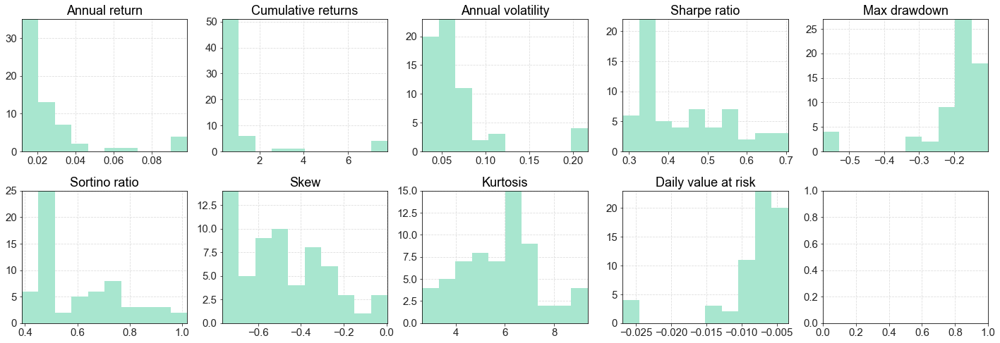

In [2450]:
# Define the figure size and number of subplots
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(20, 7))

# Plot histograms for each column
for i, col in enumerate(_T_EPO_Perf_Daily.columns):
    ax = axs[i//5, i%5]  # Get the appropriate subplot axis
    _T_EPO_Perf_Daily[col].hist(ax=ax)  # Plot the histogram on the axis
    ax.set_title(col)    # Set the title of the axis
    
# Adjust the layout of the subplots
plt.tight_layout()

# Show the plot
plt.show()


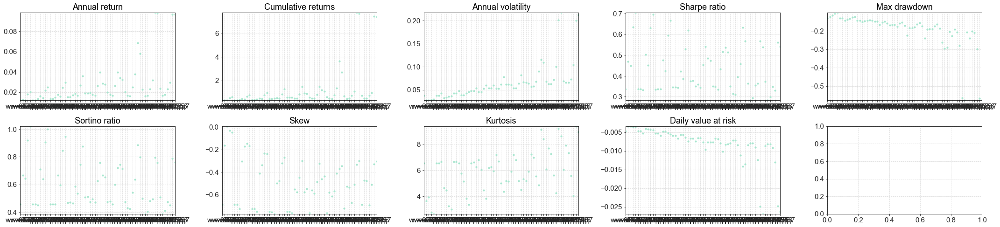

In [2470]:
# Define the figure size and number of subplots
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(30, 7))

# Plot scatter plots for each column
for i, col in enumerate(_T_EPO_Perf_Daily.columns):
    ax = axs[i//5, i%5]  # Get the appropriate subplot axis
    ax.scatter(_T_EPO_Perf_Daily.index.get_level_values(0)+_T_EPO_Perf_Daily.index.get_level_values(1), _T_EPO_Perf_Daily[col], s=10)  # Plot the scatter plot on the axis
    ax.set_title(col)    # Set the title of the axis
    
# Adjust the layout of the subplots
plt.tight_layout()

# Show the plot
plt.show()



In [3775]:
_T_NonEPO_Perf_Daily = pd.concat([_1N_Perf_Daily,_INDMOM_Perf_Daily,_MVO_no_corr_Perf_daily,_OOS_Perf_Daily],axis=1).T
_T_NonEPO_Perf_Daily = _T_NonEPO_Perf_Daily.drop(['Calmar ratio','Stability','Omega ratio', 'Tail ratio'], axis=1)
_T_NonEPO_Perf_Daily

,Annual return,Cumulative returns,Annual volatility,Sharpe ratio,Max drawdown,Sortino ratio,Skew,Kurtosis,Daily value at risk
1N,0.094878,7.019761,0.200675,0.552423,-0.566551,0.774666,-0.329402,9.370482,-0.024843
INDMOM,0.031696,1.047679,0.104351,0.351333,-0.299611,0.479979,-0.512602,4.076144,-0.013002
w = 0 (theta = 0) Eq1,0.011820,0.309828,0.034192,0.360788,-0.119469,0.494341,-0.664023,6.572441,-0.004259
w = 0 (theta = 0) Eq2,0.006931,0.171913,0.020943,0.340268,-0.078841,0.489932,0.062779,4.905270,-0.002610
w = 0 (theta = 0) Eq3,0.007150,0.177802,0.022476,0.328248,-0.095659,0.473667,0.126204,3.811240,-0.002802
w = 0 (theta = 0) Eq4,0.012148,0.319598,0.022513,0.547589,-0.088515,0.794549,0.056344,2.886237,-0.002787
w = 0 (theta = 0) Eq5,0.014070,0.378383,0.022486,0.632618,-0.074926,0.919352,0.045383,2.467312,-0.002777
w = 0 (theta = 0) Eq6,0.011820,0.309828,0.034192,0.360788,-0.119469,0.494341,-0.664023,6.572441,-0.004259
w = 0 (theta = 0) Eq7,0.011820,0.309828,0.034192,0.360788,-0.119469,0.494341,-0.664023,6.572441,-0.004259
OOS Eq1,0.015182,0.413517,0.043218,0.370283,-0.134083,0.508313,-0.551193,4.824280,-0.005381


In [3776]:
#_temp_mindex = (_T_EPO_Perf_Daily.index.get_level_values(1) + ' ' +_T_EPO_Perf_Daily.index.get_level_values(0))
#(_T_EPO_Perf_Daily.reset_index(drop=True)).set_index(_temp_mindex)

_T_Total_Perf_Daily = pd.concat([_T_NonEPO_Perf_Daily,_T_EPO_Perf_Daily.sort_index(axis=0, level=1)],axis=0)
_T_Total_Perf_Daily

,Annual return,Cumulative returns,Annual volatility,Sharpe ratio,Max drawdown,Sortino ratio,Skew,Kurtosis,Daily value at risk
1N,0.094878,7.019761,0.200675,0.552423,-0.566551,0.774666,-0.329402,9.370482,-0.024843
INDMOM,0.031696,1.047679,0.104351,0.351333,-0.299611,0.479979,-0.512602,4.076144,-0.013002
w = 0 (theta = 0) Eq1,0.011820,0.309828,0.034192,0.360788,-0.119469,0.494341,-0.664023,6.572441,-0.004259
w = 0 (theta = 0) Eq2,0.006931,0.171913,0.020943,0.340268,-0.078841,0.489932,0.062779,4.905270,-0.002610
w = 0 (theta = 0) Eq3,0.007150,0.177802,0.022476,0.328248,-0.095659,0.473667,0.126204,3.811240,-0.002802
...,...,...,...,...,...,...,...,...,...
"(w = 0.75, Eq7)",0.028540,0.908519,0.061477,0.488536,-0.184078,0.673075,-0.549693,5.189668,-0.007626
"(w = 0.8, Eq7)",0.032859,1.101370,0.065951,0.523270,-0.190091,0.726991,-0.435228,5.186204,-0.008172
"(w = 0.9, Eq7)",0.056983,2.571065,0.109870,0.559468,-0.291600,0.784798,-0.344993,8.391016,-0.013598
"(w = 0.99, Eq7)",0.095232,7.079531,0.217463,0.527459,-0.575762,0.740342,-0.300929,8.627824,-0.026943


In [3787]:
_agg_model_daily

Annualized α (%)     INDMOM    Mkt-RF       SMB       HML  \
Eq1 Coefficients          1.437170   0.734525 -0.024126 -0.003431 -0.017222   
    t_statistics          0.996822  82.469789 -2.413485 -0.362251 -1.611760   
Eq2 Coefficients          3.271434   0.578465 -0.020001  0.018763 -0.014422   
    t_statistics          1.884769  53.948066 -1.662003  1.645670 -1.121161   
Eq3 Coefficients          2.985538   0.558141 -0.024059 -0.003877 -0.022411   
    t_statistics          1.691615  51.191918 -1.966139 -0.334397 -1.713431   
Eq4 Coefficients          2.989143   0.665627 -0.005965 -0.002070 -0.024530   
    t_statistics          1.883343  67.887938 -0.542101 -0.198523 -2.085452   
Eq5 Coefficients          1.930419   0.756725  0.003434  0.004928 -0.009749   
    t_statistics          1.387484  88.042583  0.355962  0.539247 -0.945488   
Eq6 Coefficients          5.123859   0.335859 -0.079841  0.055092 -0.041391   
    t_statistics          2.568553  27.253786 -5.772664  4.204404 -2.799699   
Eq7 Coefficients          4.052459   0.382551 -0.060570  0.051486 -0.048948   
    t_statistics          2.069333  31.621279 -4.460904  4.002453 -3.372622   

                       RMW       CMA  R2_adj (%)      σ(𝜖)  Annualized IR  
Eq1 Coefficients -0.008679 -0.017312   54.198223  0.004189       0.212357  
    t_statistics -0.845521 -1.563185         NaN       NaN       0.000000  
Eq2 Coefficients  0.024602  0.008517   33.616393  0.005043       0.401520  
    t_statistics  1.990938  0.638759         NaN       NaN       0.000000  
Eq3 Coefficients  0.021129  0.005000   31.365438  0.005128       0.360372  
    t_statistics  1.681633  0.368839         NaN       NaN       0.000000  
Eq4 Coefficients  0.015117 -0.009775   44.494576  0.004612       0.401217  
    t_statistics  1.337900 -0.801802         NaN       NaN       0.000000  
Eq5 Coefficients  0.011065 -0.012285   57.347102  0.004043       0.295582  
    t_statistics  1.117163 -1.149448         NaN       NaN       0.000000  
Eq6 Coefficients -0.010925 -0.003272   12.316423  0.005796       0.547190  
    t_statistics -0.769246 -0.213524         NaN       NaN       0.000000  
Eq7 Coefficients -0.009972  0.004496   15.495908  0.005690       0.440839  
    t_statistics -0.715268  0.298906         NaN       NaN       0.000000

In [3788]:
np.round(_agg_model_daily,2).replace(np.nan,'')

Annualized α (%)  INDMOM  Mkt-RF   SMB   HML   RMW   CMA  \
Eq1 Coefficients              1.44    0.73   -0.02 -0.00 -0.02 -0.01 -0.02   
    t_statistics              1.00   82.47   -2.41 -0.36 -1.61 -0.85 -1.56   
Eq2 Coefficients              3.27    0.58   -0.02  0.02 -0.01  0.02  0.01   
    t_statistics              1.88   53.95   -1.66  1.65 -1.12  1.99  0.64   
Eq3 Coefficients              2.99    0.56   -0.02 -0.00 -0.02  0.02  0.01   
    t_statistics              1.69   51.19   -1.97 -0.33 -1.71  1.68  0.37   
Eq4 Coefficients              2.99    0.67   -0.01 -0.00 -0.02  0.02 -0.01   
    t_statistics              1.88   67.89   -0.54 -0.20 -2.09  1.34 -0.80   
Eq5 Coefficients              1.93    0.76    0.00  0.00 -0.01  0.01 -0.01   
    t_statistics              1.39   88.04    0.36  0.54 -0.95  1.12 -1.15   
Eq6 Coefficients              5.12    0.34   -0.08  0.06 -0.04 -0.01 -0.00   
    t_statistics              2.57   27.25   -5.77  4.20 -2.80 -0.77 -0.21   
Eq7 Coefficients              4.05    0.38   -0.06  0.05 -0.05 -0.01  0.00   
    t_statistics              2.07   31.62   -4.46  4.00 -3.37 -0.72  0.30   

                 R2_adj (%)  σ(𝜖)  Annualized IR  
Eq1 Coefficients       54.2   0.0           0.21  
    t_statistics                            0.00  
Eq2 Coefficients      33.62  0.01           0.40  
    t_statistics                            0.00  
Eq3 Coefficients      31.37  0.01           0.36  
    t_statistics                            0.00  
Eq4 Coefficients      44.49   0.0           0.40  
    t_statistics                            0.00  
Eq5 Coefficients      57.35   0.0           0.30  
    t_statistics                            0.00  
Eq6 Coefficients      12.32  0.01           0.55  
    t_statistics                            0.00  
Eq7 Coefficients       15.5  0.01           0.44  
    t_statistics                            0.00

In [3623]:
_agg_model.replace([np.nan,0],['',''])

Annualized α (%)     INDMOM    Mkt-RF       SMB       HML  \
Eq1 Coefficients          0.684645   0.757469  0.006400 -0.038328 -0.099293   
    t_statistics          0.477392  19.238469  0.135920 -0.788136 -1.771376   
Eq2 Coefficients          1.961197   0.646473 -0.016946  0.030298 -0.195033   
    t_statistics          1.189360  14.280331 -0.312993  0.541848 -3.026076   
Eq3 Coefficients          1.749517   0.595441  0.049309 -0.024454 -0.207746   
    t_statistics          0.999749  12.393886  0.858158 -0.412106 -3.037291   
Eq4 Coefficients          2.045100   0.659005  0.008608 -0.029833 -0.123963   
    t_statistics          1.244549  14.607702  0.159535 -0.535393 -1.930057   
Eq5 Coefficients          1.609562   0.761943 -0.000888 -0.028857 -0.019767   
    t_statistics          1.133118  19.538256 -0.019037 -0.599089 -0.356028   
Eq6 Coefficients          6.004812   0.238258  0.003039 -0.103282 -0.027681   
    t_statistics          2.806486   4.056093  0.043258 -1.423521 -0.330993   
Eq7 Coefficients          4.116760   0.316971  0.043911 -0.146422 -0.098049   
    t_statistics          1.986629   5.571564  0.645361 -2.083754 -1.210550   

                       RMW       CMA R2_adj (%)      σ(𝜖) Annualized IR  
Eq1 Coefficients -0.019359  0.029033   58.30448  0.018607      0.106219  
    t_statistics -0.368957  0.526074                                     
Eq2 Coefficients -0.032389  0.170067  44.879775  0.021394      0.264631  
    t_statistics -0.536895  2.680089                                     
Eq3 Coefficients -0.016161  0.165779  37.919856  0.022704      0.222443  
    t_statistics -0.252428  2.461724                                     
Eq4 Coefficients -0.023349  0.141967  45.260787   0.02132      0.276911  
    t_statistics -0.388382  2.245039                                     
Eq5 Coefficients  0.021262  0.047186  59.096544   0.01843      0.252117  
    t_statistics  0.409129  0.863218                                     
Eq6 Coefficients -0.107132  0.081854   7.201543   0.02776       0.62444  
    t_statistics -1.368595  0.994131                                     
Eq7 Coefficients -0.074804  0.150329  12.950937  0.026886      0.442023  
    t_statistics -0.986684  1.885139

In [3908]:
pd.concat([_T_NonEPO_Perf_Daily.loc[:,'Sharpe ratio'],_T_EPO_Perf_Daily.loc[:,'Sharpe ratio']],axis=0).sort_values(ascending=False).head(50)

(w = 0, Eq5)             0.749564
(w = 0.1, Eq5)           0.739206
(w = 0.25, Eq5)          0.708037
(w = 0, Eq4)             0.687684
(w = 0.1, Eq4)           0.679185
(w = 0.5, Eq5)           0.656717
(w = 0.25, Eq4)          0.640583
w = 0 (theta = 0) Eq5    0.632618
(w = 0.9, Eq6)           0.632452
OOS Eq6                  0.590674
(w = 0.75, Eq5)          0.569115
(w = 0.5, Eq4)           0.567758
(w = 0.9, Eq7)           0.559468
(w = 0.99, Eq6)          0.558134
(w = 0.8, Eq6)           0.554219
1N                       0.552423
(w = 1, Eq6)             0.552423
(w = 0.1, Eq2)           0.552167
w = 0 (theta = 0) Eq4    0.547589
(w = 0.8, Eq5)           0.543665
OOS Eq2                  0.539761
(w = 1, Eq7)             0.529757
(w = 0.99, Eq7)          0.527459
(w = 0, Eq2)             0.524508
(w = 0.8, Eq7)           0.523270
OOS Eq4                  0.522312
(w = 0.25, Eq2)          0.520352
OOS Eq7                  0.510292
(w = 0.75, Eq6)          0.505099
(w = 0.1, Eq3)

In [3907]:
pd.concat([_T_NonEPO_Perf_Daily.loc[:,'Sortino ratio'],_T_EPO_Perf_Daily.loc[:,'Sortino ratio']],axis=0).sort_values(ascending=False).head(50)

(w = 0, Eq5)             1.087802
(w = 0.1, Eq5)           1.062921
(w = 0.25, Eq5)          1.009828
(w = 0, Eq4)             0.997648
(w = 0.1, Eq4)           0.976631
(w = 0.5, Eq5)           0.930801
w = 0 (theta = 0) Eq5    0.919352
(w = 0.25, Eq4)          0.912534
(w = 0.9, Eq6)           0.885378
OOS Eq6                  0.818798
(w = 0.75, Eq5)          0.799109
(w = 0.5, Eq4)           0.798702
w = 0 (theta = 0) Eq4    0.794549
(w = 0.9, Eq7)           0.784798
(w = 0.99, Eq6)          0.782334
(w = 0.1, Eq2)           0.780344
(w = 1, Eq6)             0.774666
1N                       0.774666
OOS Eq2                  0.769448
(w = 0.8, Eq6)           0.768116
(w = 0.8, Eq5)           0.760690
(w = 0, Eq2)             0.746448
(w = 1, Eq7)             0.743673
(w = 0.99, Eq7)          0.740342
(w = 0.25, Eq2)          0.729428
(w = 0.8, Eq7)           0.726991
OOS Eq4                  0.726793
(w = 0, Eq3)             0.721744
OOS Eq7                  0.715877
(w = 0.1, Eq3)

In [3910]:
pd.concat([_T_NonEPO_Perf_Daily.loc[:,'Cumulative returns'],_T_EPO_Perf_Daily.loc[:,'Cumulative returns']],axis=0).sort_values(ascending=False).head(50)

(w = 0.99, Eq6)    7.307052
(w = 0.99, Eq7)    7.079531
(w = 1, Eq6)       7.019761
1N                 7.019761
(w = 1, Eq7)       6.871634
(w = 0.9, Eq6)     3.582017
OOS Eq6            2.644622
(w = 0.9, Eq7)     2.571065
(w = 0.75, Eq5)    1.574798
(w = 0.8, Eq5)     1.569713
OOS Eq7            1.561483
(w = 0.9, Eq5)     1.469301
(w = 0.5, Eq5)     1.364571
(w = 0.8, Eq6)     1.224922
(w = 0.99, Eq5)    1.154651
(w = 0.8, Eq7)     1.101370
(w = 1, Eq5)       1.047679
INDMOM             1.047679
(w = 0.25, Eq5)    1.036111
(w = 0.75, Eq6)    0.964999
(w = 0.5, Eq4)     0.909411
(w = 0.75, Eq7)    0.908519
(w = 0.75, Eq4)    0.901133
(w = 0.8, Eq4)     0.883444
(w = 0.9, Eq4)     0.830000
(w = 0.1, Eq5)     0.824172
(w = 0.25, Eq4)    0.816787
(w = 1, Eq1)       0.788396
OOS Eq5            0.766459
(w = 0.99, Eq4)    0.765671
(w = 1, Eq4)       0.760980
(w = 0.99, Eq1)    0.747156
(w = 0.1, Eq4)     0.702709
(w = 0.9, Eq1)     0.658747
(w = 0, Eq5)       0.632642
(w = 0.8, Eq1)     0

In [3885]:
np.round(_Real_SR,2)

,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1/N,0.56,0.56,0.56,0.56,0.56,0.56,0.56
INDMOM,0.36,0.36,0.36,0.36,0.36,0.36,0.36
w = 0 (theta = 0),0.37,0.35,0.33,0.56,0.64,0.37,0.37
w = 0,0.37,0.53,0.51,0.70,0.76,0.37,0.37
w = 0.1,0.36,0.56,0.51,0.69,0.75,0.37,0.37
w = 0.25,0.37,0.53,0.48,0.65,0.72,0.38,0.38
w = 0.5,0.38,0.46,0.43,0.58,0.67,0.41,0.41
w = 0.75,0.38,0.39,0.38,0.49,0.58,0.51,0.50
w = 0.8,0.39,0.38,0.37,0.47,0.55,0.56,0.53
w = 0.9,0.39,0.34,0.34,0.43,0.49,0.64,0.57


#### Plots

Ann Ret, Vol, Sharpe & Sortino

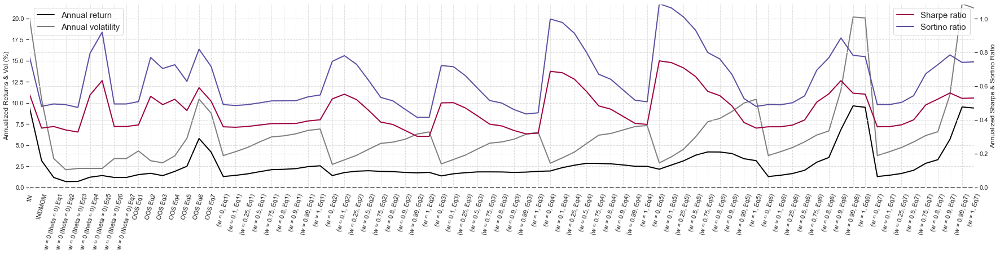

In [3624]:
# Create the first plot
_plot_df1 = 100*_T_Total_Perf_Daily.iloc[:,[0,2]].copy()
fig, ax1 = plt.subplots(figsize = (30,6))
_plot_df1.plot(ax=ax1, color = ['black','grey'], ylim=(0,_plot_df1.max().max()))

# Set xticks to show every row and rotate tick labels
ax1.set_xticks(range(len(_plot_df1.index)))
ax1.set_xticklabels(_plot_df1.index, rotation=75)

# Set y-axis label and color
ax1.set_ylabel('Annualized Returns & Vol (%)')

# Create the second plot with a shared x-axis
_plot_df2 = _T_Total_Perf_Daily.iloc[:,[3,5]].copy()
ax2 = ax1.twinx()
_plot_df2.plot(ax=ax2, cmap = 'Spectral')

# Set y-axis label and color
ax2.set_ylabel('Annualized Sharpe & Sortino Ratio')
ax2.axhline(y=0, color='black', linestyle='--')
# Show the plot
plt.show()


Cumulative Return and MDD

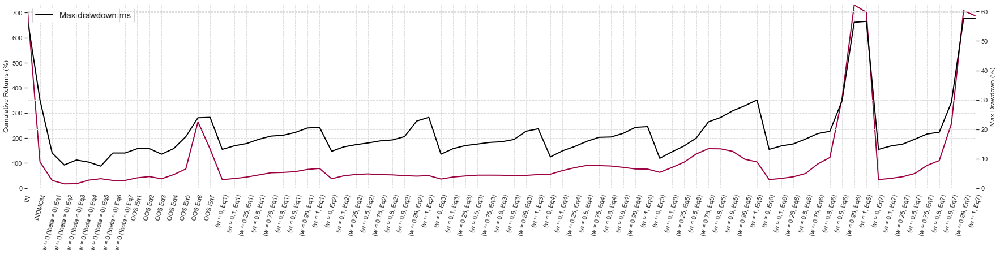

In [3625]:
# Create the first plot
_plot_df1 = 100*_T_Total_Perf_Daily.iloc[:,[1]].copy()
fig, ax1 = plt.subplots(figsize = (30,6))
_plot_df1.plot(ax=ax1, cmap='Spectral', ylim = (0,(100*_T_Total_Perf_Daily.iloc[:,[1]]).max().max()+5))

# Set xticks to show every row and rotate tick labels
ax1.set_xticks(range(len(_plot_df1.index)))
ax1.set_xticklabels(_plot_df1.index, rotation=75)

# Set y-axis label and color
ax1.set_ylabel('Cumulative Returns (%)')

# Create the second plot with a shared x-axis
_plot_df2 = -100*_T_Total_Perf_Daily.iloc[:,[4]].copy()
ax2 = ax1.twinx()
_plot_df2.plot(ax=ax2, cmap='inferno', ylim = (0,(-100*_T_Total_Perf_Daily.iloc[:,[4]]).max().max()+5))

# Set y-axis label and color
ax2.set_ylabel('Max Drawdown (%)')

# Show the plot
plt.show()


Skewness and Kurtosis

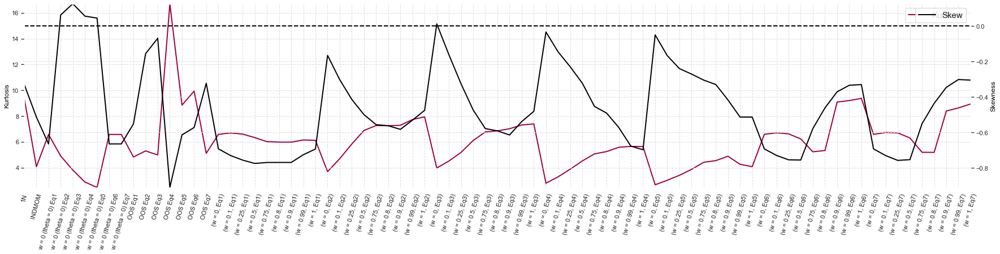

In [3626]:
# Create the first plot
_plot_df1 = _T_Total_Perf_Daily.iloc[:,[7]].copy()
fig, ax1 = plt.subplots(figsize = (30,6))
_plot_df1.plot(ax=ax1, cmap='Spectral')

# Set xticks to show every row and rotate tick labels
ax1.set_xticks(range(len(_plot_df1.index)))
ax1.set_xticklabels(_plot_df1.index, rotation=75)

# Set y-axis label and color
ax1.set_ylabel('Kurtosis',color='black')

# Create the second plot with a shared x-axis
_plot_df2 = _T_Total_Perf_Daily.iloc[:,[6]].copy()
ax2 = ax1.twinx()
_plot_df2.plot(ax=ax2, cmap='inferno')

# Set y-axis label and color
ax2.set_ylabel('Skewness',color='black')
ax2.axhline(y=0, color='black', linestyle='--')
# Show the plot
plt.show()


Scaled Cumulative Return + w Shrinkage

In [3924]:
_scaled_1N_daily = pd.DataFrame(_1N_daily * (target_vol/(np.sqrt(261)*(_1N_daily).std())))
_scaled_1N_daily.columns = ['1N']

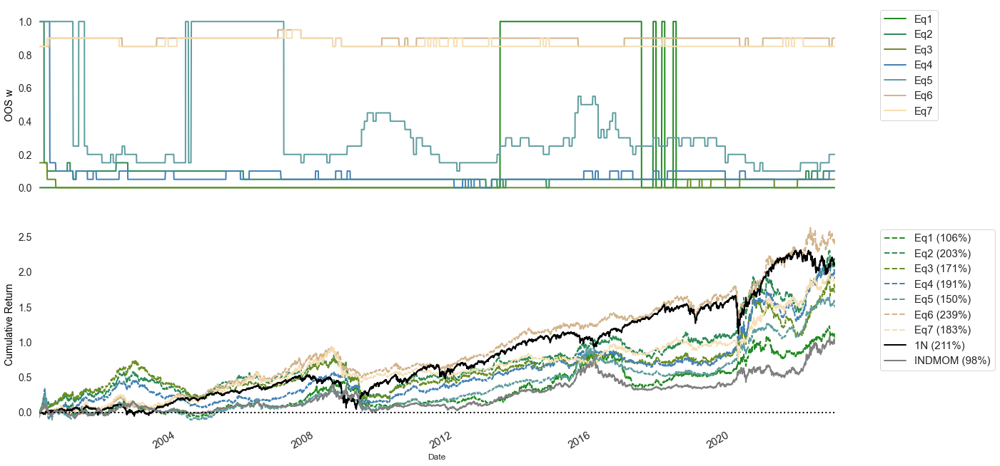

In [3956]:
color_dict = {'Eq1': 'forestgreen', 
              'Eq2': 'seagreen', 
              'Eq3': 'olivedrab', 
              'Eq4': 'steelblue', 
              'Eq5': 'cadetblue', 
              'Eq6': 'tan', 
              'Eq7': 'wheat'
              }
_plot_df1 = _agg_OOS_w.copy()
_plot_df2 = (1+_scaled_OOS_daily).cumprod()-1
_plot_df3 = pd.concat([(1+_scaled_1N_daily).cumprod()-1, (1+_scaled_INDMOM_daily).cumprod()-1], axis=1)

# Create the figure and two subplots
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(20,12),  gridspec_kw={'hspace': 0.1}, sharex=True)

# Plot the first dataframe on the first subplot
_plot_df1.plot(ax=ax1, color=color_dict, ylim=(-0.1, 1.1))

# Set y-axis label and color
ax1.set_ylabel('OOS w', color='black', fontsize = 14)
ax1.tick_params(axis='y', labelsize=14)
# Add legend to the first subplot
ax1.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
ax1.grid(visible=False)
# Plot the second dataframe on the second subplot
#_plot_df2.plot(ax=ax2, color=color_dict, ylim = (_plot_df2.min().min()-0.05,_plot_df2.max().max()+0.05), linestyle = '--')
#_plot_df3.plot(ax=ax2, color=['black','grey'])

# create a dictionary to store the final observation value for each data series
final_obs_dict = {}

# calculate final observation value for _plot_df2 and store it in the dictionary
for col in _plot_df2.columns:
    final_obs_dict[col] = _plot_df2[col].iloc[-1]

# calculate final observation value for _plot_df3 and store it in the dictionary
for col in _plot_df3.columns:
    final_obs_dict[col] = _plot_df3[col].iloc[-1]

# Plot the second dataframe on the second subplot and include final observation value in the label
for col in _plot_df2.columns:
    _plot_df2[col].plot(ax=ax2, color=color_dict[col], ylim = (_plot_df2.min().min()-0.05,_plot_df2.max().max()+0.05), linestyle = '--', label=col+' ({:.0f}%)'.format(final_obs_dict[col]*100))
for i, col in enumerate(_plot_df3.columns):
    _plot_df3[col].plot(ax=ax2, color=['black','grey'][i], label=col+' ({:.0f}%)'.format(final_obs_dict[col]*100))

# Add legend to the second subplot
ax2.legend(loc='upper left', bbox_to_anchor=(1.05, 1))

# Set y-axis label and color
ax2.set_ylabel('Cumulative Return', color='black', fontsize = 14)
ax2.axhline(y=0, color='black', linestyle='dotted')
ax2.tick_params(axis='y', labelsize=14)
ax2.tick_params(axis='x', labelsize=15)
ax2.grid(visible=False)
# Set xticks to show every row and rotate tick labels


# Add legend to the second subplot
ax2.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
#fig.suptitle('Cumulative Returns of Benchmark and OOS Portfolios Scaled to Annualized Volatility of 10%', fontsize=20)

# Show the plot
plt.show()


Top 3 Drawdown Periods (OOS)

3x3

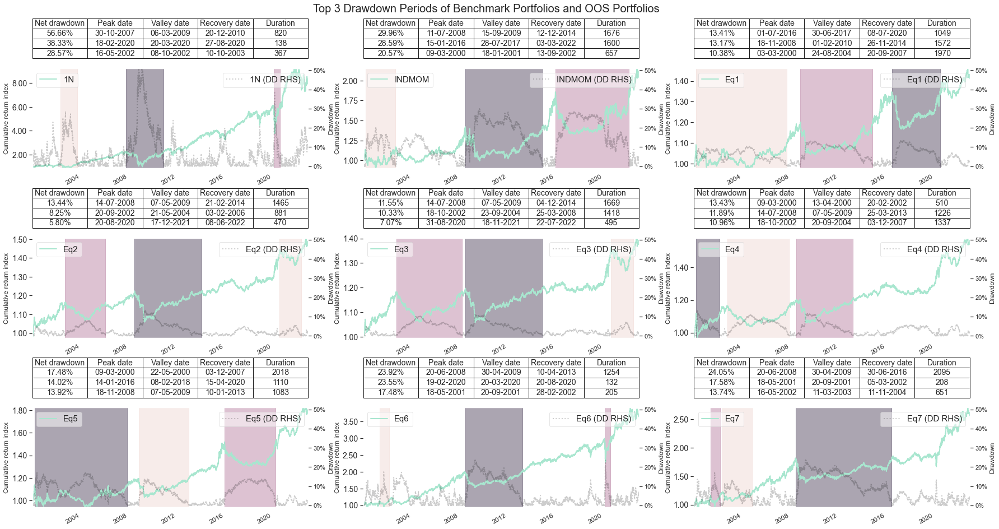

In [3837]:
# tbl = axs[j].table(cellText=own_gen_drawdown_table(_agg_OOS_daily.iloc[:,i],top = 3).values,
#                     colLabels=own_gen_drawdown_table(_agg_OOS_daily.iloc[:,i],top = 3).columns,
#                     cellLoc='center', colLoc='center',
#                     loc='top', bbox=[0, 1.1, 1, 0.2])
# tbl.auto_set_font_size(False)
# tbl.set_fontsize(10)

# Create a 3x3 subplot grid
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(30, 16))

# Flatten the axs array to make it easier to iterate over
axs = axs.ravel()

# Iterate over each column and plot the drawdown periods on the corresponding axis
own_plot_drawdown_periods(pd.Series(_1N_daily,name = '1N'), ax=axs[0], top = 3)
own_plot_drawdown_underwater(pd.Series(_1N_daily,name = '1N (DD RHS)'), ax=axs[0].twinx(), grid = False, ylim=(-1,51))
drawdown_table = own_gen_drawdown_table(_1N_daily, top=3).replace([np.nan,pd.NaT],['',''])
# Convert datetime objects to strings in the format "DD-MM-YYYY"
formatted_values = drawdown_table.applymap(lambda x: x.strftime("%d-%m-%Y") if isinstance(x, datetime.datetime) else x)
# Format the values in the table to display as percentages
formatted_values = formatted_values.applymap(lambda x: f"{x/100:.2%}" if isinstance(x, float) else x)

# Add a table on top of each subplot
tbl = axs[0].table(cellText=formatted_values.values,
                    colLabels=formatted_values.columns,
                    cellLoc='center',
                    colLoc='center',
                    loc='top',
                    bbox=[0, 1.1, 1, 0.4])
tbl.auto_set_font_size(False)
tbl.set_fontsize(14)
axs[0].tick_params(axis='y', labelsize=14)
axs[0].tick_params(axis='x', labelsize=12)
axs[0].grid(visible=False)
#axs[0].twinx().grid(visible=False)

own_plot_drawdown_periods(pd.Series(_INDMOM_daily,name = 'INDMOM'), ax=axs[1], top = 3)
own_plot_drawdown_underwater(pd.Series(_INDMOM_daily,name = 'INDMOM (DD RHS)'), ax=axs[1].twinx(), grid = False, ylim=(-1,51))
drawdown_table = own_gen_drawdown_table(_INDMOM_daily, top=3).replace([np.nan,pd.NaT],['',''])
# Convert datetime objects to strings in the format "DD-MM-YYYY"
formatted_values = drawdown_table.applymap(lambda x: x.strftime("%d-%m-%Y") if isinstance(x, datetime.datetime) else x)
# Format the values in the table to display as percentages
formatted_values = formatted_values.applymap(lambda x: f"{x/100:.2%}" if isinstance(x, float) else x)

# Add a table on top of each subplot
tbl = axs[1].table(cellText=formatted_values.values,
                    colLabels=formatted_values.columns,
                    cellLoc='center',
                    colLoc='center',
                    loc='top',
                    bbox=[0, 1.1, 1, 0.4])
tbl.auto_set_font_size(False)
tbl.set_fontsize(14)
axs[1].tick_params(axis='y', labelsize=14)
axs[1].tick_params(axis='x', labelsize=12)
axs[1].grid(visible=False)
#axs[1].twinx().grid(visible=False)
for j in range(2,len(_List_Eq_)+2):
        i = j-2
        # Add a table on top of each subplot
        # Generate the drawdown table
        drawdown_table = own_gen_drawdown_table(_agg_OOS_daily.iloc[:,i], top=3).replace([np.nan,pd.NaT],['',''])
        
        # Convert datetime objects to strings in the format "DD-MM-YYYY"
        formatted_values = drawdown_table.applymap(lambda x: x.strftime("%d-%m-%Y") if isinstance(x, datetime.datetime) else x)
        # Format the values in the table to display as percentages
        formatted_values = formatted_values.applymap(lambda x: f"{x/100:.2%}" if isinstance(x, float) else x)

        # Add a table on top of each subplot
        tbl = axs[j].table(cellText=formatted_values.values,
                            colLabels=formatted_values.columns,
                            cellLoc='center',
                            colLoc='center',
                            loc='top',
                            bbox=[0, 1.1, 1, 0.4]
                            )

        own_plot_drawdown_periods(_agg_OOS_daily.iloc[:,i], ax=axs[j], top = 3)
        own_plot_drawdown_underwater(pd.Series(_agg_OOS_daily.iloc[:,i],name = _agg_OOS_daily.iloc[:,i].name + ' (DD RHS)'), ax=axs[j].twinx(), grid=False, ylim=(-1,51))
        tbl.auto_set_font_size(False)
        tbl.set_fontsize(14)
        axs[j].tick_params(axis='y', labelsize=14)
        axs[j].tick_params(axis='x', labelsize=12)
        axs[j].grid(visible=False)
        #axs[j].twinx().grid(visible=False)
        #f'OOS EQ{i+1}'
    

# Add a title to the overall figure
fig.suptitle('Top 3 Drawdown Periods of Benchmark Portfolios and OOS Portfolios', fontsize=20)

# Adjust the spacing between subplots
plt.subplots_adjust(hspace=0.7)

# Show the plot
plt.show()


5x2

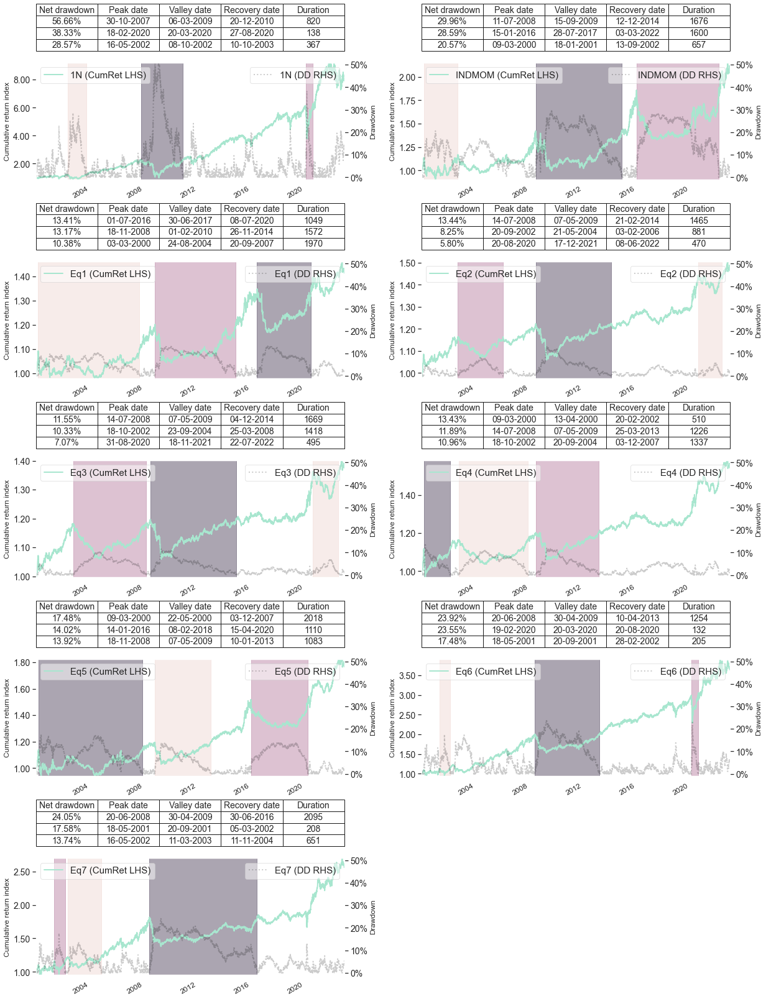

In [3923]:
# tbl = axs[j].table(cellText=own_gen_drawdown_table(_agg_OOS_daily.iloc[:,i],top = 3).values,
#                     colLabels=own_gen_drawdown_table(_agg_OOS_daily.iloc[:,i],top = 3).columns,
#                     cellLoc='center', colLoc='center',
#                     loc='top', bbox=[0, 1.1, 1, 0.2])
# tbl.auto_set_font_size(False)
# tbl.set_fontsize(10)

# Create a 3x3 subplot grid
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))

# Flatten the axs array to make it easier to iterate over
axs = axs.ravel()

# Iterate over each column and plot the drawdown periods on the corresponding axis
own_plot_drawdown_periods(pd.Series(_1N_daily,name = '1N (CumRet LHS)'), ax=axs[0], top = 3)
own_plot_drawdown_underwater(pd.Series(_1N_daily,name = '1N (DD RHS)'), ax=axs[0].twinx(), grid = False, ylim=(-1,51))
drawdown_table = own_gen_drawdown_table(_1N_daily, top=3).replace([np.nan,pd.NaT],['',''])
# Convert datetime objects to strings in the format "DD-MM-YYYY"
formatted_values = drawdown_table.applymap(lambda x: x.strftime("%d-%m-%Y") if isinstance(x, datetime.datetime) else x)
# Format the values in the table to display as percentages
formatted_values = formatted_values.applymap(lambda x: f"{x/100:.2%}" if isinstance(x, float) else x)

# Add a table on top of each subplot
tbl = axs[0].table(cellText=formatted_values.values,
                    colLabels=formatted_values.columns,
                    cellLoc='center',
                    colLoc='center',
                    loc='top',
                    bbox=[0, 1.1, 1, 0.4])
tbl.auto_set_font_size(False)
tbl.set_fontsize(14)
axs[0].tick_params(axis='y', labelsize=14)
axs[0].tick_params(axis='x', labelsize=12)
axs[0].grid(visible=False)
#axs[0].twinx().grid(visible=False)

own_plot_drawdown_periods(pd.Series(_INDMOM_daily,name = 'INDMOM (CumRet LHS)'), ax=axs[1], top = 3)
own_plot_drawdown_underwater(pd.Series(_INDMOM_daily,name = 'INDMOM (DD RHS)'), ax=axs[1].twinx(), grid = False, ylim=(-1,51))
drawdown_table = own_gen_drawdown_table(_INDMOM_daily, top=3).replace([np.nan,pd.NaT],['',''])
# Convert datetime objects to strings in the format "DD-MM-YYYY"
formatted_values = drawdown_table.applymap(lambda x: x.strftime("%d-%m-%Y") if isinstance(x, datetime.datetime) else x)
# Format the values in the table to display as percentages
formatted_values = formatted_values.applymap(lambda x: f"{x/100:.2%}" if isinstance(x, float) else x)

# Add a table on top of each subplot
tbl = axs[1].table(cellText=formatted_values.values,
                    colLabels=formatted_values.columns,
                    cellLoc='center',
                    colLoc='center',
                    loc='top',
                    bbox=[0, 1.1, 1, 0.4])
tbl.auto_set_font_size(False)
tbl.set_fontsize(14)
axs[1].tick_params(axis='y', labelsize=14)
axs[1].tick_params(axis='x', labelsize=12)
axs[1].grid(visible=False)
#axs[1].twinx().grid(visible=False)
for j in range(2,len(_List_Eq_)+2):
        i = j-2
        # Add a table on top of each subplot
        # Generate the drawdown table
        drawdown_table = own_gen_drawdown_table(_agg_OOS_daily.iloc[:,i], top=3).replace([np.nan,pd.NaT],['',''])
        
        # Convert datetime objects to strings in the format "DD-MM-YYYY"
        formatted_values = drawdown_table.applymap(lambda x: x.strftime("%d-%m-%Y") if isinstance(x, datetime.datetime) else x)
        # Format the values in the table to display as percentages
        formatted_values = formatted_values.applymap(lambda x: f"{x/100:.2%}" if isinstance(x, float) else x)

        # Add a table on top of each subplot
        tbl = axs[j].table(cellText=formatted_values.values,
                        colLabels=formatted_values.columns,
                        cellLoc='center',
                        colLoc='center',
                        loc='top',
                        bbox=[0, 1.1, 1, 0.4]
                        )

        own_plot_drawdown_periods(pd.Series(_agg_OOS_daily.iloc[:,i],name = _agg_OOS_daily.iloc[:,i].name + ' (CumRet LHS)'), ax=axs[j], top = 3)
        own_plot_drawdown_underwater(pd.Series(_agg_OOS_daily.iloc[:,i],name = _agg_OOS_daily.iloc[:,i].name + ' (DD RHS)'), ax=axs[j].twinx(), grid=False, ylim=(-1,51))
        tbl.auto_set_font_size(False)
        tbl.set_fontsize(14)
        axs[j].tick_params(axis='y', labelsize=14)
        axs[j].tick_params(axis='x', labelsize=12)
        axs[j].grid(visible=False)
        #f'OOS EQ{i+1}'
        
fig.delaxes(axs[9])             
# Add a title to the overall figure
#fig.suptitle('Top 3 Drawdown Periods of Benchmark Portfolios and OOS Portfolios', fontsize=20)

# Adjust the spacing between subplots
plt.subplots_adjust(hspace=0.7, wspace=0.25)

# Show the plot
plt.show()


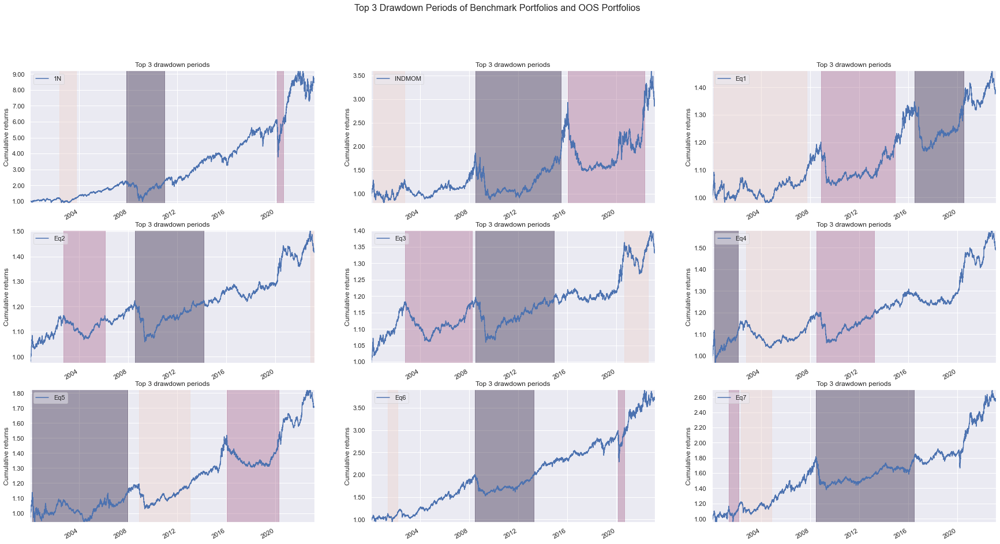

In [2850]:
# Create a 3x3 subplot grid
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(30, 16))

# Flatten the axs array to make it easier to iterate over
axs = axs.ravel()

# Iterate over each column and plot the drawdown periods on the corresponding axis
own_plot_drawdown_periods(pd.Series(_1N_daily,name = '1N'), ax=axs[0], top = 3)
own_plot_drawdown_periods(pd.Series(_INDMOM_daily,name = 'INDMOM'), ax=axs[1], top = 3)

for j in range(2,len(_List_Eq_)+2):
    i = j-2
    own_plot_drawdown_periods(_agg_OOS_daily.iloc[:,i], ax=axs[j], top = 3)

# Add a title to the overall figure
fig.suptitle('Top 3 Drawdown Periods of Benchmark Portfolios and OOS Portfolios', fontsize=16)

# Show the plot
plt.show()


Collective Underwater

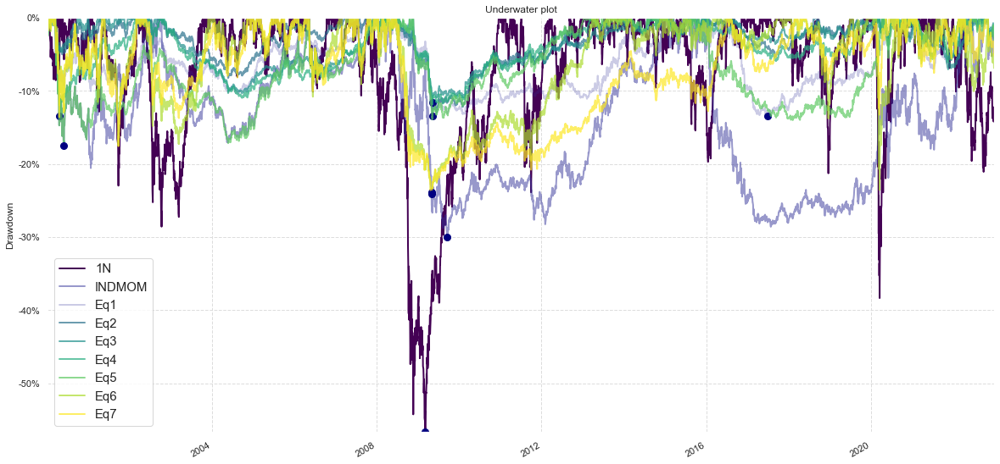

In [3630]:
fig, ax = plt.subplots(figsize=(20, 10))
own_plot_multiple_drawdown_underwater([pd.Series(_1N_daily,name = '1N'),pd.Series(_INDMOM_daily,name = 'INDMOM')
                                        ,_agg_OOS_daily.iloc[:,0]
                                        ,_agg_OOS_daily.iloc[:,1]
                                        ,_agg_OOS_daily.iloc[:,2]
                                        ,_agg_OOS_daily.iloc[:,3]
                                        ,_agg_OOS_daily.iloc[:,4]
                                        ,_agg_OOS_daily.iloc[:,5]
                                        ,_agg_OOS_daily.iloc[:,6]
                                        ],ax=ax)
plt.show()                                 

Underwater with BM Overlay

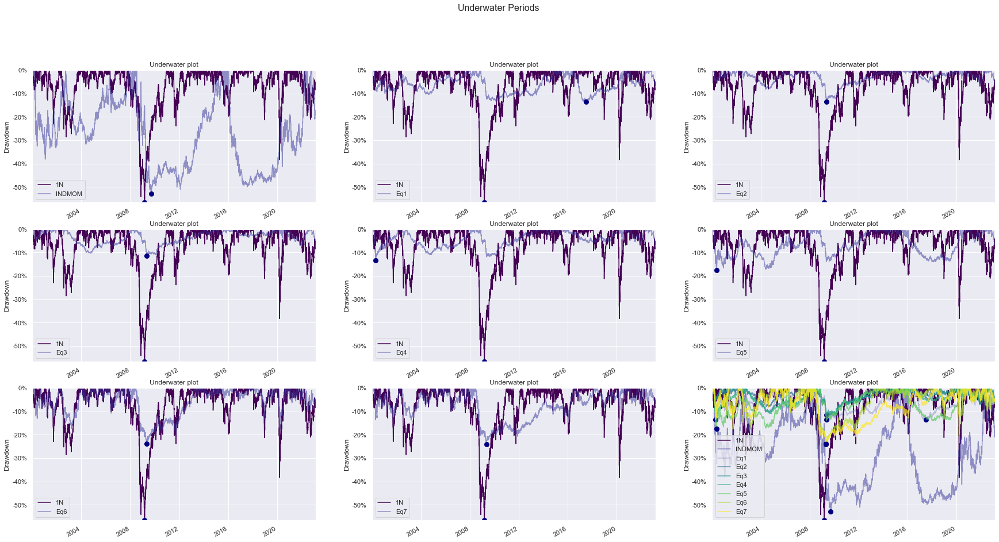

In [2844]:
# # Create a 3x3 subplot grid
# fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(30, 16))

# # Flatten the axs array to make it easier to iterate over
# axs = axs.ravel()

# # Iterate over each column and plot the drawdown periods on the corresponding axis
# own_plot_multiple_drawdown_underwater([pd.Series(_1N_daily,name = '1N'),pd.Series(_INDMOM_daily,name = 'INDMOM')], ax=axs[0])

# for j in range(1,len(_List_Eq_)+1):
#     i = j-1
#     own_plot_multiple_drawdown_underwater([pd.Series(_1N_daily,name = '1N'),_agg_OOS_daily.iloc[:,i]],ax=axs[j])

# own_plot_multiple_drawdown_underwater([pd.Series(_1N_daily,name = '1N'),pd.Series(_INDMOM_daily,name = 'INDMOM')
#                                         ,_agg_OOS_daily.iloc[:,0]
#                                         ,_agg_OOS_daily.iloc[:,1]
#                                         ,_agg_OOS_daily.iloc[:,2]
#                                         ,_agg_OOS_daily.iloc[:,3]
#                                         ,_agg_OOS_daily.iloc[:,4]
#                                         ,_agg_OOS_daily.iloc[:,5]
#                                         ,_agg_OOS_daily.iloc[:,6]
#                                         ],ax=axs[8])    

# # Add a title to the overall figure
# fig.suptitle('Underwater Periods', fontsize=16)

# # Show the plot
# plt.show()


Underwater without BM Overlay

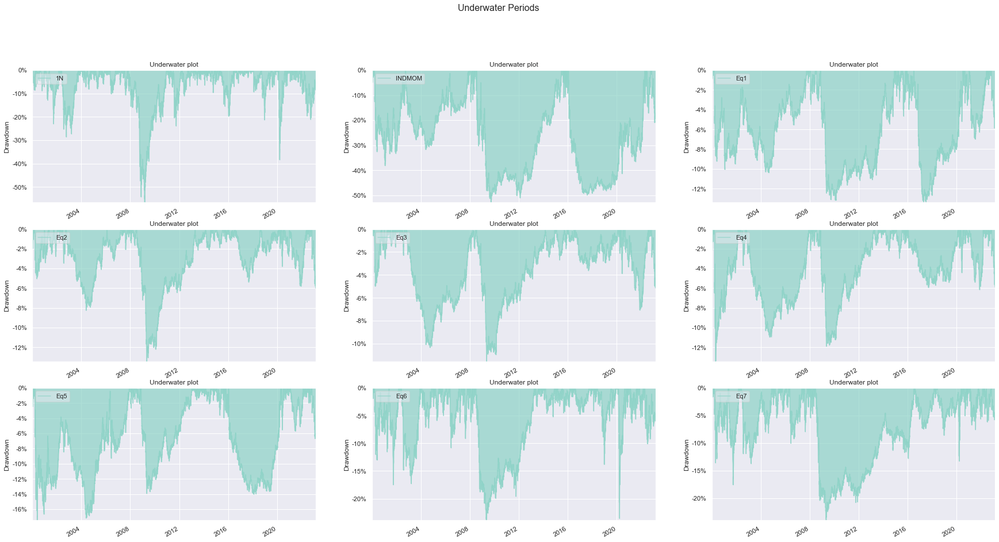

In [2800]:
# Create a 3x3 subplot grid
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(30, 16))

# Flatten the axs array to make it easier to iterate over
axs = axs.ravel()

# Iterate over each column and plot the drawdown periods on the corresponding axis
own_plot_drawdown_underwater(pd.Series(_1N_daily,name = '1N'), ax=axs[0])
own_plot_drawdown_underwater(pd.Series(_INDMOM_daily,name = 'INDMOM'), ax=axs[1])

for j in range(2,len(_List_Eq_)+2):
    i = j-2
    own_plot_drawdown_underwater(_agg_OOS_daily.iloc[:,i], ax=axs[j])

# Add a title to the overall figure
fig.suptitle('Underwater Periods', fontsize=16)

# Show the plot
plt.show()


Stack Plot

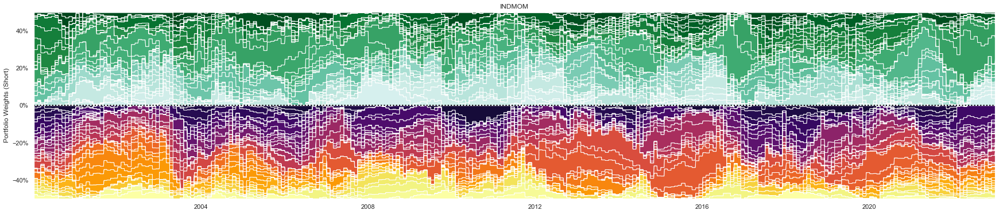

In [3706]:
# cmap_long = plt.get_cmap('BuGn')
# cmap_short = plt.get_cmap('inferno')

# # Create the first plot
# _plot_df1 = (_w_INDMOM_daily[_w_INDMOM_daily>0]).replace(np.nan,0).copy()
# fig, ax1 = plt.subplots(figsize = (30,6))
# ax1.stackplot(_plot_df1.index, _plot_df1.T, labels=_plot_df2.index ,colors=cmap_long(np.linspace(0.2, 1, N_col)))

# # Set xticks to show every row and rotate tick labels
# ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
# ax1.set_ylabel('Portfolio Weights')
# ax1.set_title('INDMOM')
# ax1.axhline(y=0, color='black', linestyle='dotted')


# # Create the second plot with a shared x-axis
# _plot_df2 =  (_w_INDMOM_daily[_w_INDMOM_daily<0]).replace(np.nan,0).copy()
# #ax2 = ax1.twinx()
# ax1.stackplot(_plot_df2.index, _plot_df2.T, labels=_plot_df2.index ,colors=cmap_short(np.linspace(0.1, 1, N_col)))
# ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
# # Set y-axis label and color
# #ax1.set_ylabel('Portfolio Weights (Short)')

# # Show the plot
# plt.show()


3x3

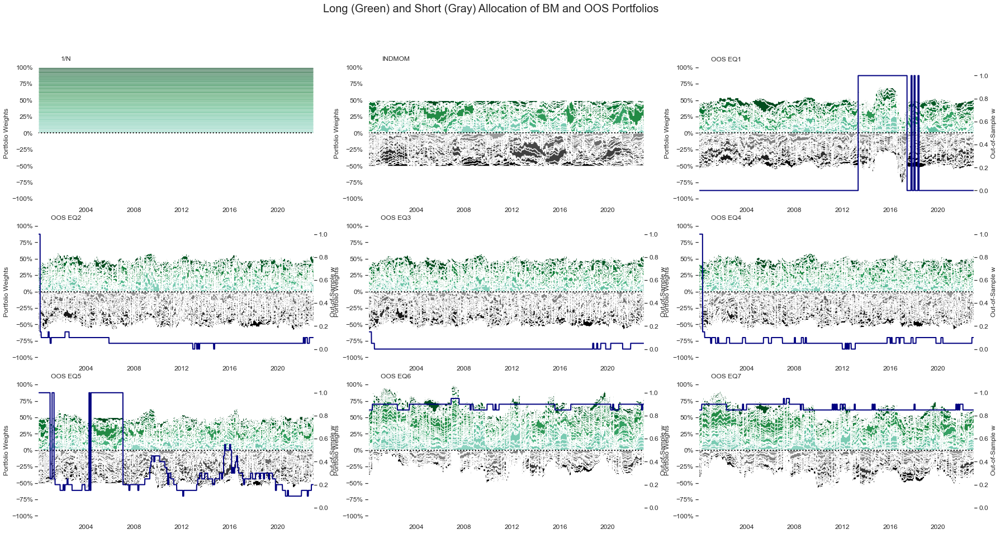

In [3789]:
cmap_long = plt.get_cmap('BuGn')
#cmap_short = plt.get_cmap('inferno')
cmap_short = plt.get_cmap('binary')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(30, 15))

# Plot the first two subplots
ax1 = axes[0,0]
ax1.tick_params(axis='y', labelsize=12)
ax1.tick_params(axis='x', labelsize=12)
#single col setup
#ax1 = axes[0]
ax1.stackplot(_1N_w_daily.index, _1N_w_daily[_1N_w_daily>0].T.replace(np.nan,0), labels=_1N_w_daily.index ,colors=cmap_long(np.linspace(0.4, 1, N_col)))
ax1.stackplot(_1N_w_daily.index, _1N_w_daily[_1N_w_daily<0].T.replace(np.nan,0), labels=_1N_w_daily.index ,colors=cmap_short(np.linspace(0.4, 1, N_col)))
ax1.set_ylim(-1.05, 1.05)
ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
ax1.set_ylabel('Portfolio Weights')
ax1.set_title('1/N')
ax1.axhline(y=0, color='black', linestyle='dotted')
ax1.title.set_position((0.1,-0.9))
ax1.grid(visible=False)


ax1 = axes[0,1]
ax1.tick_params(axis='y', labelsize=12)
ax1.tick_params(axis='x', labelsize=12)
#single col setup
#ax1 = axes[1]
ax1.stackplot(_w_INDMOM_daily.index, _w_INDMOM_daily[_w_INDMOM_daily>0].T.replace(np.nan,0), labels=_w_INDMOM_daily.index ,colors=cmap_long(np.linspace(0.4, 1, N_col)))
ax1.stackplot(_w_INDMOM_daily.index, _w_INDMOM_daily[_w_INDMOM_daily<0].T.replace(np.nan,0), labels=_w_INDMOM_daily.index ,colors=cmap_short(np.linspace(0.4, 1, N_col)))
ax1.set_ylim(-1.05, 1.05)
ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
ax1.set_ylabel('Portfolio Weights')
ax1.set_title('INDMOM')
ax1.title.set_position((0.1,-0.9))
ax1.axhline(y=0, color='black', linestyle='dotted')
ax1.grid(visible=False)

# Loop through the data frames and plot each pair
for [i, (w_daily, daily)] in  enumerate(zip([eq1_OOS_w_daily_merged, eq2_OOS_w_daily_merged, eq3_OOS_w_daily_merged
                                        , eq4_OOS_w_daily_merged, eq5_OOS_w_daily_merged, eq6_OOS_w_daily_merged, eq7_OOS_w_daily_merged],
                                          [eq1_OOS_daily, eq2_OOS_daily,eq3_OOS_daily, eq4_OOS_daily
                                          ,eq5_OOS_daily, eq6_OOS_daily, eq7_OOS_daily])):
    # Get the row and column indices for the current plot
    row, col = (i+2) // 3, (i+2) % 3
    ax1 = axes[row, col]
    ax1.grid(visible=False)
    #single col setup
    #row = (i+2)
    #ax1 = axes[row]

    # Plot the stackplot
    ax1.stackplot(w_daily.index.get_level_values(0), w_daily.droplevel([1,2])[w_daily.droplevel([1,2])>0].T.replace(np.nan,0), labels=w_daily.index ,colors=cmap_long(np.linspace(0.4, 1, N_col)))
    ax1.stackplot(w_daily.index.get_level_values(0), w_daily.droplevel([1,2])[w_daily.droplevel([1,2])<0].T.replace(np.nan,0), labels=w_daily.index ,colors=cmap_short(np.linspace(0.4, 1, N_col)))

    # Set the formatter for the y-axis
    ax1.set_ylim(-1.05, 1.05)
    ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
    ax1.set_ylabel('Portfolio Weights')
    ax1.axhline(y=0, color='black', linestyle='dotted')
    
    # Create the secondary y-axis
    ax2 = ax1.twinx()

    # Plot the line on the secondary y-axis
    ax2.plot(daily.index, (daily.drop(daily.columns[1],axis=1)).iloc[:, 0], color='navy', linewidth = 2)#, linestyle='--')

    # Set the label for the secondary y-axis
    ax2.set_ylabel('Out-of-Sample w')
    ax2.set_ylim(-0.1, 1.1)
    ax1.tick_params(axis='y', labelsize=12)
    ax2.tick_params(axis='y', labelsize=12)
    ax1.tick_params(axis='x', labelsize=12)
    ax2.grid(visible=False)


    # Set the title for the subplot
    ax1.set_title(f'OOS EQ{i+1}')
    ax1.title.set_position((0.1,-0.9))

# Adjust the spacing between the subplots
fig.subplots_adjust(hspace=0.15)
fig.suptitle('Long (Green) and Short (Gray) Allocation of BM and OOS Portfolios', fontsize=20)
# Show the plot
plt.show()


5x2

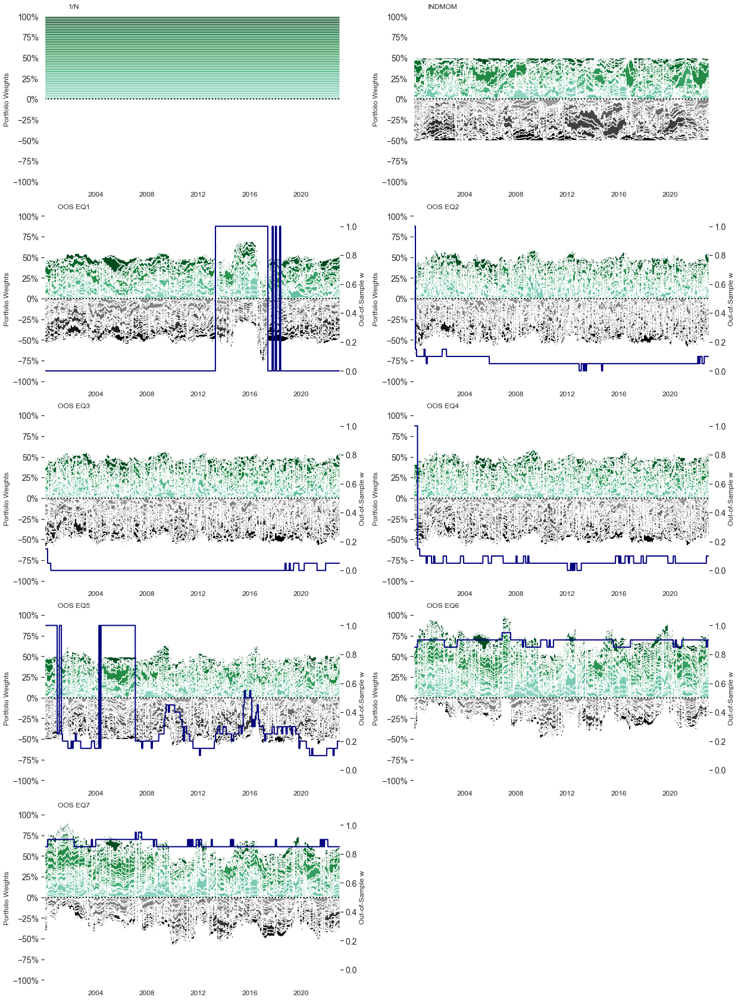

In [3853]:
cmap_long = plt.get_cmap('BuGn')
#cmap_short = plt.get_cmap('inferno')
cmap_short = plt.get_cmap('binary')

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 30))

# Plot the first two subplots
ax1 = axes[0,0]
ax1.tick_params(axis='y', labelsize=14)
ax1.tick_params(axis='x', labelsize=12)
#single col setup
#ax1 = axes[0]
ax1.stackplot(_1N_w_daily.index, _1N_w_daily[_1N_w_daily>0].T.replace(np.nan,0), labels=_1N_w_daily.index ,colors=cmap_long(np.linspace(0.4, 1, N_col)))
ax1.stackplot(_1N_w_daily.index, _1N_w_daily[_1N_w_daily<0].T.replace(np.nan,0), labels=_1N_w_daily.index ,colors=cmap_short(np.linspace(0.4, 1, N_col)))
ax1.set_ylim(-1.05, 1.05)
ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
ax1.set_ylabel('Portfolio Weights')
ax1.set_title('1/N')
ax1.axhline(y=0, color='black', linestyle='dotted')
ax1.title.set_position((0.1,-0.9))
ax1.grid(visible=False)


ax1 = axes[0,1]
ax1.tick_params(axis='y', labelsize=14)
ax1.tick_params(axis='x', labelsize=12)
#single col setup
#ax1 = axes[1]
ax1.stackplot(_w_INDMOM_daily.index, _w_INDMOM_daily[_w_INDMOM_daily>0].T.replace(np.nan,0), labels=_w_INDMOM_daily.index ,colors=cmap_long(np.linspace(0.4, 1, N_col)))
ax1.stackplot(_w_INDMOM_daily.index, _w_INDMOM_daily[_w_INDMOM_daily<0].T.replace(np.nan,0), labels=_w_INDMOM_daily.index ,colors=cmap_short(np.linspace(0.4, 1, N_col)))
ax1.set_ylim(-1.05, 1.05)
ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
ax1.set_ylabel('Portfolio Weights')
ax1.set_title('INDMOM')
ax1.title.set_position((0.1,-0.9))
ax1.axhline(y=0, color='black', linestyle='dotted')
ax1.grid(visible=False)

# Loop through the data frames and plot each pair
for [i, (w_daily, daily)] in  enumerate(zip([eq1_OOS_w_daily_merged, eq2_OOS_w_daily_merged, eq3_OOS_w_daily_merged
                                        , eq4_OOS_w_daily_merged, eq5_OOS_w_daily_merged, eq6_OOS_w_daily_merged, eq7_OOS_w_daily_merged],
                                          [eq1_OOS_daily, eq2_OOS_daily,eq3_OOS_daily, eq4_OOS_daily
                                          ,eq5_OOS_daily, eq6_OOS_daily, eq7_OOS_daily])):
    # Get the row and column indices for the current plot
    row, col = (i+2) // 2, (i+2) % 2
    ax1 = axes[row, col]
    ax1.grid(visible=False)
    #single col setup
    #row = (i+2)
    #ax1 = axes[row]

    # Plot the stackplot
    ax1.stackplot(w_daily.index.get_level_values(0), w_daily.droplevel([1,2])[w_daily.droplevel([1,2])>0].T.replace(np.nan,0), labels=w_daily.index ,colors=cmap_long(np.linspace(0.4, 1, N_col)))
    ax1.stackplot(w_daily.index.get_level_values(0), w_daily.droplevel([1,2])[w_daily.droplevel([1,2])<0].T.replace(np.nan,0), labels=w_daily.index ,colors=cmap_short(np.linspace(0.4, 1, N_col)))

    # Set the formatter for the y-axis
    ax1.set_ylim(-1.05, 1.05)
    ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
    ax1.set_ylabel('Portfolio Weights')
    ax1.axhline(y=0, color='black', linestyle='dotted')
    
    # Create the secondary y-axis
    ax2 = ax1.twinx()

    # Plot the line on the secondary y-axis
    ax2.plot(daily.index, (daily.drop(daily.columns[1],axis=1)).iloc[:, 0], color='navy', linewidth = 2)#, linestyle='--')

    # Set the label for the secondary y-axis
    ax2.set_ylabel('Out-of-Sample w')
    ax2.set_ylim(-0.1, 1.1)
    ax1.tick_params(axis='y', labelsize=14)
    ax2.tick_params(axis='y', labelsize=14)
    ax1.tick_params(axis='x', labelsize=12)
    ax2.grid(visible=False)


    # Set the title for the subplot
    ax1.set_title(f'OOS EQ{i+1}')
    ax1.title.set_position((0.1,-0.9))

fig.delaxes(axes[4,1])      
# Adjust the spacing between the subplots
fig.subplots_adjust(hspace=0.15, wspace=0.25)
#fig.suptitle('Long (Green) and Short (Gray) Allocation of BM and OOS Portfolios', fontsize=20)
# Show the plot
plt.show()


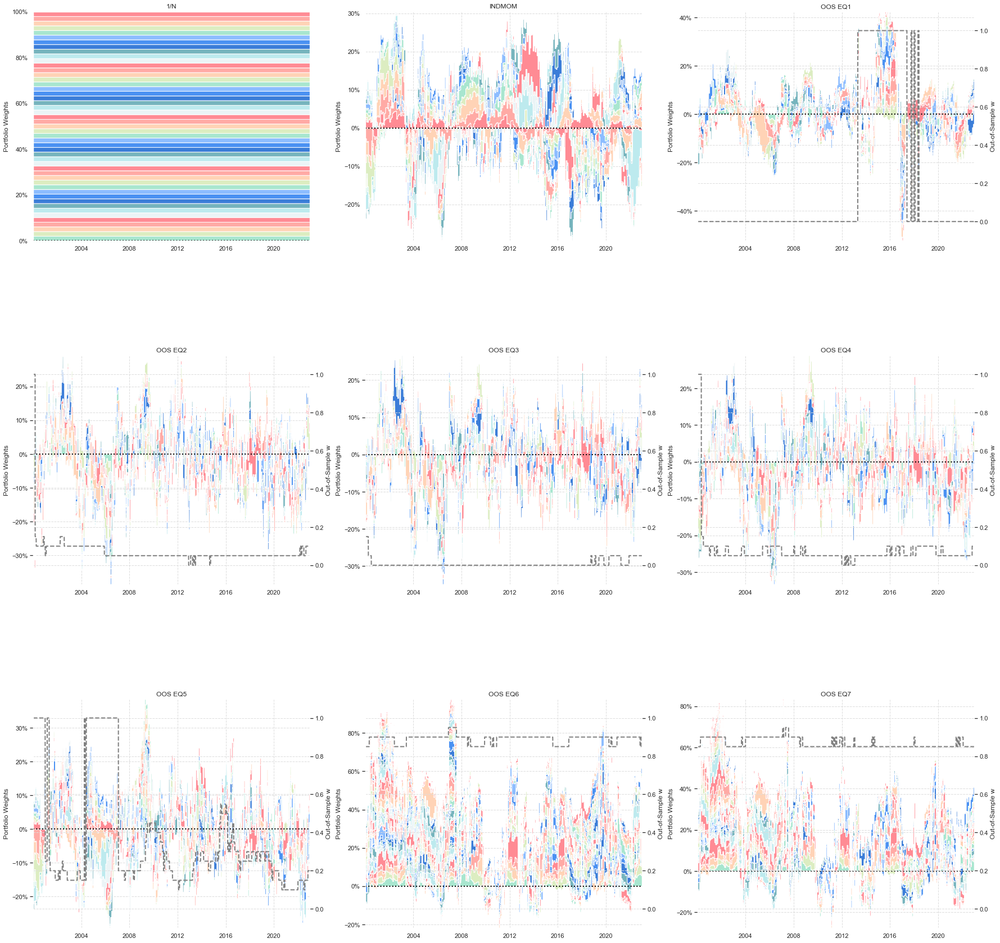

In [3682]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(30, 30))

# Plot the first two subplots
ax1 = axes[0,0]
#single col setup
#ax1 = axes[0]
ax1.stackplot(_1N_w_daily.index, _1N_w_daily.T)
ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
ax1.set_ylabel('Portfolio Weights')
ax1.set_title('1/N')
ax1.axhline(y=0, color='black', linestyle='dotted')

ax1 = axes[0,1]

#single col setup
#ax1 = axes[1]
ax1.stackplot(_w_INDMOM_daily.index, _w_INDMOM_daily.T.replace(np.nan,0))
ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
ax1.set_ylabel('Portfolio Weights')
ax1.set_title('INDMOM')
ax1.axhline(y=0, color='black', linestyle='dotted')

# Loop through the data frames and plot each pair
for [i, (w_daily, daily)] in  enumerate(zip([eq1_OOS_w_daily_merged, eq2_OOS_w_daily_merged, eq3_OOS_w_daily_merged
                                        , eq4_OOS_w_daily_merged, eq5_OOS_w_daily_merged, eq6_OOS_w_daily_merged, eq7_OOS_w_daily_merged],
                                          [eq1_OOS_daily, eq2_OOS_daily,eq3_OOS_daily, eq4_OOS_daily
                                          ,eq5_OOS_daily, eq6_OOS_daily, eq7_OOS_daily])):
    # Get the row and column indices for the current plot
    row, col = (i+2) // 3, (i+2) % 3
    ax1 = axes[row, col]
    
    #single col setup
    #row = (i+2)
    #ax1 = axes[row]

    # Plot the stackplot
    ax1.stackplot(w_daily.index.get_level_values(0), w_daily.droplevel([1,2]).T.replace(np.nan,0))

    # Set the formatter for the y-axis
    ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
    ax1.set_ylabel('Portfolio Weights')
    ax1.axhline(y=0, color='black', linestyle='dotted')

    # Create the secondary y-axis
    ax2 = ax1.twinx()

    # Plot the line on the secondary y-axis
    ax2.plot(daily.index, (daily.drop(daily.columns[1],axis=1)).iloc[:, 0], color='grey', linestyle='--')

    # Set the label for the secondary y-axis
    ax2.set_ylabel('Out-of-Sample w')
    ax2.set_ylim(-0.1, 1.1)

    # Set the title for the subplot
    ax1.set_title(f'OOS EQ{i+1}')

# Adjust the spacing between the subplots
fig.subplots_adjust(hspace=0.5)

# Show the plot
plt.show()


Boxplot

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: UserWarning: Attempting to set identical bottom == top == 0.02142857142857143 results in singular transformations; automatically expanding.


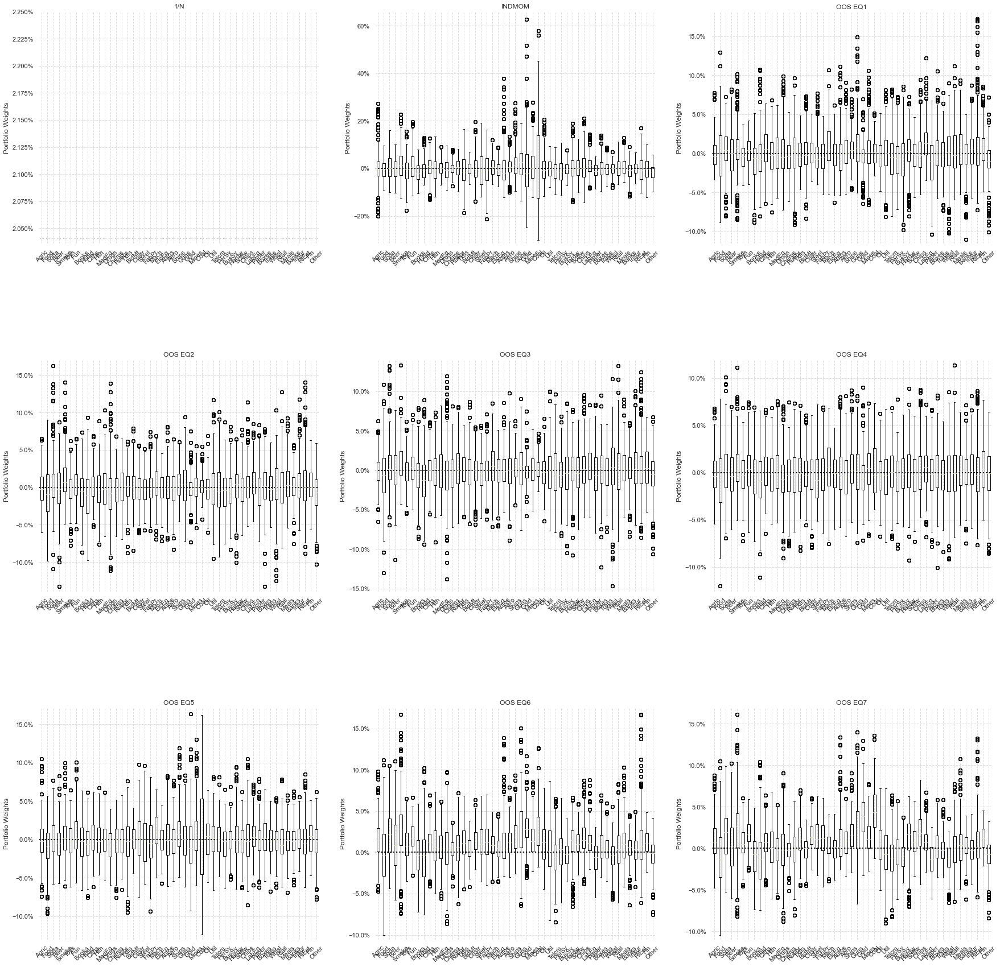

In [3270]:
# _boxplot_df = eq7_OOS_w_daily_merged.droplevel([1,2])

# fig, ax = plt.subplots(figsize=(20, 6))

# ax.boxplot(_boxplot_df); 

# #ax.set_xticklabels(["Industry {}".format(_) for _ in range(1, 50)], rotation = 45)
# ax.set_xticklabels(_boxplot_df.columns, rotation = 45)
# #ax.scatter(np.arange(1, 5), w_opt, label="True weights")
# ax.axhline(y=0, color='black', linestyle='dotted')
# ax.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
# ax.set_ylim([_boxplot_df.min().min()*1.05,_boxplot_df.max().max()*1.05])
# #ax.legend();
# ax.set_ylabel("Portfolio weights")
# ax.set_title("Distribution of portfolio weights");


fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(30, 30))

# Plot the first two subplots
ax1 = axes[0,0]
#single col setup
#ax1 = axes[0]
ax1.boxplot(_1N_w_daily)
ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
ax1.set_ylim([_1N_w_daily.min().min()*1.05,_1N_w_daily.max().max()*1.05])
ax1.set_ylabel('Portfolio Weights')
ax1.set_title('1/N')
ax1.axhline(y=0, color='black', linestyle='dotted')
ax1.set_xticklabels(_1N_w_daily.columns, rotation = 45)

ax1 = axes[0,1]

#single col setup
#ax1 = axes[1]
ax1.boxplot(_w_INDMOM_daily)
ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
ax1.set_ylim([_w_INDMOM_daily.min().min()*1.05,_w_INDMOM_daily.max().max()*1.05])
ax1.set_ylabel('Portfolio Weights')
ax1.set_title('INDMOM')
ax1.axhline(y=0, color='black', linestyle='dotted')
ax1.set_xticklabels(_w_INDMOM_daily.columns, rotation = 45)

# Loop through the data frames and plot each pair
for [i, (w_daily)] in  enumerate([eq1_OOS_w_daily_merged, eq2_OOS_w_daily_merged, eq3_OOS_w_daily_merged
                                        , eq4_OOS_w_daily_merged, eq5_OOS_w_daily_merged, eq6_OOS_w_daily_merged, eq7_OOS_w_daily_merged]):
    # Get the row and column indices for the current plot
    row, col = (i+2) // 3, (i+2) % 3
    ax1 = axes[row, col]
    
    #single col setup
    #row = (i+2)
    #ax1 = axes[row]

    # Plot the stackplot
    ax1.boxplot(w_daily.droplevel([1,2]))

    # Set the formatter for the y-axis
    ax1.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1))
    ax1.set_ylabel('Portfolio Weights')
    ax1.axhline(y=0, color='black', linestyle='dotted')
    ax1.set_ylim([w_daily.min().min()*1.05,w_daily.max().max()*1.05])
    ax1.set_xticklabels(w_daily.droplevel([1,2]).columns, rotation = 45)

    # Set the title for the subplot
    ax1.set_title(f'OOS EQ{i+1}')

# Adjust the spacing between the subplots
fig.subplots_adjust(hspace=0.5)

# Show the plot
plt.show()


In [3319]:
# plt.figure(figsize=(14, 5))
# sns.histplot(data=_1N_daily,
#              x=_1N_daily,
#              stat="density",    # normalize the histogram so that the total area of bars is 1
#              kde=True,          # plot kernel density estimate
#              bins=50            # number of bins of the histogram
#             )

# plt.title("Histogram plot")
# plt.show()

#### Turnover

From Carry

$\text{Turnover}_t = \frac{1}{4}\sum_{i}^{N}|w_{t-1}^{i}(1+r_t^{i})-w_{t}^{i}|$

they compute the average turnover per month and times 12 to get annual turnover

##### 1/N

In [3632]:
_TO_1N = 100 * 12 * ((1/_TO_scaling_const) * abs(anc_w6[_pf_start_date:].shift(-1) * (1+_49_ER_monthly[_pf_start_date:])-anc_w6[_pf_start_date:]).sum(axis=1)).mean()

#print('TO Monthly: {} '.format(_TO_1N))

_TO_1N = pd.DataFrame([_TO_1N]*np.ones(len(_List_Eq_)), columns = ['1/N'], index=['Eq1','Eq2','Eq3','Eq4','Eq5','Eq6','Eq7']).T
_TO_1N

,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1/N,64.063357,64.063357,64.063357,64.063357,64.063357,64.063357,64.063357


##### INDMOM

In [3633]:
_TO_INDMOM = 100 * 12 * ((1/_TO_scaling_const) * abs(_w_INDMOM[_pf_start_date:].shift(-1) * (1+_49_ER_monthly[_pf_start_date:])-_w_INDMOM[_pf_start_date:]).sum(axis=1)).mean()

#print('TO Monthly: {} '.format(_TO_INDMOM))

_TO_INDMOM = pd.DataFrame([_TO_INDMOM]*np.ones(len(_List_Eq_)), columns = ['INDMOM'], index=['Eq1','Eq2','Eq3','Eq4','Eq5','Eq6','Eq7']).T
_TO_INDMOM

,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
INDMOM,476.2338,476.2338,476.2338,476.2338,476.2338,476.2338,476.2338


##### MVO $\theta = 0$

In [3634]:
_TO_MVO_no_corr_eq1 = 100 * 12 * ((1/_TO_scaling_const) * abs(eq1_MVO_t0_w[_pf_start_date:].shift(-1) * (1+_49_ER_monthly[_pf_start_date:])-eq1_MVO_t0_w[_pf_start_date:]).sum(axis=1)).mean()
_TO_MVO_no_corr_eq2 = 100 * 12 * ((1/_TO_scaling_const) * abs(eq2_MVO_t0_w[_pf_start_date:].shift(-1) * (1+_49_ER_monthly[_pf_start_date:])-eq2_MVO_t0_w[_pf_start_date:]).sum(axis=1)).mean()
_TO_MVO_no_corr_eq3 = 100 * 12 * ((1/_TO_scaling_const) * abs(eq3_MVO_t0_w[_pf_start_date:].shift(-1) * (1+_49_ER_monthly[_pf_start_date:])-eq3_MVO_t0_w[_pf_start_date:]).sum(axis=1)).mean()
_TO_MVO_no_corr_eq4 = 100 * 12 * ((1/_TO_scaling_const) * abs(eq4_MVO_t0_w[_pf_start_date:].shift(-1) * (1+_49_ER_monthly[_pf_start_date:])-eq4_MVO_t0_w[_pf_start_date:]).sum(axis=1)).mean()
_TO_MVO_no_corr_eq5 = 100 * 12 * ((1/_TO_scaling_const) * abs(eq5_MVO_t0_w[_pf_start_date:].shift(-1) * (1+_49_ER_monthly[_pf_start_date:])-eq5_MVO_t0_w[_pf_start_date:]).sum(axis=1)).mean()
_TO_MVO_no_corr_eq6 = 100 * 12 * ((1/_TO_scaling_const) * abs(eq6_MVO_t0_w[_pf_start_date:].shift(-1) * (1+_49_ER_monthly[_pf_start_date:])-eq6_MVO_t0_w[_pf_start_date:]).sum(axis=1)).mean()
_TO_MVO_no_corr_eq7 = 100 * 12 * ((1/_TO_scaling_const) * abs(eq7_MVO_t0_w[_pf_start_date:].shift(-1) * (1+_49_ER_monthly[_pf_start_date:])-eq7_MVO_t0_w[_pf_start_date:]).sum(axis=1)).mean()

_TO_MVO_no_corr = pd.DataFrame([_TO_MVO_no_corr_eq1,
                                _TO_MVO_no_corr_eq2,
                                _TO_MVO_no_corr_eq3,
                                _TO_MVO_no_corr_eq4,
                                _TO_MVO_no_corr_eq5,
                                _TO_MVO_no_corr_eq6,
                                _TO_MVO_no_corr_eq7],
                                columns= ['w = 0 (theta = 0)'], index = ['Eq1','Eq2','Eq3','Eq4','Eq5','Eq6','Eq7']).T
_TO_MVO_no_corr                                

,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
w = 0 (theta = 0),537.263225,1515.541494,1054.985996,1042.995348,1046.052187,537.263225,537.263225


##### In Sample

In [3635]:
_TO_EPO = pd.DataFrame(index=_colnames,columns=['Eq1','Eq2','Eq3','Eq4','Eq5','Eq6','Eq7'])
for [i, _w_] in enumerate([eq1_EPO_w_daily.loc[xs_t[_pf_start_date:].index],
            eq2_EPO_w_daily.loc[xs_t[_pf_start_date:].index],
            eq3_EPO_w_daily.loc[xs_t[_pf_start_date:].index],
            eq4_EPO_w_daily.loc[xs_t[_pf_start_date:].index],
            eq5_EPO_w_daily.loc[xs_t[_pf_start_date:].index],
            eq6_EPO_w_daily.loc[xs_t[_pf_start_date:].index],
            eq7_EPO_w_daily.loc[xs_t[_pf_start_date:].index]]):
            for j in range(len(_w)):
                _temp_ = _w_.loc(axis=0)[:,_colnames[j]]
                _TO_EPO.iloc[j,i] = 100 * 12 * ((1/_TO_scaling_const) * abs(_temp_.shift(-1) * (1+_49_ER_monthly[_pf_start_date:])-_temp_).sum(axis=1)).mean()

In [3636]:
_TO_EPO

,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
w = 0,531.560732,1010.239289,846.574477,840.791001,847.020951,531.560732,531.560732
w = 0.1,524.773214,866.889478,754.297626,750.486855,757.613114,524.678007,524.562783
w = 0.25,516.635515,770.364767,690.372289,685.401628,693.655874,516.376308,515.910387
w = 0.5,505.407412,679.011242,626.157841,619.234667,625.79131,504.499047,502.089406
w = 0.75,496.016458,608.636762,574.742632,559.805655,560.319462,490.839143,478.933553
w = 0.8,493.939954,595.673065,564.74798,547.037562,544.879248,484.114991,466.425746
w = 0.9,489.232212,569.702289,543.957329,520.536823,509.825085,426.612608,391.293024
w = 0.99,484.053212,545.105291,522.559251,496.038092,477.878124,72.7821,83.287955
w = 1,483.19391,541.831767,519.424537,493.188803,475.57782,64.063357,69.719177


##### OOS

In [3098]:
# _temp_tester_OOS_ = eq2_OOS_w_daily.copy()
# _temp_tester_OOS_['w_pos'] = (eq2_OOS_w_daily.index.get_level_values(1).map(val_to_pos).astype(int)).values
# _temp_tester_OOS_ = _temp_tester_OOS_.set_index('w_pos', append=True)

# _temp_OOS_ = eq2_OOS_daily.copy()
# _temp_OOS_.iloc[:,0] = [np.where(_w_grid == value)[0][0] for value in eq2_OOS_daily.iloc[:,0]]
# _temp_OOS_ = _temp_OOS_.drop([_temp_OOS_.columns[1]], axis = 1)

# _test_df_merged = _temp_OOS_.merge(_temp_tester_OOS_, left_index=True, right_index=True, how='inner')
# _test_df_merged = _test_df_merged[_test_df_merged['OOS W'] == _test_df_merged.index.get_level_values(2)]
# _test_df_merged = _test_df_merged.drop(['OOS W'],axis=1)

In [3637]:
_OOS_return_df_list = [eq1_OOS_daily.loc[xs_t[_pf_start_date:].index],
            eq2_OOS_daily.loc[xs_t[_pf_start_date:].index],
            eq3_OOS_daily.loc[xs_t[_pf_start_date:].index],
            eq4_OOS_daily.loc[xs_t[_pf_start_date:].index],
            eq5_OOS_daily.loc[xs_t[_pf_start_date:].index],
            eq6_OOS_daily.loc[xs_t[_pf_start_date:].index],
            eq7_OOS_daily.loc[xs_t[_pf_start_date:].index]]

_TO_OOS = pd.DataFrame(index = ['w = OOS'],columns=_List_Eq_)
for [i, _w_] in enumerate([eq1_OOS_w_daily.loc[xs_t[_pf_start_date:].index],
            eq2_OOS_w_daily.loc[xs_t[_pf_start_date:].index],
            eq3_OOS_w_daily.loc[xs_t[_pf_start_date:].index],
            eq4_OOS_w_daily.loc[xs_t[_pf_start_date:].index],
            eq5_OOS_w_daily.loc[xs_t[_pf_start_date:].index],
            eq6_OOS_w_daily.loc[xs_t[_pf_start_date:].index],
            eq7_OOS_w_daily.loc[xs_t[_pf_start_date:].index]]):
            
            _temp_w_conv_ = _w_.copy()
            _temp_w_conv_['w_pos'] = (_w_.index.get_level_values(1).map(val_to_pos).astype(int)).values
            _temp_w_conv_ = _temp_w_conv_.set_index('w_pos', append=True)
            
            _temp_OOS_ = _OOS_return_df_list[i].copy()
            _temp_OOS_.iloc[:,0] = [np.where(_w_grid == value)[0][0] for value in _temp_OOS_.iloc[:,0]]
            _temp_OOS_ = _temp_OOS_.drop([_temp_OOS_.columns[1]], axis = 1)
            
            _temp_OOS_merged = _temp_OOS_.merge(_temp_w_conv_, left_index=True, right_index=True, how='inner')
            _temp_OOS_merged = _temp_OOS_merged[_temp_OOS_merged['OOS W'] == _temp_OOS_merged.index.get_level_values(2)]
            _temp_OOS_merged = _temp_OOS_merged.drop(['OOS W'],axis=1)

            _TO_OOS.iloc[0,i] = 100 * 12 * ((1/_TO_scaling_const) * abs(_temp_OOS_merged.shift(-1) * (1+_49_ER_monthly[_pf_start_date:])-_temp_OOS_merged).sum(axis=1)).mean()

In [3638]:
_TO_OOS

,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
w = OOS,532.604692,905.110164,840.123017,777.876552,678.046711,441.099136,437.246363


#### Agg Turnover Table

In [3639]:
_Real_TO = pd.concat([_TO_1N,_TO_INDMOM,_TO_MVO_no_corr,_TO_EPO,_TO_OOS],axis=0)
_Real_TO

,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1/N,64.063357,64.063357,64.063357,64.063357,64.063357,64.063357,64.063357
INDMOM,476.2338,476.2338,476.2338,476.2338,476.2338,476.2338,476.2338
w = 0 (theta = 0),537.263225,1515.541494,1054.985996,1042.995348,1046.052187,537.263225,537.263225
w = 0,531.560732,1010.239289,846.574477,840.791001,847.020951,531.560732,531.560732
w = 0.1,524.773214,866.889478,754.297626,750.486855,757.613114,524.678007,524.562783
w = 0.25,516.635515,770.364767,690.372289,685.401628,693.655874,516.376308,515.910387
w = 0.5,505.407412,679.011242,626.157841,619.234667,625.79131,504.499047,502.089406
w = 0.75,496.016458,608.636762,574.742632,559.805655,560.319462,490.839143,478.933553
w = 0.8,493.939954,595.673065,564.74798,547.037562,544.879248,484.114991,466.425746
w = 0.9,489.232212,569.702289,543.957329,520.536823,509.825085,426.612608,391.293024


In [3641]:
_temp_plot = _Real_TO.copy()
print('Mean across all Portfolios = {}'.format(np.round(_temp_plot.mean(axis=1).mean(),3)))
_temp_plot.style.applymap(conditional_formatting, threshold=_temp_plot.mean(axis=1).mean(), min_val = _temp_plot.min().min(),max_val = _temp_plot.max().max())

Mean across all Portfolios = 540.715


,Eq1,Eq2,Eq3,Eq4,Eq5,Eq6,Eq7
1/N,64.063357,64.063357,64.063357,64.063357,64.063357,64.063357,64.063357
INDMOM,476.233800,476.233800,476.233800,476.233800,476.233800,476.233800,476.233800
w = 0 (theta = 0),537.263225,1515.541494,1054.985996,1042.995348,1046.052187,537.263225,537.263225
w = 0,531.560732,1010.239289,846.574477,840.791001,847.020951,531.560732,531.560732
w = 0.1,524.773214,866.889478,754.297626,750.486855,757.613114,524.678007,524.562783
w = 0.25,516.635515,770.364767,690.372289,685.401628,693.655874,516.376308,515.910387
w = 0.5,505.407412,679.011242,626.157841,619.234667,625.791310,504.499047,502.089406
w = 0.75,496.016458,608.636762,574.742632,559.805655,560.319462,490.839143,478.933553
w = 0.8,493.939954,595.673065,564.747980,547.037562,544.879248,484.114991,466.425746
w = 0.9,489.232212,569.702289,543.957329,520.536823,509.825085,426.612608,391.293024
